In [286]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import datetime
import time
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline


In [287]:
#Get Current Working Directory

In [288]:
pwd

'C:\\Users\\rohit\\Downloads\\Self_driving Car Engineer\\Lesson 6 Camera Calibration\\Project 2\\CarND-Advanced-Lane-Lines\\Project Submission'

In [289]:
# Make a list of calibration images and display count

In [290]:
images = glob.glob('../camera_cal/calibration*.jpg')
print("Number of images:",len(images))

Number of images: 20


In [291]:
#Calibrate camera using chessboard 9 by 6. 
#Display images (Optional), Display number of images where corners were found

In [292]:
def calibrate_camera(images):
    imgpoints =[] #2D
    objpoints = [] #3D
    rets =[] #To store the return vectors for corners found
    
    #Define Object Points
    objp = np.zeros((6*9,3),np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    #Step Through images 1 by 1
    for fname in images:
        #img = cv2.imread(fname)
        img_1 = cv2.imread(fname)
        img = cv2.cvtColor(img_1,cv2.COLOR_BGR2RGB)
        
        #gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        # Find the chessboard corners and append the result to return matrix
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
        rets.append(ret)
        
        # If found, add object points, image points
        
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            ret1, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
            #cv2.imshow('img',img)
            #cv2.waitKey(500)
    cv2.destroyAllWindows()

    print("Number of imagepoints:", len(imgpoints))
    print("Return vector is:",rets)
    #print("Number of object points:",len(objpoints))
    return ret1, mtx, dist, rvecs, tvecs, rets

In [293]:
#Call the calibrate camera using the above function

In [294]:
ret1, mtx, dist, rvecs, tvecs, rets = calibrate_camera(images)

Number of imagepoints: 17
Return vector is: [False, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, True, True, True, True]


In [295]:
# Undistort Function using calculated vectors

In [296]:
def undistort_image(img, mtx, dist):
    #img_1 = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    #gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [297]:
# Undistort images using the output of the camera calibration function

Distorted Image: ../camera_cal\calibration1.jpg
Distorted Image: ../camera_cal\calibration4.jpg
Distorted Image: ../camera_cal\calibration5.jpg


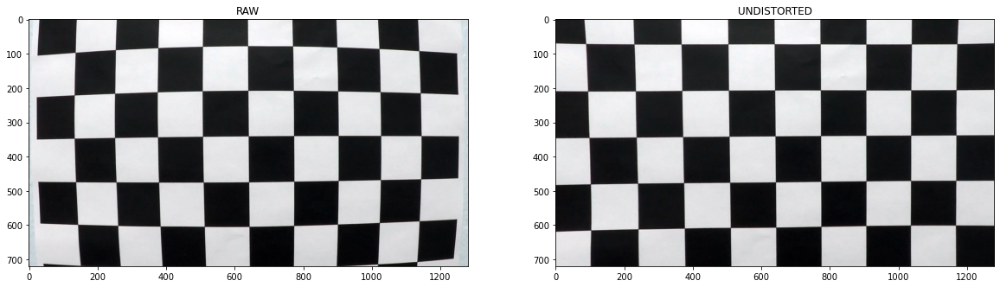

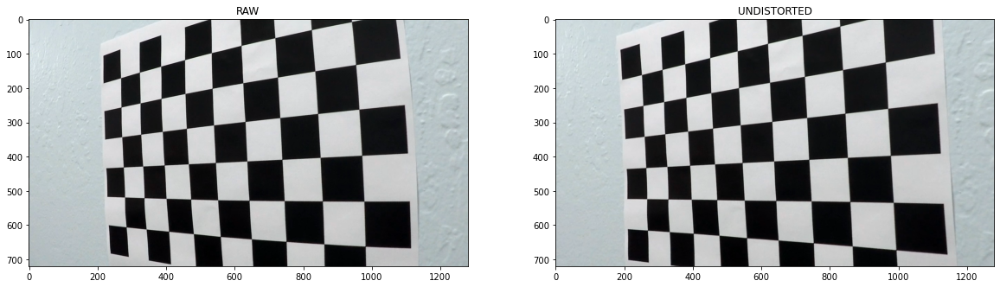

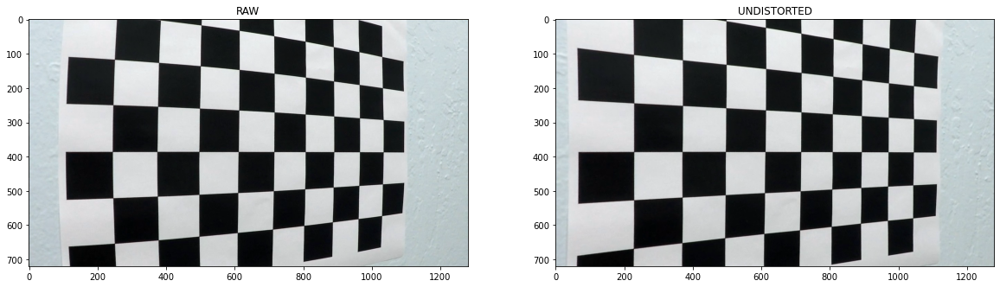

In [298]:
image_out = "output_images/"

#Check return matrix to find distorted images, undistort those images and save to an outut folder

for i in range (len(rets)):
    if rets[i] == False:
        img = cv2.imread(images[i])
        print("Distorted Image:",images[i])
        #undistort using above function
        undist = undistort_image(img, mtx, dist)
        cv2.imwrite("C:\\Users\\rohit\\Downloads\\Self_driving Car Engineer\\Lesson 6 Camera Calibration\\Project 2\\CarND-Advanced-Lane-Lines\\output_images\\" + "Undistort_Cal" + str(i) +".jpg",undist)
        #cv2.imwrite("...\\output_images\\" + "Undistort_Test_" + str(i) +".jpg",undist)
        f1, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.imshow(img)
        ax1.set_title('RAW')
        ax2.imshow(undist)
        ax2.set_title('UNDISTORTED')
        file_name = "C:\\Users\\rohit\\Downloads\\Self_driving Car Engineer\\Lesson 6 Camera Calibration\\Project 2\\CarND-Advanced-Lane-Lines\\output_images\\" + "Undistort_Cal_Combined" + str(i)+".jpg"
        plt.savefig(file_name)

In [299]:
#Make a list of test Imaghes in test_images folder and display number of images

In [300]:
images = os.listdir("../test_images/")
print("Number of Images:",len(images))

Number of Images: 8


In [301]:
#Undistort Test Images using previously determined camera calibration matrix and distortion co-effs

In [302]:
for fname in images:
    img = cv2.imread('../test_images/'+fname)
    undist = undistort_image(img, mtx, dist)
    cv2.imwrite("C:\\Users\\rohit\\Downloads\\Self_driving Car Engineer\\Lesson 6 Camera Calibration\\Project 2\\CarND-Advanced-Lane-Lines\\output_images\\" + "Undistorted_Test_" + fname + ".jpg",undist)
cv2.destroyAllWindows()

In [303]:
#Get Absolute Sobel along directions as specified

In [304]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,sobel_kernel)
    sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,sobel_kernel)
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    if orient == 'x':
        scaled_sobel = np.uint8(255*(abs_sobel_x/np.max(abs_sobel_x)))
    else:
        scaled_sobel = np.uint8(255*(abs_sobel_y/np.max(abs_sobel_y)))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>=thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

In [305]:
# Sobel Magnitude

In [306]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    magnitude_xy = (abs_sobel_x**2 + abs_sobel_y**2)**(1/2)
    scaled_magnitude = np.uint8(255*magnitude_xy/np.max(magnitude_xy))
    binary_output = np.zeros_like(magnitude_xy)
    binary_output [(scaled_magnitude > mag_thresh[0]) & (scaled_magnitude < mag_thresh[1])] = 1
    return binary_output

In [307]:
#Sobel Direction

In [308]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    gradient = np.arctan2(abs_sobel_y,abs_sobel_x)
    binary_output = np.zeros_like(gradient)
    binary_output[(gradient > thresh[0]) & (gradient < thresh[1])] = 1
    return binary_output

In [309]:
#HLS Conversion + THresholding to isolate lines

In [310]:
def hls_select(img, thresh=(0, 255)):

    hls_image = cv2.cvtColor(img,cv2.COLOR_BGR2HLS)
    s = hls_image[:,:,2]
    binary_output = np.zeros_like(s)
    binary_output[(s > thresh[0]) & (s <= thresh[1])] = 1 
    return binary_output

In [311]:
# Pass in a BGR image, detect edges using combined thresholding and return image with edge detected

In [312]:
def combined_threshold(img):
    
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel = 15, thresh_min=30, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel = 15, thresh_min=30, thresh_max=100)
    mag_binary = mag_thresh(img,sobel_kernel=15, mag_thresh=(70, 100))
    dir_binary = dir_threshold(img,sobel_kernel=15, thresh=(0.7, 1.3))
    hls_binary = hls_select(img, thresh=(170, 250))
    combined = np.zeros_like(hls_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    return combined

In [313]:
#Detect Edges for all images and display

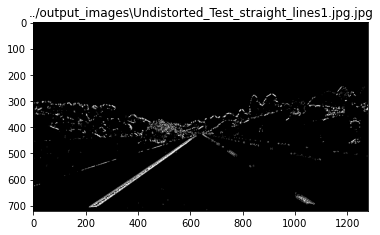

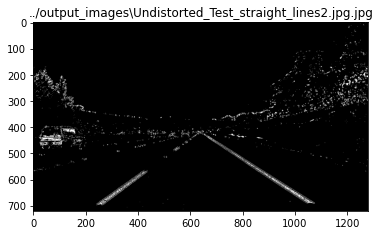

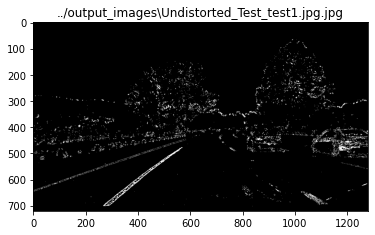

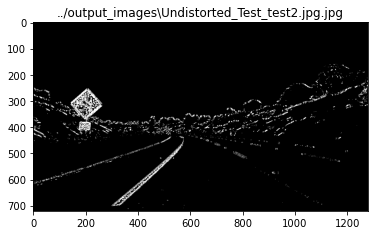

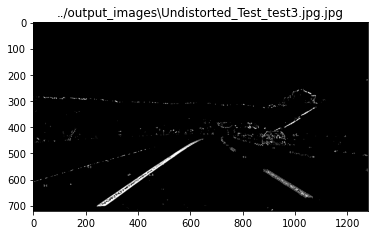

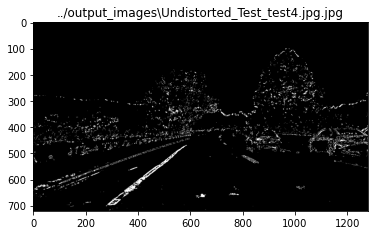

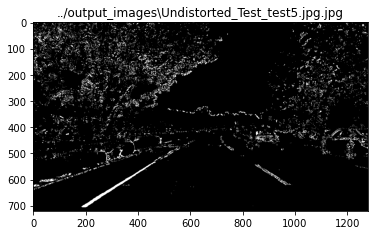

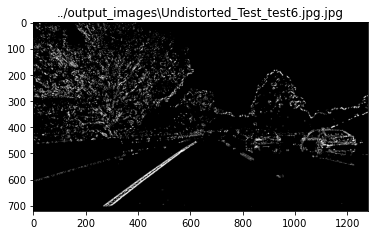

In [314]:
images = glob.glob('../output_images/Undistorted*.jpg')
for fname in images:
    #print("Current Image is: ",fname)
    image = cv2.imread(fname)
    combined = combined_threshold(image)
    f1 = plt.figure()
    plt.imshow(combined, cmap ='gray')
    plt.title(fname)

In [181]:
#Perspective Transform for birds-eye view by warping images after selecting points on original image and setting new points

In [315]:
def warp_image(img):
    
    height = image.shape[0]
    width = image.shape[1]
    #old points auto select
    s1 = [width // 2 - 76, height * 0.625]
    s2 = [width // 2 + 76, height * 0.625]
    s3 = [-100, height]
    s4 = [width + 100, height]
    #src = np.float32([s1, s2, s3, s4])
    d1 = [100, 0]
    d2 = [width - 100, 0]
    d3 = [100, height]
    d4 = [width - 100, height]
    #dst = np.float32([d1, d2, d3, d4])
    
    #Newer perspective points manual select
    left_upper_point  = [568,470]
    right_upper_point = [717,470]
    left_lower_point  = [260,680]
    right_lower_point = [1043,680]
    src = np.float32([left_upper_point, left_lower_point, right_upper_point, right_lower_point])
    dst = np.float32([[200,0], [200,680], [1000,0], [1000,680]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst,src)
    warped = cv2.warpPerspective(img, M, (width, height), flags=cv2.INTER_LINEAR)
    
    return warped, Minv, src, dst

In [316]:
#Run Perspective transform for all edge detected images and display

Current Image is:  ../output_images\Undistorted_Test_straight_lines1.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_straight_lines2.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test1.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test2.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test3.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test4.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test5.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test6.jpg.jpg


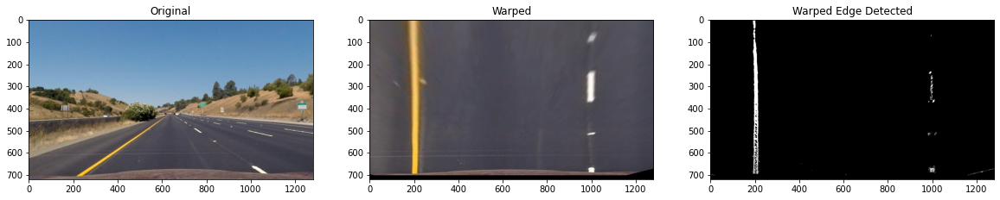

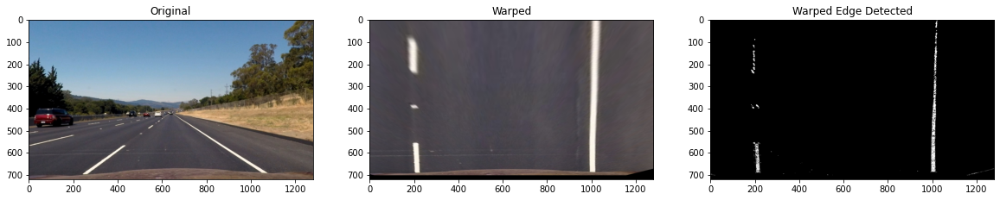

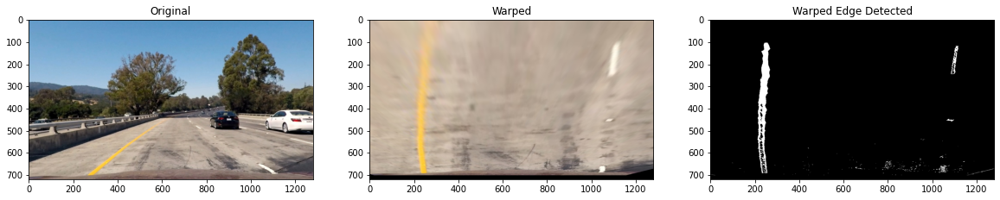

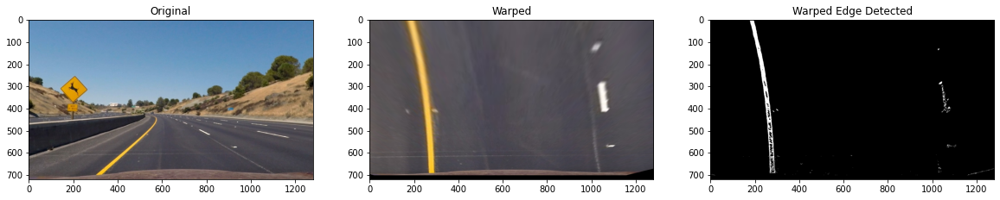

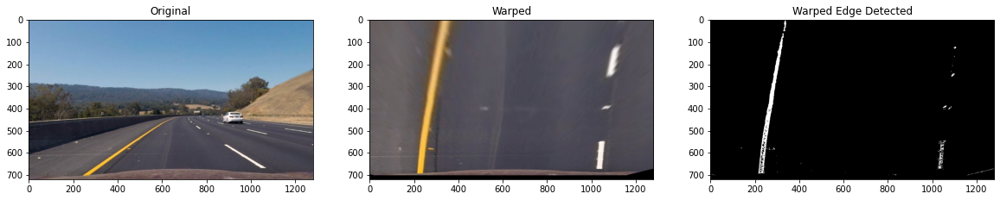

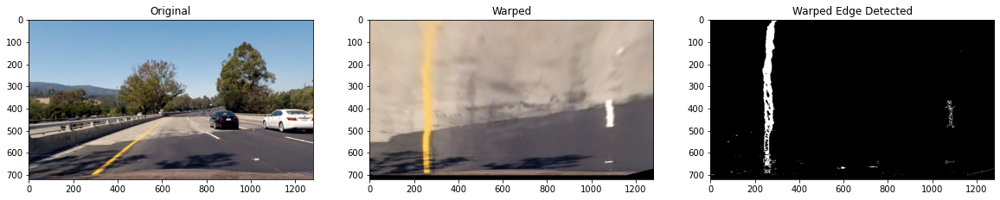

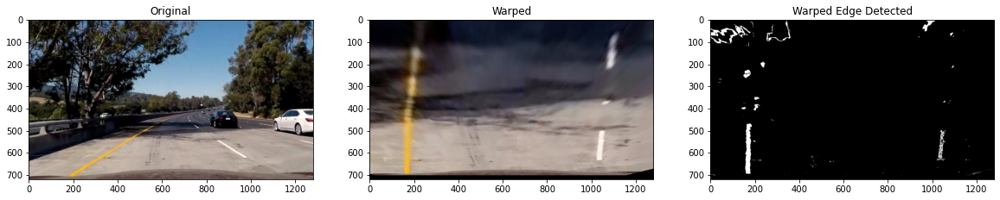

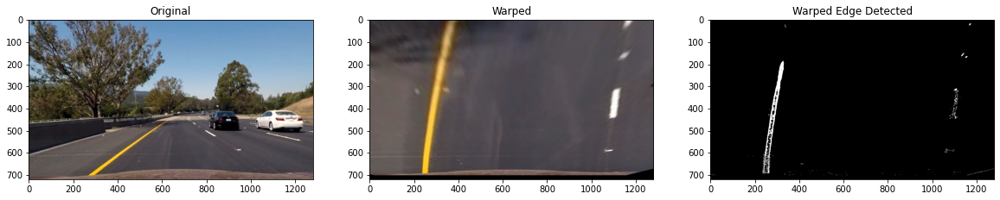

In [317]:
for fname in images:
    print("Current Image is: ",fname)
    image = cv2.imread(fname)
    #combined = combined_threshold(image)
    #warped,Minv,dsp_src,dsp_dst = warp_image(combined)
    warped,Minv,dsp_src,dsp_dst = warp_image(image)
    combined = combined_threshold(warped)
    f1, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(20, 10))
    ax1.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    ax1.set_title('Original')
    ax2.imshow(cv2.cvtColor(warped,cv2.COLOR_BGR2RGB))
    ax2.set_title('Warped')
    ax3.imshow(combined, cmap ='gray')
    ax3.set_title('Warped Edge Detected')

In [318]:
#Histogram of the lower half of image

In [319]:
def hist(img):
    
    img_x = img.shape[0]
    img_y = img.shape[1]
    bottom_half = img[img_x//2:,:]
    histogram = np.sum(bottom_half,axis=0)
    
    return histogram

In [320]:
# Get Histogram of warped image to detect start point of lane lines

Current Image is:  ../output_images\Undistorted_Test_straight_lines1.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_straight_lines2.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test1.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test2.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test3.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test4.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test5.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test6.jpg.jpg


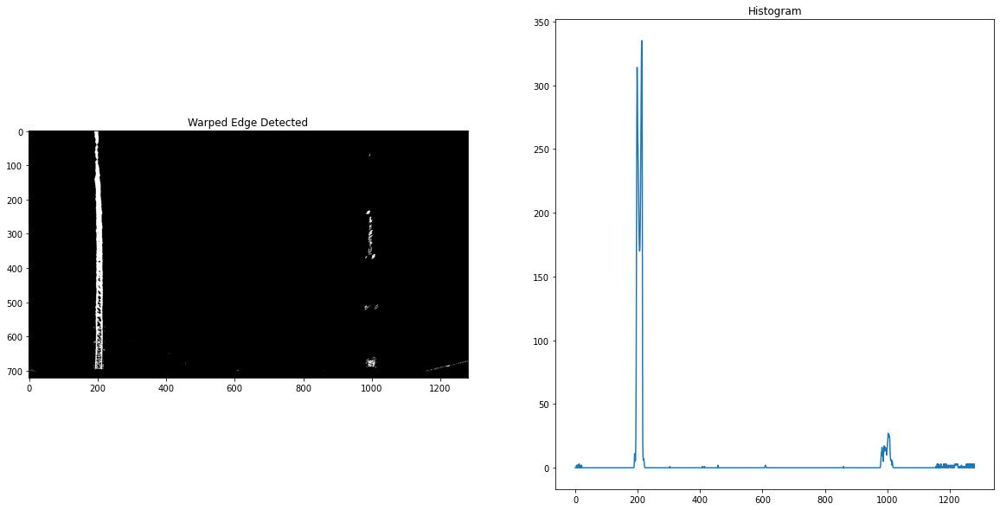

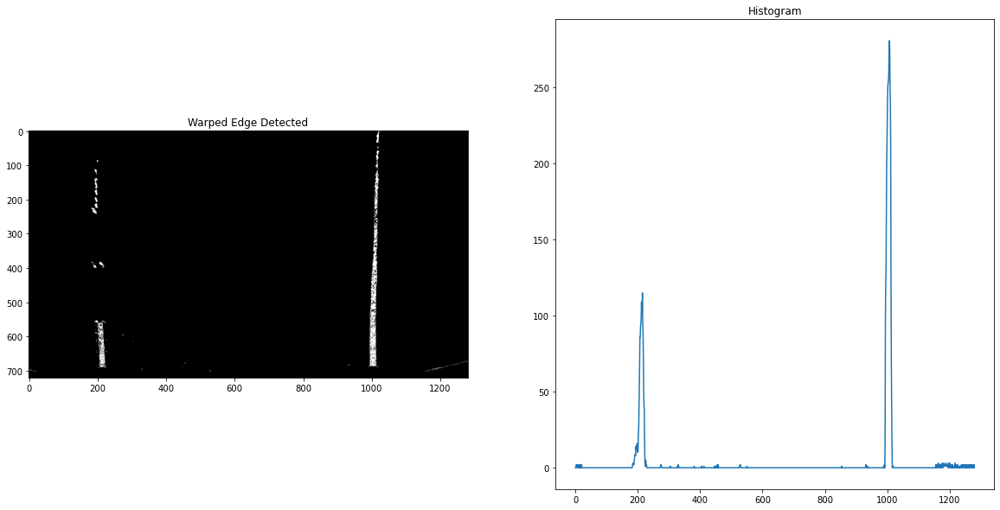

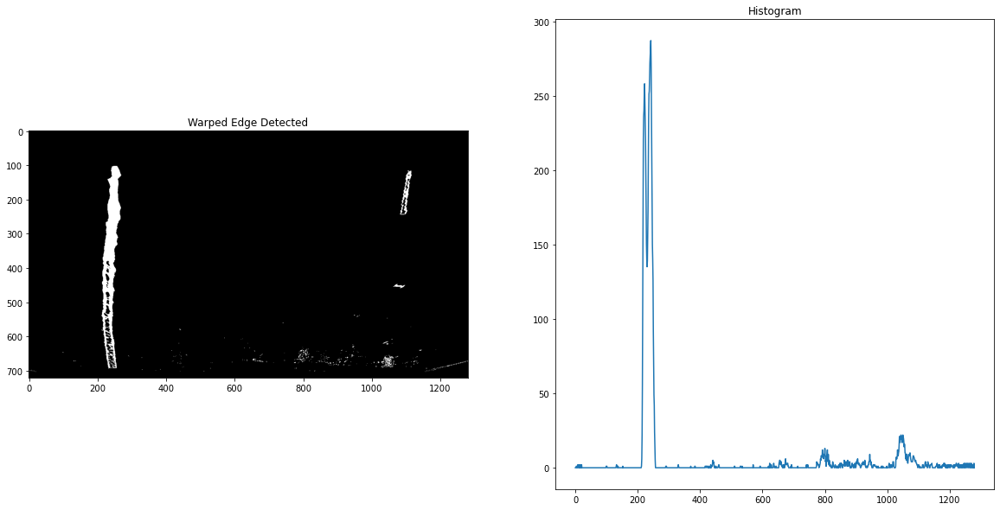

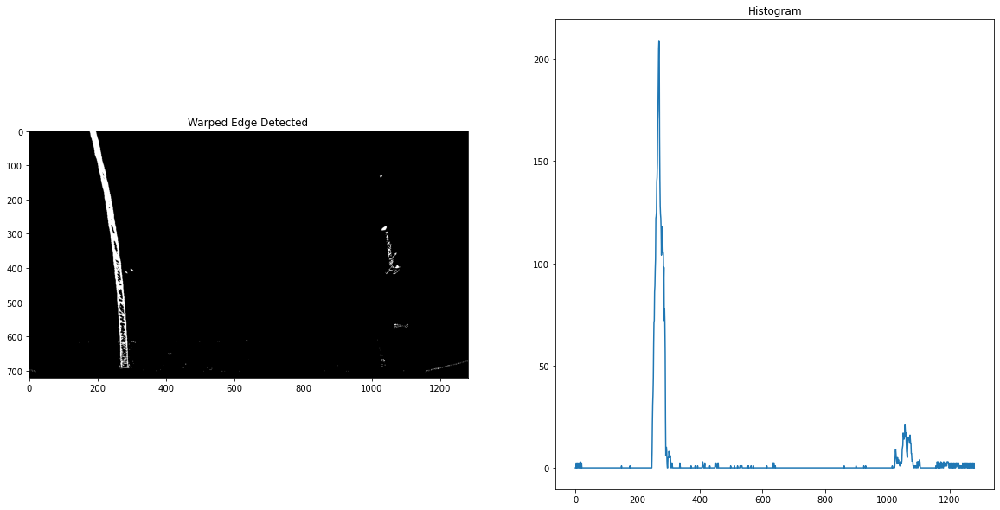

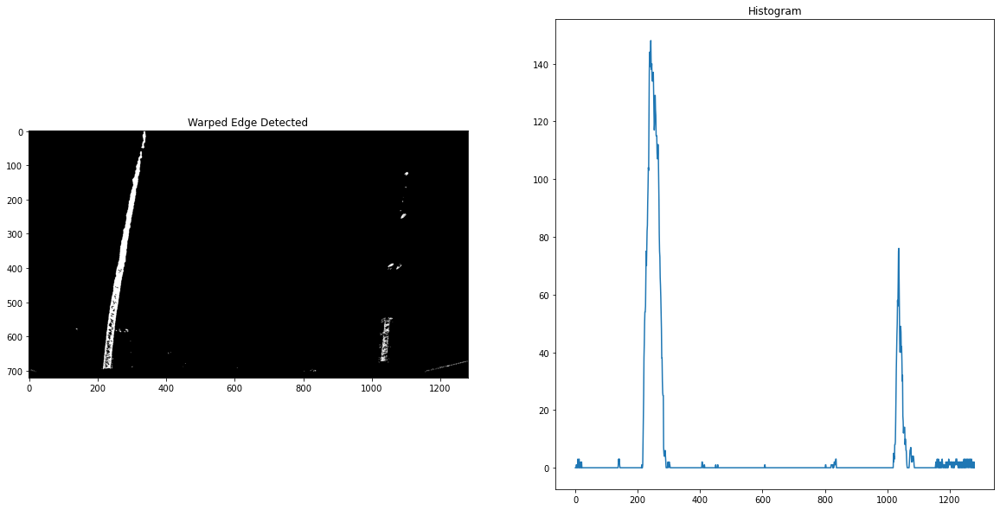

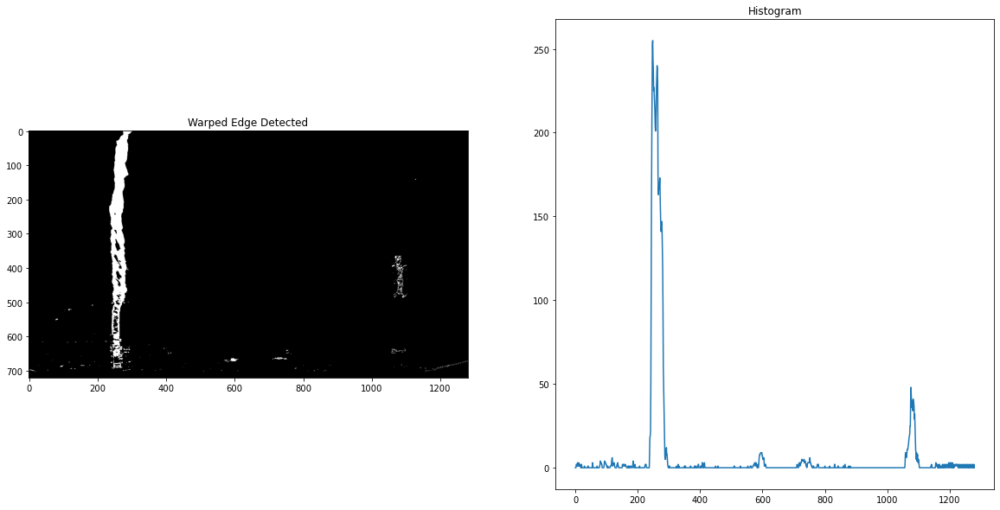

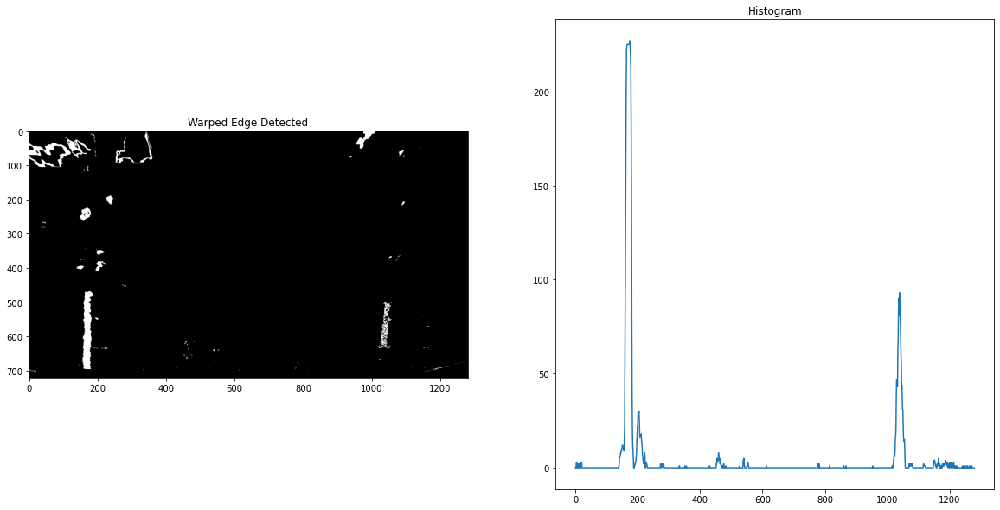

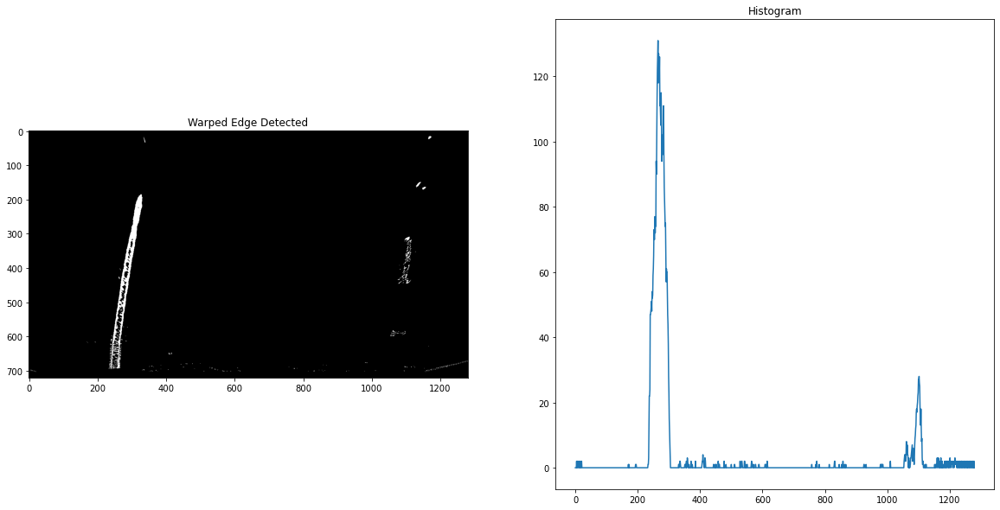

In [321]:
for fname in images:
    print("Current Image is: ",fname)
    image = cv2.imread(fname)
    #combined = combined_threshold(image)
    #warped,Minv,dsp_src,dsp_dst = warp_image(combined)
    warped,Minv,dsp_src,dsp_dst = warp_image(image)
    combined = combined_threshold(warped)
    #histogram = hist(warped)
    histogram = hist(combined)
    f1, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(combined, cmap ='gray')
    ax1.set_title('Warped Edge Detected')
    ax2.plot(histogram)
    ax2.set_title('Histogram')

In [159]:
#Sliding Windows to detect lane lines

In [325]:
def sliding_windows(binary_warped):
    
    # Take a histogram of the bottom half of the image
    histogram = hist(binary_warped)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 12
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        #print("Left Lane Center:",leftx_current,"Right Lane Center:",rightx_current)
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, out_img.astype(int)


In [326]:
#Run Sliding Windows to determine fit

Current Image is:  ../output_images\Undistorted_Test_straight_lines1.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_straight_lines2.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test1.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test2.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test3.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test4.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test5.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test6.jpg.jpg


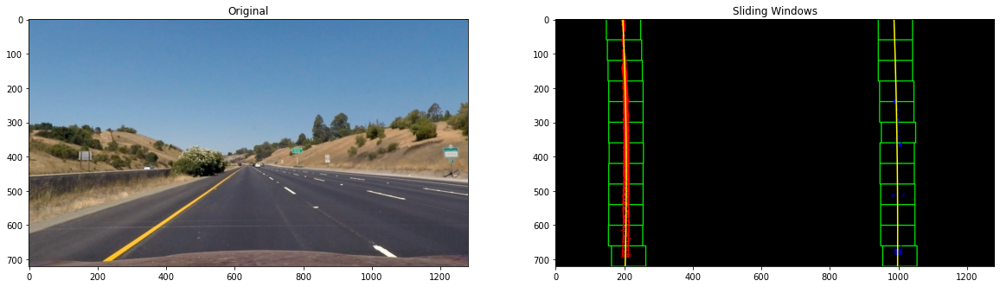

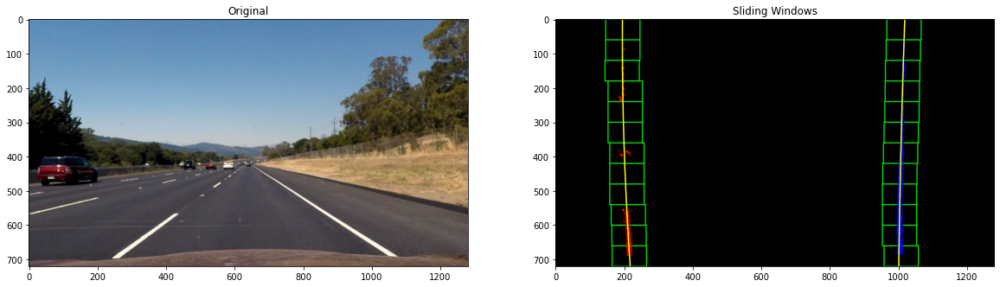

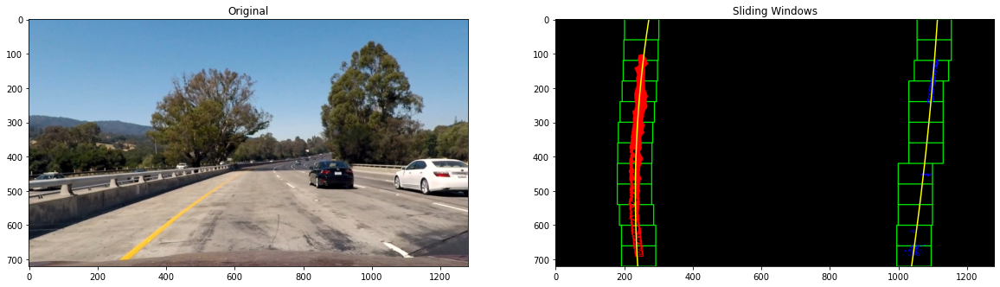

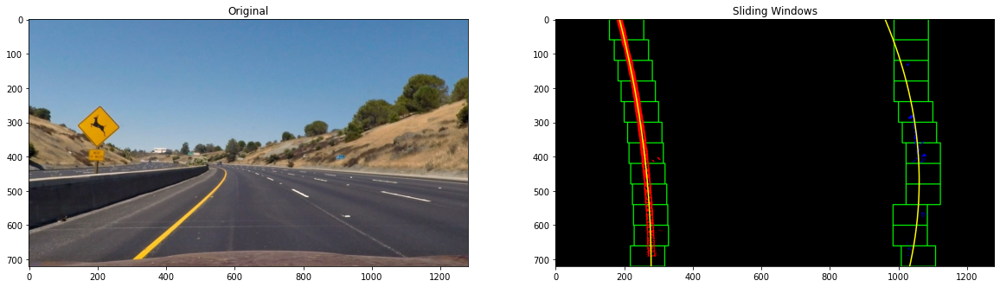

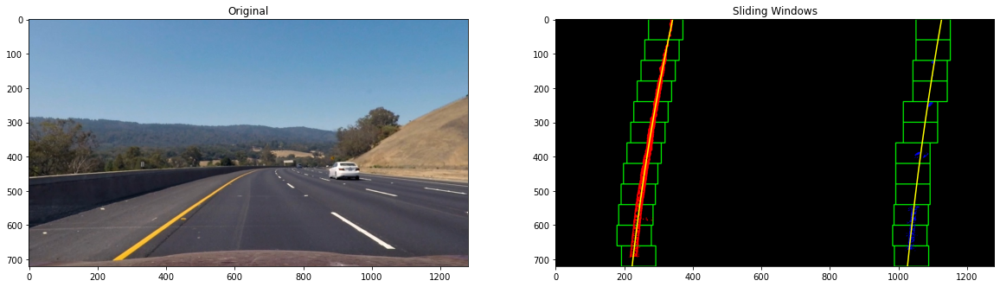

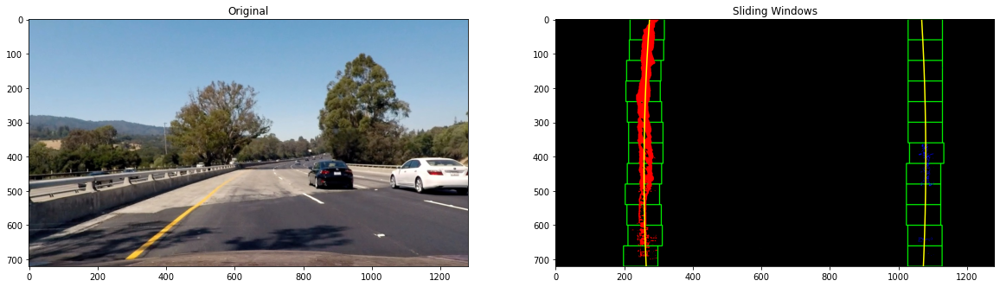

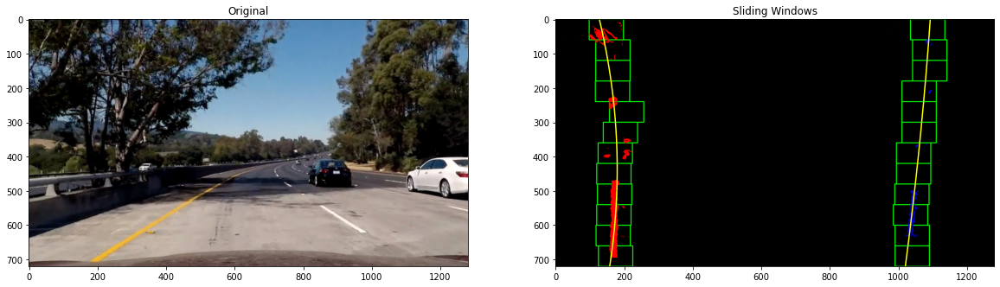

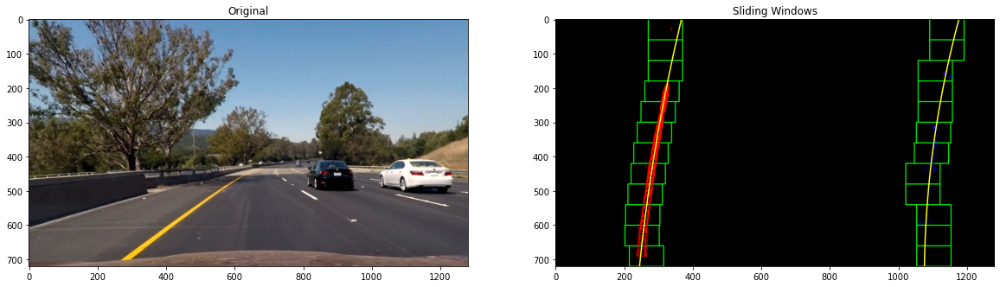

In [327]:
for fname in images:
    print("Current Image is: ",fname)
    image = cv2.imread(fname)
    #combined = combined_threshold(image)
    #warped,Minv,dsp_src,dsp_dst = warp_image(combined)
    warped,Minv,dsp_src,dsp_dst = warp_image(image)
    combined = combined_threshold(warped)
    #leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (warped)
    leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (combined)
    f1, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    ax1.set_title('Original')
    ax2.imshow(windows_image, cmap ='gray')
    ax2.set_title('Sliding Windows')
    ax2.plot(left_fitx, ploty, color='yellow')
    ax2.plot(right_fitx, ploty, color='yellow')
    

In [328]:
#Search around detected curves for a margin to find lines that match

In [329]:
def search_around_poly(binary_warped,left_fit,right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 50

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit_1 = np.polyfit(lefty,leftx,2)
    right_fit_1 = np.polyfit(righty,rightx,2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit_1[0]*ploty**2 + left_fit_1[1]*ploty + left_fit_1[2]
    right_fitx = right_fit_1[0]*ploty**2 + right_fit_1[1]*ploty + right_fit_1[2]
        
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result.astype(int),left_fitx, right_fitx, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty, left_fit_1, right_fit_1

In [330]:
#Run Search around Previous fit for all images

Current Image is:  ../output_images\Undistorted_Test_straight_lines1.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_straight_lines2.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test1.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test2.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test3.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test4.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test5.jpg.jpg
Current Image is:  ../output_images\Undistorted_Test_test6.jpg.jpg


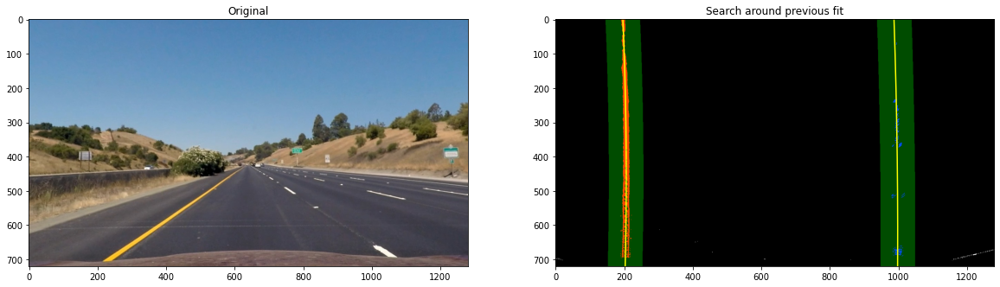

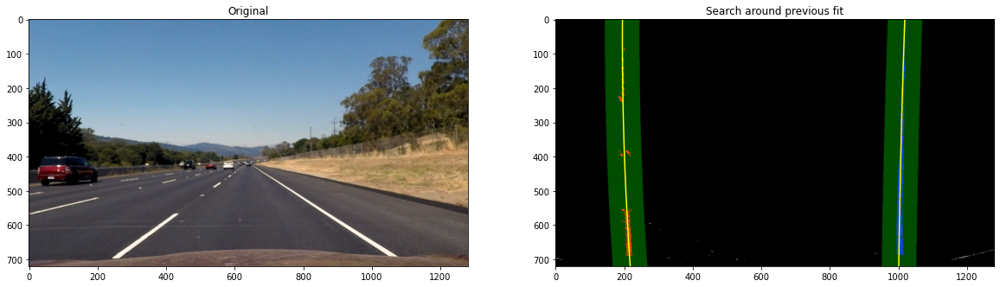

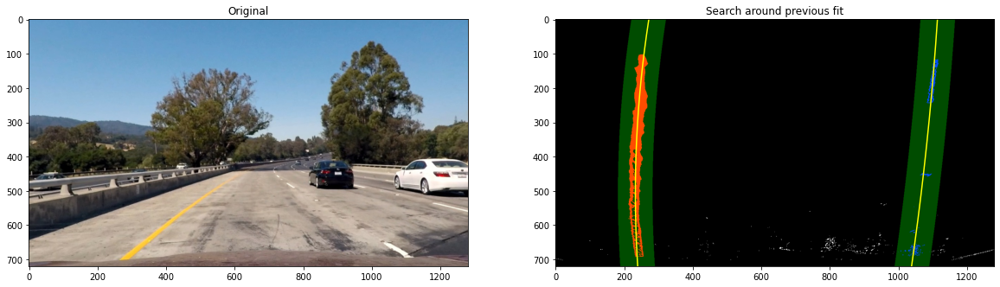

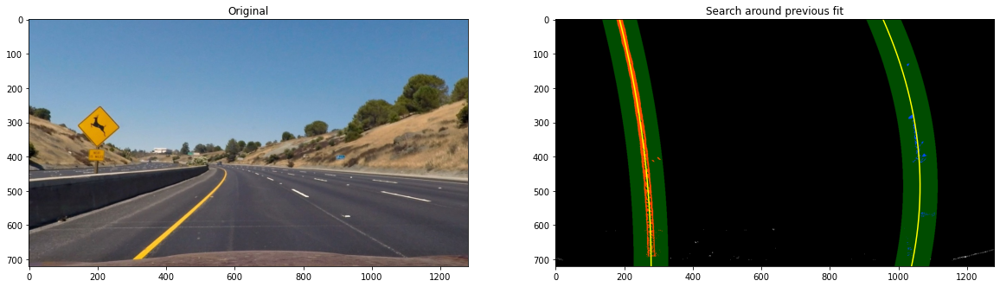

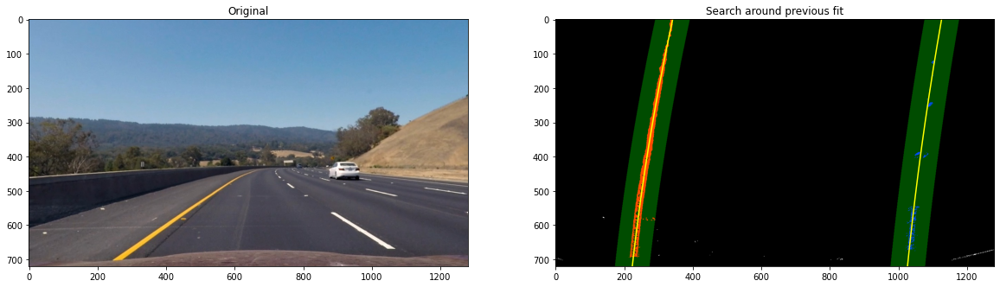

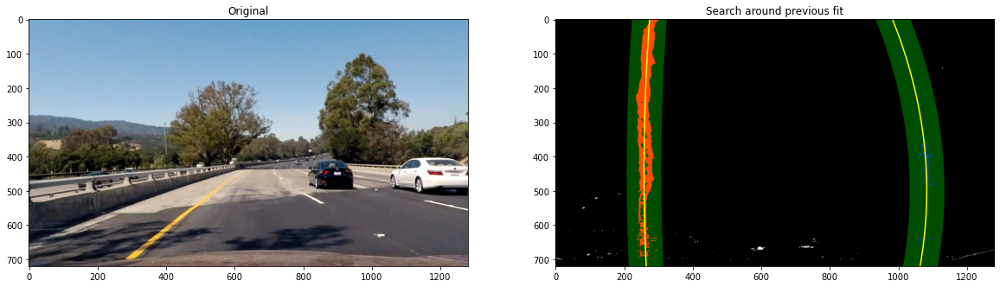

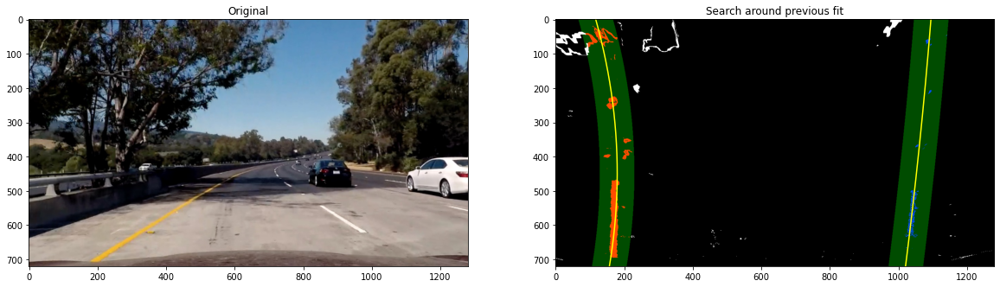

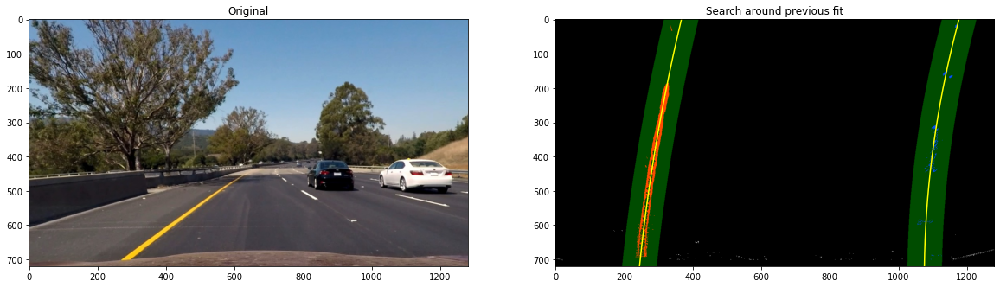

In [331]:
for fname in images:
    print("Current Image is: ",fname)
    image = cv2.imread(fname)
    #combined = combined_threshold(image)
    #warped,Minv,dsp_src,dsp_dst = warp_image(combined)
    warped,Minv,dsp_src,dsp_dst = warp_image(image)
    combined = combined_threshold(warped)
    #leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (warped)
    #searched_image,left_fitx_1, right_fitx_1, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty_1, left_fit_1, right_fit_1 = search_around_poly(warped,left_fit,right_fit)
    leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (combined)
    searched_image,left_fitx_1, right_fitx_1, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty_1, left_fit_1, right_fit_1 = search_around_poly(combined,left_fit,right_fit)
    f1, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    ax1.set_title('Original')
    ax2.imshow(searched_image, cmap ='gray')
    ax2.set_title('Search around previous fit')
    ax2.plot(left_fitx_1, ploty_1, color='yellow')
    ax2.plot(right_fitx_1, ploty_1, color='yellow')
    

In [332]:
# Measure Curvature from determined lanes

In [333]:
def measure_curvature_real(binary_warped,left_fit, right_fit, left_lane_inds, right_lane_inds):
    
    #ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/800 # meters per pixel in x dimension
    ym_per_pix = 30/720 # meters per pixel in y dimension
    #xm_per_pix = 3.7/700 # meters per pixel in x dimension
    h = binary_warped.shape[0]
    ploty = np.linspace(0, h -1, num = h)# to cover same y-range as image
                  
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
     # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Define y-value where we want radius of curvature: choose the maximum y-value/ the bottom of the image
    y_eval = np.max(ploty)*ym_per_pix
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if right_fit is not None and left_fit is not None:
        car_position = binary_warped.shape[1]/2
        l_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        r_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix 
    
    return left_curverad, right_curverad, center_dist

In [334]:
#Draw Lanes and Write stats and unwarp image to original persepctive

In [335]:
def draw_lanes(original_img, binary_warped, left_fit, right_fit, Minv, leftcurvead, righcurvead,center_offset):
    new_img = np.copy(original_img)
    if left_fit is None or right_fit is None:
        return original_img
    # Create an image to draw the lines on
    warped_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warped_zero, warped_zero, warped_zero))
    
    h,w = binary_warped.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly() borrowed
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    new_warped = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, new_warped, 0.5, 0)
    curve_radius = (leftcurvead + righcurvead)/2
    #Write stats for curve
    font = cv2.FONT_HERSHEY_DUPLEX
    #text = 'Left Curve radius: ' + '{:04.1f}'.format(leftcurvead) + 'm' + 'Right Curve radius: ' + '{:04.1f}'.format(righcurvead) + 'm'
    text = 'Curve radius: ' + '{:04.1f}'.format(curve_radius) + 'm'
    cv2.putText(result, text, (50,50), font, 1, (200,200,250), 1, cv2.LINE_AA)
    direction = ''
    if center_offset > 0:
        direction = 'right'
    elif center_offset < 0:
        direction = 'left'
    abs_center_offset = abs(center_offset)
    text = '{:04.3f}'.format(abs_center_offset) + 'm ' + direction + ' of center'
    cv2.putText(result, text, (50,100), font, 1, (200,200,250), 1, cv2.LINE_AA)
    
    return result

In [336]:
#Run curvature detection for all images, unwarp and save output

Current Image is:  ../output_images\Undistorted_Test_straight_lines1.jpg.jpg
Left curve Radius is: 3995.8119262906807  m Right curve Radius is: 6884.454892288281  m
Distance from Center: 0.18348550592735458 m
Lane Width is: 3.6537500000000005  m
Current Image is:  ../output_images\Undistorted_Test_straight_lines2.jpg.jpg
Left curve Radius is: 3575.95891048561  m Right curve Radius is: 13071.513821428165  m
Distance from Center: 0.1418296892101676 m
Lane Width is: 3.6630000000000007  m
Current Image is:  ../output_images\Undistorted_Test_test1.jpg.jpg
Left curve Radius is: 1232.3508726621835  m Right curve Radius is: 3526.5393603589173  m
Distance from Center: 0.00473722341315191 m
Lane Width is: 3.7092500000000004  m
Current Image is:  ../output_images\Undistorted_Test_test2.jpg.jpg
Left curve Radius is: 1069.3807962160263  m Right curve Radius is: 413.1017651294679  m
Distance from Center: -0.08529323372986312 m
Lane Width is: 3.6491250000000006  m
Current Image is:  ../output_images\

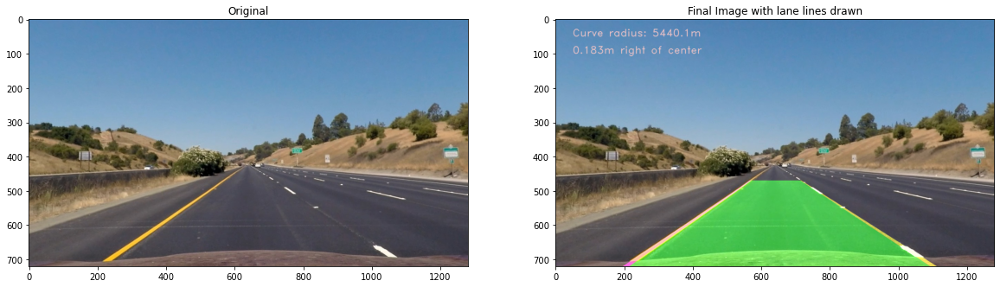

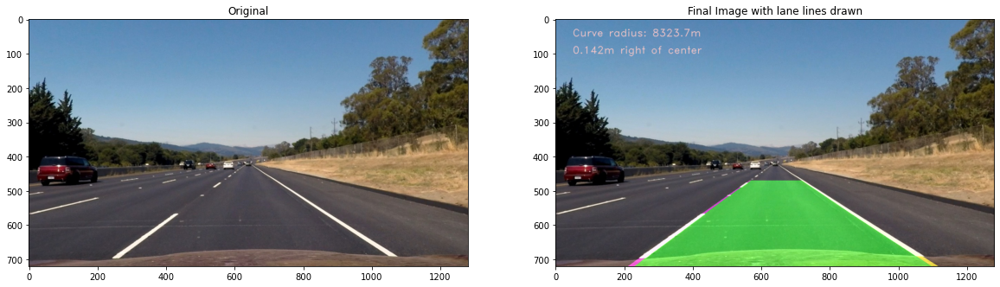

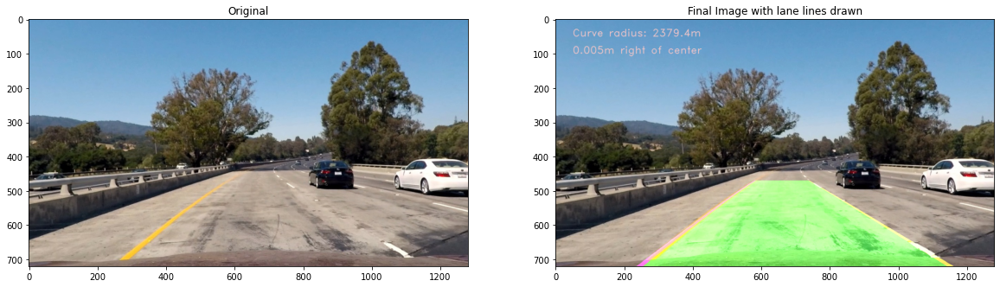

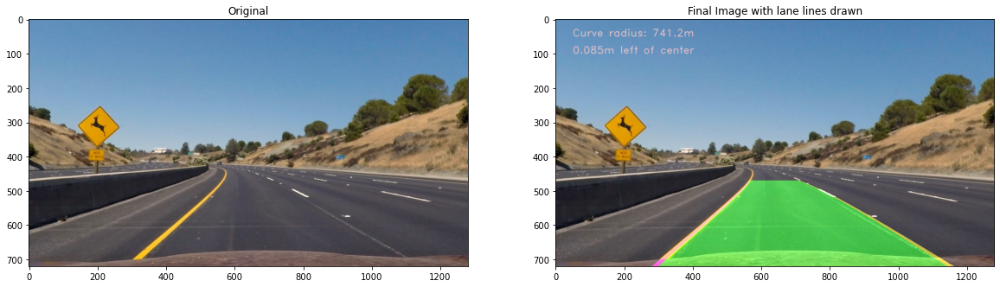

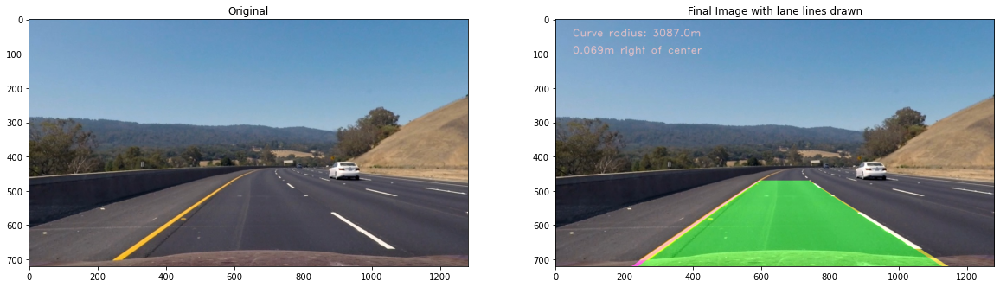

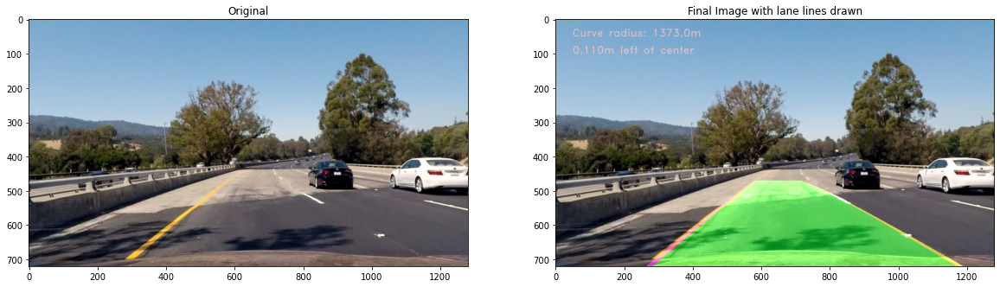

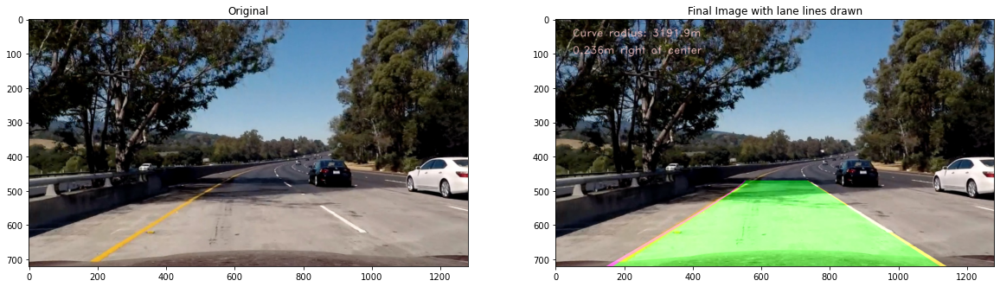

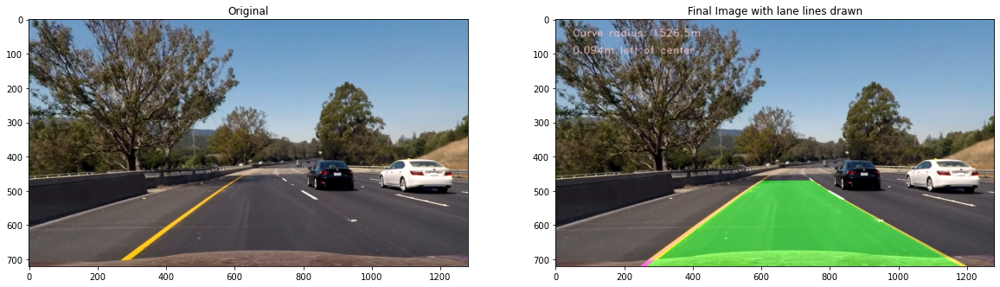

In [338]:
i = 0
for fname in images:
    print("Current Image is: ",fname)
    image = cv2.imread(fname)
    #combined = combined_threshold(image)
    #warped,Minv,dsp_src,dsp_dst = warp_image(combined)
    #leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (warped)
    #searched_image,left_fitx_1, right_fitx_1, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty_1, left_fit_1, right_fit_1 = search_around_poly(warped,left_fit,right_fit)
    #left_curverad, right_curverad, center_dist = measure_curvature_real(warped,left_fit_1, right_fit_1, left_lane_inds, right_lane_inds)
    #final_img = draw_lanes(image, warped, left_fit_1, right_fit_1, Minv, left_curverad, right_curverad,center_dist)
    warped,Minv,dsp_src,dsp_dst = warp_image(image)
    combined = combined_threshold(warped)
    leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (combined)
    searched_image,left_fitx_1, right_fitx_1, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty_1, left_fit_1, right_fit_1 = search_around_poly(combined,left_fit,right_fit)
    left_curverad, right_curverad, center_dist = measure_curvature_real(combined,left_fit_1, right_fit_1, left_lane_inds, right_lane_inds)
    final_img = draw_lanes(image, combined, left_fit_1, right_fit_1, Minv, left_curverad, right_curverad,center_dist)
    width_m = (rightx_base-leftx_base)*(3.7/800)
    print("Left curve Radius is:",left_curverad," m","Right curve Radius is:",right_curverad," m")
    print("Distance from Center:",center_dist,"m")
    print("Lane Width is:",width_m," m")
    
    f1, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    ax1.set_title('Original')
    ax2.imshow(cv2.cvtColor(final_img,cv2.COLOR_BGR2RGB))
    ax2.set_title('Final Image with lane lines drawn')
    cv2.imshow('Lanes Projected'+ fname,final_img)
    cv2.waitKey(500)
    cv2.destroyAllWindows()
    
    cv2.imwrite("C:\\Users\\rohit\\Downloads\\Self_driving Car Engineer\\Lesson 6 Camera Calibration\\Project 2\\CarND-Advanced-Lane-Lines\\output_images\\" + "Sorted_Test_" + str(i) + ".jpg",final_img)
    i = i + 1

In [339]:
#Define Image Pipeline that uses an image that is passed in, saves(optional since I've already saved images above) 
#and returns a processed image

In [347]:
def pipeline(actual_image):
    
    undist = undistort_image(actual_image, mtx, dist)
    #combined = combined_threshold(undist)
    #warped,Minv,dsp_src,dsp_dst = warp_image(combined)
    #leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (warped)
    #searched_image,left_fitx_1, right_fitx_1, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty_1, left_fit_1, right_fit_1 = search_around_poly(warped,left_fit,right_fit)
    #left_curverad, right_curverad, center_dist = measure_curvature_real(warped,left_fit_1, right_fit_1, left_lane_inds, right_lane_inds)
    #final_img = draw_lanes(actual_image, warped, left_fit_1, right_fit_1, Minv, left_curverad, right_curverad,center_dist)
    warped,Minv,dsp_src,dsp_dst = warp_image(undist)
    combined = combined_threshold(warped)
    leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (combined)
    width_m = (rightx_base - leftx_base)*3.7/800
    searched_image,left_fitx_1, right_fitx_1, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty_1, left_fit_1, right_fit_1 = search_around_poly(combined,left_fit,right_fit)
    left_curverad, right_curverad, center_dist = measure_curvature_real(combined,left_fit_1, right_fit_1, left_lane_inds, right_lane_inds)
    final_img = draw_lanes(undist, combined, left_fit_1, right_fit_1, Minv, left_curverad, right_curverad,center_dist)
    print("Left Curve is:",left_curverad,"m")
    print("Right curve is:",right_curverad,"m")
    print("Lane Length is",width_m,"m")
    
    times = time.time()
    file_name = datetime.datetime.fromtimestamp(times).strftime('%Y%m%d %H%M%S')
    #cv2.imshow('Final IMG',final_img)
    #cv2.waitKey(500)
    #cv2.imwrite("C:\\Users\\rohit\\Downloads\\Self_driving Car Engineer\\Lesson 6 Camera Calibration\\Project 2\\CarND-Advanced-Lane-Lines\\output_images\\" + str(file_name) + ".jpg",final_img)
    cv2.destroyAllWindows()
    
    return final_img

In [348]:
#Run on all images in the folder with distorted images

In [349]:
images = os.listdir("../test_images/")
print("Number of Images:",len(images))

Number of Images: 8


In [346]:
for fname in images:
    print("Current Image is: ",fname)
    image = cv2.imread('../test_images/'+fname)
    final_img = pipeline(image)
    #cv2.imshow('Final IMG', final_img)
    #cv2.waitKey(500)
cv2.destroyAllWindows()

Current Image is:  straight_lines1.jpg
Left Curve is: 3996.3774093156067 m
Right curve is: 5464.531046954629 m
Lane Length is 3.6630000000000003 m
Current Image is:  straight_lines2.jpg
Left Curve is: 3611.545703107317 m
Right curve is: 12094.049138869597 m
Lane Length is 3.6630000000000003 m
Current Image is:  test1.jpg
Left Curve is: 1218.9890256981755 m
Right curve is: 4379.779416016185 m
Lane Length is 3.7185 m
Current Image is:  test2.jpg
Left Curve is: 1080.4912905988888 m
Right curve is: 421.06709128705853 m
Lane Length is 3.6260000000000003 m
Current Image is:  test3.jpg
Left Curve is: 2512.130185521595 m
Right curve is: 3470.2842606898994 m
Lane Length is 3.6815 m
Current Image is:  test4.jpg
Left Curve is: 2100.183658589059 m
Right curve is: 510.06386812176083 m
Lane Length is 3.8665000000000003 m
Current Image is:  test5.jpg
Left Curve is: 598.4045612919829 m
Right curve is: 4771.76388056404 m
Lane Length is 3.9821250000000004 m
Current Image is:  test6.jpg
Left Curve is: 21

In [278]:
#Run on Project Video

In [350]:
cv2.destroyAllWindows()
project_output = '../output_images/project_video_output_Fail.mp4'

#clip1 = VideoFileClip('../project_video.mp4')

#subclip for faster processing of region of interest where distortion is seen
clip1 = VideoFileClip('../project_video.mp4').subclip(40,42)
project_clip = clip1.fl_image(pipeline)
%time project_clip.write_videofile(project_output, audio=False)


                                                            
t:  28%|██▊       | 337/1199 [45:39<04:16,  3.36it/s, now=None]
                                                            
t:   0%|          | 0/50 [00:00<?, ?it/s, now=None]s, now=None]

Left Curve is: 1016.8045283112152 m
Right curve is: 14663.4048621609 m
Lane Length is 3.7555 m
Moviepy - Building video ../output_images/project_video_output_Fail.mp4.
Moviepy - Writing video ../output_images/project_video_output_Fail.mp4



t:   4%|▍         | 2/50 [00:00<00:08,  5.73it/s, now=None]

Left Curve is: 1016.8045283112152 m
Right curve is: 14663.4048621609 m
Lane Length is 3.7555 m


t:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s, now=None]

Left Curve is: 1369.277104766569 m
Right curve is: 7756.526091063426 m
Lane Length is 3.908125 m


t:   8%|▊         | 4/50 [00:01<00:12,  3.83it/s, now=None]

Left Curve is: 1778.523552886544 m
Right curve is: 8576.88929442718 m
Lane Length is 3.8665000000000003 m


t:  10%|█         | 5/50 [00:01<00:12,  3.63it/s, now=None]

Left Curve is: 2030.6972803336948 m
Right curve is: 1363.1704137983734 m
Lane Length is 4.1301250000000005 m


t:  12%|█▏        | 6/50 [00:01<00:12,  3.46it/s, now=None]

Left Curve is: 1550.8972170601166 m
Right curve is: 431.0084745567365 m
Lane Length is 4.2735 m


t:  14%|█▍        | 7/50 [00:01<00:12,  3.41it/s, now=None]

Left Curve is: 2180.8171022541533 m
Right curve is: 782.2733738182652 m
Lane Length is 4.014500000000001 m


t:  16%|█▌        | 8/50 [00:02<00:12,  3.25it/s, now=None]

Left Curve is: 1989.4018443282553 m
Right curve is: 186.08429857698388 m
Lane Length is 4.009875 m


t:  18%|█▊        | 9/50 [00:02<00:12,  3.24it/s, now=None]

Left Curve is: 1401.647972227878 m
Right curve is: 574.913495741321 m
Lane Length is 3.9173750000000003 m


t:  20%|██        | 10/50 [00:02<00:12,  3.29it/s, now=None]

Left Curve is: 1289.582642409889 m
Right curve is: 571.0068998668728 m
Lane Length is 3.9127500000000004 m


t:  22%|██▏       | 11/50 [00:03<00:12,  3.22it/s, now=None]

Left Curve is: 1610.8967761384067 m
Right curve is: 990.46063389466 m
Lane Length is 3.9358750000000002 m


t:  24%|██▍       | 12/50 [00:03<00:11,  3.31it/s, now=None]

Left Curve is: 1391.0808239383778 m
Right curve is: 981.5924865204522 m
Lane Length is 3.9035 m


t:  26%|██▌       | 13/50 [00:03<00:11,  3.31it/s, now=None]

Left Curve is: 39416.84171284879 m
Right curve is: 1213.2191269930522 m
Lane Length is 3.9867500000000002 m


t:  28%|██▊       | 14/50 [00:04<00:10,  3.41it/s, now=None]

Left Curve is: 12302.16276508938 m
Right curve is: 1316.5311161185703 m
Lane Length is 3.963625 m


t:  30%|███       | 15/50 [00:04<00:10,  3.41it/s, now=None]

Left Curve is: 21983.3056584201 m
Right curve is: 863.8953398968071 m
Lane Length is 3.9960000000000004 m


t:  32%|███▏      | 16/50 [00:04<00:09,  3.49it/s, now=None]

Left Curve is: 18214.225666444487 m
Right curve is: 852.1040374670687 m
Lane Length is 3.9775 m


t:  34%|███▍      | 17/50 [00:04<00:09,  3.55it/s, now=None]

Left Curve is: 5012.585669867068 m
Right curve is: 193.5618208592345 m
Lane Length is 4.1255 m


t:  36%|███▌      | 18/50 [00:05<00:09,  3.47it/s, now=None]

Left Curve is: 5744.174710297674 m
Right curve is: 374.029783705782 m
Lane Length is 4.07925 m


t:  38%|███▊      | 19/50 [00:05<00:08,  3.50it/s, now=None]

Left Curve is: 2777.9361216927646 m
Right curve is: 2019.662761036842 m
Lane Length is 4.046875 m


t:  40%|████      | 20/50 [00:05<00:08,  3.44it/s, now=None]

Left Curve is: 2764.6474926063493 m
Right curve is: 2252.999964756978 m
Lane Length is 4.04225 m


t:  42%|████▏     | 21/50 [00:06<00:08,  3.40it/s, now=None]

Left Curve is: 2894.265500914087 m
Right curve is: 489.47147182558155 m
Lane Length is 4.056125 m


t:  44%|████▍     | 22/50 [00:06<00:08,  3.40it/s, now=None]

Left Curve is: 1765.927138735563 m
Right curve is: 1596.0773760190527 m
Lane Length is 3.954375 m


t:  46%|████▌     | 23/50 [00:06<00:07,  3.45it/s, now=None]

Left Curve is: 1757.2518360454842 m
Right curve is: 2011.3325799045879 m
Lane Length is 4.014500000000001 m


t:  48%|████▊     | 24/50 [00:06<00:07,  3.47it/s, now=None]

Left Curve is: 2854.220242415362 m
Right curve is: 2632.0632786451224 m
Lane Length is 4.037625 m


t:  50%|█████     | 25/50 [00:07<00:07,  3.57it/s, now=None]

Left Curve is: 1954.2700319920746 m
Right curve is: 3090.4906160193127 m
Lane Length is 4.037625 m


t:  52%|█████▏    | 26/50 [00:07<00:06,  3.64it/s, now=None]

Left Curve is: 2410.496908647391 m
Right curve is: 4353.032429176633 m
Lane Length is 4.0283750000000005 m


t:  54%|█████▍    | 27/50 [00:07<00:06,  3.61it/s, now=None]

Left Curve is: 817.5297157218067 m
Right curve is: 2902.7031472774042 m
Lane Length is 4.02375 m


t:  56%|█████▌    | 28/50 [00:08<00:06,  3.63it/s, now=None]

Left Curve is: 572.3592575883533 m
Right curve is: 331.1963463895714 m
Lane Length is 4.051500000000001 m


t:  58%|█████▊    | 29/50 [00:08<00:05,  3.69it/s, now=None]

Left Curve is: 457.789671204811 m
Right curve is: 951.3444160174099 m
Lane Length is 4.037625 m


t:  60%|██████    | 30/50 [00:08<00:05,  3.69it/s, now=None]

Left Curve is: 710.2719021662828 m
Right curve is: 1115.975816642224 m
Lane Length is 4.000625 m


t:  62%|██████▏   | 31/50 [00:08<00:05,  3.56it/s, now=None]

Left Curve is: 1824.2257331180651 m
Right curve is: 1109.4365817574653 m
Lane Length is 4.009875 m


t:  64%|██████▍   | 32/50 [00:09<00:05,  3.49it/s, now=None]

Left Curve is: 1149.176513051208 m
Right curve is: 1150.7344910171407 m
Lane Length is 3.9821250000000004 m


t:  66%|██████▌   | 33/50 [00:09<00:04,  3.46it/s, now=None]

Left Curve is: 554.4418102738873 m
Right curve is: 3138.1386642722214 m
Lane Length is 3.972875 m


t:  68%|██████▊   | 34/50 [00:09<00:04,  3.38it/s, now=None]

Left Curve is: 554.086007874511 m
Right curve is: 3999.0439495144146 m
Lane Length is 4.014500000000001 m


t:  70%|███████   | 35/50 [00:10<00:04,  3.33it/s, now=None]

Left Curve is: 395.3759211248364 m
Right curve is: 10226.547909556857 m
Lane Length is 3.9451250000000004 m


t:  72%|███████▏  | 36/50 [00:10<00:04,  3.12it/s, now=None]

Left Curve is: 658.9841231631929 m
Right curve is: 21862.3325140243 m
Lane Length is 3.9220000000000006 m


t:  74%|███████▍  | 37/50 [00:10<00:04,  3.08it/s, now=None]

Left Curve is: 1004.4327922526088 m
Right curve is: 1606.0345362080457 m
Lane Length is 3.8896250000000006 m


t:  76%|███████▌  | 38/50 [00:11<00:04,  2.91it/s, now=None]

Left Curve is: 1734.4104755488231 m
Right curve is: 1205.9109145249645 m
Lane Length is 3.926625 m


t:  78%|███████▊  | 39/50 [00:11<00:03,  2.96it/s, now=None]

Left Curve is: 549.4634063156176 m
Right curve is: 393.86307567318016 m
Lane Length is 4.019125 m


t:  80%|████████  | 40/50 [00:11<00:03,  3.06it/s, now=None]

Left Curve is: 959.0861664328604 m
Right curve is: 463.0897074951005 m
Lane Length is 4.329000000000001 m


t:  82%|████████▏ | 41/50 [00:12<00:02,  3.04it/s, now=None]

Left Curve is: 2421.304717211973 m
Right curve is: 2238.094091750607 m
Lane Length is 3.103375 m


t:  84%|████████▍ | 42/50 [00:12<00:02,  3.09it/s, now=None]

Left Curve is: 1156.3467989520477 m
Right curve is: 424.14207146196844 m
Lane Length is 3.2190000000000003 m


t:  86%|████████▌ | 43/50 [00:12<00:02,  3.21it/s, now=None]

Left Curve is: 600.1079477752387 m
Right curve is: 249.64761316770634 m
Lane Length is 3.515 m


t:  88%|████████▊ | 44/50 [00:13<00:01,  3.15it/s, now=None]

Left Curve is: 229.66202114085084 m
Right curve is: 244.16986989895167 m
Lane Length is 2.0535 m


t:  90%|█████████ | 45/50 [00:13<00:01,  3.17it/s, now=None]

Left Curve is: 708.6326258550861 m
Right curve is: 521.7255693096137 m
Lane Length is 2.0072500000000004 m


t:  92%|█████████▏| 46/50 [00:13<00:01,  3.24it/s, now=None]

Left Curve is: 78.89406179007945 m
Right curve is: 2329.4932194777984 m
Lane Length is 1.586375 m


t:  94%|█████████▍| 47/50 [00:13<00:00,  3.33it/s, now=None]

Left Curve is: 86.76511940240118 m
Right curve is: 420.3356540155558 m
Lane Length is 1.9748750000000002 m


t:  96%|█████████▌| 48/50 [00:14<00:00,  3.29it/s, now=None]

Left Curve is: 355.8536821884386 m
Right curve is: 67.74261838967556 m
Lane Length is 3.482625 m


t:  98%|█████████▊| 49/50 [00:14<00:00,  3.33it/s, now=None]

Left Curve is: 997.8407265261721 m
Right curve is: 72.74770215248627 m
Lane Length is 2.1275 m


t: 100%|██████████| 50/50 [00:14<00:00,  3.36it/s, now=None]

Left Curve is: 446.0319805062008 m
Right curve is: 71.0562445801114 m
Lane Length is 3.5705 m


Left Curve is: 713.7417564269006 m
Right curve is: 64.05479368331439 m
Lane Length is 3.390125 m



                                                            
t:  28%|██▊       | 337/1199 [45:55<04:16,  3.36it/s, now=None]
                                                            
t:  28%|██▊       | 337/1199 [45:55<04:16,  3.36it/s, now=None]

Moviepy - Done !
Moviepy - video ready ../output_images/project_video_output_Fail.mp4
Wall time: 16.1 s


In [351]:
#Based on result of using image pipeline directly,
# we need to use additional processing for videos to reduce jitter from frame to frame to and to accomodate for noisy frames

In [354]:
def video_pipeline(actual_image):
    
    times = time.time()
    file_name = datetime.datetime.fromtimestamp(times).strftime('%Y%m%d %H%M%S')
    print(file_name)
    
    undist = undistort_image(actual_image, mtx, dist)
    #combined = combined_threshold(undist)
    #warped,Minv,dsp_src,dsp_dst = warp_image(combined)
    
    #Warp and then do thresholding instead for video
    combined,Minv,dsp_src,dsp_dst = warp_image(undist)
    warped = combined_threshold(combined)
    #cv2.imshow('Warped Edge Detected',warped)
    #cv2.waitKey(500)
    #cv2.imwrite("C:\\Users\\rohit\\Downloads\\Self_driving Car Engineer\\Lesson 6 Camera Calibration\\Project 2\\CarND-Advanced-Lane-Lines\\output_images\\" + str(file_name) + ".jpg",warped)
    #cv2.destroyAllWindows()
    
    #leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, ploty, windows_image = sliding_windows (warped)
    leftx, lefty, rightx, righty, left_fit, right_fit, left_fitx, right_fitx, leftx_current, rightx_current, left_lane_inds, right_lane_inds, leftx_base, rightx_base, ploty, windows_image = sliding_windows (warped)
    
    #Video Frame to Frame
    width_m = (rightx_base-leftx_base)*(3.7/800)
    
    #using width +/ 10% to classify frame as a good frame or not
    
    if width_m >= 3.4 and width_m < 4 and rightx_base >= 900 and leftx_base >= 200 and leftx_base <= 500 or len(left_fits) == 0 :
        good_frame_width.append(1)
        searched_image,left_fitx_1, right_fitx_1, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty_1, left_fit_1, right_fit_1 = search_around_poly(warped,left_fit,right_fit)
        left_curverad, right_curverad, center_dist = measure_curvature_real(warped,left_fit_1, right_fit_1, left_lane_inds, right_lane_inds)
        final_img = draw_lanes(actual_image, warped, left_fit_1, right_fit_1, Minv, left_curverad, right_curverad,center_dist)
        right_fits.append(right_fit_1)
        left_fits.append(left_fit_1)
    else:
        good_frame_width.append(0)
        left_fit_2 = np.mean(left_fits,axis=0)
        right_fit_2 = np.mean(right_fits,axis=0)
        searched_image,left_fitx_1, right_fitx_1, left_lane_inds, right_lane_inds, left_line_pts, right_line_pts, ploty_1, left_fit_1, right_fit_1 = search_around_poly(warped,left_fit_2,right_fit_2)
        left_curverad, right_curverad, center_dist = measure_curvature_real(warped,left_fit_1, right_fit_1, left_lane_inds, right_lane_inds)       
        final_img = draw_lanes(undist, warped, left_fit_1, right_fit_1, Minv, left_curverad, right_curverad,center_dist)
        right_fits.append(right_fit_1)
        left_fits.append(left_fit_1)
    
    print("Left Curve is:",left_curverad,"m")
    print("Right curve is:",right_curverad,"m")
    print("Lane Length is",width_m,"m")
    
    #cv2.imshow('Final Image',final_img)
    #cv2.waitKey(500)
    #cv2.imwrite("C:\\Users\\rohit\\Downloads\\Self_driving Car Engineer\\Lesson 6 Camera Calibration\\Project 2\\CarND-Advanced-Lane-Lines\\output_images\\" + str(file_name) + ".jpg",final_img)
    #cv2.destroyAllWindows()
    cv2.destroyAllWindows()
    return final_img

In [355]:
#run on Project Video

In [356]:
cv2.destroyAllWindows()
right_curves =[]
left_curves =[]
lane_width=[]
right_curve_average = []
left_curve_average = []
good_frame_width =[]
good_frame_curve =[]
right_fits =[]
left_fits =[]
center_offset =[]
project_output = '../output_images/project_video_output.mp4'

clip1 = VideoFileClip('../project_video.mp4')
#subclip for faster processing of region of interest where distortion is seen
#clip1 = VideoFileClip('../project_video.mp4').subclip(35,43)
project_clip = clip1.fl_image(video_pipeline)
%time project_clip.write_videofile(project_output, audio=False)

20210414 173546



                                                            
t:  28%|██▊       | 337/1199 [54:55<04:16,  3.36it/s, now=None]
                                                            
t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None] now=None]

Left Curve is: 1340.4624086134804 m
Right curve is: 1403.0696646204124 m
Lane Length is 3.8295000000000003 m
Moviepy - Building video ../output_images/project_video_output.mp4.
Moviepy - Writing video ../output_images/project_video_output.mp4

20210414 173546


t:   0%|          | 2/1260 [00:00<03:18,  6.35it/s, now=None]

Left Curve is: 1340.4624086134804 m
Right curve is: 1403.0696646204124 m
Lane Length is 3.8295000000000003 m
20210414 173546


t:   0%|          | 3/1260 [00:00<04:10,  5.02it/s, now=None]

Left Curve is: 1229.2347488800347 m
Right curve is: 1134.4442383386352 m
Lane Length is 3.7555000000000005 m
20210414 173547


t:   0%|          | 4/1260 [00:00<04:58,  4.21it/s, now=None]

Left Curve is: 1237.1980121435718 m
Right curve is: 916.78647879948 m
Lane Length is 3.7370000000000005 m
20210414 173547


t:   0%|          | 5/1260 [00:01<05:34,  3.75it/s, now=None]

Left Curve is: 1183.7313061566629 m
Right curve is: 1027.7862610468462 m
Lane Length is 3.7416250000000004 m
20210414 173547


t:   0%|          | 6/1260 [00:01<05:42,  3.66it/s, now=None]

Left Curve is: 1033.738841163868 m
Right curve is: 871.6671917374699 m
Lane Length is 3.7416250000000004 m
20210414 173548


t:   1%|          | 7/1260 [00:01<05:46,  3.62it/s, now=None]

Left Curve is: 991.2880095183758 m
Right curve is: 796.2943456281021 m
Lane Length is 3.8017500000000006 m
20210414 173548


t:   1%|          | 8/1260 [00:02<05:54,  3.53it/s, now=None]

Left Curve is: 1029.4038818843846 m
Right curve is: 790.9094230962144 m
Lane Length is 3.8017500000000006 m
20210414 173548


t:   1%|          | 9/1260 [00:02<06:00,  3.47it/s, now=None]

Left Curve is: 1008.98530845418 m
Right curve is: 1288.9794401475715 m
Lane Length is 3.6167500000000006 m
20210414 173549


t:   1%|          | 10/1260 [00:02<05:58,  3.48it/s, now=None]

Left Curve is: 1003.3982153489428 m
Right curve is: 608.5486450462777 m
Lane Length is 3.6167500000000006 m
20210414 173549


t:   1%|          | 11/1260 [00:03<05:57,  3.50it/s, now=None]

Left Curve is: 1053.7158222540775 m
Right curve is: 878.2176784917757 m
Lane Length is 3.6167500000000006 m
20210414 173549


t:   1%|          | 12/1260 [00:03<06:07,  3.40it/s, now=None]

Left Curve is: 1038.5551077472983 m
Right curve is: 2297.321468114771 m
Lane Length is 3.6398750000000004 m
20210414 173549


t:   1%|          | 13/1260 [00:03<06:03,  3.43it/s, now=None]

Left Curve is: 1111.5634720907124 m
Right curve is: 3241.195996456887 m
Lane Length is 3.6861250000000005 m
20210414 173550


t:   1%|          | 14/1260 [00:03<05:59,  3.46it/s, now=None]

Left Curve is: 1184.9455172927437 m
Right curve is: 1043.1774266621092 m
Lane Length is 3.7323750000000007 m
20210414 173550


t:   1%|          | 15/1260 [00:04<06:03,  3.43it/s, now=None]

Left Curve is: 1168.829091936335 m
Right curve is: 958.670254733545 m
Lane Length is 3.7323750000000007 m
20210414 173550


t:   1%|▏         | 16/1260 [00:04<06:04,  3.41it/s, now=None]

Left Curve is: 1236.8310194443716 m
Right curve is: 1145.8659822798274 m
Lane Length is 3.6953750000000003 m
20210414 173551


t:   1%|▏         | 17/1260 [00:04<06:07,  3.38it/s, now=None]

Left Curve is: 1410.7513763616796 m
Right curve is: 1097.0336603072287 m
Lane Length is 3.6815000000000007 m
20210414 173551


t:   1%|▏         | 18/1260 [00:05<05:57,  3.48it/s, now=None]

Left Curve is: 1338.9669477459167 m
Right curve is: 1478.8125969087055 m
Lane Length is 3.7185000000000006 m
20210414 173551


t:   2%|▏         | 19/1260 [00:05<06:07,  3.38it/s, now=None]

Left Curve is: 1477.1879297150876 m
Right curve is: 1498.64796186603 m
Lane Length is 3.7185000000000006 m
20210414 173551


t:   2%|▏         | 20/1260 [00:05<06:01,  3.43it/s, now=None]

Left Curve is: 1754.769934805465 m
Right curve is: 1559.2516917356913 m
Lane Length is 3.7046250000000005 m
20210414 173552


t:   2%|▏         | 21/1260 [00:05<05:58,  3.45it/s, now=None]

Left Curve is: 2142.292713752187 m
Right curve is: 2770.2664842650365 m
Lane Length is 3.7138750000000007 m
20210414 173552


t:   2%|▏         | 22/1260 [00:06<05:57,  3.47it/s, now=None]

Left Curve is: 2419.592969763208 m
Right curve is: 1788.733016339508 m
Lane Length is 3.5751250000000003 m
20210414 173552


t:   2%|▏         | 23/1260 [00:06<06:00,  3.43it/s, now=None]

Left Curve is: 3140.3957273744504 m
Right curve is: 12805.670600670293 m
Lane Length is 3.6260000000000003 m
20210414 173553


t:   2%|▏         | 24/1260 [00:06<05:57,  3.46it/s, now=None]

Left Curve is: 3742.061715666294 m
Right curve is: 1245.2533988316923 m
Lane Length is 3.7000000000000006 m
20210414 173553


t:   2%|▏         | 25/1260 [00:07<05:55,  3.48it/s, now=None]

Left Curve is: 3275.797080284583 m
Right curve is: 1649.878325973929 m
Lane Length is 3.7462500000000003 m
20210414 173553


t:   2%|▏         | 26/1260 [00:07<05:59,  3.44it/s, now=None]

Left Curve is: 2671.693557003168 m
Right curve is: 1442.3229410731294 m
Lane Length is 3.7462500000000003 m
20210414 173553


t:   2%|▏         | 27/1260 [00:07<06:01,  3.41it/s, now=None]

Left Curve is: 2861.189166562296 m
Right curve is: 1228.2012142672115 m
Lane Length is 3.7971250000000003 m
20210414 173554


t:   2%|▏         | 28/1260 [00:08<06:09,  3.33it/s, now=None]

Left Curve is: 2644.7478242505126 m
Right curve is: 821.6782337096402 m
Lane Length is 3.7925000000000004 m
20210414 173554


t:   2%|▏         | 29/1260 [00:08<06:09,  3.33it/s, now=None]

Left Curve is: 2544.3326452683514 m
Right curve is: 1158.2643791297658 m
Lane Length is 3.8942500000000004 m
20210414 173554


t:   2%|▏         | 30/1260 [00:08<06:09,  3.33it/s, now=None]

Left Curve is: 2325.7131314361927 m
Right curve is: 948.1379470726806 m
Lane Length is 3.8942500000000004 m
20210414 173555


t:   2%|▏         | 31/1260 [00:08<06:14,  3.28it/s, now=None]

Left Curve is: 1549.0680182113226 m
Right curve is: 837.5189207177631 m
Lane Length is 3.8757500000000005 m
20210414 173555


t:   3%|▎         | 32/1260 [00:09<06:00,  3.40it/s, now=None]

Left Curve is: 1333.482474721877 m
Right curve is: 706.422284737797 m
Lane Length is 3.8526250000000006 m
20210414 173555


t:   3%|▎         | 33/1260 [00:09<06:02,  3.39it/s, now=None]

Left Curve is: 1198.3919412887508 m
Right curve is: 674.9290097904397 m
Lane Length is 3.8017500000000006 m
20210414 173556


t:   3%|▎         | 34/1260 [00:09<05:58,  3.42it/s, now=None]

Left Curve is: 1157.544441116156 m
Right curve is: 680.9208535865065 m
Lane Length is 3.7046250000000005 m
20210414 173556


t:   3%|▎         | 35/1260 [00:10<06:05,  3.35it/s, now=None]

Left Curve is: 1124.6543808387892 m
Right curve is: 771.7955504743911 m
Lane Length is 3.7231250000000005 m
20210414 173556


t:   3%|▎         | 36/1260 [00:10<06:06,  3.34it/s, now=None]

Left Curve is: 1111.4925881626389 m
Right curve is: 1464.3386240634054 m
Lane Length is 3.6491250000000006 m
20210414 173556


t:   3%|▎         | 37/1260 [00:10<06:06,  3.34it/s, now=None]

Left Curve is: 1050.0172007913698 m
Right curve is: 861.6413537551762 m
Lane Length is 3.6260000000000003 m
20210414 173557


t:   3%|▎         | 38/1260 [00:10<06:00,  3.39it/s, now=None]

Left Curve is: 1012.7600876540935 m
Right curve is: 1148.3052775985782 m
Lane Length is 3.6630000000000007 m
20210414 173557


t:   3%|▎         | 39/1260 [00:11<05:56,  3.43it/s, now=None]

Left Curve is: 963.0077584365856 m
Right curve is: 857.0553878706611 m
Lane Length is 3.6583750000000004 m
20210414 173557


t:   3%|▎         | 40/1260 [00:11<05:52,  3.46it/s, now=None]

Left Curve is: 914.8857412751656 m
Right curve is: 832.2077675461435 m
Lane Length is 3.6815000000000007 m
20210414 173558


t:   3%|▎         | 41/1260 [00:11<05:56,  3.42it/s, now=None]

Left Curve is: 901.0468170983099 m
Right curve is: 778.5665899822386 m
Lane Length is 3.6815000000000007 m
20210414 173558


t:   3%|▎         | 42/1260 [00:12<06:03,  3.35it/s, now=None]

Left Curve is: 909.5981350845275 m
Right curve is: 862.611591503991 m
Lane Length is 3.6953750000000003 m
20210414 173558


t:   3%|▎         | 43/1260 [00:12<06:04,  3.34it/s, now=None]

Left Curve is: 915.3030194009574 m
Right curve is: 707.6067043477636 m
Lane Length is 3.7277500000000003 m
20210414 173559


t:   3%|▎         | 44/1260 [00:12<06:09,  3.29it/s, now=None]

Left Curve is: 802.9718472618937 m
Right curve is: 801.2902246058597 m
Lane Length is 3.7462500000000003 m
20210414 173559


t:   4%|▎         | 45/1260 [00:13<06:08,  3.29it/s, now=None]

Left Curve is: 828.8084105563823 m
Right curve is: 694.1937718566102 m
Lane Length is 3.7555000000000005 m
20210414 173559


t:   4%|▎         | 46/1260 [00:13<06:18,  3.21it/s, now=None]

Left Curve is: 829.9696340671976 m
Right curve is: 789.996934455387 m
Lane Length is 3.7786250000000003 m
20210414 173559


t:   4%|▎         | 47/1260 [00:13<06:31,  3.10it/s, now=None]

Left Curve is: 815.8418961052246 m
Right curve is: 757.0925240354891 m
Lane Length is 3.6445000000000003 m
20210414 173600


t:   4%|▍         | 48/1260 [00:14<06:41,  3.02it/s, now=None]

Left Curve is: 816.46385906837 m
Right curve is: 1005.8560720295153 m
Lane Length is 3.6075000000000004 m
20210414 173600


t:   4%|▍         | 49/1260 [00:14<06:42,  3.01it/s, now=None]

Left Curve is: 825.91952344809 m
Right curve is: 413.3360817662807 m
Lane Length is 3.6398750000000004 m
20210414 173601


t:   4%|▍         | 50/1260 [00:14<06:30,  3.10it/s, now=None]

Left Curve is: 885.9231971876236 m
Right curve is: 1189.4878792767622 m
Lane Length is 3.6630000000000007 m
20210414 173601


t:   4%|▍         | 51/1260 [00:15<06:39,  3.03it/s, now=None]

Left Curve is: 924.6837658118639 m
Right curve is: 992.1224871285463 m
Lane Length is 3.6583750000000004 m
20210414 173601


t:   4%|▍         | 52/1260 [00:15<06:39,  3.02it/s, now=None]

Left Curve is: 975.7319230417075 m
Right curve is: 635.1902248264328 m
Lane Length is 3.6722500000000005 m
20210414 173601


t:   4%|▍         | 53/1260 [00:15<06:23,  3.15it/s, now=None]

Left Curve is: 1018.3142731930232 m
Right curve is: 661.7644864731448 m
Lane Length is 3.6815000000000007 m
20210414 173602


t:   4%|▍         | 54/1260 [00:15<06:10,  3.26it/s, now=None]

Left Curve is: 1107.3057378093774 m
Right curve is: 855.2387795097769 m
Lane Length is 3.6815000000000007 m
20210414 173602


t:   4%|▍         | 55/1260 [00:16<06:09,  3.26it/s, now=None]

Left Curve is: 1214.6128425533107 m
Right curve is: 830.1411177837574 m
Lane Length is 3.7138750000000007 m
20210414 173602


t:   4%|▍         | 56/1260 [00:16<06:05,  3.30it/s, now=None]

Left Curve is: 1218.636220031378 m
Right curve is: 820.4422055752403 m
Lane Length is 3.7462500000000003 m
20210414 173603


t:   5%|▍         | 57/1260 [00:16<05:57,  3.36it/s, now=None]

Left Curve is: 1454.929602572434 m
Right curve is: 685.7424492959087 m
Lane Length is 3.8295000000000003 m
20210414 173603


t:   5%|▍         | 58/1260 [00:17<05:57,  3.36it/s, now=None]

Left Curve is: 1623.2172829790202 m
Right curve is: 747.7721889588547 m
Lane Length is 3.7925000000000004 m
20210414 173603


t:   5%|▍         | 59/1260 [00:17<05:52,  3.41it/s, now=None]

Left Curve is: 1965.2680523679396 m
Right curve is: 773.0851365015377 m
Lane Length is 3.6213750000000005 m
20210414 173604


t:   5%|▍         | 60/1260 [00:17<05:54,  3.39it/s, now=None]

Left Curve is: 2421.3309653405236 m
Right curve is: 452.1334214561739 m
Lane Length is 3.5242500000000003 m
20210414 173604


t:   5%|▍         | 61/1260 [00:18<06:00,  3.33it/s, now=None]

Left Curve is: 2816.0123819900177 m
Right curve is: 874.3530392288105 m
Lane Length is 3.5936250000000003 m
20210414 173604


t:   5%|▍         | 62/1260 [00:18<05:54,  3.38it/s, now=None]

Left Curve is: 3077.3585830726274 m
Right curve is: 978.0823186547616 m
Lane Length is 3.6537500000000005 m
20210414 173604


t:   5%|▌         | 63/1260 [00:18<05:50,  3.42it/s, now=None]

Left Curve is: 2580.0421827676705 m
Right curve is: 1064.0383097089555 m
Lane Length is 3.6398750000000004 m
20210414 173605


t:   5%|▌         | 64/1260 [00:18<05:57,  3.34it/s, now=None]

Left Curve is: 2480.7138396206583 m
Right curve is: 945.2747208149301 m
Lane Length is 3.6352500000000005 m
20210414 173605


t:   5%|▌         | 65/1260 [00:19<05:58,  3.33it/s, now=None]

Left Curve is: 2069.8891185356115 m
Right curve is: 937.4410362025093 m
Lane Length is 3.6861250000000005 m
20210414 173605


t:   5%|▌         | 66/1260 [00:19<05:51,  3.40it/s, now=None]

Left Curve is: 1898.813197527601 m
Right curve is: 860.0719360055085 m
Lane Length is 3.6953750000000003 m
20210414 173606


t:   5%|▌         | 67/1260 [00:19<05:59,  3.32it/s, now=None]

Left Curve is: 1562.0614546232546 m
Right curve is: 758.3235116498723 m
Lane Length is 3.7693750000000006 m
20210414 173606


t:   5%|▌         | 68/1260 [00:20<05:52,  3.38it/s, now=None]

Left Curve is: 1446.2273371621372 m
Right curve is: 766.0413816252175 m
Lane Length is 3.7277500000000003 m
20210414 173606


t:   5%|▌         | 69/1260 [00:20<05:54,  3.36it/s, now=None]

Left Curve is: 1091.0840365396398 m
Right curve is: 805.2784103956211 m
Lane Length is 3.7601250000000004 m
20210414 173607


t:   6%|▌         | 70/1260 [00:20<05:54,  3.36it/s, now=None]

Left Curve is: 994.9035723157111 m
Right curve is: 747.9173329483939 m
Lane Length is 3.7416250000000004 m
20210414 173607


t:   6%|▌         | 71/1260 [00:21<05:55,  3.35it/s, now=None]

Left Curve is: 961.4448106520172 m
Right curve is: 736.9804993053152 m
Lane Length is 3.7370000000000005 m
20210414 173607


t:   6%|▌         | 72/1260 [00:21<05:52,  3.37it/s, now=None]

Left Curve is: 930.7839220879807 m
Right curve is: 1232.815957783483 m
Lane Length is 3.5057500000000004 m
20210414 173607


t:   6%|▌         | 73/1260 [00:21<05:55,  3.34it/s, now=None]

Left Curve is: 965.1971124156794 m
Right curve is: 1192.929491534938 m
Lane Length is 3.5335000000000005 m
20210414 173608


t:   6%|▌         | 74/1260 [00:21<05:50,  3.39it/s, now=None]

Left Curve is: 1042.9873065190743 m
Right curve is: 2144.3446063259244 m
Lane Length is 3.5381250000000004 m
20210414 173608


t:   6%|▌         | 75/1260 [00:22<05:51,  3.37it/s, now=None]

Left Curve is: 1232.197358601066 m
Right curve is: 11766.198803571147 m
Lane Length is 3.5936250000000003 m
20210414 173608


t:   6%|▌         | 76/1260 [00:22<05:46,  3.42it/s, now=None]

Left Curve is: 1446.9050683966168 m
Right curve is: 3010.4965842183956 m
Lane Length is 3.6121250000000007 m
20210414 173609


t:   6%|▌         | 77/1260 [00:22<05:47,  3.40it/s, now=None]

Left Curve is: 1721.8400071635333 m
Right curve is: 1041.3474744654422 m
Lane Length is 3.6306250000000007 m
20210414 173609


t:   6%|▌         | 78/1260 [00:23<05:45,  3.42it/s, now=None]

Left Curve is: 2488.4720481774675 m
Right curve is: 1065.9711382337546 m
Lane Length is 3.6861250000000005 m
20210414 173609


t:   6%|▋         | 79/1260 [00:23<05:41,  3.46it/s, now=None]

Left Curve is: 3715.034330283916 m
Right curve is: 942.0296834210454 m
Lane Length is 3.7138750000000007 m
20210414 173609


t:   6%|▋         | 80/1260 [00:23<05:55,  3.32it/s, now=None]

Left Curve is: 7171.706855961476 m
Right curve is: 728.09905276466 m
Lane Length is 3.7185000000000006 m
20210414 173610


t:   6%|▋         | 81/1260 [00:24<06:00,  3.27it/s, now=None]

Left Curve is: 5897.711645929791 m
Right curve is: 744.4742694339005 m
Lane Length is 3.7878750000000005 m
20210414 173610


t:   7%|▋         | 82/1260 [00:24<06:04,  3.23it/s, now=None]

Left Curve is: 7572.079440507441 m
Right curve is: 648.5840124890764 m
Lane Length is 3.8248750000000005 m
20210414 173610


t:   7%|▋         | 83/1260 [00:24<05:49,  3.37it/s, now=None]

Left Curve is: 10322.235104944863 m
Right curve is: 530.8339399713351 m
Lane Length is 3.8480000000000008 m
20210414 173611


t:   7%|▋         | 84/1260 [00:24<05:49,  3.36it/s, now=None]

Left Curve is: 7581.526471096633 m
Right curve is: 785.0027330081818 m
Lane Length is 3.8850000000000007 m
20210414 173611


t:   7%|▋         | 85/1260 [00:25<05:50,  3.35it/s, now=None]

Left Curve is: 7989.318695401542 m
Right curve is: 731.0606811105656 m
Lane Length is 3.8341250000000007 m
20210414 173611


t:   7%|▋         | 86/1260 [00:25<05:45,  3.40it/s, now=None]

Left Curve is: 7406.224533049966 m
Right curve is: 446.5436969428564 m
Lane Length is 3.7786250000000003 m
20210414 173612


t:   7%|▋         | 87/1260 [00:25<05:41,  3.44it/s, now=None]

Left Curve is: 5534.367104039973 m
Right curve is: 865.6506335687751 m
Lane Length is 3.7786250000000003 m
20210414 173612


t:   7%|▋         | 88/1260 [00:26<05:48,  3.36it/s, now=None]

Left Curve is: 3419.4004706529327 m
Right curve is: 1519.9270392703509 m
Lane Length is 3.7601250000000004 m
20210414 173612


t:   7%|▋         | 89/1260 [00:26<05:55,  3.29it/s, now=None]

Left Curve is: 2493.7551292298735 m
Right curve is: 708.6678974964033 m
Lane Length is 3.7416250000000004 m
20210414 173612


t:   7%|▋         | 90/1260 [00:26<05:53,  3.31it/s, now=None]

Left Curve is: 1954.1956727381328 m
Right curve is: 805.1844357044012 m
Lane Length is 3.7185000000000006 m
20210414 173613


t:   7%|▋         | 91/1260 [00:26<05:47,  3.37it/s, now=None]

Left Curve is: 1608.4772677979768 m
Right curve is: 853.2642044017742 m
Lane Length is 3.6953750000000003 m
20210414 173613


t:   7%|▋         | 92/1260 [00:27<05:53,  3.31it/s, now=None]

Left Curve is: 1631.7888511837396 m
Right curve is: 800.8116938386909 m
Lane Length is 3.7462500000000003 m
20210414 173613


t:   7%|▋         | 93/1260 [00:27<05:52,  3.31it/s, now=None]

Left Curve is: 1525.1005248175845 m
Right curve is: 711.6049634757578 m
Lane Length is 3.7231250000000005 m
20210414 173614


t:   7%|▋         | 94/1260 [00:27<05:46,  3.37it/s, now=None]

Left Curve is: 1169.217869756795 m
Right curve is: 963.2026861865218 m
Lane Length is 3.7693750000000006 m
20210414 173614


t:   8%|▊         | 95/1260 [00:28<05:46,  3.36it/s, now=None]

Left Curve is: 1098.0514006874846 m
Right curve is: 873.6440801997435 m
Lane Length is 3.7185000000000006 m
20210414 173614


t:   8%|▊         | 96/1260 [00:28<05:46,  3.35it/s, now=None]

Left Curve is: 1118.7036209728926 m
Right curve is: 1019.9529299750417 m
Lane Length is 3.7462500000000003 m
20210414 173615


t:   8%|▊         | 97/1260 [00:28<05:47,  3.35it/s, now=None]

Left Curve is: 1169.8187034347839 m
Right curve is: 1649.7877832640322 m
Lane Length is 3.5612500000000007 m
20210414 173615


t:   8%|▊         | 98/1260 [00:29<05:47,  3.34it/s, now=None]

Left Curve is: 1106.940503780886 m
Right curve is: 742.3824981587876 m
Lane Length is 3.5705000000000005 m
20210414 173615


t:   8%|▊         | 99/1260 [00:29<05:47,  3.34it/s, now=None]

Left Curve is: 1221.2818987395242 m
Right curve is: 809.9731851540841 m
Lane Length is 3.6075000000000004 m
20210414 173615


t:   8%|▊         | 100/1260 [00:29<05:52,  3.29it/s, now=None]

Left Curve is: 1232.8816451522664 m
Right curve is: 2065.085248886012 m
Lane Length is 3.5936250000000003 m
20210414 173616


t:   8%|▊         | 101/1260 [00:30<05:57,  3.25it/s, now=None]

Left Curve is: 1276.6763642704193 m
Right curve is: 1933.3892190254558 m
Lane Length is 3.6213750000000005 m
20210414 173616


t:   8%|▊         | 102/1260 [00:30<05:48,  3.32it/s, now=None]

Left Curve is: 1388.6295219368412 m
Right curve is: 728.3947311299854 m
Lane Length is 3.6491250000000006 m
20210414 173616


t:   8%|▊         | 103/1260 [00:30<05:53,  3.28it/s, now=None]

Left Curve is: 1401.5947917899132 m
Right curve is: 763.2655790673164 m
Lane Length is 3.6491250000000006 m
20210414 173617


t:   8%|▊         | 104/1260 [00:30<05:56,  3.24it/s, now=None]

Left Curve is: 1462.9965470556324 m
Right curve is: 772.846314482179 m
Lane Length is 3.6630000000000007 m
20210414 173617


t:   8%|▊         | 105/1260 [00:31<05:49,  3.31it/s, now=None]

Left Curve is: 1614.131548331498 m
Right curve is: 753.9115206843301 m
Lane Length is 3.6676250000000006 m
20210414 173617


t:   8%|▊         | 106/1260 [00:31<05:47,  3.32it/s, now=None]

Left Curve is: 1814.2763523131055 m
Right curve is: 743.9293373757359 m
Lane Length is 3.6768750000000003 m
20210414 173618


t:   8%|▊         | 107/1260 [00:31<05:45,  3.34it/s, now=None]

Left Curve is: 1459.98997172849 m
Right curve is: 654.5051205771424 m
Lane Length is 3.7277500000000003 m
20210414 173618


t:   9%|▊         | 108/1260 [00:32<05:40,  3.39it/s, now=None]

Left Curve is: 1476.0697361811738 m
Right curve is: 555.8781928340616 m
Lane Length is 3.7231250000000005 m
20210414 173618


t:   9%|▊         | 109/1260 [00:32<05:35,  3.43it/s, now=None]

Left Curve is: 1395.1476068183217 m
Right curve is: 629.3422324390718 m
Lane Length is 3.7000000000000006 m
20210414 173618


t:   9%|▊         | 110/1260 [00:32<05:32,  3.46it/s, now=None]

Left Curve is: 1297.4975078929297 m
Right curve is: 1052.2460267102053 m
Lane Length is 3.6768750000000003 m
20210414 173619


t:   9%|▉         | 111/1260 [00:32<05:41,  3.36it/s, now=None]

Left Curve is: 1319.0821099781067 m
Right curve is: 7724.045259303111 m
Lane Length is 3.6398750000000004 m
20210414 173619


t:   9%|▉         | 112/1260 [00:33<05:36,  3.41it/s, now=None]

Left Curve is: 1347.61106916448 m
Right curve is: 1858.782347270185 m
Lane Length is 3.6352500000000005 m
20210414 173619


t:   9%|▉         | 113/1260 [00:33<05:26,  3.51it/s, now=None]

Left Curve is: 1396.9723393164577 m
Right curve is: 1702.8526137420122 m
Lane Length is 3.7092500000000004 m
20210414 173620


t:   9%|▉         | 114/1260 [00:33<05:36,  3.40it/s, now=None]

Left Curve is: 1259.967216525256 m
Right curve is: 1582.4225731838837 m
Lane Length is 3.6768750000000003 m
20210414 173620


t:   9%|▉         | 115/1260 [00:34<05:39,  3.38it/s, now=None]

Left Curve is: 1251.5566990053787 m
Right curve is: 1617.1163000423899 m
Lane Length is 3.6815000000000007 m
20210414 173620


t:   9%|▉         | 116/1260 [00:34<05:34,  3.42it/s, now=None]

Left Curve is: 1196.1027734469174 m
Right curve is: 1283.8042994810519 m
Lane Length is 3.6768750000000003 m
20210414 173621


t:   9%|▉         | 117/1260 [00:34<05:36,  3.40it/s, now=None]

Left Curve is: 1231.5033039813625 m
Right curve is: 907.423118203046 m
Lane Length is 3.7000000000000006 m
20210414 173621


t:   9%|▉         | 118/1260 [00:35<05:38,  3.37it/s, now=None]

Left Curve is: 1280.9171152034155 m
Right curve is: 1058.355292877702 m
Lane Length is 3.7000000000000006 m
20210414 173621


t:   9%|▉         | 119/1260 [00:35<05:39,  3.36it/s, now=None]

Left Curve is: 1082.2145065963093 m
Right curve is: 795.8503521847604 m
Lane Length is 3.7370000000000005 m
20210414 173621


t:  10%|▉         | 120/1260 [00:35<05:33,  3.42it/s, now=None]

Left Curve is: 1081.3678630436818 m
Right curve is: 652.7413838595828 m
Lane Length is 3.7416250000000004 m
20210414 173622


t:  10%|▉         | 121/1260 [00:35<05:30,  3.45it/s, now=None]

Left Curve is: 1031.4072354515629 m
Right curve is: 601.9349339307231 m
Lane Length is 3.7231250000000005 m
20210414 173622


t:  10%|▉         | 122/1260 [00:36<05:33,  3.41it/s, now=None]

Left Curve is: 1048.8919700950023 m
Right curve is: 579.4412757064183 m
Lane Length is 3.6260000000000003 m
20210414 173622


t:  10%|▉         | 123/1260 [00:36<05:35,  3.38it/s, now=None]

Left Curve is: 987.5193779937197 m
Right curve is: 565.8088783637278 m
Lane Length is 3.5705000000000005 m
20210414 173623


t:  10%|▉         | 124/1260 [00:36<05:31,  3.43it/s, now=None]

Left Curve is: 967.5216287789254 m
Right curve is: 787.5085184936944 m
Lane Length is 3.5658750000000006 m
20210414 173623


t:  10%|▉         | 125/1260 [00:37<05:33,  3.41it/s, now=None]

Left Curve is: 951.739968018146 m
Right curve is: 919.3872714922243 m
Lane Length is 3.5520000000000005 m
20210414 173623


t:  10%|█         | 126/1260 [00:37<05:40,  3.33it/s, now=None]

Left Curve is: 971.2794103894024 m
Right curve is: 915.6098931383166 m
Lane Length is 3.5936250000000003 m
20210414 173623


t:  10%|█         | 127/1260 [00:37<05:45,  3.28it/s, now=None]

Left Curve is: 1008.8002533364852 m
Right curve is: 979.8634654436578 m
Lane Length is 3.6213750000000005 m
20210414 173624


t:  10%|█         | 128/1260 [00:37<05:38,  3.34it/s, now=None]

Left Curve is: 983.6763519530401 m
Right curve is: 749.3519738983501 m
Lane Length is 3.6352500000000005 m
20210414 173624


t:  10%|█         | 129/1260 [00:38<05:33,  3.39it/s, now=None]

Left Curve is: 996.2689675170236 m
Right curve is: 827.6633265507713 m
Lane Length is 3.6815000000000007 m
20210414 173624


t:  10%|█         | 130/1260 [00:38<05:34,  3.38it/s, now=None]

Left Curve is: 977.3486786581653 m
Right curve is: 794.9710967198885 m
Lane Length is 3.6583750000000004 m
20210414 173625


t:  10%|█         | 131/1260 [00:38<05:35,  3.37it/s, now=None]

Left Curve is: 924.8875947460626 m
Right curve is: 893.7255436797834 m
Lane Length is 3.7000000000000006 m
20210414 173625


t:  10%|█         | 132/1260 [00:39<05:35,  3.36it/s, now=None]

Left Curve is: 931.7212444165394 m
Right curve is: 682.3878043792242 m
Lane Length is 3.7138750000000007 m
20210414 173625


t:  11%|█         | 133/1260 [00:39<05:36,  3.35it/s, now=None]

Left Curve is: 1028.7547901156945 m
Right curve is: 628.8893631347183 m
Lane Length is 3.6907500000000004 m
20210414 173626


t:  11%|█         | 134/1260 [00:39<05:42,  3.29it/s, now=None]

Left Curve is: 1153.2490325620818 m
Right curve is: 797.5536797902606 m
Lane Length is 3.6953750000000003 m
20210414 173626


t:  11%|█         | 135/1260 [00:40<05:40,  3.30it/s, now=None]

Left Curve is: 1207.7487921240534 m
Right curve is: 766.6638866518863 m
Lane Length is 3.4918750000000003 m
20210414 173626


t:  11%|█         | 136/1260 [00:40<05:34,  3.36it/s, now=None]

Left Curve is: 1312.1604232958373 m
Right curve is: 812.7869098890453 m
Lane Length is 3.5103750000000007 m
20210414 173626


t:  11%|█         | 137/1260 [00:40<05:39,  3.31it/s, now=None]

Left Curve is: 1418.3685539427017 m
Right curve is: 954.6624961230134 m
Lane Length is 3.5473750000000006 m
20210414 173627


t:  11%|█         | 138/1260 [00:40<05:27,  3.42it/s, now=None]

Left Curve is: 1534.9406547274793 m
Right curve is: 990.1344597842372 m
Lane Length is 3.6537500000000005 m
20210414 173627


t:  11%|█         | 139/1260 [00:41<05:34,  3.35it/s, now=None]

Left Curve is: 1607.9090790567966 m
Right curve is: 1321.938809092041 m
Lane Length is 3.6491250000000006 m
20210414 173627


t:  11%|█         | 140/1260 [00:41<05:35,  3.34it/s, now=None]

Left Curve is: 1734.3248093488787 m
Right curve is: 865.1508588351575 m
Lane Length is 3.6352500000000005 m
20210414 173628


t:  11%|█         | 141/1260 [00:41<05:30,  3.39it/s, now=None]

Left Curve is: 1779.6797178012334 m
Right curve is: 944.9448302922038 m
Lane Length is 3.7046250000000005 m
20210414 173628


t:  11%|█▏        | 142/1260 [00:42<05:36,  3.32it/s, now=None]

Left Curve is: 1748.0989765776437 m
Right curve is: 771.6126772177214 m
Lane Length is 3.7092500000000004 m
20210414 173628


t:  11%|█▏        | 143/1260 [00:42<05:25,  3.43it/s, now=None]

Left Curve is: 1686.4560881918196 m
Right curve is: 818.5590510115459 m
Lane Length is 3.7832500000000007 m
20210414 173629


t:  11%|█▏        | 144/1260 [00:42<05:32,  3.35it/s, now=None]

Left Curve is: 1189.6409248413934 m
Right curve is: 809.1452758169069 m
Lane Length is 3.7740000000000005 m
20210414 173629


t:  12%|█▏        | 145/1260 [00:43<05:38,  3.30it/s, now=None]

Left Curve is: 1105.2623458554517 m
Right curve is: 653.9297656726806 m
Lane Length is 3.7555000000000005 m
20210414 173629


t:  12%|█▏        | 146/1260 [00:43<05:41,  3.26it/s, now=None]

Left Curve is: 1088.3904315412776 m
Right curve is: 566.9126850099543 m
Lane Length is 3.7971250000000003 m
20210414 173629


t:  12%|█▏        | 147/1260 [00:43<05:44,  3.23it/s, now=None]

Left Curve is: 1107.1188556071966 m
Right curve is: 535.5936793026071 m
Lane Length is 3.6075000000000004 m
20210414 173630


t:  12%|█▏        | 148/1260 [00:43<05:37,  3.30it/s, now=None]

Left Curve is: 1151.512801287856 m
Right curve is: 434.76691634706316 m
Lane Length is 3.5751250000000003 m
20210414 173630


t:  12%|█▏        | 149/1260 [00:44<05:43,  3.23it/s, now=None]

Left Curve is: 1215.0789606866974 m
Right curve is: 718.403580863552 m
Lane Length is 3.5335000000000005 m
20210414 173630


t:  12%|█▏        | 150/1260 [00:44<05:37,  3.29it/s, now=None]

Left Curve is: 1333.678701450144 m
Right curve is: 1297.2585453881024 m
Lane Length is 3.5288750000000007 m
20210414 173631


t:  12%|█▏        | 151/1260 [00:44<05:40,  3.26it/s, now=None]

Left Curve is: 1528.2099338176708 m
Right curve is: 1340.3254201915795 m
Lane Length is 3.6028750000000005 m
20210414 173631


t:  12%|█▏        | 152/1260 [00:45<05:33,  3.33it/s, now=None]

Left Curve is: 1691.0345729231094 m
Right curve is: 827.1997485324048 m
Lane Length is 3.6398750000000004 m
20210414 173631


t:  12%|█▏        | 153/1260 [00:45<05:37,  3.28it/s, now=None]

Left Curve is: 1910.570752665068 m
Right curve is: 1058.8426863940188 m
Lane Length is 3.6676250000000006 m
20210414 173632


t:  12%|█▏        | 154/1260 [00:45<05:36,  3.29it/s, now=None]

Left Curve is: 2132.6644870936652 m
Right curve is: 1337.9787823305394 m
Lane Length is 3.6630000000000007 m
20210414 173632


t:  12%|█▏        | 155/1260 [00:46<05:39,  3.25it/s, now=None]

Left Curve is: 2410.1208029417803 m
Right curve is: 1450.278820634862 m
Lane Length is 3.7046250000000005 m
20210414 173632


t:  12%|█▏        | 156/1260 [00:46<05:33,  3.31it/s, now=None]

Left Curve is: 1944.4080922189605 m
Right curve is: 1314.5868322089411 m
Lane Length is 3.7138750000000007 m
20210414 173633


t:  12%|█▏        | 157/1260 [00:46<05:36,  3.28it/s, now=None]

Left Curve is: 1889.460714456574 m
Right curve is: 789.2586236056721 m
Lane Length is 3.7601250000000004 m
20210414 173633


t:  13%|█▎        | 158/1260 [00:47<05:34,  3.29it/s, now=None]

Left Curve is: 1715.9369318520687 m
Right curve is: 727.198009396196 m
Lane Length is 3.7786250000000003 m
20210414 173633


t:  13%|█▎        | 159/1260 [00:47<05:37,  3.26it/s, now=None]

Left Curve is: 1500.214645073231 m
Right curve is: 634.1797197687949 m
Lane Length is 3.7416250000000004 m
20210414 173633


t:  13%|█▎        | 160/1260 [00:47<05:29,  3.34it/s, now=None]

Left Curve is: 1411.9398015277216 m
Right curve is: 1118.961582318882 m
Lane Length is 3.6398750000000004 m
20210414 173634


t:  13%|█▎        | 161/1260 [00:47<05:35,  3.28it/s, now=None]

Left Curve is: 1336.9003049918338 m
Right curve is: 1161.852745222417 m
Lane Length is 3.6213750000000005 m
20210414 173634


t:  13%|█▎        | 162/1260 [00:48<05:38,  3.24it/s, now=None]

Left Curve is: 1285.7793770768797 m
Right curve is: 858.8147598927678 m
Lane Length is 3.6445000000000003 m
20210414 173634


t:  13%|█▎        | 163/1260 [00:48<05:36,  3.26it/s, now=None]

Left Curve is: 1309.8299394260766 m
Right curve is: 699.9242815920545 m
Lane Length is 3.6722500000000005 m
20210414 173635


t:  13%|█▎        | 164/1260 [00:48<05:33,  3.29it/s, now=None]

Left Curve is: 1308.9972561439704 m
Right curve is: 1182.1777501376307 m
Lane Length is 3.7231250000000005 m
20210414 173635


t:  13%|█▎        | 165/1260 [00:49<05:31,  3.30it/s, now=None]

Left Curve is: 1240.1572509652858 m
Right curve is: 966.0336168992292 m
Lane Length is 3.6953750000000003 m
20210414 173635


t:  13%|█▎        | 166/1260 [00:49<05:25,  3.36it/s, now=None]

Left Curve is: 1222.5346284317063 m
Right curve is: 785.1620938261682 m
Lane Length is 3.6861250000000005 m
20210414 173636


t:  13%|█▎        | 167/1260 [00:49<05:30,  3.31it/s, now=None]

Left Curve is: 1314.0654116258333 m
Right curve is: 1052.9810088161873 m
Lane Length is 3.7277500000000003 m
20210414 173636


t:  13%|█▎        | 168/1260 [00:50<05:24,  3.37it/s, now=None]

Left Curve is: 1131.7103177236615 m
Right curve is: 1111.0143387035323 m
Lane Length is 3.7231250000000005 m
20210414 173636


t:  13%|█▎        | 169/1260 [00:50<05:30,  3.30it/s, now=None]

Left Curve is: 1167.390400948522 m
Right curve is: 1894.5026235783766 m
Lane Length is 3.7647500000000007 m
20210414 173636


t:  13%|█▎        | 170/1260 [00:50<05:23,  3.37it/s, now=None]

Left Curve is: 1166.4849213770792 m
Right curve is: 1311.62392700575 m
Lane Length is 3.8156250000000007 m
20210414 173637


t:  14%|█▎        | 171/1260 [00:50<05:18,  3.42it/s, now=None]

Left Curve is: 1209.1699388675922 m
Right curve is: 1095.7247451072806 m
Lane Length is 3.8017500000000006 m
20210414 173637


t:  14%|█▎        | 172/1260 [00:51<05:14,  3.45it/s, now=None]

Left Curve is: 1173.2962199372128 m
Right curve is: 1337.052825547887 m
Lane Length is 3.6907500000000004 m
20210414 173637


t:  14%|█▎        | 173/1260 [00:51<05:13,  3.47it/s, now=None]

Left Curve is: 1292.8137445399684 m
Right curve is: 410.9988651290732 m
Lane Length is 3.6352500000000005 m
20210414 173638


t:  14%|█▍        | 174/1260 [00:51<05:16,  3.43it/s, now=None]

Left Curve is: 1381.867841107008 m
Right curve is: 975.1628353482698 m
Lane Length is 3.6167500000000006 m
20210414 173638


t:  14%|█▍        | 175/1260 [00:52<05:19,  3.40it/s, now=None]

Left Curve is: 1583.2464436754562 m
Right curve is: 904.6382308566641 m
Lane Length is 3.6768750000000003 m
20210414 173638


t:  14%|█▍        | 176/1260 [00:52<05:20,  3.38it/s, now=None]

Left Curve is: 1897.4525060274525 m
Right curve is: 935.18605768664 m
Lane Length is 3.6768750000000003 m
20210414 173638


t:  14%|█▍        | 177/1260 [00:52<05:26,  3.31it/s, now=None]

Left Curve is: 2268.5978766526323 m
Right curve is: 672.8486906375508 m
Lane Length is 3.6861250000000005 m
20210414 173639


t:  14%|█▍        | 178/1260 [00:53<05:21,  3.37it/s, now=None]

Left Curve is: 2972.118446969077 m
Right curve is: 643.9150918135684 m
Lane Length is 3.7138750000000007 m
20210414 173639


t:  14%|█▍        | 179/1260 [00:53<05:21,  3.36it/s, now=None]

Left Curve is: 4265.454691527093 m
Right curve is: 590.1529729767869 m
Lane Length is 3.7416250000000004 m
20210414 173639


t:  14%|█▍        | 180/1260 [00:53<05:27,  3.30it/s, now=None]

Left Curve is: 5600.980077679311 m
Right curve is: 622.4280080769589 m
Lane Length is 3.8017500000000006 m
20210414 173640


t:  14%|█▍        | 181/1260 [00:53<05:25,  3.32it/s, now=None]

Left Curve is: 3583.8395613767507 m
Right curve is: 705.9441136308707 m
Lane Length is 3.8711250000000006 m
20210414 173640


t:  14%|█▍        | 182/1260 [00:54<05:30,  3.26it/s, now=None]

Left Curve is: 2339.3949400015244 m
Right curve is: 537.820503782411 m
Lane Length is 3.8757500000000005 m
20210414 173640


t:  15%|█▍        | 183/1260 [00:54<05:22,  3.34it/s, now=None]

Left Curve is: 2025.1495210811586 m
Right curve is: 563.6794568573351 m
Lane Length is 3.8480000000000008 m
20210414 173641


t:  15%|█▍        | 184/1260 [00:54<05:22,  3.34it/s, now=None]

Left Curve is: 1573.3829138445647 m
Right curve is: 615.7226847463596 m
Lane Length is 3.7555000000000005 m
20210414 173641


t:  15%|█▍        | 185/1260 [00:55<05:27,  3.28it/s, now=None]

Left Curve is: 1238.9883206053307 m
Right curve is: 518.5080682580298 m
Lane Length is 3.7000000000000006 m
20210414 173641


t:  15%|█▍        | 186/1260 [00:55<05:21,  3.34it/s, now=None]

Left Curve is: 1073.7239592272651 m
Right curve is: 521.2867358844688 m
Lane Length is 3.6768750000000003 m
20210414 173642


t:  15%|█▍        | 187/1260 [00:55<05:20,  3.35it/s, now=None]

Left Curve is: 853.4870642270628 m
Right curve is: 517.373245405012 m
Lane Length is 3.6861250000000005 m
20210414 173642


t:  15%|█▍        | 188/1260 [00:56<05:25,  3.29it/s, now=None]

Left Curve is: 799.0074790261025 m
Right curve is: 574.3208859918133 m
Lane Length is 3.6953750000000003 m
20210414 173642


t:  15%|█▌        | 189/1260 [00:56<05:23,  3.31it/s, now=None]

Left Curve is: 773.3697012298298 m
Right curve is: 748.0528945374447 m
Lane Length is 3.6907500000000004 m
20210414 173642


t:  15%|█▌        | 190/1260 [00:56<05:22,  3.32it/s, now=None]

Left Curve is: 794.2213357619311 m
Right curve is: 754.5069161117489 m
Lane Length is 3.7046250000000005 m
20210414 173643


t:  15%|█▌        | 191/1260 [00:56<05:22,  3.31it/s, now=None]

Left Curve is: 795.4707898329988 m
Right curve is: 772.8668160384224 m
Lane Length is 3.7046250000000005 m
20210414 173643


t:  15%|█▌        | 192/1260 [00:57<05:16,  3.38it/s, now=None]

Left Curve is: 807.7920986855236 m
Right curve is: 836.5153500284035 m
Lane Length is 3.7185000000000006 m
20210414 173643


t:  15%|█▌        | 193/1260 [00:57<05:12,  3.42it/s, now=None]

Left Curve is: 777.6236446396993 m
Right curve is: 735.7105820144745 m
Lane Length is 3.7370000000000005 m
20210414 173644


t:  15%|█▌        | 194/1260 [00:57<05:13,  3.40it/s, now=None]

Left Curve is: 802.722868255482 m
Right curve is: 734.7303684593413 m
Lane Length is 3.7092500000000004 m
20210414 173644


t:  15%|█▌        | 195/1260 [00:58<05:10,  3.43it/s, now=None]

Left Curve is: 824.9037286708734 m
Right curve is: 774.743660604789 m
Lane Length is 3.7231250000000005 m
20210414 173644


t:  16%|█▌        | 196/1260 [00:58<05:17,  3.35it/s, now=None]

Left Curve is: 868.9291462077724 m
Right curve is: 714.7806222284714 m
Lane Length is 3.4548750000000004 m
20210414 173644


t:  16%|█▌        | 197/1260 [00:58<05:12,  3.40it/s, now=None]

Left Curve is: 1013.1172064570156 m
Right curve is: 919.0185022306358 m
Lane Length is 3.5335000000000005 m
20210414 173645


t:  16%|█▌        | 198/1260 [00:58<05:19,  3.33it/s, now=None]

Left Curve is: 1081.2817646287087 m
Right curve is: 2106.305681419797 m
Lane Length is 3.6306250000000007 m
20210414 173645


t:  16%|█▌        | 199/1260 [00:59<05:16,  3.35it/s, now=None]

Left Curve is: 1190.9702519289476 m
Right curve is: 1508.2600596621364 m
Lane Length is 3.6907500000000004 m
20210414 173645


t:  16%|█▌        | 200/1260 [00:59<05:09,  3.43it/s, now=None]

Left Curve is: 1259.379429866512 m
Right curve is: 3797.607117512254 m
Lane Length is 3.7740000000000005 m
20210414 173646


t:  16%|█▌        | 201/1260 [00:59<05:16,  3.35it/s, now=None]

Left Curve is: 1192.5087131645585 m
Right curve is: 1741.8447782683318 m
Lane Length is 3.8110000000000004 m
20210414 173646


t:  16%|█▌        | 202/1260 [01:00<05:15,  3.35it/s, now=None]

Left Curve is: 1241.2486477136017 m
Right curve is: 7853.614425336067 m
Lane Length is 3.8156250000000007 m
20210414 173646


t:  16%|█▌        | 203/1260 [01:00<05:16,  3.34it/s, now=None]

Left Curve is: 1322.5101621812894 m
Right curve is: 2150.9786181510635 m
Lane Length is 3.8063750000000005 m
20210414 173647


t:  16%|█▌        | 204/1260 [01:00<05:11,  3.39it/s, now=None]

Left Curve is: 1329.0170154401349 m
Right curve is: 2162.0170492323637 m
Lane Length is 3.8156250000000007 m
20210414 173647


t:  16%|█▋        | 205/1260 [01:01<05:11,  3.38it/s, now=None]

Left Curve is: 1154.9227957173443 m
Right curve is: 2184.371206804403 m
Lane Length is 3.8387500000000006 m
20210414 173647


t:  16%|█▋        | 206/1260 [01:01<05:17,  3.32it/s, now=None]

Left Curve is: 1294.7788746605838 m
Right curve is: 980.9649953981741 m
Lane Length is 3.8202500000000006 m
20210414 173647


t:  16%|█▋        | 207/1260 [01:01<05:28,  3.20it/s, now=None]

Left Curve is: 1340.1080696476108 m
Right curve is: 648.3344928029787 m
Lane Length is 3.8110000000000004 m
20210414 173648


t:  17%|█▋        | 208/1260 [01:02<05:24,  3.25it/s, now=None]

Left Curve is: 1388.0703940927822 m
Right curve is: 540.8428305036671 m
Lane Length is 3.8248750000000005 m
20210414 173648


t:  17%|█▋        | 209/1260 [01:02<05:26,  3.22it/s, now=None]

Left Curve is: 1283.3572825476713 m
Right curve is: 436.27663499654915 m
Lane Length is 3.5566250000000004 m
20210414 173648


t:  17%|█▋        | 210/1260 [01:02<05:16,  3.31it/s, now=None]

Left Curve is: 1361.1358861067276 m
Right curve is: 521.7849061366397 m
Lane Length is 3.6075000000000004 m
20210414 173649


t:  17%|█▋        | 211/1260 [01:02<05:11,  3.36it/s, now=None]

Left Curve is: 1299.383881641506 m
Right curve is: 796.2994472069462 m
Lane Length is 3.6445000000000003 m
20210414 173649


t:  17%|█▋        | 212/1260 [01:03<05:11,  3.36it/s, now=None]

Left Curve is: 1244.0001721369015 m
Right curve is: 598.793263666823 m
Lane Length is 3.6907500000000004 m
20210414 173649


t:  17%|█▋        | 213/1260 [01:03<05:01,  3.47it/s, now=None]

Left Curve is: 1178.5863091232704 m
Right curve is: 801.1085941535754 m
Lane Length is 3.7508750000000006 m
20210414 173650


t:  17%|█▋        | 214/1260 [01:03<05:10,  3.37it/s, now=None]

Left Curve is: 1099.0166851276622 m
Right curve is: 436.8493426183702 m
Lane Length is 3.7138750000000007 m
20210414 173650


t:  17%|█▋        | 215/1260 [01:04<05:11,  3.36it/s, now=None]

Left Curve is: 1070.2516784687932 m
Right curve is: 720.0034606525608 m
Lane Length is 3.7323750000000007 m
20210414 173650


t:  17%|█▋        | 216/1260 [01:04<05:11,  3.35it/s, now=None]

Left Curve is: 975.53149698023 m
Right curve is: 875.9648149725477 m
Lane Length is 3.7508750000000006 m
20210414 173650


t:  17%|█▋        | 217/1260 [01:04<05:16,  3.30it/s, now=None]

Left Curve is: 886.4031491722095 m
Right curve is: 1636.4777059686596 m
Lane Length is 3.8156250000000007 m
20210414 173651


t:  17%|█▋        | 218/1260 [01:05<05:25,  3.21it/s, now=None]

Left Curve is: 875.8990617066185 m
Right curve is: 904.8686617992521 m
Lane Length is 3.8110000000000004 m
20210414 173651


t:  17%|█▋        | 219/1260 [01:05<05:16,  3.29it/s, now=None]

Left Curve is: 913.5628190439677 m
Right curve is: 683.8631747412591 m
Lane Length is 3.7878750000000005 m
20210414 173651


t:  17%|█▋        | 220/1260 [01:05<05:19,  3.25it/s, now=None]

Left Curve is: 937.5005706423156 m
Right curve is: 600.8986970401108 m
Lane Length is 3.7693750000000006 m
20210414 173652


t:  18%|█▊        | 221/1260 [01:05<05:07,  3.37it/s, now=None]

Left Curve is: 992.7656138228696 m
Right curve is: 600.7644812299616 m
Lane Length is 3.8110000000000004 m
20210414 173652


t:  18%|█▊        | 222/1260 [01:06<05:08,  3.37it/s, now=None]

Left Curve is: 1051.8868057840027 m
Right curve is: 933.4261249440535 m
Lane Length is 3.5936250000000003 m
20210414 173652


t:  18%|█▊        | 223/1260 [01:06<05:04,  3.41it/s, now=None]

Left Curve is: 1119.2279987750107 m
Right curve is: 459.0132719585554 m
Lane Length is 3.6537500000000005 m
20210414 173653


t:  18%|█▊        | 224/1260 [01:06<05:14,  3.29it/s, now=None]

Left Curve is: 1190.1496819072845 m
Right curve is: 686.1604452565969 m
Lane Length is 3.6028750000000005 m
20210414 173653


t:  18%|█▊        | 225/1260 [01:07<05:13,  3.30it/s, now=None]

Left Curve is: 1089.7723611224228 m
Right curve is: 1143.4351506966377 m
Lane Length is 3.6121250000000007 m
20210414 173653


t:  18%|█▊        | 226/1260 [01:07<05:12,  3.31it/s, now=None]

Left Curve is: 1118.3724448849835 m
Right curve is: 826.5014146752461 m
Lane Length is 3.6537500000000005 m
20210414 173653


t:  18%|█▊        | 227/1260 [01:07<05:07,  3.36it/s, now=None]

Left Curve is: 1164.8519057874307 m
Right curve is: 664.2385395249751 m
Lane Length is 3.6676250000000006 m
20210414 173654


t:  18%|█▊        | 228/1260 [01:07<05:02,  3.42it/s, now=None]

Left Curve is: 1228.8868300967642 m
Right curve is: 1408.7514468081386 m
Lane Length is 3.6722500000000005 m
20210414 173654


t:  18%|█▊        | 229/1260 [01:08<05:08,  3.34it/s, now=None]

Left Curve is: 1386.1562925878766 m
Right curve is: 1414.7184224701891 m
Lane Length is 3.7185000000000006 m
20210414 173654


t:  18%|█▊        | 230/1260 [01:08<05:13,  3.28it/s, now=None]

Left Curve is: 1255.782051717495 m
Right curve is: 1229.9038999421443 m
Lane Length is 3.7138750000000007 m
20210414 173655


t:  18%|█▊        | 231/1260 [01:08<05:11,  3.30it/s, now=None]

Left Curve is: 1380.441879579182 m
Right curve is: 1180.4414814337188 m
Lane Length is 3.7555000000000005 m
20210414 173655


t:  18%|█▊        | 232/1260 [01:09<05:06,  3.36it/s, now=None]

Left Curve is: 1569.6409147248569 m
Right curve is: 996.0276902311022 m
Lane Length is 3.8295000000000003 m
20210414 173655


t:  18%|█▊        | 233/1260 [01:09<05:06,  3.35it/s, now=None]

Left Curve is: 1592.8217718125622 m
Right curve is: 890.1117046982672 m
Lane Length is 3.8295000000000003 m
20210414 173656


t:  19%|█▊        | 234/1260 [01:09<05:01,  3.40it/s, now=None]

Left Curve is: 1570.7681638737733 m
Right curve is: 528.7351635146489 m
Lane Length is 3.6768750000000003 m
20210414 173656


t:  19%|█▊        | 235/1260 [01:10<04:57,  3.44it/s, now=None]

Left Curve is: 1668.609996925706 m
Right curve is: 569.1298813291111 m
Lane Length is 3.6306250000000007 m
20210414 173656


t:  19%|█▊        | 236/1260 [01:10<05:00,  3.41it/s, now=None]

Left Curve is: 1756.5244892438996 m
Right curve is: 943.1829921479043 m
Lane Length is 3.6676250000000006 m
20210414 173656


t:  19%|█▉        | 237/1260 [01:10<04:56,  3.44it/s, now=None]

Left Curve is: 1678.039275129122 m
Right curve is: 1114.446127311951 m
Lane Length is 3.6815000000000007 m
20210414 173657


t:  19%|█▉        | 238/1260 [01:10<05:06,  3.33it/s, now=None]

Left Curve is: 1470.461037233916 m
Right curve is: 1252.8213165762909 m
Lane Length is 3.7000000000000006 m
20210414 173657


t:  19%|█▉        | 239/1260 [01:11<05:08,  3.31it/s, now=None]

Left Curve is: 1704.4427505290298 m
Right curve is: 739.856792100853 m
Lane Length is 3.7092500000000004 m
20210414 173657


t:  19%|█▉        | 240/1260 [01:11<05:10,  3.28it/s, now=None]

Left Curve is: 1750.6391029164204 m
Right curve is: 1237.8675535252107 m
Lane Length is 3.7000000000000006 m
20210414 173658


t:  19%|█▉        | 241/1260 [01:11<05:16,  3.22it/s, now=None]

Left Curve is: 1740.452354930323 m
Right curve is: 804.5532581849121 m
Lane Length is 3.7370000000000005 m
20210414 173658


t:  19%|█▉        | 242/1260 [01:12<05:26,  3.11it/s, now=None]

Left Curve is: 1396.7698034328746 m
Right curve is: 721.1335207980175 m
Lane Length is 3.7508750000000006 m
20210414 173658


t:  19%|█▉        | 243/1260 [01:12<05:16,  3.21it/s, now=None]

Left Curve is: 1371.1190277196667 m
Right curve is: 685.8388265143757 m
Lane Length is 3.8295000000000003 m
20210414 173659


t:  19%|█▉        | 244/1260 [01:12<05:12,  3.25it/s, now=None]

Left Curve is: 1361.791402769421 m
Right curve is: 585.5600777422947 m
Lane Length is 3.8063750000000005 m
20210414 173659


t:  19%|█▉        | 245/1260 [01:13<05:05,  3.33it/s, now=None]

Left Curve is: 1345.7155382289786 m
Right curve is: 494.1371600305855 m
Lane Length is 3.8341250000000007 m
20210414 173659


t:  20%|█▉        | 246/1260 [01:13<05:04,  3.33it/s, now=None]

Left Curve is: 1323.1452779980268 m
Right curve is: 630.8179941254336 m
Lane Length is 3.5797500000000007 m
20210414 173700


t:  20%|█▉        | 247/1260 [01:13<05:17,  3.19it/s, now=None]

Left Curve is: 1279.7653350278479 m
Right curve is: 410.00782995922043 m
Lane Length is 3.5658750000000006 m
20210414 173700


t:  20%|█▉        | 248/1260 [01:14<05:19,  3.17it/s, now=None]

Left Curve is: 1527.195977891124 m
Right curve is: 862.304366877078 m
Lane Length is 3.6583750000000004 m
20210414 173700


t:  20%|█▉        | 249/1260 [01:14<05:24,  3.12it/s, now=None]

Left Curve is: 1671.6052718664866 m
Right curve is: 1198.5258138433676 m
Lane Length is 3.6537500000000005 m
20210414 173701


t:  20%|█▉        | 250/1260 [01:14<05:33,  3.03it/s, now=None]

Left Curve is: 1682.6216085613864 m
Right curve is: 1174.55751688775 m
Lane Length is 3.7046250000000005 m
20210414 173701


t:  20%|█▉        | 251/1260 [01:15<05:33,  3.02it/s, now=None]

Left Curve is: 1876.2261586873299 m
Right curve is: 790.8736455565071 m
Lane Length is 3.6861250000000005 m
20210414 173701


t:  20%|██        | 252/1260 [01:15<05:24,  3.11it/s, now=None]

Left Curve is: 1787.8715191466322 m
Right curve is: 802.703933865491 m
Lane Length is 3.7277500000000003 m
20210414 173702


t:  20%|██        | 253/1260 [01:15<05:21,  3.13it/s, now=None]

Left Curve is: 1874.5042711303752 m
Right curve is: 924.0419029539177 m
Lane Length is 3.7323750000000007 m
20210414 173702


t:  20%|██        | 254/1260 [01:16<05:16,  3.18it/s, now=None]

Left Curve is: 1349.6192480782818 m
Right curve is: 814.8924887720013 m
Lane Length is 3.7370000000000005 m
20210414 173702


t:  20%|██        | 255/1260 [01:16<05:14,  3.20it/s, now=None]

Left Curve is: 1664.0650157322666 m
Right curve is: 669.8400379170068 m
Lane Length is 3.8387500000000006 m
20210414 173702


t:  20%|██        | 256/1260 [01:16<05:03,  3.31it/s, now=None]

Left Curve is: 1852.7348917140414 m
Right curve is: 549.6458761897262 m
Lane Length is 3.8433750000000004 m
20210414 173703


t:  20%|██        | 257/1260 [01:16<05:06,  3.27it/s, now=None]

Left Curve is: 1442.3234120009088 m
Right curve is: 575.9396991026248 m
Lane Length is 3.8063750000000005 m
20210414 173703


t:  20%|██        | 258/1260 [01:17<04:59,  3.34it/s, now=None]

Left Curve is: 1995.7924721143963 m
Right curve is: 3680.759141930698 m
Lane Length is 3.6260000000000003 m
20210414 173703


t:  21%|██        | 259/1260 [01:17<05:08,  3.24it/s, now=None]

Left Curve is: 1458.4742201455135 m
Right curve is: 285.63927830076756 m
Lane Length is 3.5936250000000003 m
20210414 173704


t:  21%|██        | 260/1260 [01:17<05:10,  3.22it/s, now=None]

Left Curve is: 1483.054563805561 m
Right curve is: 348.9621578112573 m
Lane Length is 3.6167500000000006 m
20210414 173704


t:  21%|██        | 261/1260 [01:18<05:07,  3.24it/s, now=None]

Left Curve is: 1438.1706789382001 m
Right curve is: 476.54296362708396 m
Lane Length is 3.6167500000000006 m
20210414 173704


t:  21%|██        | 262/1260 [01:18<05:09,  3.22it/s, now=None]

Left Curve is: 1637.6541345423834 m
Right curve is: 703.9010980967989 m
Lane Length is 3.6722500000000005 m
20210414 173705


t:  21%|██        | 263/1260 [01:18<05:01,  3.30it/s, now=None]

Left Curve is: 1742.0167732246969 m
Right curve is: 428.7983730804664 m
Lane Length is 3.6815000000000007 m
20210414 173705


t:  21%|██        | 264/1260 [01:19<04:56,  3.36it/s, now=None]

Left Curve is: 1879.7069864831954 m
Right curve is: 1050.9445915243512 m
Lane Length is 3.7000000000000006 m
20210414 173705


t:  21%|██        | 265/1260 [01:19<04:56,  3.36it/s, now=None]

Left Curve is: 2023.3265416477507 m
Right curve is: 912.8373228229975 m
Lane Length is 3.7185000000000006 m
20210414 173705


t:  21%|██        | 266/1260 [01:19<04:56,  3.35it/s, now=None]

Left Curve is: 1706.8439824266138 m
Right curve is: 945.232649030103 m
Lane Length is 3.7416250000000004 m
20210414 173706


t:  21%|██        | 267/1260 [01:19<04:56,  3.35it/s, now=None]

Left Curve is: 1833.7119140962795 m
Right curve is: 996.6163828470344 m
Lane Length is 3.8110000000000004 m
20210414 173706


t:  21%|██▏       | 268/1260 [01:20<04:56,  3.35it/s, now=None]

Left Curve is: 1428.823088064143 m
Right curve is: 770.8438649738208 m
Lane Length is 3.8202500000000006 m
20210414 173706


t:  21%|██▏       | 269/1260 [01:20<04:51,  3.40it/s, now=None]

Left Curve is: 1337.467339360567 m
Right curve is: 655.8351327097993 m
Lane Length is 3.8341250000000007 m
20210414 173707


t:  21%|██▏       | 270/1260 [01:20<04:57,  3.32it/s, now=None]

Left Curve is: 1393.616808654086 m
Right curve is: 616.0716182264171 m
Lane Length is 3.7925000000000004 m
20210414 173707


t:  22%|██▏       | 271/1260 [01:21<04:57,  3.32it/s, now=None]

Left Curve is: 1514.6045740565257 m
Right curve is: 272.7486855603715 m
Lane Length is 3.7277500000000003 m
20210414 173707


t:  22%|██▏       | 272/1260 [01:21<04:57,  3.33it/s, now=None]

Left Curve is: 1512.0763485845764 m
Right curve is: 631.5893018241146 m
Lane Length is 3.7323750000000007 m
20210414 173708


t:  22%|██▏       | 273/1260 [01:21<04:52,  3.38it/s, now=None]

Left Curve is: 1476.1088945712786 m
Right curve is: 902.0344875562445 m
Lane Length is 3.6907500000000004 m
20210414 173708


t:  22%|██▏       | 274/1260 [01:22<04:47,  3.43it/s, now=None]

Left Curve is: 1564.3533789528014 m
Right curve is: 944.7987435269508 m
Lane Length is 3.7323750000000007 m
20210414 173708


t:  22%|██▏       | 275/1260 [01:22<04:54,  3.35it/s, now=None]

Left Curve is: 1611.3103651829636 m
Right curve is: 711.9624867110163 m
Lane Length is 3.7277500000000003 m
20210414 173708


t:  22%|██▏       | 276/1260 [01:22<04:49,  3.39it/s, now=None]

Left Curve is: 1878.1849438244294 m
Right curve is: 907.4170724730217 m
Lane Length is 3.7323750000000007 m
20210414 173709


t:  22%|██▏       | 277/1260 [01:22<04:50,  3.38it/s, now=None]

Left Curve is: 2077.4039751474593 m
Right curve is: 1208.128172916564 m
Lane Length is 3.7693750000000006 m
20210414 173709


t:  22%|██▏       | 278/1260 [01:23<04:46,  3.42it/s, now=None]

Left Curve is: 1741.150652252374 m
Right curve is: 1117.3061384602308 m
Lane Length is 3.8063750000000005 m
20210414 173709


t:  22%|██▏       | 279/1260 [01:23<04:48,  3.40it/s, now=None]

Left Curve is: 1742.1845480474844 m
Right curve is: 1088.2927390552782 m
Lane Length is 3.8063750000000005 m
20210414 173710


t:  22%|██▏       | 280/1260 [01:23<04:55,  3.32it/s, now=None]

Left Curve is: 1645.4040194593856 m
Right curve is: 754.1886345722274 m
Lane Length is 3.8156250000000007 m
20210414 173710


t:  22%|██▏       | 281/1260 [01:24<04:54,  3.32it/s, now=None]

Left Curve is: 1610.2793925172125 m
Right curve is: 775.794550351943 m
Lane Length is 3.8248750000000005 m
20210414 173710


t:  22%|██▏       | 282/1260 [01:24<04:53,  3.33it/s, now=None]

Left Curve is: 1541.1574602484675 m
Right curve is: 456.1687148328054 m
Lane Length is 3.6815000000000007 m
20210414 173710


t:  22%|██▏       | 283/1260 [01:24<04:48,  3.39it/s, now=None]

Left Curve is: 1601.2629234019173 m
Right curve is: 698.7921251388124 m
Lane Length is 3.6537500000000005 m
20210414 173711


t:  23%|██▎       | 284/1260 [01:24<04:49,  3.38it/s, now=None]

Left Curve is: 1643.4160621840472 m
Right curve is: 813.8440113014921 m
Lane Length is 3.6768750000000003 m
20210414 173711


t:  23%|██▎       | 285/1260 [01:25<04:49,  3.36it/s, now=None]

Left Curve is: 1738.493758296702 m
Right curve is: 785.126970066356 m
Lane Length is 3.7000000000000006 m
20210414 173711


t:  23%|██▎       | 286/1260 [01:25<04:55,  3.30it/s, now=None]

Left Curve is: 1811.3154539583397 m
Right curve is: 1711.5829790110752 m
Lane Length is 3.7277500000000003 m
20210414 173712


t:  23%|██▎       | 287/1260 [01:25<04:54,  3.31it/s, now=None]

Left Curve is: 2012.0964013746411 m
Right curve is: 563.9678253386753 m
Lane Length is 3.7647500000000007 m
20210414 173712


t:  23%|██▎       | 288/1260 [01:26<04:47,  3.38it/s, now=None]

Left Curve is: 2290.7367684252704 m
Right curve is: 755.5427336438231 m
Lane Length is 3.7878750000000005 m
20210414 173712


t:  23%|██▎       | 289/1260 [01:26<04:44,  3.41it/s, now=None]

Left Curve is: 2621.826463420517 m
Right curve is: 1000.6539063421378 m
Lane Length is 3.8110000000000004 m
20210414 173713


t:  23%|██▎       | 290/1260 [01:26<04:45,  3.39it/s, now=None]

Left Curve is: 2189.815537822929 m
Right curve is: 911.2169417417615 m
Lane Length is 3.8110000000000004 m
20210414 173713


t:  23%|██▎       | 291/1260 [01:27<04:42,  3.43it/s, now=None]

Left Curve is: 2179.5367348753307 m
Right curve is: 1068.892590276619 m
Lane Length is 3.8295000000000003 m
20210414 173713


t:  23%|██▎       | 292/1260 [01:27<04:39,  3.46it/s, now=None]

Left Curve is: 2204.4131665579253 m
Right curve is: 985.6903885792121 m
Lane Length is 3.8248750000000005 m
20210414 173713


t:  23%|██▎       | 293/1260 [01:27<04:37,  3.48it/s, now=None]

Left Curve is: 2418.289202871185 m
Right curve is: 1049.3080026396938 m
Lane Length is 3.8063750000000005 m
20210414 173714


t:  23%|██▎       | 294/1260 [01:27<04:40,  3.44it/s, now=None]

Left Curve is: 2460.395644929059 m
Right curve is: 637.6793229803617 m
Lane Length is 3.6630000000000007 m
20210414 173714


t:  23%|██▎       | 295/1260 [01:28<04:43,  3.41it/s, now=None]

Left Curve is: 2814.0748713565577 m
Right curve is: 798.3538990905269 m
Lane Length is 3.6722500000000005 m
20210414 173714


t:  23%|██▎       | 296/1260 [01:28<04:44,  3.39it/s, now=None]

Left Curve is: 2849.770134103641 m
Right curve is: 1324.2429799607382 m
Lane Length is 3.6768750000000003 m
20210414 173715


t:  24%|██▎       | 297/1260 [01:28<04:49,  3.32it/s, now=None]

Left Curve is: 3438.6683450368205 m
Right curve is: 1984.6178659354741 m
Lane Length is 3.6861250000000005 m
20210414 173715


t:  24%|██▎       | 298/1260 [01:29<04:45,  3.38it/s, now=None]

Left Curve is: 3867.489188677111 m
Right curve is: 2011.2333567719252 m
Lane Length is 3.7185000000000006 m
20210414 173715


t:  24%|██▎       | 299/1260 [01:29<04:46,  3.36it/s, now=None]

Left Curve is: 4479.633627263588 m
Right curve is: 916.1043329660511 m
Lane Length is 3.7185000000000006 m
20210414 173716


t:  24%|██▍       | 300/1260 [01:29<04:46,  3.35it/s, now=None]

Left Curve is: 4437.467056650669 m
Right curve is: 866.9960910734278 m
Lane Length is 3.7231250000000005 m
20210414 173716


t:  24%|██▍       | 301/1260 [01:30<04:41,  3.41it/s, now=None]

Left Curve is: 4905.470855144262 m
Right curve is: 1212.4045132515782 m
Lane Length is 3.7878750000000005 m
20210414 173716


t:  24%|██▍       | 302/1260 [01:30<04:43,  3.38it/s, now=None]

Left Curve is: 2853.720912735338 m
Right curve is: 1299.007140222767 m
Lane Length is 3.8063750000000005 m
20210414 173716


t:  24%|██▍       | 303/1260 [01:30<04:48,  3.32it/s, now=None]

Left Curve is: 3015.757459399228 m
Right curve is: 1315.9071555286273 m
Lane Length is 3.8295000000000003 m
20210414 173717


t:  24%|██▍       | 304/1260 [01:30<04:47,  3.32it/s, now=None]

Left Curve is: 3031.178393087896 m
Right curve is: 904.9584440473352 m
Lane Length is 3.8618750000000004 m
20210414 173717


t:  24%|██▍       | 305/1260 [01:31<04:38,  3.43it/s, now=None]

Left Curve is: 2851.8169434733604 m
Right curve is: 1025.9339298864747 m
Lane Length is 3.8572500000000005 m
20210414 173717


t:  24%|██▍       | 306/1260 [01:31<04:44,  3.36it/s, now=None]

Left Curve is: 2891.4684490287523 m
Right curve is: 2688.9762992736105 m
Lane Length is 3.7740000000000005 m
20210414 173718


t:  24%|██▍       | 307/1260 [01:31<04:49,  3.29it/s, now=None]

Left Curve is: 3147.6497730121923 m
Right curve is: 2640.0202042392816 m
Lane Length is 3.7231250000000005 m
20210414 173718


t:  24%|██▍       | 308/1260 [01:32<04:52,  3.26it/s, now=None]

Left Curve is: 3712.5792108458954 m
Right curve is: 1808.1797698277935 m
Lane Length is 3.7462500000000003 m
20210414 173718


t:  25%|██▍       | 309/1260 [01:32<04:46,  3.32it/s, now=None]

Left Curve is: 4610.965709499776 m
Right curve is: 1693.3814002401668 m
Lane Length is 3.6953750000000003 m
20210414 173718


t:  25%|██▍       | 310/1260 [01:32<04:40,  3.39it/s, now=None]

Left Curve is: 6120.600208449948 m
Right curve is: 1920.0545977679867 m
Lane Length is 3.7277500000000003 m
20210414 173719


t:  25%|██▍       | 311/1260 [01:33<04:41,  3.37it/s, now=None]

Left Curve is: 8512.588854211488 m
Right curve is: 4072.5588336849232 m
Lane Length is 3.7277500000000003 m
20210414 173719


t:  25%|██▍       | 312/1260 [01:33<04:46,  3.31it/s, now=None]

Left Curve is: 8879.540230893559 m
Right curve is: 1430.2958085679707 m
Lane Length is 3.7138750000000007 m
20210414 173719


t:  25%|██▍       | 313/1260 [01:33<04:45,  3.31it/s, now=None]

Left Curve is: 22699.78693408871 m
Right curve is: 1903.9742724537127 m
Lane Length is 3.7231250000000005 m
20210414 173720


t:  25%|██▍       | 314/1260 [01:33<04:53,  3.22it/s, now=None]

Left Curve is: 7194.399557806825 m
Right curve is: 1712.6914266205708 m
Lane Length is 3.7000000000000006 m
20210414 173720


t:  25%|██▌       | 315/1260 [01:34<04:55,  3.20it/s, now=None]

Left Curve is: 5979.839149440446 m
Right curve is: 3319.1188306184704 m
Lane Length is 3.7092500000000004 m
20210414 173720


t:  25%|██▌       | 316/1260 [01:34<04:42,  3.34it/s, now=None]

Left Curve is: 5994.277325072577 m
Right curve is: 1943.322297707028 m
Lane Length is 3.7462500000000003 m
20210414 173721


t:  25%|██▌       | 317/1260 [01:34<04:50,  3.24it/s, now=None]

Left Curve is: 5972.304038208005 m
Right curve is: 2184.1790773364287 m
Lane Length is 3.7555000000000005 m
20210414 173721


t:  25%|██▌       | 318/1260 [01:35<04:44,  3.31it/s, now=None]

Left Curve is: 4834.4054329474175 m
Right curve is: 1192.0433760893245 m
Lane Length is 3.6445000000000003 m
20210414 173721


t:  25%|██▌       | 319/1260 [01:35<04:39,  3.37it/s, now=None]

Left Curve is: 7497.03940435782 m
Right curve is: 645.9519286310513 m
Lane Length is 3.5982500000000006 m
20210414 173722


t:  25%|██▌       | 320/1260 [01:35<04:39,  3.37it/s, now=None]

Left Curve is: 8862.042922348515 m
Right curve is: 1466.1843495186295 m
Lane Length is 3.6167500000000006 m
20210414 173722


t:  25%|██▌       | 321/1260 [01:36<04:39,  3.36it/s, now=None]

Left Curve is: 13119.4648805206 m
Right curve is: 1570.742082492949 m
Lane Length is 3.5427500000000003 m
20210414 173722


t:  26%|██▌       | 322/1260 [01:36<04:44,  3.30it/s, now=None]

Left Curve is: 62438.762738793695 m
Right curve is: 2074.41140108227 m
Lane Length is 3.6583750000000004 m
20210414 173722


t:  26%|██▌       | 323/1260 [01:36<04:39,  3.36it/s, now=None]

Left Curve is: 23095.616581790553 m
Right curve is: 984.8610674918442 m
Lane Length is 3.6676250000000006 m
20210414 173723


t:  26%|██▌       | 324/1260 [01:36<04:38,  3.36it/s, now=None]

Left Curve is: 13904.094349597184 m
Right curve is: 1220.5368627388768 m
Lane Length is 3.6398750000000004 m
20210414 173723


t:  26%|██▌       | 325/1260 [01:37<04:39,  3.34it/s, now=None]

Left Curve is: 8866.625722242436 m
Right curve is: 1264.4458957232137 m
Lane Length is 3.6768750000000003 m
20210414 173723


t:  26%|██▌       | 326/1260 [01:37<04:39,  3.34it/s, now=None]

Left Curve is: 10785.489372388944 m
Right curve is: 5882.480215044959 m
Lane Length is 3.6676250000000006 m
20210414 173724


t:  26%|██▌       | 327/1260 [01:37<04:39,  3.34it/s, now=None]

Left Curve is: 8629.500794065176 m
Right curve is: 1558.460710305862 m
Lane Length is 3.7370000000000005 m
20210414 173724


t:  26%|██▌       | 328/1260 [01:38<04:38,  3.34it/s, now=None]

Left Curve is: 7557.849879452252 m
Right curve is: 1173.3686109202763 m
Lane Length is 3.7693750000000006 m
20210414 173724


t:  26%|██▌       | 329/1260 [01:38<04:34,  3.39it/s, now=None]

Left Curve is: 6094.835694970308 m
Right curve is: 1174.0252338330247 m
Lane Length is 3.7185000000000006 m
20210414 173725


t:  26%|██▌       | 330/1260 [01:38<04:35,  3.38it/s, now=None]

Left Curve is: 7188.691258042845 m
Right curve is: 4429.7012259392395 m
Lane Length is 3.7971250000000003 m
20210414 173725


t:  26%|██▋       | 331/1260 [01:39<04:35,  3.37it/s, now=None]

Left Curve is: 4841.586068452939 m
Right curve is: 802.8025616759743 m
Lane Length is 3.7277500000000003 m
20210414 173725


t:  26%|██▋       | 332/1260 [01:39<04:40,  3.31it/s, now=None]

Left Curve is: 4389.616527993241 m
Right curve is: 4748.949525709794 m
Lane Length is 3.7138750000000007 m
20210414 173725


t:  26%|██▋       | 333/1260 [01:39<04:35,  3.36it/s, now=None]

Left Curve is: 4533.2317860237645 m
Right curve is: 1827.4932406256728 m
Lane Length is 3.5797500000000007 m
20210414 173726


t:  27%|██▋       | 334/1260 [01:39<04:31,  3.41it/s, now=None]

Left Curve is: 5214.450561113099 m
Right curve is: 1572.110935325542 m
Lane Length is 3.6028750000000005 m
20210414 173726


t:  27%|██▋       | 335/1260 [01:40<04:28,  3.44it/s, now=None]

Left Curve is: 4618.552821070419 m
Right curve is: 824.1778289682225 m
Lane Length is 3.5936250000000003 m
20210414 173726


t:  27%|██▋       | 336/1260 [01:40<04:30,  3.41it/s, now=None]

Left Curve is: 4570.8057263337305 m
Right curve is: 1031.8974444830185 m
Lane Length is 3.6306250000000007 m
20210414 173727


t:  27%|██▋       | 337/1260 [01:40<04:32,  3.39it/s, now=None]

Left Curve is: 4808.265497296211 m
Right curve is: 8357.545125663086 m
Lane Length is 3.7740000000000005 m
20210414 173727


t:  27%|██▋       | 338/1260 [01:41<04:37,  3.32it/s, now=None]

Left Curve is: 10978.351056473564 m
Right curve is: 2133.1801599578416 m
Lane Length is 3.7832500000000007 m
20210414 173727


t:  27%|██▋       | 339/1260 [01:41<04:32,  3.38it/s, now=None]

Left Curve is: 51574.90883608731 m
Right curve is: 1393.797547881405 m
Lane Length is 3.7601250000000004 m
20210414 173727


t:  27%|██▋       | 340/1260 [01:41<04:33,  3.36it/s, now=None]

Left Curve is: 10526.270059692386 m
Right curve is: 1008.4524563787751 m
Lane Length is 3.7647500000000007 m
20210414 173728


t:  27%|██▋       | 341/1260 [01:41<04:33,  3.35it/s, now=None]

Left Curve is: 6791.36755604233 m
Right curve is: 955.4101178677304 m
Lane Length is 3.6445000000000003 m
20210414 173728


t:  27%|██▋       | 342/1260 [01:42<04:30,  3.40it/s, now=None]

Left Curve is: 5621.681325447215 m
Right curve is: 2065.8512156840443 m
Lane Length is 3.6075000000000004 m
20210414 173728


t:  27%|██▋       | 343/1260 [01:42<04:30,  3.39it/s, now=None]

Left Curve is: 5914.444060722552 m
Right curve is: 5355.123266707749 m
Lane Length is 3.5473750000000006 m
20210414 173729


t:  27%|██▋       | 344/1260 [01:42<04:31,  3.38it/s, now=None]

Left Curve is: 9940.1174553391 m
Right curve is: 5353.258029411321 m
Lane Length is 3.5658750000000006 m
20210414 173729


t:  27%|██▋       | 345/1260 [01:43<04:23,  3.47it/s, now=None]

Left Curve is: 275578.50835700956 m
Right curve is: 6563.721238574745 m
Lane Length is 3.5843750000000005 m
20210414 173729


t:  27%|██▋       | 346/1260 [01:43<04:26,  3.43it/s, now=None]

Left Curve is: 8960.617085284946 m
Right curve is: 8301.747119970458 m
Lane Length is 3.6306250000000007 m
20210414 173730


t:  28%|██▊       | 347/1260 [01:43<04:24,  3.46it/s, now=None]

Left Curve is: 5324.9661849464255 m
Right curve is: 1162.269196864488 m
Lane Length is 3.7000000000000006 m
20210414 173730


t:  28%|██▊       | 348/1260 [01:44<04:26,  3.42it/s, now=None]

Left Curve is: 3571.3122896213854 m
Right curve is: 1204.7230250368282 m
Lane Length is 3.7138750000000007 m
20210414 173730


t:  28%|██▊       | 349/1260 [01:44<04:23,  3.45it/s, now=None]

Left Curve is: 2960.977628232141 m
Right curve is: 1162.5291355072184 m
Lane Length is 3.7601250000000004 m
20210414 173730


t:  28%|██▊       | 350/1260 [01:44<04:26,  3.41it/s, now=None]

Left Curve is: 2792.987072376591 m
Right curve is: 1442.101768235647 m
Lane Length is 3.7555000000000005 m
20210414 173731


t:  28%|██▊       | 351/1260 [01:44<04:27,  3.39it/s, now=None]

Left Curve is: 2525.804450885589 m
Right curve is: 1145.91648762288 m
Lane Length is 3.7416250000000004 m
20210414 173731


t:  28%|██▊       | 352/1260 [01:45<04:25,  3.43it/s, now=None]

Left Curve is: 2599.8020346365597 m
Right curve is: 1068.3265337822445 m
Lane Length is 3.7693750000000006 m
20210414 173731


t:  28%|██▊       | 353/1260 [01:45<04:26,  3.41it/s, now=None]

Left Curve is: 2975.4488190889015 m
Right curve is: 1070.136140292934 m
Lane Length is 3.7370000000000005 m
20210414 173732


t:  28%|██▊       | 354/1260 [01:45<04:32,  3.33it/s, now=None]

Left Curve is: 3656.854796542001 m
Right curve is: 1440.0176183275487 m
Lane Length is 3.7878750000000005 m
20210414 173732


t:  28%|██▊       | 355/1260 [01:46<04:31,  3.33it/s, now=None]

Left Curve is: 6727.516200361415 m
Right curve is: 2316.024061919459 m
Lane Length is 3.7231250000000005 m
20210414 173732


t:  28%|██▊       | 356/1260 [01:46<04:30,  3.34it/s, now=None]

Left Curve is: 35630.22287899143 m
Right curve is: 5092.586949239106 m
Lane Length is 3.7323750000000007 m
20210414 173732


t:  28%|██▊       | 357/1260 [01:46<04:33,  3.30it/s, now=None]

Left Curve is: 11624.912498805777 m
Right curve is: 12497.338923109057 m
Lane Length is 3.7878750000000005 m
20210414 173733


t:  28%|██▊       | 358/1260 [01:47<04:41,  3.21it/s, now=None]

Left Curve is: 5226.775910847109 m
Right curve is: 32261.294526915182 m
Lane Length is 3.6167500000000006 m
20210414 173733


t:  28%|██▊       | 359/1260 [01:47<04:34,  3.29it/s, now=None]

Left Curve is: 4815.466822107137 m
Right curve is: 5940.072262415513 m
Lane Length is 3.6352500000000005 m
20210414 173733


t:  29%|██▊       | 360/1260 [01:47<04:32,  3.31it/s, now=None]

Left Curve is: 3749.9105781977973 m
Right curve is: 1689.014973941696 m
Lane Length is 3.6121250000000007 m
20210414 173734


t:  29%|██▊       | 361/1260 [01:47<04:34,  3.27it/s, now=None]

Left Curve is: 3338.3498989307427 m
Right curve is: 1745.1341312819509 m
Lane Length is 3.6167500000000006 m
20210414 173734


t:  29%|██▊       | 362/1260 [01:48<04:38,  3.22it/s, now=None]

Left Curve is: 2941.293870961335 m
Right curve is: 2390.9265574742453 m
Lane Length is 3.6121250000000007 m
20210414 173734


t:  29%|██▉       | 363/1260 [01:48<04:43,  3.16it/s, now=None]

Left Curve is: 3237.6485062686547 m
Right curve is: 1633.1456736777634 m
Lane Length is 3.5890000000000004 m
20210414 173735


t:  29%|██▉       | 364/1260 [01:48<04:41,  3.19it/s, now=None]

Left Curve is: 4768.164175051529 m
Right curve is: 1253.097019427275 m
Lane Length is 3.6768750000000003 m
20210414 173735


t:  29%|██▉       | 365/1260 [01:49<04:37,  3.23it/s, now=None]

Left Curve is: 8077.371028452929 m
Right curve is: 1303.2066587828097 m
Lane Length is 3.6491250000000006 m
20210414 173735


t:  29%|██▉       | 366/1260 [01:49<04:43,  3.16it/s, now=None]

Left Curve is: 30339.008589000623 m
Right curve is: 160126.65819227655 m
Lane Length is 3.5612500000000007 m
20210414 173736


t:  29%|██▉       | 367/1260 [01:49<04:42,  3.16it/s, now=None]

Left Curve is: 6351.061190032505 m
Right curve is: 4770.3672451363445 m
Lane Length is 3.6352500000000005 m
20210414 173736


t:  29%|██▉       | 368/1260 [01:50<04:42,  3.16it/s, now=None]

Left Curve is: 3285.3872756558562 m
Right curve is: 202265.3699125266 m
Lane Length is 3.6491250000000006 m
20210414 173736


t:  29%|██▉       | 369/1260 [01:50<04:33,  3.26it/s, now=None]

Left Curve is: 2228.2930623575808 m
Right curve is: 8924.268439946616 m
Lane Length is 3.6722500000000005 m
20210414 173737


t:  29%|██▉       | 370/1260 [01:50<04:31,  3.28it/s, now=None]

Left Curve is: 1621.4248737140274 m
Right curve is: 6722.0897578406675 m
Lane Length is 3.6953750000000003 m
20210414 173737


t:  29%|██▉       | 371/1260 [01:51<04:30,  3.29it/s, now=None]

Left Curve is: 1363.1537807866964 m
Right curve is: 2597.9303109362945 m
Lane Length is 3.6861250000000005 m
20210414 173737


t:  30%|██▉       | 372/1260 [01:51<04:32,  3.26it/s, now=None]

Left Curve is: 1183.6568811582365 m
Right curve is: 2578.139372492539 m
Lane Length is 3.6861250000000005 m
20210414 173737


t:  30%|██▉       | 373/1260 [01:51<04:26,  3.33it/s, now=None]

Left Curve is: 1110.6949380471747 m
Right curve is: 3512.675397665259 m
Lane Length is 3.7971250000000003 m
20210414 173738


t:  30%|██▉       | 374/1260 [01:51<04:21,  3.39it/s, now=None]

Left Curve is: 1047.6253707392416 m
Right curve is: 3281.587462786951 m
Lane Length is 3.7462500000000003 m
20210414 173738


t:  30%|██▉       | 375/1260 [01:52<04:26,  3.32it/s, now=None]

Left Curve is: 1417.8103643189618 m
Right curve is: 1658.6677236094386 m
Lane Length is 3.7370000000000005 m
20210414 173738


t:  30%|██▉       | 376/1260 [01:52<04:30,  3.27it/s, now=None]

Left Curve is: 1354.89941154954 m
Right curve is: 1084.8278188373101 m
Lane Length is 3.7323750000000007 m
20210414 173739


t:  30%|██▉       | 377/1260 [01:52<04:22,  3.37it/s, now=None]

Left Curve is: 1793.7375083809738 m
Right curve is: 1425.3455278587662 m
Lane Length is 3.7092500000000004 m
20210414 173739


t:  30%|███       | 378/1260 [01:53<04:20,  3.39it/s, now=None]

Left Curve is: 2507.112657727034 m
Right curve is: 9375.698109654011 m
Lane Length is 3.5936250000000003 m
20210414 173739


t:  30%|███       | 379/1260 [01:53<04:20,  3.38it/s, now=None]

Left Curve is: 3475.4196360286605 m
Right curve is: 2444.8449322315296 m
Lane Length is 3.5890000000000004 m
20210414 173740


t:  30%|███       | 380/1260 [01:53<04:25,  3.31it/s, now=None]

Left Curve is: 4757.7562564433165 m
Right curve is: 11547.103764697527 m
Lane Length is 3.6121250000000007 m
20210414 173740


t:  30%|███       | 381/1260 [01:54<04:20,  3.37it/s, now=None]

Left Curve is: 7580.573378740186 m
Right curve is: 11475.708379149164 m
Lane Length is 3.6676250000000006 m
20210414 173740


t:  30%|███       | 382/1260 [01:54<04:25,  3.31it/s, now=None]

Left Curve is: 15128.731763804626 m
Right curve is: 7752.956126700799 m
Lane Length is 3.6861250000000005 m
20210414 173740


t:  30%|███       | 383/1260 [01:54<04:24,  3.31it/s, now=None]

Left Curve is: 62374.08821207025 m
Right curve is: 2202.3713098073995 m
Lane Length is 3.6445000000000003 m
20210414 173741


t:  30%|███       | 384/1260 [01:54<04:23,  3.32it/s, now=None]

Left Curve is: 10628.188918512944 m
Right curve is: 2275.3156891291565 m
Lane Length is 3.6352500000000005 m
20210414 173741


t:  31%|███       | 385/1260 [01:55<04:23,  3.32it/s, now=None]

Left Curve is: 8607.736422647995 m
Right curve is: 1630.456504932205 m
Lane Length is 3.6815000000000007 m
20210414 173741


t:  31%|███       | 386/1260 [01:55<04:27,  3.27it/s, now=None]

Left Curve is: 8809.201294236422 m
Right curve is: 1911.1297443718984 m
Lane Length is 3.6213750000000005 m
20210414 173742


t:  31%|███       | 387/1260 [01:55<04:29,  3.24it/s, now=None]

Left Curve is: 4052.464518615979 m
Right curve is: 1638.7728081719745 m
Lane Length is 3.6352500000000005 m
20210414 173742


t:  31%|███       | 388/1260 [01:56<04:27,  3.26it/s, now=None]

Left Curve is: 4304.915407444661 m
Right curve is: 1284.9572795336717 m
Lane Length is 3.6537500000000005 m
20210414 173742


t:  31%|███       | 389/1260 [01:56<04:28,  3.24it/s, now=None]

Left Curve is: 4724.168865401207 m
Right curve is: 1536.2142536412189 m
Lane Length is 3.6398750000000004 m
20210414 173743


t:  31%|███       | 390/1260 [01:56<04:26,  3.26it/s, now=None]

Left Curve is: 7402.431653388224 m
Right curve is: 1158.814923675974 m
Lane Length is 3.7046250000000005 m
20210414 173743


t:  31%|███       | 391/1260 [01:57<04:20,  3.33it/s, now=None]

Left Curve is: 7691.4739795432515 m
Right curve is: 1212.6397444414524 m
Lane Length is 3.6537500000000005 m
20210414 173743


t:  31%|███       | 392/1260 [01:57<04:16,  3.39it/s, now=None]

Left Curve is: 46909.36961361854 m
Right curve is: 137524.30799000757 m
Lane Length is 3.6537500000000005 m
20210414 173743


t:  31%|███       | 393/1260 [01:57<04:20,  3.32it/s, now=None]

Left Curve is: 8575.594158974287 m
Right curve is: 9490.061390929206 m
Lane Length is 3.6537500000000005 m
20210414 173744


t:  31%|███▏      | 394/1260 [01:57<04:11,  3.44it/s, now=None]

Left Curve is: 5938.338058400581 m
Right curve is: 4020.605548374365 m
Lane Length is 3.7508750000000006 m
20210414 173744


t:  31%|███▏      | 395/1260 [01:58<04:18,  3.35it/s, now=None]

Left Curve is: 4380.343336264748 m
Right curve is: 1411.7863141638807 m
Lane Length is 3.7092500000000004 m
20210414 173744


t:  31%|███▏      | 396/1260 [01:58<04:22,  3.29it/s, now=None]

Left Curve is: 4458.088677436068 m
Right curve is: 2086.9968453620195 m
Lane Length is 3.7046250000000005 m
20210414 173745


t:  32%|███▏      | 397/1260 [01:58<04:25,  3.25it/s, now=None]

Left Curve is: 4008.7628860869113 m
Right curve is: 1421.5465260222109 m
Lane Length is 3.7878750000000005 m
20210414 173745


t:  32%|███▏      | 398/1260 [01:59<04:23,  3.27it/s, now=None]

Left Curve is: 4801.216578786884 m
Right curve is: 1792.9231144596047 m
Lane Length is 3.8156250000000007 m
20210414 173745


t:  32%|███▏      | 399/1260 [01:59<04:17,  3.35it/s, now=None]

Left Curve is: 74240.40785943827 m
Right curve is: 2282.4131368521685 m
Lane Length is 3.7370000000000005 m
20210414 173746


t:  32%|███▏      | 400/1260 [01:59<04:17,  3.35it/s, now=None]

Left Curve is: 7574.352809447476 m
Right curve is: 1373.4183063233877 m
Lane Length is 3.8248750000000005 m
20210414 173746


t:  32%|███▏      | 401/1260 [02:00<04:21,  3.29it/s, now=None]

Left Curve is: 5401.850387932788 m
Right curve is: 1610.7634263796256 m
Lane Length is 3.7370000000000005 m
20210414 173746


t:  32%|███▏      | 402/1260 [02:00<04:23,  3.25it/s, now=None]

Left Curve is: 3726.5548571452377 m
Right curve is: 1552.336415043091 m
Lane Length is 3.7416250000000004 m
20210414 173746


t:  32%|███▏      | 403/1260 [02:00<04:17,  3.32it/s, now=None]

Left Curve is: 3697.1511724420207 m
Right curve is: 2571.424081830489 m
Lane Length is 3.7370000000000005 m
20210414 173747


t:  32%|███▏      | 404/1260 [02:00<04:17,  3.33it/s, now=None]

Left Curve is: 3730.3479551292035 m
Right curve is: 3531.2089931129835 m
Lane Length is 3.7185000000000006 m
20210414 173747


t:  32%|███▏      | 405/1260 [02:01<04:15,  3.34it/s, now=None]

Left Curve is: 3253.356351901082 m
Right curve is: 4305.168296469126 m
Lane Length is 3.7878750000000005 m
20210414 173747


t:  32%|███▏      | 406/1260 [02:01<04:16,  3.33it/s, now=None]

Left Curve is: 3439.753476293627 m
Right curve is: 9208.722551814566 m
Lane Length is 3.7138750000000007 m
20210414 173748


t:  32%|███▏      | 407/1260 [02:01<04:15,  3.33it/s, now=None]

Left Curve is: 5368.037111668594 m
Right curve is: 10017.835794343193 m
Lane Length is 3.7277500000000003 m
20210414 173748


t:  32%|███▏      | 408/1260 [02:02<04:19,  3.28it/s, now=None]

Left Curve is: 4568.281439387899 m
Right curve is: 6967.255148097966 m
Lane Length is 3.7323750000000007 m
20210414 173748


t:  32%|███▏      | 409/1260 [02:02<04:22,  3.24it/s, now=None]

Left Curve is: 32943.3390433522 m
Right curve is: 6191.101926028904 m
Lane Length is 3.7231250000000005 m
20210414 173749


t:  33%|███▎      | 410/1260 [02:02<04:12,  3.37it/s, now=None]

Left Curve is: 6740.121410408022 m
Right curve is: 4379.285999299155 m
Lane Length is 3.7277500000000003 m
20210414 173749


t:  33%|███▎      | 411/1260 [02:03<04:12,  3.36it/s, now=None]

Left Curve is: 5563.878633628722 m
Right curve is: 4489.28256963578 m
Lane Length is 3.7138750000000007 m
20210414 173749


t:  33%|███▎      | 412/1260 [02:03<04:16,  3.30it/s, now=None]

Left Curve is: 4995.568535452754 m
Right curve is: 2936.087832565579 m
Lane Length is 3.7138750000000007 m
20210414 173749


t:  33%|███▎      | 413/1260 [02:03<04:12,  3.36it/s, now=None]

Left Curve is: 4956.799557554009 m
Right curve is: 1938.2640320849607 m
Lane Length is 3.7971250000000003 m
20210414 173750


t:  33%|███▎      | 414/1260 [02:03<04:07,  3.42it/s, now=None]

Left Curve is: 5554.482138174618 m
Right curve is: 4422.454300743799 m
Lane Length is 3.7971250000000003 m
20210414 173750


t:  33%|███▎      | 415/1260 [02:04<04:09,  3.39it/s, now=None]

Left Curve is: 6682.234136595277 m
Right curve is: 4175.982062869709 m
Lane Length is 3.7416250000000004 m
20210414 173750


t:  33%|███▎      | 416/1260 [02:04<04:10,  3.37it/s, now=None]

Left Curve is: 6627.221528881039 m
Right curve is: 4300.876301388362 m
Lane Length is 3.7000000000000006 m
20210414 173751


t:  33%|███▎      | 417/1260 [02:04<04:10,  3.37it/s, now=None]

Left Curve is: 8477.459164940765 m
Right curve is: 25663.866773901857 m
Lane Length is 3.7323750000000007 m
20210414 173751


t:  33%|███▎      | 418/1260 [02:05<04:14,  3.30it/s, now=None]

Left Curve is: 13265.490027284866 m
Right curve is: 4859.954142585017 m
Lane Length is 3.7185000000000006 m
20210414 173751


t:  33%|███▎      | 419/1260 [02:05<04:25,  3.16it/s, now=None]

Left Curve is: 18330.54296286222 m
Right curve is: 4622.648425346701 m
Lane Length is 3.7277500000000003 m
20210414 173752


t:  33%|███▎      | 420/1260 [02:05<04:22,  3.20it/s, now=None]

Left Curve is: 51830.596142438204 m
Right curve is: 69122.88382788359 m
Lane Length is 3.7370000000000005 m
20210414 173752


t:  33%|███▎      | 421/1260 [02:06<04:21,  3.21it/s, now=None]

Left Curve is: 85589.18379915465 m
Right curve is: 3785.025453710755 m
Lane Length is 3.7138750000000007 m
20210414 173752


t:  33%|███▎      | 422/1260 [02:06<04:19,  3.22it/s, now=None]

Left Curve is: 189481.18294520737 m
Right curve is: 4077.1587945972224 m
Lane Length is 3.7185000000000006 m
20210414 173753


t:  34%|███▎      | 423/1260 [02:06<04:17,  3.26it/s, now=None]

Left Curve is: 7269.890939432055 m
Right curve is: 3089.096588521835 m
Lane Length is 3.7000000000000006 m
20210414 173753


t:  34%|███▎      | 424/1260 [02:07<04:14,  3.28it/s, now=None]

Left Curve is: 6830.396547134481 m
Right curve is: 5740.194652522153 m
Lane Length is 3.7138750000000007 m
20210414 173753


t:  34%|███▎      | 425/1260 [02:07<04:12,  3.30it/s, now=None]

Left Curve is: 5060.627181435503 m
Right curve is: 2817.7251530590374 m
Lane Length is 3.7185000000000006 m
20210414 173753


t:  34%|███▍      | 426/1260 [02:07<04:08,  3.35it/s, now=None]

Left Curve is: 5672.463924763072 m
Right curve is: 4877.922533027994 m
Lane Length is 3.7000000000000006 m
20210414 173754


t:  34%|███▍      | 427/1260 [02:07<04:08,  3.35it/s, now=None]

Left Curve is: 5412.6312415313805 m
Right curve is: 7986.523090236198 m
Lane Length is 3.7370000000000005 m
20210414 173754


t:  34%|███▍      | 428/1260 [02:08<04:04,  3.40it/s, now=None]

Left Curve is: 6507.630584135943 m
Right curve is: 695.1584642021994 m
Lane Length is 3.7185000000000006 m
20210414 173754


t:  34%|███▍      | 429/1260 [02:08<04:05,  3.39it/s, now=None]

Left Curve is: 7500.245617399418 m
Right curve is: 14532.697892752303 m
Lane Length is 3.7693750000000006 m
20210414 173755


t:  34%|███▍      | 430/1260 [02:08<04:10,  3.32it/s, now=None]

Left Curve is: 10203.122022989213 m
Right curve is: 13920.753455530672 m
Lane Length is 3.7601250000000004 m
20210414 173755


t:  34%|███▍      | 431/1260 [02:09<04:05,  3.37it/s, now=None]

Left Curve is: 36814.60758358062 m
Right curve is: 3815.956381507696 m
Lane Length is 3.6953750000000003 m
20210414 173755


t:  34%|███▍      | 432/1260 [02:09<04:06,  3.36it/s, now=None]

Left Curve is: 58531.87339969868 m
Right curve is: 4560.734216875886 m
Lane Length is 3.7231250000000005 m
20210414 173755


t:  34%|███▍      | 433/1260 [02:09<04:02,  3.41it/s, now=None]

Left Curve is: 21143.57934462629 m
Right curve is: 3270.6412500864326 m
Lane Length is 3.7185000000000006 m
20210414 173756


t:  34%|███▍      | 434/1260 [02:09<03:59,  3.45it/s, now=None]

Left Curve is: 8860.439752797409 m
Right curve is: 2442.8151736963177 m
Lane Length is 3.8387500000000006 m
20210414 173756


t:  35%|███▍      | 435/1260 [02:10<04:01,  3.42it/s, now=None]

Left Curve is: 78942.47826746789 m
Right curve is: 1879.5530837237432 m
Lane Length is 3.7416250000000004 m
20210414 173756


t:  35%|███▍      | 436/1260 [02:10<04:02,  3.39it/s, now=None]

Left Curve is: 396300.1808397144 m
Right curve is: 2087.167370614765 m
Lane Length is 3.7508750000000006 m
20210414 173757


t:  35%|███▍      | 437/1260 [02:10<04:08,  3.32it/s, now=None]

Left Curve is: 6545112.348452537 m
Right curve is: 3024.824676932342 m
Lane Length is 3.8202500000000006 m
20210414 173757


t:  35%|███▍      | 438/1260 [02:11<04:03,  3.38it/s, now=None]

Left Curve is: 38259.05887519525 m
Right curve is: 5734.526799115457 m
Lane Length is 3.7370000000000005 m
20210414 173757


t:  35%|███▍      | 439/1260 [02:11<04:04,  3.36it/s, now=None]

Left Curve is: 71370.14087355114 m
Right curve is: 741.7694686769061 m
Lane Length is 3.7601250000000004 m
20210414 173758


t:  35%|███▍      | 440/1260 [02:11<04:07,  3.31it/s, now=None]

Left Curve is: 10982.05663137545 m
Right curve is: 1714.2574903980772 m
Lane Length is 3.7185000000000006 m
20210414 173758


t:  35%|███▌      | 441/1260 [02:12<04:10,  3.27it/s, now=None]

Left Curve is: 8723.169158138056 m
Right curve is: 25391.46532566704 m
Lane Length is 3.6861250000000005 m
20210414 173758


t:  35%|███▌      | 442/1260 [02:12<04:09,  3.27it/s, now=None]

Left Curve is: 4785.883819734302 m
Right curve is: 4536.144391181926 m
Lane Length is 3.7508750000000006 m
20210414 173758


t:  35%|███▌      | 443/1260 [02:12<04:11,  3.24it/s, now=None]

Left Curve is: 3529.0634598713855 m
Right curve is: 1768.6649600379376 m
Lane Length is 3.7370000000000005 m
20210414 173759


t:  35%|███▌      | 444/1260 [02:13<04:09,  3.27it/s, now=None]

Left Curve is: 2599.594827079758 m
Right curve is: 3724.125271597592 m
Lane Length is 3.8295000000000003 m
20210414 173759


t:  35%|███▌      | 445/1260 [02:13<04:11,  3.24it/s, now=None]

Left Curve is: 1811.2897412411048 m
Right curve is: 1936.0129173966782 m
Lane Length is 3.8387500000000006 m
20210414 173759


t:  35%|███▌      | 446/1260 [02:13<04:13,  3.21it/s, now=None]

Left Curve is: 1556.7082125591767 m
Right curve is: 1792.434811102315 m
Lane Length is 3.8526250000000006 m
20210414 173800


t:  35%|███▌      | 447/1260 [02:14<04:22,  3.10it/s, now=None]

Left Curve is: 1655.6801475990812 m
Right curve is: 2078.0282902682334 m
Lane Length is 3.8480000000000008 m
20210414 173800


t:  36%|███▌      | 448/1260 [02:14<04:28,  3.02it/s, now=None]

Left Curve is: 1707.9578998475508 m
Right curve is: 1472.0451712459483 m
Lane Length is 3.7508750000000006 m
20210414 173800


t:  36%|███▌      | 449/1260 [02:14<04:24,  3.07it/s, now=None]

Left Curve is: 1695.8202734378983 m
Right curve is: 1930.4587702119452 m
Lane Length is 3.8387500000000006 m
20210414 173801


t:  36%|███▌      | 450/1260 [02:15<04:26,  3.04it/s, now=None]

Left Curve is: 1969.657015564598 m
Right curve is: 7875.37129089859 m
Lane Length is 3.7508750000000006 m
20210414 173801


t:  36%|███▌      | 451/1260 [02:15<04:19,  3.12it/s, now=None]

Left Curve is: 2040.0854304952213 m
Right curve is: 2786.6281811053354 m
Lane Length is 3.7693750000000006 m
20210414 173801


t:  36%|███▌      | 452/1260 [02:15<04:13,  3.18it/s, now=None]

Left Curve is: 2353.855159228412 m
Right curve is: 48812.22337425411 m
Lane Length is 3.7647500000000007 m
20210414 173802


t:  36%|███▌      | 453/1260 [02:15<04:02,  3.33it/s, now=None]

Left Curve is: 2386.5553149024263 m
Right curve is: 6586.116141281789 m
Lane Length is 3.7693750000000006 m
20210414 173802


t:  36%|███▌      | 454/1260 [02:16<03:58,  3.38it/s, now=None]

Left Curve is: 2522.630862913659 m
Right curve is: 10344.234814564606 m
Lane Length is 3.8433750000000004 m
20210414 173802


t:  36%|███▌      | 455/1260 [02:16<04:02,  3.32it/s, now=None]

Left Curve is: 4889.818150739129 m
Right curve is: 1739.5763810691103 m
Lane Length is 3.7416250000000004 m
20210414 173803


t:  36%|███▌      | 456/1260 [02:16<04:05,  3.27it/s, now=None]

Left Curve is: 4515.09556028066 m
Right curve is: 2893.0342292591668 m
Lane Length is 3.7462500000000003 m
20210414 173803


t:  36%|███▋      | 457/1260 [02:17<04:04,  3.29it/s, now=None]

Left Curve is: 3182.403548422755 m
Right curve is: 2226.450171738069 m
Lane Length is 3.7555000000000005 m
20210414 173803


t:  36%|███▋      | 458/1260 [02:17<04:02,  3.30it/s, now=None]

Left Curve is: 2815.5379861031474 m
Right curve is: 2438.8891850870027 m
Lane Length is 3.7462500000000003 m
20210414 173803


t:  36%|███▋      | 459/1260 [02:17<03:57,  3.37it/s, now=None]

Left Curve is: 4854.762763534678 m
Right curve is: 2445.991059518336 m
Lane Length is 3.6768750000000003 m
20210414 173804


t:  37%|███▋      | 460/1260 [02:17<03:58,  3.36it/s, now=None]

Left Curve is: 4315.106044426215 m
Right curve is: 1497.490936749249 m
Lane Length is 3.7138750000000007 m
20210414 173804


t:  37%|███▋      | 461/1260 [02:18<03:54,  3.41it/s, now=None]

Left Curve is: 6174.307736283581 m
Right curve is: 1980.297450061087 m
Lane Length is 3.7277500000000003 m
20210414 173804


t:  37%|███▋      | 462/1260 [02:18<03:52,  3.44it/s, now=None]

Left Curve is: 5609.859469670737 m
Right curve is: 4462.472559733955 m
Lane Length is 3.6676250000000006 m
20210414 173805


t:  37%|███▋      | 463/1260 [02:18<03:53,  3.41it/s, now=None]

Left Curve is: 6067.7185248738 m
Right curve is: 2183.5282792956864 m
Lane Length is 3.6861250000000005 m
20210414 173805


t:  37%|███▋      | 464/1260 [02:19<03:50,  3.45it/s, now=None]

Left Curve is: 11662.323787881745 m
Right curve is: 4977.588017265273 m
Lane Length is 3.7555000000000005 m
20210414 173805


t:  37%|███▋      | 465/1260 [02:19<03:53,  3.41it/s, now=None]

Left Curve is: 140028.43829742615 m
Right curve is: 3108.057689303822 m
Lane Length is 3.7185000000000006 m
20210414 173806


t:  37%|███▋      | 466/1260 [02:19<03:54,  3.39it/s, now=None]

Left Curve is: 40146.704902328966 m
Right curve is: 3690.3201018316913 m
Lane Length is 3.6676250000000006 m
20210414 173806


t:  37%|███▋      | 467/1260 [02:20<03:55,  3.37it/s, now=None]

Left Curve is: 12799.277802557071 m
Right curve is: 2699.9791227929504 m
Lane Length is 3.6445000000000003 m
20210414 173806


t:  37%|███▋      | 468/1260 [02:20<03:59,  3.31it/s, now=None]

Left Curve is: 5856.5066304915945 m
Right curve is: 3488.256562958911 m
Lane Length is 3.6398750000000004 m
20210414 173806


t:  37%|███▋      | 469/1260 [02:20<03:54,  3.37it/s, now=None]

Left Curve is: 9603.887796778421 m
Right curve is: 3134.828854510915 m
Lane Length is 3.6953750000000003 m
20210414 173807


t:  37%|███▋      | 470/1260 [02:20<03:58,  3.31it/s, now=None]

Left Curve is: 12907.923767573286 m
Right curve is: 3209.4133423595595 m
Lane Length is 3.6907500000000004 m
20210414 173807


t:  37%|███▋      | 471/1260 [02:21<04:05,  3.21it/s, now=None]

Left Curve is: 3688.6646187389233 m
Right curve is: 2233.391560706129 m
Lane Length is 3.7231250000000005 m
20210414 173807


t:  37%|███▋      | 472/1260 [02:21<04:14,  3.10it/s, now=None]

Left Curve is: 2885.2087559088513 m
Right curve is: 1956.0161922751263 m
Lane Length is 3.6815000000000007 m
20210414 173808


t:  38%|███▊      | 473/1260 [02:21<04:16,  3.07it/s, now=None]

Left Curve is: 2840.965729153439 m
Right curve is: 2690.7495156345044 m
Lane Length is 3.7046250000000005 m
20210414 173808


t:  38%|███▊      | 474/1260 [02:22<04:10,  3.14it/s, now=None]

Left Curve is: 2541.2106532967714 m
Right curve is: 1979.109622702095 m
Lane Length is 3.6306250000000007 m
20210414 173808


t:  38%|███▊      | 475/1260 [02:22<04:09,  3.15it/s, now=None]

Left Curve is: 3090.6452850221253 m
Right curve is: 3171.7056803778005 m
Lane Length is 3.6121250000000007 m
20210414 173809


t:  38%|███▊      | 476/1260 [02:22<04:05,  3.20it/s, now=None]

Left Curve is: 3452.4969210053823 m
Right curve is: 4330.703489474126 m
Lane Length is 3.6953750000000003 m
20210414 173809


t:  38%|███▊      | 477/1260 [02:23<03:58,  3.28it/s, now=None]

Left Curve is: 4532.451267791671 m
Right curve is: 2848.8310325508005 m
Lane Length is 3.6815000000000007 m
20210414 173809


t:  38%|███▊      | 478/1260 [02:23<04:00,  3.26it/s, now=None]

Left Curve is: 7572.965792134766 m
Right curve is: 3549.7527095519154 m
Lane Length is 3.6537500000000005 m
20210414 173810


t:  38%|███▊      | 479/1260 [02:23<03:55,  3.32it/s, now=None]

Left Curve is: 516133.5917052082 m
Right curve is: 12477.550646875643 m
Lane Length is 3.8017500000000006 m
20210414 173810


t:  38%|███▊      | 480/1260 [02:24<03:54,  3.33it/s, now=None]

Left Curve is: 6330.420174305519 m
Right curve is: 8287.057542713557 m
Lane Length is 3.8017500000000006 m
20210414 173810


t:  38%|███▊      | 481/1260 [02:24<03:53,  3.34it/s, now=None]

Left Curve is: 4524.0060543633135 m
Right curve is: 5898.100068530186 m
Lane Length is 3.8295000000000003 m
20210414 173810


t:  38%|███▊      | 482/1260 [02:24<03:53,  3.33it/s, now=None]

Left Curve is: 7319.434763473167 m
Right curve is: 4820.488947619232 m
Lane Length is 3.8110000000000004 m
20210414 173811


t:  38%|███▊      | 483/1260 [02:24<03:56,  3.28it/s, now=None]

Left Curve is: 13869.704723001236 m
Right curve is: 2601.4300483755464 m
Lane Length is 3.8480000000000008 m
20210414 173811


t:  38%|███▊      | 484/1260 [02:25<03:55,  3.29it/s, now=None]

Left Curve is: 8059.5132283405255 m
Right curve is: 1886.2619447119077 m
Lane Length is 3.8526250000000006 m
20210414 173811


t:  38%|███▊      | 485/1260 [02:25<03:53,  3.32it/s, now=None]

Left Curve is: 15666.962184373562 m
Right curve is: 1862.4996357892003 m
Lane Length is 3.8433750000000004 m
20210414 173812


t:  39%|███▊      | 486/1260 [02:25<03:49,  3.37it/s, now=None]

Left Curve is: 152019.29697909192 m
Right curve is: 1444.446189676469 m
Lane Length is 3.9220000000000006 m
20210414 173812


t:  39%|███▊      | 487/1260 [02:26<03:53,  3.31it/s, now=None]

Left Curve is: 246411.06711149073 m
Right curve is: 1178.1895093811272 m
Lane Length is 3.8711250000000006 m
20210414 173812


t:  39%|███▊      | 488/1260 [02:26<03:52,  3.31it/s, now=None]

Left Curve is: 20501.174757815603 m
Right curve is: 5376.752591431044 m
Lane Length is 3.8711250000000006 m
20210414 173813


t:  39%|███▉      | 489/1260 [02:26<03:52,  3.32it/s, now=None]

Left Curve is: 18910.444667033666 m
Right curve is: 15546.265104913167 m
Lane Length is 3.8433750000000004 m
20210414 173813


t:  39%|███▉      | 490/1260 [02:27<03:47,  3.38it/s, now=None]

Left Curve is: 11570.87539886728 m
Right curve is: 9808.101150570894 m
Lane Length is 3.7370000000000005 m
20210414 173813


t:  39%|███▉      | 491/1260 [02:27<03:48,  3.36it/s, now=None]

Left Curve is: 7672.609280487349 m
Right curve is: 5042.796180709151 m
Lane Length is 3.7416250000000004 m
20210414 173813


t:  39%|███▉      | 492/1260 [02:27<03:44,  3.41it/s, now=None]

Left Curve is: 5698.10810640643 m
Right curve is: 7035.0955923368 m
Lane Length is 3.7277500000000003 m
20210414 173814


t:  39%|███▉      | 493/1260 [02:27<03:46,  3.38it/s, now=None]

Left Curve is: 7873.393163714191 m
Right curve is: 7805.51373304426 m
Lane Length is 3.7416250000000004 m
20210414 173814


t:  39%|███▉      | 494/1260 [02:28<03:46,  3.38it/s, now=None]

Left Curve is: 38019.00004455337 m
Right curve is: 8852.440533101726 m
Lane Length is 3.6722500000000005 m
20210414 173814


t:  39%|███▉      | 495/1260 [02:28<03:50,  3.31it/s, now=None]

Left Curve is: 86476.85495933089 m
Right curve is: 4006.59606565446 m
Lane Length is 3.7786250000000003 m
20210414 173815


t:  39%|███▉      | 496/1260 [02:28<03:50,  3.32it/s, now=None]

Left Curve is: 235472.14063176376 m
Right curve is: 4418.114679714022 m
Lane Length is 3.7832500000000007 m
20210414 173815


t:  39%|███▉      | 497/1260 [02:29<03:46,  3.38it/s, now=None]

Left Curve is: 97900.08201083452 m
Right curve is: 2079.772472169095 m
Lane Length is 3.7647500000000007 m
20210414 173815


t:  40%|███▉      | 498/1260 [02:29<03:46,  3.36it/s, now=None]

Left Curve is: 40512.52739133996 m
Right curve is: 433.57466027739355 m
Lane Length is 3.8803750000000004 m
20210414 173816


t:  40%|███▉      | 499/1260 [02:29<03:46,  3.36it/s, now=None]

Left Curve is: 30594.023154809536 m
Right curve is: 12116.484026707125 m
Lane Length is 3.8480000000000008 m
20210414 173816


t:  40%|███▉      | 500/1260 [02:30<03:47,  3.35it/s, now=None]

Left Curve is: 90034.37254149238 m
Right curve is: 4973.053642589185 m
Lane Length is 3.8665000000000007 m
20210414 173816


t:  40%|███▉      | 501/1260 [02:30<03:50,  3.29it/s, now=None]

Left Curve is: 34547.279751247326 m
Right curve is: 5367.1518290127615 m
Lane Length is 3.8988750000000008 m
20210414 173816


t:  40%|███▉      | 502/1260 [02:30<03:48,  3.31it/s, now=None]

Left Curve is: 13396.857792884804 m
Right curve is: 916.7579260127644 m
Lane Length is 3.9220000000000006 m
20210414 173817


t:  40%|███▉      | 503/1260 [02:30<03:48,  3.31it/s, now=None]

Left Curve is: 11690.894836603591 m
Right curve is: 685.207932243083 m
Lane Length is 3.9497500000000008 m
20210414 173817


t:  40%|████      | 504/1260 [02:31<03:48,  3.31it/s, now=None]

Left Curve is: 5983.60454262598 m
Right curve is: 1160.4577891741928 m
Lane Length is 3.9220000000000006 m
20210414 173817


t:  40%|████      | 505/1260 [02:31<03:50,  3.27it/s, now=None]

Left Curve is: 5717.802322657838 m
Right curve is: 1136.1932438817955 m
Lane Length is 3.9220000000000006 m
20210414 173818


t:  40%|████      | 506/1260 [02:31<03:49,  3.29it/s, now=None]

Left Curve is: 9575.433515070286 m
Right curve is: 1302.8086360542598 m
Lane Length is 3.9220000000000006 m
20210414 173818


t:  40%|████      | 507/1260 [02:32<03:48,  3.30it/s, now=None]

Left Curve is: 17524.393313395798 m
Right curve is: 1161.583750252766 m
Lane Length is 3.9127500000000004 m
20210414 173818


t:  40%|████      | 508/1260 [02:32<03:46,  3.32it/s, now=None]

Left Curve is: 17151.61207296324 m
Right curve is: 792.6384737942338 m
Lane Length is 3.9312500000000004 m
20210414 173819


t:  40%|████      | 509/1260 [02:32<03:42,  3.38it/s, now=None]

Left Curve is: 72452.00383250522 m
Right curve is: 1139.0107841363 m
Lane Length is 3.9173750000000007 m
20210414 173819


t:  40%|████      | 510/1260 [02:33<03:43,  3.36it/s, now=None]

Left Curve is: 41127.09527515933 m
Right curve is: 1592.5645269415515 m
Lane Length is 3.9497500000000008 m
20210414 173819


t:  41%|████      | 511/1260 [02:33<03:43,  3.35it/s, now=None]

Left Curve is: 10669.295317797538 m
Right curve is: 642.9449407637356 m
Lane Length is 3.8803750000000004 m
20210414 173819


t:  41%|████      | 512/1260 [02:33<03:50,  3.25it/s, now=None]

Left Curve is: 38923.27720330019 m
Right curve is: 629.7678124529302 m
Lane Length is 3.9173750000000007 m
20210414 173820


t:  41%|████      | 513/1260 [02:33<03:44,  3.32it/s, now=None]

Left Curve is: 12143.175402550332 m
Right curve is: 62751.06219664947 m
Lane Length is 3.8942500000000004 m
20210414 173820


t:  41%|████      | 514/1260 [02:34<03:44,  3.33it/s, now=None]

Left Curve is: 14959.886731032831 m
Right curve is: 2716.6251885756924 m
Lane Length is 3.8017500000000006 m
20210414 173820


t:  41%|████      | 515/1260 [02:34<03:44,  3.32it/s, now=None]

Left Curve is: 62398.56463663829 m
Right curve is: 2297.889077764834 m
Lane Length is 3.8063750000000005 m
20210414 173821


t:  41%|████      | 516/1260 [02:34<03:43,  3.33it/s, now=None]

Left Curve is: 12372.147735245748 m
Right curve is: 1627.6544451466743 m
Lane Length is 3.7925000000000004 m
20210414 173821


t:  41%|████      | 517/1260 [02:35<03:39,  3.39it/s, now=None]

Left Curve is: 7640.698981204077 m
Right curve is: 1700.892387175522 m
Lane Length is 3.8711250000000006 m
20210414 173821


t:  41%|████      | 518/1260 [02:35<03:36,  3.44it/s, now=None]

Left Curve is: 5725.4992883838495 m
Right curve is: 2929.0786191364873 m
Lane Length is 3.8850000000000007 m
20210414 173822


t:  41%|████      | 519/1260 [02:35<03:34,  3.46it/s, now=None]

Left Curve is: 41505.8687951794 m
Right curve is: 1331.4934914740452 m
Lane Length is 3.7925000000000004 m
20210414 173822


t:  41%|████▏     | 520/1260 [02:36<03:36,  3.42it/s, now=None]

Left Curve is: 23658.4069392389 m
Right curve is: 997.3246335146547 m
Lane Length is 3.7925000000000004 m
20210414 173822


t:  41%|████▏     | 521/1260 [02:36<03:37,  3.39it/s, now=None]

Left Curve is: 63273.43662346251 m
Right curve is: 1020.6318096837317 m
Lane Length is 3.7138750000000007 m
20210414 173822


t:  41%|████▏     | 522/1260 [02:36<03:38,  3.37it/s, now=None]

Left Curve is: 35510.964422474164 m
Right curve is: 695.2746272237653 m
Lane Length is 3.7046250000000005 m
20210414 173823


t:  42%|████▏     | 523/1260 [02:36<03:35,  3.42it/s, now=None]

Left Curve is: 14046.418149730907 m
Right curve is: 686.2916462972365 m
Lane Length is 3.7740000000000005 m
20210414 173823


t:  42%|████▏     | 524/1260 [02:37<03:29,  3.51it/s, now=None]

Left Curve is: 10580.005289784476 m
Right curve is: 642.8838218674853 m
Lane Length is 3.7647500000000007 m
20210414 173823


t:  42%|████▏     | 525/1260 [02:37<03:41,  3.32it/s, now=None]

Left Curve is: 6757.959779868812 m
Right curve is: 2172.795744911828 m
Lane Length is 3.8248750000000005 m
20210414 173824


t:  42%|████▏     | 526/1260 [02:37<03:42,  3.30it/s, now=None]

Left Curve is: 9104.830426072445 m
Right curve is: 4031.1013393700127 m
Lane Length is 3.7046250000000005 m
20210414 173824


t:  42%|████▏     | 527/1260 [02:38<03:45,  3.25it/s, now=None]

Left Curve is: 13857.040402006991 m
Right curve is: 3482.4023237499896 m
Lane Length is 3.8896250000000006 m
20210414 173824


t:  42%|████▏     | 528/1260 [02:38<03:40,  3.33it/s, now=None]

Left Curve is: 3013.8858431362614 m
Right curve is: 4473.236498445791 m
Lane Length is 3.8988750000000008 m
20210414 173825


t:  42%|████▏     | 529/1260 [02:38<03:45,  3.24it/s, now=None]

Left Curve is: 2698.7639882900635 m
Right curve is: 1630.6158191099703 m
Lane Length is 3.9173750000000007 m
20210414 173825


t:  42%|████▏     | 530/1260 [02:39<03:40,  3.31it/s, now=None]

Left Curve is: 3074.994824026517 m
Right curve is: 2978.9297411045222 m
Lane Length is 3.9035000000000006 m
20210414 173825


t:  42%|████▏     | 531/1260 [02:39<03:47,  3.21it/s, now=None]

Left Curve is: 10669.707729854705 m
Right curve is: 2614.31992291599 m
Lane Length is 3.8618750000000004 m
20210414 173825


t:  42%|████▏     | 532/1260 [02:39<03:47,  3.20it/s, now=None]

Left Curve is: 10205.357760395305 m
Right curve is: 1940.2335925615996 m
Lane Length is 3.8387500000000006 m
20210414 173826


t:  42%|████▏     | 533/1260 [02:40<03:48,  3.19it/s, now=None]

Left Curve is: 17188.147546203545 m
Right curve is: 2426.1261522196387 m
Lane Length is 3.6352500000000005 m
20210414 173826


t:  42%|████▏     | 534/1260 [02:40<03:48,  3.18it/s, now=None]

Left Curve is: 12961.143042415259 m
Right curve is: 1722.3113840157262 m
Lane Length is 3.6953750000000003 m
20210414 173826


t:  42%|████▏     | 535/1260 [02:40<03:48,  3.17it/s, now=None]

Left Curve is: 11847.662937491918 m
Right curve is: 2798.4725831133965 m
Lane Length is 3.6583750000000004 m
20210414 173827


t:  43%|████▎     | 536/1260 [02:40<03:45,  3.22it/s, now=None]

Left Curve is: 2500.099759487466 m
Right curve is: 3743.085472375765 m
Lane Length is 3.6815000000000007 m
20210414 173827


t:  43%|████▎     | 537/1260 [02:41<03:41,  3.26it/s, now=None]

Left Curve is: 1225.968545904748 m
Right curve is: 4073.7811463601365 m
Lane Length is 3.7138750000000007 m
20210414 173827


t:  43%|████▎     | 538/1260 [02:41<03:40,  3.28it/s, now=None]

Left Curve is: 4997.798786431576 m
Right curve is: 4538.57179875338 m
Lane Length is 3.7647500000000007 m
20210414 173828


t:  43%|████▎     | 539/1260 [02:41<03:40,  3.28it/s, now=None]

Left Curve is: 5720.609254162999 m
Right curve is: 2847.15869701238 m
Lane Length is 3.7971250000000003 m
20210414 173828


t:  43%|████▎     | 540/1260 [02:42<03:41,  3.26it/s, now=None]

Left Curve is: 46177.43601812863 m
Right curve is: 3508.863572393167 m
Lane Length is 3.7786250000000003 m
20210414 173828


t:  43%|████▎     | 541/1260 [02:42<03:46,  3.18it/s, now=None]

Left Curve is: 3615.101720889895 m
Right curve is: 2332.2025299325865 m
Lane Length is 3.7786250000000003 m
20210414 173829


t:  43%|████▎     | 542/1260 [02:42<03:47,  3.16it/s, now=None]

Left Curve is: 14262.631599488186 m
Right curve is: 2174.5941849927876 m
Lane Length is 3.6953750000000003 m
20210414 173829


t:  43%|████▎     | 543/1260 [02:43<03:42,  3.22it/s, now=None]

Left Curve is: 5960.763635905494 m
Right curve is: 1935.632498003844 m
Lane Length is 3.6722500000000005 m
20210414 173829


t:  43%|████▎     | 544/1260 [02:43<03:43,  3.20it/s, now=None]

Left Curve is: 3819.066682066225 m
Right curve is: 3857.1534387767265 m
Lane Length is 3.6676250000000006 m
20210414 173829


t:  43%|████▎     | 545/1260 [02:43<03:40,  3.24it/s, now=None]

Left Curve is: 3795.3012074559206 m
Right curve is: 4741.127288807663 m
Lane Length is 3.6861250000000005 m
20210414 173830


t:  43%|████▎     | 546/1260 [02:44<03:41,  3.22it/s, now=None]

Left Curve is: 3079.950877187896 m
Right curve is: 4492.470727751803 m
Lane Length is 3.6861250000000005 m
20210414 173830


t:  43%|████▎     | 547/1260 [02:44<03:39,  3.25it/s, now=None]

Left Curve is: 2945.8341122194197 m
Right curve is: 4635.267352794638 m
Lane Length is 3.7647500000000007 m
20210414 173830


t:  43%|████▎     | 548/1260 [02:44<03:41,  3.22it/s, now=None]

Left Curve is: 2494.270821090829 m
Right curve is: 2378.85561341891 m
Lane Length is 3.7647500000000007 m
20210414 173831


t:  44%|████▎     | 549/1260 [02:44<03:35,  3.30it/s, now=None]

Left Curve is: 2676.913598807666 m
Right curve is: 2360.4528901443286 m
Lane Length is 3.8110000000000004 m
20210414 173831


t:  44%|████▎     | 550/1260 [02:45<03:30,  3.37it/s, now=None]

Left Curve is: 2195.592289171714 m
Right curve is: 6645.769336794035 m
Lane Length is 3.8156250000000007 m
20210414 173831


t:  44%|████▎     | 551/1260 [02:45<03:27,  3.41it/s, now=None]

Left Curve is: 2652.0863873435505 m
Right curve is: 4300.083831466808 m
Lane Length is 3.7323750000000007 m
20210414 173832


t:  44%|████▍     | 552/1260 [02:45<03:31,  3.35it/s, now=None]

Left Curve is: 32730.863052988327 m
Right curve is: 8832.946298830479 m
Lane Length is 3.8063750000000005 m
20210414 173832


t:  44%|████▍     | 553/1260 [02:46<03:25,  3.44it/s, now=None]

Left Curve is: 3873.127898150217 m
Right curve is: 8603.944735004348 m
Lane Length is 3.8202500000000006 m
20210414 173832


t:  44%|████▍     | 554/1260 [02:46<03:30,  3.36it/s, now=None]

Left Curve is: 2525.4978982101684 m
Right curve is: 9794.789957720515 m
Lane Length is 3.8063750000000005 m
20210414 173832


t:  44%|████▍     | 555/1260 [02:46<03:26,  3.41it/s, now=None]

Left Curve is: 5391.310694696178 m
Right curve is: 23470.408793067367 m
Lane Length is 3.9173750000000007 m
20210414 173833


t:  44%|████▍     | 556/1260 [02:46<03:28,  3.38it/s, now=None]

Left Curve is: 6256.552368167782 m
Right curve is: 2784.6661500494474 m
Lane Length is 3.9405000000000006 m
20210414 173833


t:  44%|████▍     | 557/1260 [02:47<03:42,  3.16it/s, now=None]

Left Curve is: 4439.380057782063 m
Right curve is: 6269.609689469737 m
Lane Length is 3.8988750000000008 m
20210414 173833


t:  44%|████▍     | 558/1260 [02:47<03:40,  3.18it/s, now=None]

Left Curve is: 2567.726531987018 m
Right curve is: 13956.176297446442 m
Lane Length is 3.8803750000000004 m
20210414 173834


t:  44%|████▍     | 559/1260 [02:47<03:43,  3.14it/s, now=None]

Left Curve is: 2242.4251177673505 m
Right curve is: 3766.688802605655 m
Lane Length is 3.9127500000000004 m
20210414 173834


t:  44%|████▍     | 560/1260 [02:48<03:45,  3.11it/s, now=None]

Left Curve is: 3281.9694872345217 m
Right curve is: 153523.92578279265 m
Lane Length is 3.9913750000000006 m
20210414 173834


t:  45%|████▍     | 561/1260 [02:48<03:48,  3.05it/s, now=None]

Left Curve is: 4926.553099024716 m
Right curve is: 148.40474139773542 m
Lane Length is 4.153250000000001 m
20210414 173835


t:  45%|████▍     | 562/1260 [02:48<03:44,  3.11it/s, now=None]

Left Curve is: 19902.929396497908 m
Right curve is: 383.3873299753318 m
Lane Length is 4.17175 m
20210414 173835


t:  45%|████▍     | 563/1260 [02:49<03:32,  3.27it/s, now=None]

Left Curve is: 1082.5860899914346 m
Right curve is: 132.13846764771242 m
Lane Length is 4.222625000000001 m
20210414 173835


t:  45%|████▍     | 564/1260 [02:49<03:37,  3.19it/s, now=None]

Left Curve is: 4127.262282071511 m
Right curve is: 1347.1110368260095 m
Lane Length is 4.051500000000001 m
20210414 173836


t:  45%|████▍     | 565/1260 [02:49<03:31,  3.28it/s, now=None]

Left Curve is: 5983.886808768842 m
Right curve is: 457.11112403739935 m
Lane Length is 3.9590000000000005 m
20210414 173836


t:  45%|████▍     | 566/1260 [02:50<03:30,  3.29it/s, now=None]

Left Curve is: 19393.33124042109 m
Right curve is: 1250.5686117537869 m
Lane Length is 4.0283750000000005 m
20210414 173836


t:  45%|████▌     | 567/1260 [02:50<03:32,  3.26it/s, now=None]

Left Curve is: 2032.733158897236 m
Right curve is: 1952.9792407997975 m
Lane Length is 3.8757500000000005 m
20210414 173837


t:  45%|████▌     | 568/1260 [02:50<03:33,  3.24it/s, now=None]

Left Curve is: 7018.262017817322 m
Right curve is: 4777.28284295865 m
Lane Length is 3.8572500000000005 m
20210414 173837


t:  45%|████▌     | 569/1260 [02:51<03:39,  3.15it/s, now=None]

Left Curve is: 28023.41914776654 m
Right curve is: 4290.670413278342 m
Lane Length is 3.8295000000000003 m
20210414 173837


t:  45%|████▌     | 570/1260 [02:51<03:34,  3.21it/s, now=None]

Left Curve is: 23198.479220319816 m
Right curve is: 2670.4633528359136 m
Lane Length is 3.8665000000000007 m
20210414 173837


t:  45%|████▌     | 571/1260 [02:51<03:29,  3.30it/s, now=None]

Left Curve is: 13733.115747498168 m
Right curve is: 2040.7612070275286 m
Lane Length is 3.8896250000000006 m
20210414 173838


t:  45%|████▌     | 572/1260 [02:51<03:28,  3.31it/s, now=None]

Left Curve is: 4840.174732648565 m
Right curve is: 870.3157551297121 m
Lane Length is 3.8988750000000008 m
20210414 173838


t:  45%|████▌     | 573/1260 [02:52<03:33,  3.22it/s, now=None]

Left Curve is: 10977.643829443372 m
Right curve is: 922.5229118908472 m
Lane Length is 3.8803750000000004 m
20210414 173838


t:  46%|████▌     | 574/1260 [02:52<03:25,  3.35it/s, now=None]

Left Curve is: 11197.201503069042 m
Right curve is: 29097.17821786933 m
Lane Length is 3.8942500000000004 m
20210414 173839


t:  46%|████▌     | 575/1260 [02:52<03:27,  3.30it/s, now=None]

Left Curve is: 31977.253872816633 m
Right curve is: 1700.301446229113 m
Lane Length is 3.8850000000000007 m
20210414 173839


t:  46%|████▌     | 576/1260 [02:53<03:26,  3.31it/s, now=None]

Left Curve is: 2530.655497568038 m
Right curve is: 4653.606274985479 m
Lane Length is 3.8757500000000005 m
20210414 173839


t:  46%|████▌     | 577/1260 [02:53<03:32,  3.21it/s, now=None]

Left Curve is: 2784.7199101816577 m
Right curve is: 13267.146154597544 m
Lane Length is 3.9960000000000004 m
20210414 173840


t:  46%|████▌     | 578/1260 [02:53<03:38,  3.12it/s, now=None]

Left Curve is: 32102.561927543004 m
Right curve is: 1018.482322179923 m
Lane Length is 3.9312500000000004 m
20210414 173840


t:  46%|████▌     | 579/1260 [02:54<03:35,  3.16it/s, now=None]

Left Curve is: 871.180891198442 m
Right curve is: 303.5565824071635 m
Lane Length is 3.8850000000000007 m
20210414 173840


t:  46%|████▌     | 580/1260 [02:54<03:35,  3.15it/s, now=None]

Left Curve is: 33022.71945939179 m
Right curve is: 408.32954193896535 m
Lane Length is 3.8572500000000005 m
20210414 173841


t:  46%|████▌     | 581/1260 [02:54<03:28,  3.25it/s, now=None]

Left Curve is: 2884.620529667116 m
Right curve is: 384.40127717446256 m
Lane Length is 3.8665000000000007 m
20210414 173841


t:  46%|████▌     | 582/1260 [02:55<03:29,  3.23it/s, now=None]

Left Curve is: 4125.716821355682 m
Right curve is: 490.2501665202126 m
Lane Length is 3.8526250000000006 m
20210414 173841


t:  46%|████▋     | 583/1260 [02:55<03:27,  3.26it/s, now=None]

Left Curve is: 2719.4548798017067 m
Right curve is: 1099.3789087400323 m
Lane Length is 3.8526250000000006 m
20210414 173841


t:  46%|████▋     | 584/1260 [02:55<03:26,  3.28it/s, now=None]

Left Curve is: 2571.107701123416 m
Right curve is: 706.4026931335654 m
Lane Length is 3.8480000000000008 m
20210414 173842


t:  46%|████▋     | 585/1260 [02:56<03:23,  3.31it/s, now=None]

Left Curve is: 28100.027469730147 m
Right curve is: 1057.1961718000498 m
Lane Length is 3.8017500000000006 m
20210414 173842


t:  47%|████▋     | 586/1260 [02:56<03:23,  3.31it/s, now=None]

Left Curve is: 4497.48218182593 m
Right curve is: 729.4461450246001 m
Lane Length is 3.8387500000000006 m
20210414 173842


t:  47%|████▋     | 587/1260 [02:56<03:22,  3.33it/s, now=None]

Left Curve is: 29048.339351943418 m
Right curve is: 384.1191478669331 m
Lane Length is 3.9035000000000006 m
20210414 173843


t:  47%|████▋     | 588/1260 [02:56<03:19,  3.37it/s, now=None]

Left Curve is: 4721.1302679332875 m
Right curve is: 179.5232193153963 m
Lane Length is 3.9173750000000007 m
20210414 173843


t:  47%|████▋     | 589/1260 [02:57<03:27,  3.24it/s, now=None]

Left Curve is: 5817.044059069188 m
Right curve is: 1547.942729392715 m
Lane Length is 3.8988750000000008 m
20210414 173843


t:  47%|████▋     | 590/1260 [02:57<03:24,  3.28it/s, now=None]

Left Curve is: 2630.471780197868 m
Right curve is: 187.92373635847002 m
Lane Length is 3.7971250000000003 m
20210414 173844


t:  47%|████▋     | 591/1260 [02:57<03:22,  3.30it/s, now=None]

Left Curve is: 700.928802829113 m
Right curve is: 242.05381053007838 m
Lane Length is 3.8850000000000007 m
20210414 173844


t:  47%|████▋     | 592/1260 [02:58<03:22,  3.31it/s, now=None]

Left Curve is: 54933.60842075723 m
Right curve is: 1015.3793290586206 m
Lane Length is 3.9266250000000005 m
20210414 173844


t:  47%|████▋     | 593/1260 [02:58<03:17,  3.37it/s, now=None]

Left Curve is: 3868.7489942768566 m
Right curve is: 409.8280714434591 m
Lane Length is 3.8618750000000004 m
20210414 173845


t:  47%|████▋     | 594/1260 [02:58<03:18,  3.36it/s, now=None]

Left Curve is: 2118.148852304666 m
Right curve is: 558.631182019741 m
Lane Length is 3.8665000000000007 m
20210414 173845


t:  47%|████▋     | 595/1260 [02:59<03:21,  3.30it/s, now=None]

Left Curve is: 3333.4359168282485 m
Right curve is: 257.80422566367673 m
Lane Length is 3.8803750000000004 m
20210414 173845


t:  47%|████▋     | 596/1260 [02:59<03:24,  3.24it/s, now=None]

Left Curve is: 2033.8150097025043 m
Right curve is: 157.03819849789164 m
Lane Length is 3.8572500000000005 m
20210414 173845


t:  47%|████▋     | 597/1260 [02:59<03:25,  3.22it/s, now=None]

Left Curve is: 3076.554761412306 m
Right curve is: 336.36244113743675 m
Lane Length is 3.8711250000000006 m
20210414 173846


t:  47%|████▋     | 598/1260 [02:59<03:25,  3.22it/s, now=None]

Left Curve is: 3755.3901129527385 m
Right curve is: 2467.971515959938 m
Lane Length is 3.9913750000000006 m
20210414 173846


t:  48%|████▊     | 599/1260 [03:00<03:20,  3.29it/s, now=None]

Left Curve is: 5344.549811175746 m
Right curve is: 368.7146608712793 m
Lane Length is 3.9960000000000004 m
20210414 173846


t:  48%|████▊     | 600/1260 [03:00<03:19,  3.31it/s, now=None]

Left Curve is: 2586.493284665753 m
Right curve is: 148.41266870785245 m
Lane Length is 3.9775000000000005 m
20210414 173847


t:  48%|████▊     | 601/1260 [03:00<03:19,  3.31it/s, now=None]

Left Curve is: 1708.955702781772 m
Right curve is: 144.45006074691264 m
Lane Length is 3.9821250000000004 m
20210414 173847


t:  48%|████▊     | 602/1260 [03:01<03:20,  3.29it/s, now=None]

Left Curve is: 2064.0293577724774 m
Right curve is: 96.74396087094348 m
Lane Length is 4.051500000000001 m
20210414 173847


t:  48%|████▊     | 603/1260 [03:01<03:17,  3.33it/s, now=None]

Left Curve is: 894.3399702834057 m
Right curve is: 8327.706279648966 m
Lane Length is 4.07 m
20210414 173848


t:  48%|████▊     | 604/1260 [03:01<03:13,  3.39it/s, now=None]

Left Curve is: 15980.15690950003 m
Right curve is: 215.22065996879465 m
Lane Length is 3.9867500000000007 m
20210414 173848


t:  48%|████▊     | 605/1260 [03:02<03:11,  3.43it/s, now=None]

Left Curve is: 17648.34137971837 m
Right curve is: 1130.4734851001363 m
Lane Length is 4.065375 m
20210414 173848


t:  48%|████▊     | 606/1260 [03:02<03:15,  3.35it/s, now=None]

Left Curve is: 10561.462525305426 m
Right curve is: 50399.4117687889 m
Lane Length is 4.000625 m
20210414 173848


t:  48%|████▊     | 607/1260 [03:02<03:14,  3.35it/s, now=None]

Left Curve is: 6176.002334931675 m
Right curve is: 635.5572127905117 m
Lane Length is 3.9312500000000004 m
20210414 173849


t:  48%|████▊     | 608/1260 [03:02<03:20,  3.25it/s, now=None]

Left Curve is: 1214.4079378583172 m
Right curve is: 833.4842314989032 m
Lane Length is 3.8572500000000005 m
20210414 173849


t:  48%|████▊     | 609/1260 [03:03<03:13,  3.36it/s, now=None]

Left Curve is: 1005.8594330140505 m
Right curve is: 270448.4358037746 m
Lane Length is 3.9035000000000006 m
20210414 173849


t:  48%|████▊     | 610/1260 [03:03<03:13,  3.36it/s, now=None]

Left Curve is: 881.9928633842312 m
Right curve is: 3449.6735457909977 m
Lane Length is 3.8803750000000004 m
20210414 173850


t:  48%|████▊     | 611/1260 [03:03<03:16,  3.31it/s, now=None]

Left Curve is: 91.54205441212109 m
Right curve is: 4356.524886044039 m
Lane Length is 3.8803750000000004 m
20210414 173850


t:  49%|████▊     | 612/1260 [03:04<03:13,  3.35it/s, now=None]

Left Curve is: 119.661871935276 m
Right curve is: 961.6605573415908 m
Lane Length is 3.8942500000000004 m
20210414 173850


t:  49%|████▊     | 613/1260 [03:04<03:15,  3.30it/s, now=None]

Left Curve is: 48.61689828780888 m
Right curve is: 758.1045824463755 m
Lane Length is 3.9821250000000004 m
20210414 173851


t:  49%|████▊     | 614/1260 [03:04<03:12,  3.36it/s, now=None]

Left Curve is: 54.14297223497669 m
Right curve is: 730.8280710338933 m
Lane Length is 3.8665000000000007 m
20210414 173851


t:  49%|████▉     | 615/1260 [03:05<03:12,  3.36it/s, now=None]

Left Curve is: 63.327880910418955 m
Right curve is: 427.5537585855997 m
Lane Length is 3.8803750000000004 m
20210414 173851


t:  49%|████▉     | 616/1260 [03:05<03:12,  3.35it/s, now=None]

Left Curve is: 62.66771677819305 m
Right curve is: 359.6743022027068 m
Lane Length is 3.8618750000000004 m
20210414 173851


t:  49%|████▉     | 617/1260 [03:05<03:09,  3.40it/s, now=None]

Left Curve is: 66.7579368826274 m
Right curve is: 451.2448782297224 m
Lane Length is 3.8295000000000003 m
20210414 173852


t:  49%|████▉     | 618/1260 [03:05<03:13,  3.32it/s, now=None]

Left Curve is: 65.95082834695643 m
Right curve is: 1473.7146491205408 m
Lane Length is 3.9127500000000004 m
20210414 173852


t:  49%|████▉     | 619/1260 [03:06<03:09,  3.38it/s, now=None]

Left Curve is: 63.16047595887179 m
Right curve is: 1374.771891126482 m
Lane Length is 3.9543750000000006 m
20210414 173852


t:  49%|████▉     | 620/1260 [03:06<03:09,  3.38it/s, now=None]

Left Curve is: 701.4290529795454 m
Right curve is: 2285.634942507587 m
Lane Length is 3.9081250000000005 m
20210414 173853


t:  49%|████▉     | 621/1260 [03:06<03:10,  3.36it/s, now=None]

Left Curve is: 104.94539440118767 m
Right curve is: 632.3103355883443 m
Lane Length is 3.9312500000000004 m
20210414 173853


t:  49%|████▉     | 622/1260 [03:07<03:13,  3.31it/s, now=None]

Left Curve is: 320.4893332579963 m
Right curve is: 741.5034702212525 m
Lane Length is 3.9081250000000005 m
20210414 173853


t:  49%|████▉     | 623/1260 [03:07<03:06,  3.42it/s, now=None]

Left Curve is: 585.5028464261843 m
Right curve is: 313.67136108435056 m
Lane Length is 3.9312500000000004 m
20210414 173853


t:  50%|████▉     | 624/1260 [03:07<03:10,  3.34it/s, now=None]

Left Curve is: 259.6338839737145 m
Right curve is: 566.7023095375032 m
Lane Length is 3.9220000000000006 m
20210414 173854


t:  50%|████▉     | 625/1260 [03:07<03:04,  3.45it/s, now=None]

Left Curve is: 262.89902055148735 m
Right curve is: 570.8351864796169 m
Lane Length is 3.8341250000000007 m
20210414 173854


t:  50%|████▉     | 626/1260 [03:08<03:05,  3.41it/s, now=None]

Left Curve is: 385.6331957892184 m
Right curve is: 3594.4667728268 m
Lane Length is 3.7601250000000004 m
20210414 173854


t:  50%|████▉     | 627/1260 [03:08<03:11,  3.31it/s, now=None]

Left Curve is: 674.0766947915405 m
Right curve is: 16264.44948890893 m
Lane Length is 3.7555000000000005 m
20210414 173855


t:  50%|████▉     | 628/1260 [03:08<03:13,  3.26it/s, now=None]

Left Curve is: 727.2251565257938 m
Right curve is: 4697.997146006358 m
Lane Length is 3.7740000000000005 m
20210414 173855


t:  50%|████▉     | 629/1260 [03:09<03:16,  3.20it/s, now=None]

Left Curve is: 459.67040143319764 m
Right curve is: 8276.746110812983 m
Lane Length is 3.8295000000000003 m
20210414 173855


t:  50%|█████     | 630/1260 [03:09<03:24,  3.08it/s, now=None]

Left Curve is: 333.86174753744064 m
Right curve is: 959.9498106927945 m
Lane Length is 3.8618750000000004 m
20210414 173856


t:  50%|█████     | 631/1260 [03:09<03:25,  3.06it/s, now=None]

Left Curve is: 459.97566481877095 m
Right curve is: 850.2463960164883 m
Lane Length is 3.9543750000000006 m
20210414 173856


t:  50%|█████     | 632/1260 [03:10<03:24,  3.07it/s, now=None]

Left Curve is: 519.0272499723344 m
Right curve is: 440.60485626635483 m
Lane Length is 4.033 m
20210414 173856


t:  50%|█████     | 633/1260 [03:10<03:17,  3.17it/s, now=None]

Left Curve is: 541.0209056203124 m
Right curve is: 440.7582475709574 m
Lane Length is 4.051500000000001 m
20210414 173857


t:  50%|█████     | 634/1260 [03:10<03:14,  3.22it/s, now=None]

Left Curve is: 675.2639886668204 m
Right curve is: 362.56931875768765 m
Lane Length is 4.093125000000001 m
20210414 173857


t:  50%|█████     | 635/1260 [03:11<03:12,  3.25it/s, now=None]

Left Curve is: 752.57383584233 m
Right curve is: 385.2105013862303 m
Lane Length is 4.00525 m
20210414 173857


t:  50%|█████     | 636/1260 [03:11<03:07,  3.33it/s, now=None]

Left Curve is: 1043.6996739712579 m
Right curve is: 8353.310502978478 m
Lane Length is 3.8942500000000004 m
20210414 173858


t:  51%|█████     | 637/1260 [03:11<03:13,  3.22it/s, now=None]

Left Curve is: 1528.5042985242696 m
Right curve is: 1594.0649514048444 m
Lane Length is 3.8711250000000006 m
20210414 173858


t:  51%|█████     | 638/1260 [03:12<03:10,  3.26it/s, now=None]

Left Curve is: 1000.2102386105975 m
Right curve is: 2129.622900844537 m
Lane Length is 3.7508750000000006 m
20210414 173858


t:  51%|█████     | 639/1260 [03:12<03:06,  3.33it/s, now=None]

Left Curve is: 918.7506708128582 m
Right curve is: 2242.6314630015495 m
Lane Length is 3.7693750000000006 m
20210414 173858


t:  51%|█████     | 640/1260 [03:12<03:10,  3.25it/s, now=None]

Left Curve is: 889.5707947791735 m
Right curve is: 2270.420786005214 m
Lane Length is 3.7138750000000007 m
20210414 173859


t:  51%|█████     | 641/1260 [03:12<03:11,  3.23it/s, now=None]

Left Curve is: 898.18256343679 m
Right curve is: 3690.582537305009 m
Lane Length is 3.7786250000000003 m
20210414 173859


t:  51%|█████     | 642/1260 [03:13<03:05,  3.33it/s, now=None]

Left Curve is: 1391.708874668239 m
Right curve is: 176918.625722087 m
Lane Length is 3.8017500000000006 m
20210414 173859


t:  51%|█████     | 643/1260 [03:13<03:05,  3.33it/s, now=None]

Left Curve is: 1690.4088600860737 m
Right curve is: 692.5275174378778 m
Lane Length is 3.9127500000000004 m
20210414 173900


t:  51%|█████     | 644/1260 [03:13<03:12,  3.19it/s, now=None]

Left Curve is: 1431.601184280631 m
Right curve is: 637.1648399149699 m
Lane Length is 3.9358750000000007 m
20210414 173900


t:  51%|█████     | 645/1260 [03:14<03:17,  3.11it/s, now=None]

Left Curve is: 1392.99735754348 m
Right curve is: 774.3177479887006 m
Lane Length is 3.8757500000000005 m
20210414 173900


t:  51%|█████▏    | 646/1260 [03:14<03:25,  2.99it/s, now=None]

Left Curve is: 1512.5416594020328 m
Right curve is: 884.1930119707682 m
Lane Length is 3.8156250000000007 m
20210414 173901


t:  51%|█████▏    | 647/1260 [03:14<03:26,  2.96it/s, now=None]

Left Curve is: 1498.6294793127574 m
Right curve is: 1785.195474186571 m
Lane Length is 3.7693750000000006 m
20210414 173901


t:  51%|█████▏    | 648/1260 [03:15<03:17,  3.10it/s, now=None]

Left Curve is: 1299.7185377311062 m
Right curve is: 1142.2862932869784 m
Lane Length is 3.7416250000000004 m
20210414 173901


t:  52%|█████▏    | 649/1260 [03:15<03:15,  3.12it/s, now=None]

Left Curve is: 1727.9021250059357 m
Right curve is: 3255.895039032841 m
Lane Length is 3.7000000000000006 m
20210414 173902


t:  52%|█████▏    | 650/1260 [03:15<03:14,  3.13it/s, now=None]

Left Curve is: 2292.712800212203 m
Right curve is: 5751.798090964548 m
Lane Length is 3.6768750000000003 m
20210414 173902


t:  52%|█████▏    | 651/1260 [03:16<03:13,  3.14it/s, now=None]

Left Curve is: 2376.1423138485084 m
Right curve is: 3608.392237915426 m
Lane Length is 3.6815000000000007 m
20210414 173902


t:  52%|█████▏    | 652/1260 [03:16<03:10,  3.19it/s, now=None]

Left Curve is: 2404.3675437476218 m
Right curve is: 19508.51681477755 m
Lane Length is 3.6583750000000004 m
20210414 173903


t:  52%|█████▏    | 653/1260 [03:16<03:07,  3.23it/s, now=None]

Left Curve is: 2381.517089809989 m
Right curve is: 11693.561530445735 m
Lane Length is 3.6491250000000006 m
20210414 173903


t:  52%|█████▏    | 654/1260 [03:17<03:14,  3.11it/s, now=None]

Left Curve is: 2623.323531024002 m
Right curve is: 5532.458648286641 m
Lane Length is 3.6075000000000004 m
20210414 173903


t:  52%|█████▏    | 655/1260 [03:17<03:07,  3.23it/s, now=None]

Left Curve is: 2694.397046096187 m
Right curve is: 1081.8686873927224 m
Lane Length is 3.7647500000000007 m
20210414 173904


t:  52%|█████▏    | 656/1260 [03:17<03:05,  3.26it/s, now=None]

Left Curve is: 2086.45503582459 m
Right curve is: 1189.3522609672966 m
Lane Length is 3.7416250000000004 m
20210414 173904


t:  52%|█████▏    | 657/1260 [03:18<03:00,  3.34it/s, now=None]

Left Curve is: 1759.1720518094353 m
Right curve is: 994.1644001604463 m
Lane Length is 3.6537500000000005 m
20210414 173904


t:  52%|█████▏    | 658/1260 [03:18<03:03,  3.28it/s, now=None]

Left Curve is: 1618.4171415230574 m
Right curve is: 1150.9973335535622 m
Lane Length is 3.6953750000000003 m
20210414 173904


t:  52%|█████▏    | 659/1260 [03:18<03:02,  3.30it/s, now=None]

Left Curve is: 1482.6046194777302 m
Right curve is: 1176.2108191934383 m
Lane Length is 3.6630000000000007 m
20210414 173905


t:  52%|█████▏    | 660/1260 [03:18<03:00,  3.33it/s, now=None]

Left Curve is: 1345.9712838304106 m
Right curve is: 3063.8934523211587 m
Lane Length is 3.6398750000000004 m
20210414 173905


t:  52%|█████▏    | 661/1260 [03:19<02:59,  3.34it/s, now=None]

Left Curve is: 1151.4563637396973 m
Right curve is: 2946.1647969275614 m
Lane Length is 3.6260000000000003 m
20210414 173905


t:  53%|█████▎    | 662/1260 [03:19<03:03,  3.27it/s, now=None]

Left Curve is: 1028.8451247703688 m
Right curve is: 3654.870641981016 m
Lane Length is 3.6167500000000006 m
20210414 173906


t:  53%|█████▎    | 663/1260 [03:19<03:00,  3.31it/s, now=None]

Left Curve is: 992.6431603268118 m
Right curve is: 5281.947020266711 m
Lane Length is 3.6167500000000006 m
20210414 173906


t:  53%|█████▎    | 664/1260 [03:20<03:01,  3.28it/s, now=None]

Left Curve is: 956.3951820338756 m
Right curve is: 17949.556152678357 m
Lane Length is 3.6075000000000004 m
20210414 173906


t:  53%|█████▎    | 665/1260 [03:20<03:00,  3.30it/s, now=None]

Left Curve is: 899.5444854043036 m
Right curve is: 2939.5513110821057 m
Lane Length is 3.6398750000000004 m
20210414 173907


t:  53%|█████▎    | 666/1260 [03:20<02:59,  3.31it/s, now=None]

Left Curve is: 806.9835837115048 m
Right curve is: 2305.6577455012016 m
Lane Length is 3.6398750000000004 m
20210414 173907


t:  53%|█████▎    | 667/1260 [03:21<03:01,  3.27it/s, now=None]

Left Curve is: 939.2153361557297 m
Right curve is: 4600.135789651203 m
Lane Length is 3.6352500000000005 m
20210414 173907


t:  53%|█████▎    | 668/1260 [03:21<02:57,  3.33it/s, now=None]

Left Curve is: 923.257488960314 m
Right curve is: 1262.2137256082656 m
Lane Length is 3.7647500000000007 m
20210414 173907


t:  53%|█████▎    | 669/1260 [03:21<03:00,  3.27it/s, now=None]

Left Curve is: 994.9360359109997 m
Right curve is: 1398.333166014651 m
Lane Length is 3.7647500000000007 m
20210414 173908


t:  53%|█████▎    | 670/1260 [03:21<02:58,  3.31it/s, now=None]

Left Curve is: 1114.9026910154362 m
Right curve is: 1312.8388397477422 m
Lane Length is 3.7555000000000005 m
20210414 173908


t:  53%|█████▎    | 671/1260 [03:22<02:55,  3.36it/s, now=None]

Left Curve is: 1164.1991272705802 m
Right curve is: 1269.5873261139748 m
Lane Length is 3.7231250000000005 m
20210414 173908


t:  53%|█████▎    | 672/1260 [03:22<02:52,  3.42it/s, now=None]

Left Curve is: 1289.2503338613678 m
Right curve is: 1332.0676098812685 m
Lane Length is 3.7277500000000003 m
20210414 173909


t:  53%|█████▎    | 673/1260 [03:22<02:50,  3.44it/s, now=None]

Left Curve is: 1162.5901594643772 m
Right curve is: 6635.0730104080085 m
Lane Length is 3.6861250000000005 m
20210414 173909


t:  53%|█████▎    | 674/1260 [03:23<02:57,  3.31it/s, now=None]

Left Curve is: 1312.9155449454722 m
Right curve is: 3871.6087441691875 m
Lane Length is 3.6583750000000004 m
20210414 173909


t:  54%|█████▎    | 675/1260 [03:23<02:56,  3.31it/s, now=None]

Left Curve is: 1258.6317244113573 m
Right curve is: 6876.239047312933 m
Lane Length is 3.6445000000000003 m
20210414 173910


t:  54%|█████▎    | 676/1260 [03:23<02:55,  3.32it/s, now=None]

Left Curve is: 1270.0320187646646 m
Right curve is: 6576.952140491112 m
Lane Length is 3.6167500000000006 m
20210414 173910


t:  54%|█████▎    | 677/1260 [03:24<02:55,  3.33it/s, now=None]

Left Curve is: 1147.9004236354037 m
Right curve is: 6152.052936760869 m
Lane Length is 3.6028750000000005 m
20210414 173910


t:  54%|█████▍    | 678/1260 [03:24<02:55,  3.32it/s, now=None]

Left Curve is: 1156.0887666842725 m
Right curve is: 5164.049981945531 m
Lane Length is 3.5797500000000007 m
20210414 173910


t:  54%|█████▍    | 679/1260 [03:24<02:52,  3.37it/s, now=None]

Left Curve is: 1598.2994687553808 m
Right curve is: 1777.5889385016721 m
Lane Length is 3.5936250000000003 m
20210414 173911


t:  54%|█████▍    | 680/1260 [03:24<02:49,  3.43it/s, now=None]

Left Curve is: 1664.2795870630666 m
Right curve is: 1656.9498352571954 m
Lane Length is 3.7185000000000006 m
20210414 173911


t:  54%|█████▍    | 681/1260 [03:25<02:52,  3.36it/s, now=None]

Left Curve is: 1783.462722039016 m
Right curve is: 1334.5783301905194 m
Lane Length is 3.6953750000000003 m
20210414 173911


t:  54%|█████▍    | 682/1260 [03:25<02:53,  3.33it/s, now=None]

Left Curve is: 1911.789778048207 m
Right curve is: 1184.3389029916407 m
Lane Length is 3.7000000000000006 m
20210414 173912


t:  54%|█████▍    | 683/1260 [03:25<02:58,  3.24it/s, now=None]

Left Curve is: 1923.9657433660761 m
Right curve is: 1272.4987936057871 m
Lane Length is 3.6352500000000005 m
20210414 173912


t:  54%|█████▍    | 684/1260 [03:26<02:56,  3.26it/s, now=None]

Left Curve is: 2026.0935859256683 m
Right curve is: 1370.2949209667856 m
Lane Length is 3.6167500000000006 m
20210414 173912


t:  54%|█████▍    | 685/1260 [03:26<02:55,  3.28it/s, now=None]

Left Curve is: 2007.4591504990906 m
Right curve is: 1912.4090674336694 m
Lane Length is 3.6491250000000006 m
20210414 173913


t:  54%|█████▍    | 686/1260 [03:26<02:53,  3.32it/s, now=None]

Left Curve is: 1967.9861617133113 m
Right curve is: 1559.8274437619284 m
Lane Length is 3.6028750000000005 m
20210414 173913


t:  55%|█████▍    | 687/1260 [03:27<02:50,  3.36it/s, now=None]

Left Curve is: 1857.3250427883872 m
Right curve is: 2287.889111959888 m
Lane Length is 3.5705000000000005 m
20210414 173913


t:  55%|█████▍    | 688/1260 [03:27<02:50,  3.35it/s, now=None]

Left Curve is: 1736.388053958149 m
Right curve is: 1797.8838961621123 m
Lane Length is 3.5658750000000006 m
20210414 173913


t:  55%|█████▍    | 689/1260 [03:27<02:48,  3.40it/s, now=None]

Left Curve is: 1689.2431955040438 m
Right curve is: 2981.689825407445 m
Lane Length is 3.5982500000000006 m
20210414 173914


t:  55%|█████▍    | 690/1260 [03:27<02:52,  3.30it/s, now=None]

Left Curve is: 1643.4315210794127 m
Right curve is: 14457.832767081136 m
Lane Length is 3.6537500000000005 m
20210414 173914


t:  55%|█████▍    | 691/1260 [03:28<02:53,  3.27it/s, now=None]

Left Curve is: 1502.6821333200267 m
Right curve is: 29946.38092626543 m
Lane Length is 3.6121250000000007 m
20210414 173914


t:  55%|█████▍    | 692/1260 [03:28<02:51,  3.30it/s, now=None]

Left Curve is: 1941.2484073972687 m
Right curve is: 7282.1230261295195 m
Lane Length is 3.7462500000000003 m
20210414 173915


t:  55%|█████▌    | 693/1260 [03:28<02:51,  3.31it/s, now=None]

Left Curve is: 1991.252404431683 m
Right curve is: 912.7136591017597 m
Lane Length is 3.7000000000000006 m
20210414 173915


t:  55%|█████▌    | 694/1260 [03:29<02:50,  3.32it/s, now=None]

Left Curve is: 1893.2489248948418 m
Right curve is: 1023.291948069083 m
Lane Length is 3.6815000000000007 m
20210414 173915


t:  55%|█████▌    | 695/1260 [03:29<02:49,  3.33it/s, now=None]

Left Curve is: 1870.3265753491485 m
Right curve is: 1125.3750352626935 m
Lane Length is 3.6583750000000004 m
20210414 173916


t:  55%|█████▌    | 696/1260 [03:29<02:52,  3.28it/s, now=None]

Left Curve is: 1753.8811423431932 m
Right curve is: 1229.5549762496119 m
Lane Length is 3.6537500000000005 m
20210414 173916


t:  55%|█████▌    | 697/1260 [03:30<02:48,  3.34it/s, now=None]

Left Curve is: 1515.0985995633955 m
Right curve is: 1694.5250472306477 m
Lane Length is 3.6260000000000003 m
20210414 173916


t:  55%|█████▌    | 698/1260 [03:30<02:51,  3.28it/s, now=None]

Left Curve is: 1193.4315259559535 m
Right curve is: 11218.042385483275 m
Lane Length is 3.6028750000000005 m
20210414 173916


t:  55%|█████▌    | 699/1260 [03:30<02:47,  3.34it/s, now=None]

Left Curve is: 1104.0987022508596 m
Right curve is: 13898.805918889819 m
Lane Length is 3.5890000000000004 m
20210414 173917


t:  56%|█████▌    | 700/1260 [03:30<02:49,  3.30it/s, now=None]

Left Curve is: 926.1661816113375 m
Right curve is: 14612.3672962127 m
Lane Length is 3.5705000000000005 m
20210414 173917


t:  56%|█████▌    | 701/1260 [03:31<02:47,  3.34it/s, now=None]

Left Curve is: 816.7992271159561 m
Right curve is: 13694.998323435108 m
Lane Length is 3.5705000000000005 m
20210414 173917


t:  56%|█████▌    | 702/1260 [03:31<02:51,  3.26it/s, now=None]

Left Curve is: 723.37998150876 m
Right curve is: 4950.2199147029 m
Lane Length is 3.5797500000000007 m
20210414 173918


t:  56%|█████▌    | 703/1260 [03:31<02:49,  3.28it/s, now=None]

Left Curve is: 671.8440968792418 m
Right curve is: 3871.702290419651 m
Lane Length is 3.5705000000000005 m
20210414 173918


t:  56%|█████▌    | 704/1260 [03:32<02:45,  3.35it/s, now=None]

Left Curve is: 810.890026090386 m
Right curve is: 23055.31618552978 m
Lane Length is 3.6953750000000003 m
20210414 173918


t:  56%|█████▌    | 705/1260 [03:32<02:45,  3.35it/s, now=None]

Left Curve is: 874.8712332821923 m
Right curve is: 761.4571354436051 m
Lane Length is 3.6537500000000005 m
20210414 173919


t:  56%|█████▌    | 706/1260 [03:32<02:45,  3.35it/s, now=None]

Left Curve is: 942.3700834020078 m
Right curve is: 845.4151138330175 m
Lane Length is 3.6815000000000007 m
20210414 173919


t:  56%|█████▌    | 707/1260 [03:33<02:40,  3.45it/s, now=None]

Left Curve is: 1044.3714670837128 m
Right curve is: 1050.1109236776267 m
Lane Length is 3.6630000000000007 m
20210414 173919


t:  56%|█████▌    | 708/1260 [03:33<02:41,  3.42it/s, now=None]

Left Curve is: 1208.83063080708 m
Right curve is: 1086.356234308587 m
Lane Length is 3.6583750000000004 m
20210414 173919


t:  56%|█████▋    | 709/1260 [03:33<02:39,  3.45it/s, now=None]

Left Curve is: 1306.3317646887288 m
Right curve is: 1884.5533006215228 m
Lane Length is 3.6491250000000006 m
20210414 173920


t:  56%|█████▋    | 710/1260 [03:33<02:38,  3.47it/s, now=None]

Left Curve is: 1383.7153975758588 m
Right curve is: 1529.9586761520936 m
Lane Length is 3.6213750000000005 m
20210414 173920


t:  56%|█████▋    | 711/1260 [03:34<02:39,  3.43it/s, now=None]

Left Curve is: 1283.904008018302 m
Right curve is: 1496.7365864613544 m
Lane Length is 3.5658750000000006 m
20210414 173920


t:  57%|█████▋    | 712/1260 [03:34<02:38,  3.46it/s, now=None]

Left Curve is: 1282.6703948428824 m
Right curve is: 1769.638118513057 m
Lane Length is 3.6075000000000004 m
20210414 173921


t:  57%|█████▋    | 713/1260 [03:34<02:42,  3.37it/s, now=None]

Left Curve is: 1219.2380105606453 m
Right curve is: 2064.164149658728 m
Lane Length is 3.5473750000000006 m
20210414 173921


t:  57%|█████▋    | 714/1260 [03:35<02:42,  3.36it/s, now=None]

Left Curve is: 1079.1792551927779 m
Right curve is: 3327.0771918787964 m
Lane Length is 3.5612500000000007 m
20210414 173921


t:  57%|█████▋    | 715/1260 [03:35<02:43,  3.34it/s, now=None]

Left Curve is: 933.3808464532482 m
Right curve is: 6326.18574345064 m
Lane Length is 3.5242500000000003 m
20210414 173921


t:  57%|█████▋    | 716/1260 [03:35<02:47,  3.25it/s, now=None]

Left Curve is: 1088.8408286528772 m
Right curve is: 1392.3296865601346 m
Lane Length is 3.4965000000000006 m
20210414 173922


t:  57%|█████▋    | 717/1260 [03:36<02:47,  3.25it/s, now=None]

Left Curve is: 1023.8027443610035 m
Right curve is: 934.3247336584906 m
Lane Length is 3.5982500000000006 m
20210414 173922


t:  57%|█████▋    | 718/1260 [03:36<02:48,  3.22it/s, now=None]

Left Curve is: 1098.286018309343 m
Right curve is: 857.6628408194946 m
Lane Length is 3.6398750000000004 m
20210414 173922


t:  57%|█████▋    | 719/1260 [03:36<02:46,  3.25it/s, now=None]

Left Curve is: 1346.0875584091398 m
Right curve is: 1132.8381125946694 m
Lane Length is 3.6491250000000006 m
20210414 173923


t:  57%|█████▋    | 720/1260 [03:36<02:43,  3.29it/s, now=None]

Left Curve is: 1274.170637627193 m
Right curve is: 1003.914717367331 m
Lane Length is 3.6630000000000007 m
20210414 173923


t:  57%|█████▋    | 721/1260 [03:37<02:40,  3.36it/s, now=None]

Left Curve is: 1507.569054137014 m
Right curve is: 1058.405717050311 m
Lane Length is 3.6445000000000003 m
20210414 173923


t:  57%|█████▋    | 722/1260 [03:37<02:40,  3.36it/s, now=None]

Left Curve is: 1531.8803888502407 m
Right curve is: 1329.3625071301847 m
Lane Length is 3.6213750000000005 m
20210414 173924


t:  57%|█████▋    | 723/1260 [03:37<02:39,  3.36it/s, now=None]

Left Curve is: 1460.4050248751653 m
Right curve is: 2251.9312492002614 m
Lane Length is 3.6352500000000005 m
20210414 173924


t:  57%|█████▋    | 724/1260 [03:38<02:46,  3.22it/s, now=None]

Left Curve is: 1557.6746956841455 m
Right curve is: 1998.5160346854634 m
Lane Length is 3.6630000000000007 m
20210414 173924


t:  58%|█████▊    | 725/1260 [03:38<02:46,  3.21it/s, now=None]

Left Curve is: 1507.9146234354625 m
Right curve is: 2008.731080140993 m
Lane Length is 3.5843750000000005 m
20210414 173925


t:  58%|█████▊    | 726/1260 [03:38<02:44,  3.24it/s, now=None]

Left Curve is: 1464.2438422584628 m
Right curve is: 3235.6740478635234 m
Lane Length is 3.6121250000000007 m
20210414 173925


t:  58%|█████▊    | 727/1260 [03:39<02:45,  3.23it/s, now=None]

Left Curve is: 1277.8592573464925 m
Right curve is: 5558.904871502656 m
Lane Length is 3.5705000000000005 m
20210414 173925


t:  58%|█████▊    | 728/1260 [03:39<02:48,  3.16it/s, now=None]

Left Curve is: 1326.1699489594419 m
Right curve is: 2581.5121147475647 m
Lane Length is 3.6352500000000005 m
20210414 173926


t:  58%|█████▊    | 729/1260 [03:39<02:45,  3.21it/s, now=None]

Left Curve is: 1367.8600079319226 m
Right curve is: 1129.2003399831415 m
Lane Length is 3.7416250000000004 m
20210414 173926


t:  58%|█████▊    | 730/1260 [03:40<02:43,  3.25it/s, now=None]

Left Curve is: 1302.5253081706867 m
Right curve is: 1146.9980240993148 m
Lane Length is 3.6907500000000004 m
20210414 173926


t:  58%|█████▊    | 731/1260 [03:40<02:39,  3.31it/s, now=None]

Left Curve is: 1308.4299224238534 m
Right curve is: 1465.8921679953817 m
Lane Length is 3.7000000000000006 m
20210414 173926


t:  58%|█████▊    | 732/1260 [03:40<02:41,  3.28it/s, now=None]

Left Curve is: 1171.4112747115018 m
Right curve is: 1374.049532154212 m
Lane Length is 3.6768750000000003 m
20210414 173927


t:  58%|█████▊    | 733/1260 [03:40<02:39,  3.30it/s, now=None]

Left Curve is: 1093.0683779862104 m
Right curve is: 1602.096626594582 m
Lane Length is 3.6075000000000004 m
20210414 173927


t:  58%|█████▊    | 734/1260 [03:41<02:36,  3.36it/s, now=None]

Left Curve is: 1084.0672246556194 m
Right curve is: 2868.6815777602283 m
Lane Length is 3.5658750000000006 m
20210414 173927


t:  58%|█████▊    | 735/1260 [03:41<02:41,  3.25it/s, now=None]

Left Curve is: 1040.570328510794 m
Right curve is: 17887.146279601628 m
Lane Length is 3.5473750000000006 m
20210414 173928


t:  58%|█████▊    | 736/1260 [03:41<02:51,  3.05it/s, now=None]

Left Curve is: 1036.8246651054335 m
Right curve is: 5304.642646285274 m
Lane Length is 3.5520000000000005 m
20210414 173928


t:  58%|█████▊    | 737/1260 [03:42<02:49,  3.08it/s, now=None]

Left Curve is: 955.2518981168773 m
Right curve is: 5745.683663118639 m
Lane Length is 3.5381250000000004 m
20210414 173928


t:  59%|█████▊    | 738/1260 [03:42<02:47,  3.12it/s, now=None]

Left Curve is: 943.7402135357481 m
Right curve is: 10893.680018561292 m
Lane Length is 3.5288750000000007 m
20210414 173929


t:  59%|█████▊    | 739/1260 [03:42<02:41,  3.23it/s, now=None]

Left Curve is: 906.9803227535463 m
Right curve is: 26447.036589475647 m
Lane Length is 3.5196250000000004 m
20210414 173929


t:  59%|█████▊    | 740/1260 [03:43<02:37,  3.31it/s, now=None]

Left Curve is: 870.7672387350391 m
Right curve is: 10380.152552966083 m
Lane Length is 3.5288750000000007 m
20210414 173929


t:  59%|█████▉    | 741/1260 [03:43<02:36,  3.32it/s, now=None]

Left Curve is: 1012.1235987048304 m
Right curve is: 940.6518610781405 m
Lane Length is 3.6722500000000005 m
20210414 173930


t:  59%|█████▉    | 742/1260 [03:43<02:32,  3.39it/s, now=None]

Left Curve is: 1059.5504650772516 m
Right curve is: 872.2541998502631 m
Lane Length is 3.6213750000000005 m
20210414 173930


t:  59%|█████▉    | 743/1260 [03:44<02:33,  3.37it/s, now=None]

Left Curve is: 1059.641073751665 m
Right curve is: 843.0086777086166 m
Lane Length is 3.6028750000000005 m
20210414 173930


t:  59%|█████▉    | 744/1260 [03:44<02:32,  3.38it/s, now=None]

Left Curve is: 1024.3066707259297 m
Right curve is: 852.4258042255514 m
Lane Length is 3.5797500000000007 m
20210414 173930


t:  59%|█████▉    | 745/1260 [03:44<02:36,  3.29it/s, now=None]

Left Curve is: 1034.1960201141449 m
Right curve is: 1288.1566584591494 m
Lane Length is 3.5566250000000004 m
20210414 173931


t:  59%|█████▉    | 746/1260 [03:44<02:33,  3.35it/s, now=None]

Left Curve is: 1057.674101751491 m
Right curve is: 1204.2738596487422 m
Lane Length is 3.5566250000000004 m
20210414 173931


t:  59%|█████▉    | 747/1260 [03:45<02:30,  3.40it/s, now=None]

Left Curve is: 1144.5023875679483 m
Right curve is: 1460.3874878271588 m
Lane Length is 3.5612500000000007 m
20210414 173931


t:  59%|█████▉    | 748/1260 [03:45<02:31,  3.39it/s, now=None]

Left Curve is: 1208.806575328132 m
Right curve is: 1505.7108997269463 m
Lane Length is 3.5242500000000003 m
20210414 173932


t:  59%|█████▉    | 749/1260 [03:45<02:33,  3.32it/s, now=None]

Left Curve is: 1208.7547712298876 m
Right curve is: 1944.5751992111348 m
Lane Length is 3.5103750000000007 m
20210414 173932


t:  60%|█████▉    | 750/1260 [03:46<02:33,  3.32it/s, now=None]

Left Curve is: 1240.9035684141782 m
Right curve is: 2297.55055372345 m
Lane Length is 3.5242500000000003 m
20210414 173932


t:  60%|█████▉    | 751/1260 [03:46<02:33,  3.32it/s, now=None]

Left Curve is: 1198.666055237762 m
Right curve is: 2229.3091233988307 m
Lane Length is 3.5150000000000006 m
20210414 173932


t:  60%|█████▉    | 752/1260 [03:46<02:36,  3.24it/s, now=None]

Left Curve is: 1168.665884407044 m
Right curve is: 1706.5960800858425 m
Lane Length is 3.5150000000000006 m
20210414 173933


t:  60%|█████▉    | 753/1260 [03:47<02:45,  3.07it/s, now=None]

Left Curve is: 1339.9013914061454 m
Right curve is: 980.4672260934154 m
Lane Length is 3.6861250000000005 m
20210414 173933


t:  60%|█████▉    | 754/1260 [03:47<02:43,  3.09it/s, now=None]

Left Curve is: 1289.628103884143 m
Right curve is: 878.0187394255753 m
Lane Length is 3.6213750000000005 m
20210414 173933


t:  60%|█████▉    | 755/1260 [03:47<02:43,  3.08it/s, now=None]

Left Curve is: 1458.8270247035177 m
Right curve is: 903.5181248333814 m
Lane Length is 3.6075000000000004 m
20210414 173934


t:  60%|██████    | 756/1260 [03:48<02:41,  3.12it/s, now=None]

Left Curve is: 1412.1372367562774 m
Right curve is: 1107.9960917023257 m
Lane Length is 3.5843750000000005 m
20210414 173934


t:  60%|██████    | 757/1260 [03:48<02:40,  3.14it/s, now=None]

Left Curve is: 1410.4708205867641 m
Right curve is: 1183.6156718562115 m
Lane Length is 3.5843750000000005 m
20210414 173934


t:  60%|██████    | 758/1260 [03:48<02:42,  3.08it/s, now=None]

Left Curve is: 1454.3421797890096 m
Right curve is: 1288.3343119425276 m
Lane Length is 3.5288750000000007 m
20210414 173935


t:  60%|██████    | 759/1260 [03:49<02:44,  3.04it/s, now=None]

Left Curve is: 1470.8159093921954 m
Right curve is: 1930.8871732856558 m
Lane Length is 3.5520000000000005 m
20210414 173935


t:  60%|██████    | 760/1260 [03:49<02:47,  2.98it/s, now=None]

Left Curve is: 1500.0420668679021 m
Right curve is: 2616.0097449109626 m
Lane Length is 3.5242500000000003 m
20210414 173935


t:  60%|██████    | 761/1260 [03:49<02:48,  2.96it/s, now=None]

Left Curve is: 1474.266222028397 m
Right curve is: 5031.550529139328 m
Lane Length is 3.5150000000000006 m
20210414 173936


t:  60%|██████    | 762/1260 [03:50<02:46,  2.99it/s, now=None]

Left Curve is: 1389.807129533069 m
Right curve is: 10673.914922123276 m
Lane Length is 3.4965000000000006 m
20210414 173936


t:  61%|██████    | 763/1260 [03:50<02:41,  3.08it/s, now=None]

Left Curve is: 1360.1712180189866 m
Right curve is: 8054.6496847817725 m
Lane Length is 3.5520000000000005 m
20210414 173936


t:  61%|██████    | 764/1260 [03:50<02:39,  3.11it/s, now=None]

Left Curve is: 1467.0256578941646 m
Right curve is: 4178.396329143694 m
Lane Length is 3.5473750000000006 m
20210414 173937


t:  61%|██████    | 765/1260 [03:50<02:37,  3.14it/s, now=None]

Left Curve is: 1474.1508718870853 m
Right curve is: 545.1639467930048 m
Lane Length is 3.7416250000000004 m
20210414 173937


t:  61%|██████    | 766/1260 [03:51<02:37,  3.13it/s, now=None]

Left Curve is: 1425.2956800496306 m
Right curve is: 459.0450805025253 m
Lane Length is 3.7462500000000003 m
20210414 173937


t:  61%|██████    | 767/1260 [03:51<02:35,  3.16it/s, now=None]

Left Curve is: 1212.6370786007074 m
Right curve is: 661.9239969804983 m
Lane Length is 3.7416250000000004 m
20210414 173938


t:  61%|██████    | 768/1260 [03:51<02:34,  3.18it/s, now=None]

Left Curve is: 1158.634019481809 m
Right curve is: 831.2934155018887 m
Lane Length is 3.7555000000000005 m
20210414 173938


t:  61%|██████    | 769/1260 [03:52<02:35,  3.16it/s, now=None]

Left Curve is: 1016.422099712268 m
Right curve is: 1182.5703764181737 m
Lane Length is 3.6630000000000007 m
20210414 173938


t:  61%|██████    | 770/1260 [03:52<02:31,  3.22it/s, now=None]

Left Curve is: 930.1584524248427 m
Right curve is: 5113.742643026888 m
Lane Length is 3.6630000000000007 m
20210414 173939


t:  61%|██████    | 771/1260 [03:52<02:33,  3.19it/s, now=None]

Left Curve is: 876.9195503732108 m
Right curve is: 61042.17655584232 m
Lane Length is 3.5936250000000003 m
20210414 173939


t:  61%|██████▏   | 772/1260 [03:53<02:33,  3.18it/s, now=None]

Left Curve is: 847.0566985148794 m
Right curve is: 12581.45189289214 m
Lane Length is 3.6075000000000004 m
20210414 173939


t:  61%|██████▏   | 773/1260 [03:53<02:32,  3.19it/s, now=None]

Left Curve is: 824.0154996156067 m
Right curve is: 15317.837030782517 m
Lane Length is 3.5982500000000006 m
20210414 173940


t:  61%|██████▏   | 774/1260 [03:53<02:37,  3.08it/s, now=None]

Left Curve is: 830.2286616233306 m
Right curve is: 6944.630347188174 m
Lane Length is 3.6028750000000005 m
20210414 173940


t:  62%|██████▏   | 775/1260 [03:54<02:37,  3.08it/s, now=None]

Left Curve is: 815.8507212421268 m
Right curve is: 5136.476176112214 m
Lane Length is 3.6075000000000004 m
20210414 173940


t:  62%|██████▏   | 776/1260 [03:54<02:32,  3.18it/s, now=None]

Left Curve is: 790.2919614205855 m
Right curve is: 3307.8879943557076 m
Lane Length is 3.6260000000000003 m
20210414 173941


t:  62%|██████▏   | 777/1260 [03:54<02:31,  3.19it/s, now=None]

Left Curve is: 861.563599415409 m
Right curve is: 416.4301639537728 m
Lane Length is 3.7462500000000003 m
20210414 173941


t:  62%|██████▏   | 778/1260 [03:55<02:32,  3.15it/s, now=None]

Left Curve is: 960.7490065609564 m
Right curve is: 501.1898690353849 m
Lane Length is 3.7416250000000004 m
20210414 173941


t:  62%|██████▏   | 779/1260 [03:55<02:29,  3.22it/s, now=None]

Left Curve is: 1064.678196938767 m
Right curve is: 676.2191483815177 m
Lane Length is 3.7138750000000007 m
20210414 173941


t:  62%|██████▏   | 780/1260 [03:55<02:30,  3.20it/s, now=None]

Left Curve is: 1073.711520303307 m
Right curve is: 697.6404388644376 m
Lane Length is 3.7092500000000004 m
20210414 173942


t:  62%|██████▏   | 781/1260 [03:56<02:27,  3.25it/s, now=None]

Left Curve is: 1215.2580737883382 m
Right curve is: 903.7456919843164 m
Lane Length is 3.6398750000000004 m
20210414 173942


t:  62%|██████▏   | 782/1260 [03:56<02:30,  3.17it/s, now=None]

Left Curve is: 1217.321653436072 m
Right curve is: 1016.0963618992141 m
Lane Length is 3.6815000000000007 m
20210414 173942


t:  62%|██████▏   | 783/1260 [03:56<02:28,  3.21it/s, now=None]

Left Curve is: 1341.4288398106785 m
Right curve is: 1202.154213021218 m
Lane Length is 3.7000000000000006 m
20210414 173943


t:  62%|██████▏   | 784/1260 [03:56<02:26,  3.25it/s, now=None]

Left Curve is: 1262.3418180960964 m
Right curve is: 4436.487720629227 m
Lane Length is 3.6352500000000005 m
20210414 173943


t:  62%|██████▏   | 785/1260 [03:57<02:27,  3.22it/s, now=None]

Left Curve is: 1238.9424985408225 m
Right curve is: 14985.237067526714 m
Lane Length is 3.7000000000000006 m
20210414 173943


t:  62%|██████▏   | 786/1260 [03:57<02:29,  3.18it/s, now=None]

Left Curve is: 1168.580712752308 m
Right curve is: 10222.702224648601 m
Lane Length is 3.6583750000000004 m
20210414 173944


t:  62%|██████▏   | 787/1260 [03:57<02:28,  3.19it/s, now=None]

Left Curve is: 1164.601490173911 m
Right curve is: 3765.984941251012 m
Lane Length is 3.6306250000000007 m
20210414 173944


t:  63%|██████▎   | 788/1260 [03:58<02:28,  3.19it/s, now=None]

Left Curve is: 1412.3291914970116 m
Right curve is: 1865.1386435795134 m
Lane Length is 3.6491250000000006 m
20210414 173944


t:  63%|██████▎   | 789/1260 [03:58<02:25,  3.23it/s, now=None]

Left Curve is: 1452.416562666607 m
Right curve is: 447.2517222702141 m
Lane Length is 3.7416250000000004 m
20210414 173945


t:  63%|██████▎   | 790/1260 [03:58<02:26,  3.20it/s, now=None]

Left Curve is: 1432.506923313542 m
Right curve is: 575.3000428044246 m
Lane Length is 3.7000000000000006 m
20210414 173945


t:  63%|██████▎   | 791/1260 [03:59<02:27,  3.17it/s, now=None]

Left Curve is: 1429.9646536728067 m
Right curve is: 718.0998468977651 m
Lane Length is 3.6398750000000004 m
20210414 173945


t:  63%|██████▎   | 792/1260 [03:59<02:22,  3.30it/s, now=None]

Left Curve is: 1349.3863426433663 m
Right curve is: 1401.7397685592891 m
Lane Length is 3.6398750000000004 m
20210414 173946


t:  63%|██████▎   | 793/1260 [03:59<02:23,  3.25it/s, now=None]

Left Curve is: 1239.3626931098095 m
Right curve is: 2178.560345170589 m
Lane Length is 3.6537500000000005 m
20210414 173946


t:  63%|██████▎   | 794/1260 [04:00<02:24,  3.21it/s, now=None]

Left Curve is: 1212.2153495055481 m
Right curve is: 5225.546324822628 m
Lane Length is 3.6121250000000007 m
20210414 173946


t:  63%|██████▎   | 795/1260 [04:00<02:22,  3.27it/s, now=None]

Left Curve is: 1216.4809666726926 m
Right curve is: 18878.11836259534 m
Lane Length is 3.5843750000000005 m
20210414 173946


t:  63%|██████▎   | 796/1260 [04:00<02:19,  3.33it/s, now=None]

Left Curve is: 1225.063956952359 m
Right curve is: 3286.7539822989856 m
Lane Length is 3.5843750000000005 m
20210414 173947


t:  63%|██████▎   | 797/1260 [04:00<02:25,  3.19it/s, now=None]

Left Curve is: 1363.5387139686504 m
Right curve is: 4045.4419274922925 m
Lane Length is 3.5797500000000007 m
20210414 173947


t:  63%|██████▎   | 798/1260 [04:01<02:21,  3.25it/s, now=None]

Left Curve is: 1393.07697398597 m
Right curve is: 5125.507105986162 m
Lane Length is 3.5936250000000003 m
20210414 173947


t:  63%|██████▎   | 799/1260 [04:01<02:22,  3.24it/s, now=None]

Left Curve is: 1475.5777745555283 m
Right curve is: 4793.891886105581 m
Lane Length is 3.5103750000000007 m
20210414 173948


t:  63%|██████▎   | 800/1260 [04:01<02:18,  3.32it/s, now=None]

Left Curve is: 2087.1028717125 m
Right curve is: 150401.47215528865 m
Lane Length is 3.5473750000000006 m
20210414 173948


t:  64%|██████▎   | 801/1260 [04:02<02:15,  3.38it/s, now=None]

Left Curve is: 2433.5286768781993 m
Right curve is: 995.7881896982568 m
Lane Length is 3.6768750000000003 m
20210414 173948


t:  64%|██████▎   | 802/1260 [04:02<02:17,  3.34it/s, now=None]

Left Curve is: 2954.3115759991397 m
Right curve is: 1143.4411014433165 m
Lane Length is 3.6815000000000007 m
20210414 173949


t:  64%|██████▎   | 803/1260 [04:02<02:13,  3.41it/s, now=None]

Left Curve is: 3540.4031769196326 m
Right curve is: 1829.0410775617909 m
Lane Length is 3.6815000000000007 m
20210414 173949


t:  64%|██████▍   | 804/1260 [04:03<02:16,  3.35it/s, now=None]

Left Curve is: 3966.7064317865197 m
Right curve is: 2166.9277193405196 m
Lane Length is 3.6815000000000007 m
20210414 173949


t:  64%|██████▍   | 805/1260 [04:03<02:15,  3.36it/s, now=None]

Left Curve is: 3706.7432835034692 m
Right curve is: 98988.12468553665 m
Lane Length is 3.6352500000000005 m
20210414 173949


t:  64%|██████▍   | 806/1260 [04:03<02:13,  3.41it/s, now=None]

Left Curve is: 2865.1965602172713 m
Right curve is: 4675.740830333366 m
Lane Length is 3.5427500000000003 m
20210414 173950


t:  64%|██████▍   | 807/1260 [04:03<02:11,  3.44it/s, now=None]

Left Curve is: 2486.373652217845 m
Right curve is: 6895.009019462028 m
Lane Length is 3.5335000000000005 m
20210414 173950


t:  64%|██████▍   | 808/1260 [04:04<02:10,  3.47it/s, now=None]

Left Curve is: 2330.8667729222684 m
Right curve is: 29699.094620539214 m
Lane Length is 3.6121250000000007 m
20210414 173950


t:  64%|██████▍   | 809/1260 [04:04<02:07,  3.54it/s, now=None]

Left Curve is: 1911.946077734255 m
Right curve is: 9259.568320400278 m
Lane Length is 3.4780000000000006 m
20210414 173951


t:  64%|██████▍   | 810/1260 [04:04<02:08,  3.51it/s, now=None]

Left Curve is: 1596.331579873363 m
Right curve is: 5274.880393476629 m
Lane Length is 3.5057500000000004 m
20210414 173951


t:  64%|██████▍   | 811/1260 [04:05<02:08,  3.50it/s, now=None]

Left Curve is: 1469.3178482791127 m
Right curve is: 10290.460625535135 m
Lane Length is 3.5242500000000003 m
20210414 173951


t:  64%|██████▍   | 812/1260 [04:05<02:05,  3.56it/s, now=None]

Left Curve is: 1616.148184975544 m
Right curve is: 4212.8403531805 m
Lane Length is 3.6815000000000007 m
20210414 173951


t:  65%|██████▍   | 813/1260 [04:05<02:05,  3.56it/s, now=None]

Left Curve is: 1640.933471790795 m
Right curve is: 1221.8619572794912 m
Lane Length is 3.7092500000000004 m
20210414 173952


t:  65%|██████▍   | 814/1260 [04:05<02:08,  3.46it/s, now=None]

Left Curve is: 1596.2098691706944 m
Right curve is: 2830.4496748630313 m
Lane Length is 3.7138750000000007 m
20210414 173952


t:  65%|██████▍   | 815/1260 [04:06<02:10,  3.42it/s, now=None]

Left Curve is: 1536.7045091865637 m
Right curve is: 2676.864537340336 m
Lane Length is 3.7185000000000006 m
20210414 173952


t:  65%|██████▍   | 816/1260 [04:06<02:08,  3.44it/s, now=None]

Left Curve is: 1388.2492800477619 m
Right curve is: 2479.187457570118 m
Lane Length is 3.7185000000000006 m
20210414 173953


t:  65%|██████▍   | 817/1260 [04:06<02:04,  3.55it/s, now=None]

Left Curve is: 1152.8636747350663 m
Right curve is: 2843.1665514006695 m
Lane Length is 3.6398750000000004 m
20210414 173953


t:  65%|██████▍   | 818/1260 [04:07<02:07,  3.46it/s, now=None]

Left Curve is: 999.302843953413 m
Right curve is: 3342.9161814033982 m
Lane Length is 3.6167500000000006 m
20210414 173953


t:  65%|██████▌   | 819/1260 [04:07<02:07,  3.46it/s, now=None]

Left Curve is: 982.5775368569492 m
Right curve is: 3087.1408895878235 m
Lane Length is 3.5797500000000007 m
20210414 173953


t:  65%|██████▌   | 820/1260 [04:07<02:03,  3.57it/s, now=None]

Left Curve is: 978.9569056162618 m
Right curve is: 2831.9942791092367 m
Lane Length is 3.5936250000000003 m
20210414 173954


t:  65%|██████▌   | 821/1260 [04:07<02:02,  3.58it/s, now=None]

Left Curve is: 935.510126396636 m
Right curve is: 3248.7187698381 m
Lane Length is 3.6722500000000005 m
20210414 173954


t:  65%|██████▌   | 822/1260 [04:08<02:01,  3.60it/s, now=None]

Left Curve is: 917.8747622094842 m
Right curve is: 4445.892047869601 m
Lane Length is 3.6167500000000006 m
20210414 173954


t:  65%|██████▌   | 823/1260 [04:08<02:03,  3.53it/s, now=None]

Left Curve is: 913.4833972465949 m
Right curve is: 3091.056682689991 m
Lane Length is 3.6398750000000004 m
20210414 173955


t:  65%|██████▌   | 824/1260 [04:08<02:05,  3.46it/s, now=None]

Left Curve is: 1203.816410557203 m
Right curve is: 1253.5729856754183 m
Lane Length is 3.6075000000000004 m
20210414 173955


t:  65%|██████▌   | 825/1260 [04:09<02:07,  3.40it/s, now=None]

Left Curve is: 1479.8345230889804 m
Right curve is: 1140.4025650250524 m
Lane Length is 3.6398750000000004 m
20210414 173955


t:  66%|██████▌   | 826/1260 [04:09<02:09,  3.34it/s, now=None]

Left Curve is: 1641.7539343658145 m
Right curve is: 930.624519113114 m
Lane Length is 3.6306250000000007 m
20210414 173955


t:  66%|██████▌   | 827/1260 [04:09<02:09,  3.34it/s, now=None]

Left Curve is: 1745.9884691589223 m
Right curve is: 1127.2658850562966 m
Lane Length is 3.6075000000000004 m
20210414 173956


t:  66%|██████▌   | 828/1260 [04:09<02:10,  3.30it/s, now=None]

Left Curve is: 1945.9535673635037 m
Right curve is: 1344.543491712775 m
Lane Length is 3.5982500000000006 m
20210414 173956


t:  66%|██████▌   | 829/1260 [04:10<02:08,  3.34it/s, now=None]

Left Curve is: 1953.5714081553615 m
Right curve is: 1938.6652281761985 m
Lane Length is 3.5936250000000003 m
20210414 173956


t:  66%|██████▌   | 830/1260 [04:10<02:08,  3.36it/s, now=None]

Left Curve is: 2001.7256203464924 m
Right curve is: 1848.1231758462757 m
Lane Length is 3.5566250000000004 m
20210414 173957


t:  66%|██████▌   | 831/1260 [04:10<02:08,  3.33it/s, now=None]

Left Curve is: 2004.8298063176512 m
Right curve is: 1807.6979009658519 m
Lane Length is 3.5520000000000005 m
20210414 173957


t:  66%|██████▌   | 832/1260 [04:11<02:05,  3.42it/s, now=None]

Left Curve is: 1801.2639042867834 m
Right curve is: 2052.725248841319 m
Lane Length is 3.5473750000000006 m
20210414 173957


t:  66%|██████▌   | 833/1260 [04:11<02:05,  3.40it/s, now=None]

Left Curve is: 1613.1818501381101 m
Right curve is: 4287.548151800313 m
Lane Length is 3.5520000000000005 m
20210414 173958


t:  66%|██████▌   | 834/1260 [04:11<02:04,  3.41it/s, now=None]

Left Curve is: 1434.3026849547423 m
Right curve is: 8304.98538782137 m
Lane Length is 3.5520000000000005 m
20210414 173958


t:  66%|██████▋   | 835/1260 [04:12<02:06,  3.35it/s, now=None]

Left Curve is: 1380.362860488136 m
Right curve is: 41472.910993847705 m
Lane Length is 3.5797500000000007 m
20210414 173958


t:  66%|██████▋   | 836/1260 [04:12<02:07,  3.32it/s, now=None]

Left Curve is: 1535.4308942268776 m
Right curve is: 766.7137350635655 m
Lane Length is 3.7185000000000006 m
20210414 173958


t:  66%|██████▋   | 837/1260 [04:12<02:09,  3.26it/s, now=None]

Left Curve is: 1508.493163330818 m
Right curve is: 672.8980879932319 m
Lane Length is 3.7508750000000006 m
20210414 173959


t:  67%|██████▋   | 838/1260 [04:12<02:08,  3.29it/s, now=None]

Left Curve is: 1611.6020233967315 m
Right curve is: 751.3725235185767 m
Lane Length is 3.8341250000000007 m
20210414 173959


t:  67%|██████▋   | 839/1260 [04:13<02:11,  3.20it/s, now=None]

Left Curve is: 1460.1365992810347 m
Right curve is: 1111.7834946911958 m
Lane Length is 3.8156250000000007 m
20210414 173959


t:  67%|██████▋   | 840/1260 [04:13<02:18,  3.04it/s, now=None]

Left Curve is: 1425.2110857531939 m
Right curve is: 1493.661427354794 m
Lane Length is 3.7231250000000005 m
20210414 174000


t:  67%|██████▋   | 841/1260 [04:14<02:18,  3.03it/s, now=None]

Left Curve is: 1291.9508594908825 m
Right curve is: 5328.58451524254 m
Lane Length is 3.7092500000000004 m
20210414 174000


t:  67%|██████▋   | 842/1260 [04:14<02:15,  3.08it/s, now=None]

Left Curve is: 1130.5218643606806 m
Right curve is: 7782.453459416809 m
Lane Length is 3.6306250000000007 m
20210414 174000


t:  67%|██████▋   | 843/1260 [04:14<02:26,  2.85it/s, now=None]

Left Curve is: 1106.8666459047136 m
Right curve is: 13251.725879377547 m
Lane Length is 3.8202500000000006 m
20210414 174001


t:  67%|██████▋   | 844/1260 [04:15<02:27,  2.82it/s, now=None]

Left Curve is: 1032.2211160810498 m
Right curve is: 5847.639925832757 m
Lane Length is 3.8110000000000004 m
20210414 174001


t:  67%|██████▋   | 845/1260 [04:15<02:24,  2.88it/s, now=None]

Left Curve is: 946.4114475365327 m
Right curve is: 8214.672834916362 m
Lane Length is 3.8433750000000004 m
20210414 174002


t:  67%|██████▋   | 846/1260 [04:15<02:17,  3.01it/s, now=None]

Left Curve is: 899.3078251024514 m
Right curve is: 67322.70615280658 m
Lane Length is 3.8341250000000007 m
20210414 174002


t:  67%|██████▋   | 847/1260 [04:16<02:18,  2.99it/s, now=None]

Left Curve is: 997.5721349507434 m
Right curve is: 3828.685289066125 m
Lane Length is 3.7370000000000005 m
20210414 174002


t:  67%|██████▋   | 848/1260 [04:16<02:14,  3.07it/s, now=None]

Left Curve is: 1003.0089759737352 m
Right curve is: 1249.9000434418974 m
Lane Length is 3.8618750000000004 m
20210414 174002


t:  67%|██████▋   | 849/1260 [04:16<02:09,  3.17it/s, now=None]

Left Curve is: 1037.0662516333211 m
Right curve is: 1001.8537805600289 m
Lane Length is 3.9682500000000007 m
20210414 174003


t:  67%|██████▋   | 850/1260 [04:16<02:04,  3.31it/s, now=None]

Left Curve is: 1035.9438734996152 m
Right curve is: 1592.6724885762742 m
Lane Length is 3.8572500000000005 m
20210414 174003


t:  68%|██████▊   | 851/1260 [04:17<02:02,  3.35it/s, now=None]

Left Curve is: 1011.0074602277224 m
Right curve is: 1226.5227156394806 m
Lane Length is 3.8480000000000008 m
20210414 174003


t:  68%|██████▊   | 852/1260 [04:17<02:00,  3.39it/s, now=None]

Left Curve is: 1020.6498840223848 m
Right curve is: 4410.974476096754 m
Lane Length is 3.8526250000000006 m
20210414 174004


t:  68%|██████▊   | 853/1260 [04:17<01:56,  3.48it/s, now=None]

Left Curve is: 1065.1420833066657 m
Right curve is: 6691.415932727713 m
Lane Length is 3.8387500000000006 m
20210414 174004


t:  68%|██████▊   | 854/1260 [04:18<01:57,  3.45it/s, now=None]

Left Curve is: 1021.365980560273 m
Right curve is: 6217.05527844317 m
Lane Length is 3.8202500000000006 m
20210414 174004


t:  68%|██████▊   | 855/1260 [04:18<01:58,  3.41it/s, now=None]

Left Curve is: 1125.8842371268736 m
Right curve is: 4004.8226746042615 m
Lane Length is 3.8248750000000005 m
20210414 174004


t:  68%|██████▊   | 856/1260 [04:18<01:55,  3.49it/s, now=None]

Left Curve is: 1149.2181263389496 m
Right curve is: 21766.017458950977 m
Lane Length is 3.8017500000000006 m
20210414 174005


t:  68%|██████▊   | 857/1260 [04:18<01:58,  3.39it/s, now=None]

Left Curve is: 1266.7303666208793 m
Right curve is: 56891.71291883888 m
Lane Length is 3.7971250000000003 m
20210414 174005


t:  68%|██████▊   | 858/1260 [04:19<01:59,  3.37it/s, now=None]

Left Curve is: 1378.3805207456876 m
Right curve is: 6722.558050680947 m
Lane Length is 3.8063750000000005 m
20210414 174005


t:  68%|██████▊   | 859/1260 [04:19<02:03,  3.26it/s, now=None]

Left Curve is: 2170.2544121022006 m
Right curve is: 5038.591796288583 m
Lane Length is 3.7971250000000003 m
20210414 174006


t:  68%|██████▊   | 860/1260 [04:19<02:09,  3.09it/s, now=None]

Left Curve is: 2313.258358730674 m
Right curve is: 1760.6836694239612 m
Lane Length is 3.9358750000000007 m
20210414 174006


t:  68%|██████▊   | 861/1260 [04:20<02:18,  2.89it/s, now=None]

Left Curve is: 2630.2767213917427 m
Right curve is: 1398.8712124719814 m
Lane Length is 3.8803750000000004 m
20210414 174006


t:  68%|██████▊   | 862/1260 [04:20<02:24,  2.76it/s, now=None]

Left Curve is: 2819.4763894260514 m
Right curve is: 1050.908766478504 m
Lane Length is 3.8618750000000004 m
20210414 174007


t:  68%|██████▊   | 863/1260 [04:21<02:19,  2.84it/s, now=None]

Left Curve is: 2283.294201413172 m
Right curve is: 1375.932888308559 m
Lane Length is 3.8572500000000005 m
20210414 174007


t:  69%|██████▊   | 864/1260 [04:21<02:19,  2.83it/s, now=None]

Left Curve is: 2024.6031027200995 m
Right curve is: 2403.731824069831 m
Lane Length is 3.8387500000000006 m
20210414 174008


t:  69%|██████▊   | 865/1260 [04:21<02:16,  2.89it/s, now=None]

Left Curve is: 1708.4885567112824 m
Right curve is: 3404.8552231305594 m
Lane Length is 3.8295000000000003 m
20210414 174008


t:  69%|██████▊   | 866/1260 [04:22<02:12,  2.96it/s, now=None]

Left Curve is: 1496.5483650085328 m
Right curve is: 3780.7417992152896 m
Lane Length is 3.8156250000000007 m
20210414 174008


t:  69%|██████▉   | 867/1260 [04:22<02:11,  2.98it/s, now=None]

Left Curve is: 1339.182739324546 m
Right curve is: 2440.4780906478613 m
Lane Length is 3.7647500000000007 m
20210414 174009


t:  69%|██████▉   | 868/1260 [04:22<02:12,  2.96it/s, now=None]

Left Curve is: 1383.1901756527782 m
Right curve is: 3162.110399194918 m
Lane Length is 3.8110000000000004 m
20210414 174009


t:  69%|██████▉   | 869/1260 [04:23<02:08,  3.04it/s, now=None]

Left Curve is: 1356.4860101625488 m
Right curve is: 3483.0770047348074 m
Lane Length is 3.8063750000000005 m
20210414 174009


t:  69%|██████▉   | 870/1260 [04:23<02:08,  3.04it/s, now=None]

Left Curve is: 1511.7050590275799 m
Right curve is: 3838.8313318448554 m
Lane Length is 3.7786250000000003 m
20210414 174009


t:  69%|██████▉   | 871/1260 [04:23<02:06,  3.06it/s, now=None]

Left Curve is: 2069.6342508713124 m
Right curve is: 3988.170587511574 m
Lane Length is 3.7786250000000003 m
20210414 174010


t:  69%|██████▉   | 872/1260 [04:24<02:07,  3.05it/s, now=None]

Left Curve is: 2161.1684703824126 m
Right curve is: 984.3246652184089 m
Lane Length is 3.9358750000000007 m
20210414 174010


t:  69%|██████▉   | 873/1260 [04:24<02:04,  3.11it/s, now=None]

Left Curve is: 2674.043520263235 m
Right curve is: 951.0399092206645 m
Lane Length is 3.9312500000000004 m
20210414 174010


t:  69%|██████▉   | 874/1260 [04:24<02:03,  3.13it/s, now=None]

Left Curve is: 2565.7725304660416 m
Right curve is: 924.4376835447259 m
Lane Length is 3.9127500000000004 m
20210414 174011


t:  69%|██████▉   | 875/1260 [04:24<02:00,  3.19it/s, now=None]

Left Curve is: 2445.6725754229583 m
Right curve is: 1117.3193055927004 m
Lane Length is 3.9358750000000007 m
20210414 174011


t:  70%|██████▉   | 876/1260 [04:25<02:02,  3.14it/s, now=None]

Left Curve is: 1880.8954429508874 m
Right curve is: 2985.436435265172 m
Lane Length is 3.9035000000000006 m
20210414 174011


t:  70%|██████▉   | 877/1260 [04:25<02:00,  3.17it/s, now=None]

Left Curve is: 1607.1040411753092 m
Right curve is: 5897.640036216379 m
Lane Length is 3.8341250000000007 m
20210414 174012


t:  70%|██████▉   | 878/1260 [04:25<01:59,  3.20it/s, now=None]

Left Curve is: 1525.2357471132675 m
Right curve is: 5761.778736909222 m
Lane Length is 3.8248750000000005 m
20210414 174012


t:  70%|██████▉   | 879/1260 [04:26<01:57,  3.23it/s, now=None]

Left Curve is: 1345.64415898583 m
Right curve is: 43269.25704738198 m
Lane Length is 3.8110000000000004 m
20210414 174012


t:  70%|██████▉   | 880/1260 [04:26<01:57,  3.23it/s, now=None]

Left Curve is: 1170.6331302094861 m
Right curve is: 37741.1525985594 m
Lane Length is 3.8110000000000004 m
20210414 174013


t:  70%|██████▉   | 881/1260 [04:26<01:54,  3.31it/s, now=None]

Left Curve is: 1071.0868714409753 m
Right curve is: 12869.571197558922 m
Lane Length is 3.7416250000000004 m
20210414 174013


t:  70%|███████   | 882/1260 [04:27<01:53,  3.32it/s, now=None]

Left Curve is: 1075.930593206177 m
Right curve is: 5140.679922330938 m
Lane Length is 3.7277500000000003 m
20210414 174013


t:  70%|███████   | 883/1260 [04:27<01:51,  3.38it/s, now=None]

Left Curve is: 1562.2952284322864 m
Right curve is: 1162.0712058674485 m
Lane Length is 3.8295000000000003 m
20210414 174013


t:  70%|███████   | 884/1260 [04:27<01:52,  3.34it/s, now=None]

Left Curve is: 1539.9124306681829 m
Right curve is: 419.9193857602085 m
Lane Length is 4.0283750000000005 m
20210414 174014


t:  70%|███████   | 885/1260 [04:27<01:50,  3.39it/s, now=None]

Left Curve is: 1332.2910177364797 m
Right curve is: 1026.2440681478768 m
Lane Length is 3.9590000000000005 m
20210414 174014


t:  70%|███████   | 886/1260 [04:28<01:52,  3.32it/s, now=None]

Left Curve is: 1183.2110352163606 m
Right curve is: 945.026393048932 m
Lane Length is 3.9312500000000004 m
20210414 174014


t:  70%|███████   | 887/1260 [04:28<01:49,  3.39it/s, now=None]

Left Curve is: 1133.4197966366985 m
Right curve is: 3389.091019867869 m
Lane Length is 3.8665000000000007 m
20210414 174015


t:  70%|███████   | 888/1260 [04:28<01:49,  3.40it/s, now=None]

Left Curve is: 1123.7159834814108 m
Right curve is: 3640.86826743054 m
Lane Length is 3.8572500000000005 m
20210414 174015


t:  71%|███████   | 889/1260 [04:29<01:47,  3.44it/s, now=None]

Left Curve is: 1260.663864715534 m
Right curve is: 3033.56003172543 m
Lane Length is 3.8248750000000005 m
20210414 174015


t:  71%|███████   | 890/1260 [04:29<01:51,  3.33it/s, now=None]

Left Curve is: 1400.9644363449768 m
Right curve is: 14746.305595454818 m
Lane Length is 3.7832500000000007 m
20210414 174016


t:  71%|███████   | 891/1260 [04:29<01:49,  3.36it/s, now=None]

Left Curve is: 1407.7600932853525 m
Right curve is: 5462.083047560379 m
Lane Length is 3.7832500000000007 m
20210414 174016


t:  71%|███████   | 892/1260 [04:30<01:52,  3.27it/s, now=None]

Left Curve is: 1616.506368316256 m
Right curve is: 3850.8056694098223 m
Lane Length is 3.7786250000000003 m
20210414 174016


t:  71%|███████   | 893/1260 [04:30<01:51,  3.28it/s, now=None]

Left Curve is: 1907.537720019964 m
Right curve is: 5817.764616570742 m
Lane Length is 3.8063750000000005 m
20210414 174016


t:  71%|███████   | 894/1260 [04:30<01:48,  3.36it/s, now=None]

Left Curve is: 1868.1961329975654 m
Right curve is: 8595.979164252769 m
Lane Length is 3.8017500000000006 m
20210414 174017


t:  71%|███████   | 895/1260 [04:30<01:49,  3.34it/s, now=None]

Left Curve is: 2999.9807548060835 m
Right curve is: 1358.3762534871175 m
Lane Length is 3.9497500000000008 m
20210414 174017


t:  71%|███████   | 896/1260 [04:31<01:50,  3.31it/s, now=None]

Left Curve is: 3505.0841017613066 m
Right curve is: 982.3475162194331 m
Lane Length is 3.8988750000000008 m
20210414 174017


t:  71%|███████   | 897/1260 [04:31<01:49,  3.31it/s, now=None]

Left Curve is: 4215.343676993475 m
Right curve is: 916.6389155560998 m
Lane Length is 3.8526250000000006 m
20210414 174018


t:  71%|███████▏  | 898/1260 [04:31<01:47,  3.37it/s, now=None]

Left Curve is: 3548.8615113092596 m
Right curve is: 1261.3777256789326 m
Lane Length is 3.8850000000000007 m
20210414 174018


t:  71%|███████▏  | 899/1260 [04:32<01:45,  3.41it/s, now=None]

Left Curve is: 3014.7880408312776 m
Right curve is: 63586.306786021196 m
Lane Length is 3.7878750000000005 m
20210414 174018


t:  71%|███████▏  | 900/1260 [04:32<01:44,  3.45it/s, now=None]

Left Curve is: 2752.5552703110166 m
Right curve is: 5105.517594546073 m
Lane Length is 3.7878750000000005 m
20210414 174019


t:  72%|███████▏  | 901/1260 [04:32<01:41,  3.53it/s, now=None]

Left Curve is: 2331.9339118323433 m
Right curve is: 10197.183449239108 m
Lane Length is 3.7693750000000006 m
20210414 174019


t:  72%|███████▏  | 902/1260 [04:33<01:43,  3.47it/s, now=None]

Left Curve is: 1963.77824194577 m
Right curve is: 50704.973782868554 m
Lane Length is 3.7370000000000005 m
20210414 174019


t:  72%|███████▏  | 903/1260 [04:33<01:42,  3.49it/s, now=None]

Left Curve is: 1934.1233179864576 m
Right curve is: 6819.868427220388 m
Lane Length is 3.7323750000000007 m
20210414 174019


t:  72%|███████▏  | 904/1260 [04:33<01:41,  3.50it/s, now=None]

Left Curve is: 1821.8535103564075 m
Right curve is: 3420.324713230617 m
Lane Length is 3.7231250000000005 m
20210414 174020


t:  72%|███████▏  | 905/1260 [04:33<01:40,  3.53it/s, now=None]

Left Curve is: 1673.7283388784479 m
Right curve is: 2646.407879440865 m
Lane Length is 3.6537500000000005 m
20210414 174020


t:  72%|███████▏  | 906/1260 [04:34<01:39,  3.54it/s, now=None]

Left Curve is: 1617.909900635512 m
Right curve is: 4215.043424307273 m
Lane Length is 3.7462500000000003 m
20210414 174020


t:  72%|███████▏  | 907/1260 [04:34<01:42,  3.43it/s, now=None]

Left Curve is: 1831.0792242093798 m
Right curve is: 1661.9752732303486 m
Lane Length is 3.8850000000000007 m
20210414 174021


t:  72%|███████▏  | 908/1260 [04:34<01:43,  3.40it/s, now=None]

Left Curve is: 2276.4216670432306 m
Right curve is: 1114.705934126799 m
Lane Length is 3.8526250000000006 m
20210414 174021


t:  72%|███████▏  | 909/1260 [04:35<01:42,  3.42it/s, now=None]

Left Curve is: 2264.410881131375 m
Right curve is: 1103.6797916241437 m
Lane Length is 3.8248750000000005 m
20210414 174021


t:  72%|███████▏  | 910/1260 [04:35<01:39,  3.51it/s, now=None]

Left Curve is: 2354.539837675986 m
Right curve is: 1076.1422028212396 m
Lane Length is 3.8110000000000004 m
20210414 174021


t:  72%|███████▏  | 911/1260 [04:35<01:42,  3.40it/s, now=None]

Left Curve is: 2445.042991066586 m
Right curve is: 1285.636069070388 m
Lane Length is 3.7508750000000006 m
20210414 174022


t:  72%|███████▏  | 912/1260 [04:35<01:41,  3.43it/s, now=None]

Left Curve is: 2272.3224570301745 m
Right curve is: 1132.5655422717564 m
Lane Length is 3.7416250000000004 m
20210414 174022


t:  72%|███████▏  | 913/1260 [04:36<01:42,  3.37it/s, now=None]

Left Curve is: 2250.4263125133634 m
Right curve is: 1515.5716988528866 m
Lane Length is 3.7647500000000007 m
20210414 174022


t:  73%|███████▎  | 914/1260 [04:36<01:44,  3.32it/s, now=None]

Left Curve is: 1611.3710507265534 m
Right curve is: 1747.9482605129044 m
Lane Length is 3.7138750000000007 m
20210414 174023


t:  73%|███████▎  | 915/1260 [04:36<01:40,  3.43it/s, now=None]

Left Curve is: 1292.985157746741 m
Right curve is: 2118.4585399377834 m
Lane Length is 3.7231250000000005 m
20210414 174023


t:  73%|███████▎  | 916/1260 [04:37<01:44,  3.31it/s, now=None]

Left Curve is: 1092.2006415252108 m
Right curve is: 2556.910657849489 m
Lane Length is 3.7277500000000003 m
20210414 174023


t:  73%|███████▎  | 917/1260 [04:37<01:39,  3.45it/s, now=None]

Left Curve is: 941.2738045425768 m
Right curve is: 1903.539532263146 m
Lane Length is 3.7046250000000005 m
20210414 174023


t:  73%|███████▎  | 918/1260 [04:37<01:41,  3.37it/s, now=None]

Left Curve is: 1061.4367506959172 m
Right curve is: 4211.246748337197 m
Lane Length is 3.7092500000000004 m
20210414 174024


t:  73%|███████▎  | 919/1260 [04:38<01:41,  3.36it/s, now=None]

Left Curve is: 1201.6072610207382 m
Right curve is: 3671.005537864883 m
Lane Length is 3.8711250000000006 m
20210414 174024


t:  73%|███████▎  | 920/1260 [04:38<01:40,  3.39it/s, now=None]

Left Curve is: 1173.987333071092 m
Right curve is: 1124.4547461278137 m
Lane Length is 3.8618750000000004 m
20210414 174024


t:  73%|███████▎  | 921/1260 [04:38<01:38,  3.43it/s, now=None]

Left Curve is: 1161.3189295053803 m
Right curve is: 1184.1235692863563 m
Lane Length is 3.8248750000000005 m
20210414 174025


t:  73%|███████▎  | 922/1260 [04:38<01:38,  3.42it/s, now=None]

Left Curve is: 1228.892437410754 m
Right curve is: 1278.9530480118704 m
Lane Length is 3.8063750000000005 m
20210414 174025


t:  73%|███████▎  | 923/1260 [04:39<01:38,  3.43it/s, now=None]

Left Curve is: 1071.2693933247328 m
Right curve is: 3571.3770631291413 m
Lane Length is 3.8202500000000006 m
20210414 174025


t:  73%|███████▎  | 924/1260 [04:39<01:38,  3.41it/s, now=None]

Left Curve is: 1010.063438099097 m
Right curve is: 3698.7304109903093 m
Lane Length is 3.7971250000000003 m
20210414 174026


t:  73%|███████▎  | 925/1260 [04:39<01:40,  3.35it/s, now=None]

Left Curve is: 972.7568056889187 m
Right curve is: 116578.69548874543 m
Lane Length is 3.8110000000000004 m
20210414 174026


t:  73%|███████▎  | 926/1260 [04:40<01:41,  3.28it/s, now=None]

Left Curve is: 972.0251421267889 m
Right curve is: 4732.392230082671 m
Lane Length is 3.7647500000000007 m
20210414 174026


t:  74%|███████▎  | 927/1260 [04:40<01:40,  3.32it/s, now=None]

Left Curve is: 996.2100157291187 m
Right curve is: 40555.17356113363 m
Lane Length is 3.7462500000000003 m
20210414 174026


t:  74%|███████▎  | 928/1260 [04:40<01:39,  3.33it/s, now=None]

Left Curve is: 978.9648318190893 m
Right curve is: 162812.9391913076 m
Lane Length is 3.7462500000000003 m
20210414 174027


t:  74%|███████▎  | 929/1260 [04:40<01:40,  3.29it/s, now=None]

Left Curve is: 1029.6807089176377 m
Right curve is: 3511.46439434545 m
Lane Length is 3.7555000000000005 m
20210414 174027


t:  74%|███████▍  | 930/1260 [04:41<01:38,  3.33it/s, now=None]

Left Curve is: 1302.4625457409088 m
Right curve is: 2572.7540565165464 m
Lane Length is 3.7462500000000003 m
20210414 174027


t:  74%|███████▍  | 931/1260 [04:41<01:37,  3.38it/s, now=None]

Left Curve is: 1473.0023057234187 m
Right curve is: 1674.490439583367 m
Lane Length is 3.9220000000000006 m
20210414 174028


t:  74%|███████▍  | 932/1260 [04:41<01:36,  3.38it/s, now=None]

Left Curve is: 1935.693611915115 m
Right curve is: 1349.356058160712 m
Lane Length is 3.8803750000000004 m
20210414 174028


t:  74%|███████▍  | 933/1260 [04:42<01:35,  3.42it/s, now=None]

Left Curve is: 2220.2336403563836 m
Right curve is: 1589.4624238663478 m
Lane Length is 3.8757500000000005 m
20210414 174028


t:  74%|███████▍  | 934/1260 [04:42<01:34,  3.44it/s, now=None]

Left Curve is: 2357.4463133090458 m
Right curve is: 1966.3588488192922 m
Lane Length is 3.8063750000000005 m
20210414 174029


t:  74%|███████▍  | 935/1260 [04:42<01:34,  3.42it/s, now=None]

Left Curve is: 2442.1032063012863 m
Right curve is: 3483.61082658734 m
Lane Length is 3.8017500000000006 m
20210414 174029


t:  74%|███████▍  | 936/1260 [04:43<01:36,  3.36it/s, now=None]

Left Curve is: 2474.1815004442833 m
Right curve is: 294210.2381054767 m
Lane Length is 3.7555000000000005 m
20210414 174029


t:  74%|███████▍  | 937/1260 [04:43<01:34,  3.43it/s, now=None]

Left Curve is: 2368.6787949491913 m
Right curve is: 463435.3316201524 m
Lane Length is 3.7046250000000005 m
20210414 174029


t:  74%|███████▍  | 938/1260 [04:43<01:32,  3.48it/s, now=None]

Left Curve is: 2190.4906546920006 m
Right curve is: 38223.25511444032 m
Lane Length is 3.7092500000000004 m
20210414 174030


t:  75%|███████▍  | 939/1260 [04:43<01:33,  3.43it/s, now=None]

Left Curve is: 1829.2022573819643 m
Right curve is: 6113.7781175888795 m
Lane Length is 3.7416250000000004 m
20210414 174030


t:  75%|███████▍  | 940/1260 [04:44<01:31,  3.50it/s, now=None]

Left Curve is: 1893.8904331044068 m
Right curve is: 3813.4983773607323 m
Lane Length is 3.6491250000000006 m
20210414 174030


t:  75%|███████▍  | 941/1260 [04:44<01:31,  3.47it/s, now=None]

Left Curve is: 1794.4141570035333 m
Right curve is: 3541.936057671675 m
Lane Length is 3.6352500000000005 m
20210414 174031


t:  75%|███████▍  | 942/1260 [04:44<01:32,  3.45it/s, now=None]

Left Curve is: 2291.27694130836 m
Right curve is: 650.2226658698947 m
Lane Length is 3.8480000000000008 m
20210414 174031


t:  75%|███████▍  | 943/1260 [04:45<01:31,  3.45it/s, now=None]

Left Curve is: 2258.7122450797124 m
Right curve is: 608.0347908200483 m
Lane Length is 3.8017500000000006 m
20210414 174031


t:  75%|███████▍  | 944/1260 [04:45<01:36,  3.28it/s, now=None]

Left Curve is: 2063.87713053435 m
Right curve is: 936.5624427489431 m
Lane Length is 3.8017500000000006 m
20210414 174031


t:  75%|███████▌  | 945/1260 [04:45<01:37,  3.23it/s, now=None]

Left Curve is: 1497.3531298952817 m
Right curve is: 1153.8514288127976 m
Lane Length is 3.7971250000000003 m
20210414 174032


t:  75%|███████▌  | 946/1260 [04:46<01:38,  3.18it/s, now=None]

Left Curve is: 1149.4954028924355 m
Right curve is: 1125.1932140370864 m
Lane Length is 3.7647500000000007 m
20210414 174032


t:  75%|███████▌  | 947/1260 [04:46<01:38,  3.19it/s, now=None]

Left Curve is: 1052.9403284802258 m
Right curve is: 1471.4472244713081 m
Lane Length is 3.7740000000000005 m
20210414 174032


t:  75%|███████▌  | 948/1260 [04:46<01:35,  3.27it/s, now=None]

Left Curve is: 984.7323558763607 m
Right curve is: 2003.5244300057957 m
Lane Length is 3.7555000000000005 m
20210414 174033


t:  75%|███████▌  | 949/1260 [04:46<01:35,  3.25it/s, now=None]

Left Curve is: 935.5295505340654 m
Right curve is: 2064.7852002196637 m
Lane Length is 3.7277500000000003 m
20210414 174033


t:  75%|███████▌  | 950/1260 [04:47<01:32,  3.34it/s, now=None]

Left Curve is: 937.174496831616 m
Right curve is: 1659.37359144064 m
Lane Length is 3.8156250000000007 m
20210414 174033


t:  75%|███████▌  | 951/1260 [04:47<01:31,  3.37it/s, now=None]

Left Curve is: 982.3170148450142 m
Right curve is: 3749.392556364491 m
Lane Length is 3.7555000000000005 m
20210414 174034


t:  76%|███████▌  | 952/1260 [04:47<01:31,  3.36it/s, now=None]

Left Curve is: 1041.8609005565384 m
Right curve is: 2381.7078585685776 m
Lane Length is 3.7601250000000004 m
20210414 174034


t:  76%|███████▌  | 953/1260 [04:48<01:33,  3.27it/s, now=None]

Left Curve is: 1179.0690375372808 m
Right curve is: 1661.737060931014 m
Lane Length is 3.7832500000000007 m
20210414 174034


t:  76%|███████▌  | 954/1260 [04:48<01:34,  3.25it/s, now=None]

Left Curve is: 1704.4630280130414 m
Right curve is: 558.6617748335044 m
Lane Length is 3.9405000000000006 m
20210414 174035


t:  76%|███████▌  | 955/1260 [04:48<01:32,  3.30it/s, now=None]

Left Curve is: 2486.0240484152278 m
Right curve is: 675.4680251591944 m
Lane Length is 3.9590000000000005 m
20210414 174035


t:  76%|███████▌  | 956/1260 [04:49<01:30,  3.37it/s, now=None]

Left Curve is: 2522.3551962895485 m
Right curve is: 465.78925879586353 m
Lane Length is 3.9220000000000006 m
20210414 174035


t:  76%|███████▌  | 957/1260 [04:49<01:30,  3.35it/s, now=None]

Left Curve is: 2128.6816738203547 m
Right curve is: 917.2142683652244 m
Lane Length is 3.8711250000000006 m
20210414 174035


t:  76%|███████▌  | 958/1260 [04:49<01:29,  3.38it/s, now=None]

Left Curve is: 1924.2445371076622 m
Right curve is: 984.8893376654943 m
Lane Length is 3.8572500000000005 m
20210414 174036


t:  76%|███████▌  | 959/1260 [04:49<01:28,  3.39it/s, now=None]

Left Curve is: 1827.2118168257161 m
Right curve is: 733.7288495054037 m
Lane Length is 3.8202500000000006 m
20210414 174036


t:  76%|███████▌  | 960/1260 [04:50<01:28,  3.39it/s, now=None]

Left Curve is: 1593.7033888951253 m
Right curve is: 54173.998411781045 m
Lane Length is 3.8202500000000006 m
20210414 174036


t:  76%|███████▋  | 961/1260 [04:50<01:29,  3.36it/s, now=None]

Left Curve is: 1481.910325127754 m
Right curve is: 2768.432200448932 m
Lane Length is 3.7693750000000006 m
20210414 174037


t:  76%|███████▋  | 962/1260 [04:50<01:26,  3.43it/s, now=None]

Left Curve is: 1214.1008686897612 m
Right curve is: 8451.221109722565 m
Lane Length is 3.7138750000000007 m
20210414 174037


t:  76%|███████▋  | 963/1260 [04:51<01:26,  3.42it/s, now=None]

Left Curve is: 1160.0539774714719 m
Right curve is: 3267.989511623015 m
Lane Length is 3.7416250000000004 m
20210414 174037


t:  77%|███████▋  | 964/1260 [04:51<01:27,  3.39it/s, now=None]

Left Curve is: 1034.9438127787066 m
Right curve is: 2454.7093166134546 m
Lane Length is 3.7185000000000006 m
20210414 174037


t:  77%|███████▋  | 965/1260 [04:51<01:25,  3.46it/s, now=None]

Left Curve is: 1000.0190613224277 m
Right curve is: 6072.284117096331 m
Lane Length is 3.7416250000000004 m
20210414 174038


t:  77%|███████▋  | 966/1260 [04:51<01:23,  3.51it/s, now=None]

Left Curve is: 1220.9149204439996 m
Right curve is: 758.4203949738551 m
Lane Length is 3.9451250000000004 m
20210414 174038


t:  77%|███████▋  | 967/1260 [04:52<01:23,  3.51it/s, now=None]

Left Curve is: 1232.6716658948294 m
Right curve is: 964.7693253188917 m
Lane Length is 3.8896250000000006 m
20210414 174038


t:  77%|███████▋  | 968/1260 [04:52<01:26,  3.39it/s, now=None]

Left Curve is: 1787.8493508287645 m
Right curve is: 1143.0954779409094 m
Lane Length is 3.8757500000000005 m
20210414 174039


t:  77%|███████▋  | 969/1260 [04:52<01:25,  3.40it/s, now=None]

Left Curve is: 718.7017831301478 m
Right curve is: 1417.2073582939777 m
Lane Length is 3.7508750000000006 m
20210414 174039


t:  77%|███████▋  | 970/1260 [04:53<01:26,  3.34it/s, now=None]

Left Curve is: 689.2730427822936 m
Right curve is: 883.0521455596399 m
Lane Length is 3.7832500000000007 m
20210414 174039


t:  77%|███████▋  | 971/1260 [04:53<01:25,  3.38it/s, now=None]

Left Curve is: 693.5339936175287 m
Right curve is: 1919.0562931341979 m
Lane Length is 3.7555000000000005 m
20210414 174040


t:  77%|███████▋  | 972/1260 [04:53<01:26,  3.34it/s, now=None]

Left Curve is: 694.9283478414568 m
Right curve is: 3290.76423897516 m
Lane Length is 3.7971250000000003 m
20210414 174040


t:  77%|███████▋  | 973/1260 [04:54<01:26,  3.30it/s, now=None]

Left Curve is: 646.2373773582684 m
Right curve is: 4153.7009527573455 m
Lane Length is 3.7046250000000005 m
20210414 174040


t:  77%|███████▋  | 974/1260 [04:54<01:24,  3.38it/s, now=None]

Left Curve is: 594.7601190907204 m
Right curve is: 3370.5864903999395 m
Lane Length is 3.7878750000000005 m
20210414 174040


t:  77%|███████▋  | 975/1260 [04:54<01:24,  3.38it/s, now=None]

Left Curve is: 2014.3838710771165 m
Right curve is: 3512.6046407018403 m
Lane Length is 3.7416250000000004 m
20210414 174041


t:  77%|███████▋  | 976/1260 [04:54<01:24,  3.35it/s, now=None]

Left Curve is: 18972.32717844016 m
Right curve is: 2513.812952065024 m
Lane Length is 3.7508750000000006 m
20210414 174041


t:  78%|███████▊  | 977/1260 [04:55<01:23,  3.38it/s, now=None]

Left Curve is: 2238.64179353046 m
Right curve is: 995.0395447432309 m
Lane Length is 3.7462500000000003 m
20210414 174041


t:  78%|███████▊  | 978/1260 [04:55<01:25,  3.31it/s, now=None]

Left Curve is: 6429.965280829135 m
Right curve is: 814.029680007909 m
Lane Length is 3.8295000000000003 m
20210414 174042


t:  78%|███████▊  | 979/1260 [04:55<01:24,  3.34it/s, now=None]

Left Curve is: 1964.7954355953302 m
Right curve is: 675.3219620297159 m
Lane Length is 3.7786250000000003 m
20210414 174042


t:  78%|███████▊  | 980/1260 [04:56<01:22,  3.41it/s, now=None]

Left Curve is: 1734.1789967489465 m
Right curve is: 1101.0682873001213 m
Lane Length is 3.7647500000000007 m
20210414 174042


t:  78%|███████▊  | 981/1260 [04:56<01:21,  3.44it/s, now=None]

Left Curve is: 2074.9369194049823 m
Right curve is: 1338.8759213084104 m
Lane Length is 3.7370000000000005 m
20210414 174042


t:  78%|███████▊  | 982/1260 [04:56<01:20,  3.47it/s, now=None]

Left Curve is: 6777.501478967485 m
Right curve is: 1228.716969430402 m
Lane Length is 3.7740000000000005 m
20210414 174043


t:  78%|███████▊  | 983/1260 [04:56<01:21,  3.41it/s, now=None]

Left Curve is: 6834.229502058324 m
Right curve is: 2445.405877529392 m
Lane Length is 3.7092500000000004 m
20210414 174043


t:  78%|███████▊  | 984/1260 [04:57<01:19,  3.46it/s, now=None]

Left Curve is: 2543.1422302959086 m
Right curve is: 10196.669386803216 m
Lane Length is 3.6583750000000004 m
20210414 174043


t:  78%|███████▊  | 985/1260 [04:57<01:19,  3.45it/s, now=None]

Left Curve is: 2643.279586161447 m
Right curve is: 6599.992253432069 m
Lane Length is 3.6676250000000006 m
20210414 174044


t:  78%|███████▊  | 986/1260 [04:57<01:21,  3.35it/s, now=None]

Left Curve is: 2720.9346713930395 m
Right curve is: 4157.793597518415 m
Lane Length is 3.6861250000000005 m
20210414 174044


t:  78%|███████▊  | 987/1260 [04:58<01:20,  3.40it/s, now=None]

Left Curve is: 5124.700556195369 m
Right curve is: 3854.8265179304453 m
Lane Length is 3.6398750000000004 m
20210414 174044


t:  78%|███████▊  | 988/1260 [04:58<01:20,  3.37it/s, now=None]

Left Curve is: 7542.592045010143 m
Right curve is: 2817.1280760692453 m
Lane Length is 3.7647500000000007 m
20210414 174045


t:  78%|███████▊  | 989/1260 [04:58<01:21,  3.32it/s, now=None]

Left Curve is: 20779062.141474962 m
Right curve is: 1133.7814974323503 m
Lane Length is 3.6722500000000005 m
20210414 174045


t:  79%|███████▊  | 990/1260 [04:59<01:21,  3.33it/s, now=None]

Left Curve is: 15090.74848067311 m
Right curve is: 1268.2768616697983 m
Lane Length is 3.8526250000000006 m
20210414 174045


t:  79%|███████▊  | 991/1260 [04:59<01:20,  3.36it/s, now=None]

Left Curve is: 29516.415683757095 m
Right curve is: 652.3924702590779 m
Lane Length is 3.8711250000000006 m
20210414 174045


t:  79%|███████▊  | 992/1260 [04:59<01:19,  3.36it/s, now=None]

Left Curve is: 5235.854201934888 m
Right curve is: 15141.552616267278 m
Lane Length is 3.8341250000000007 m
20210414 174046


t:  79%|███████▉  | 993/1260 [04:59<01:21,  3.29it/s, now=None]

Left Curve is: 3042.272935635302 m
Right curve is: 433.3460720707987 m
Lane Length is 3.8988750000000008 m
20210414 174046


t:  79%|███████▉  | 994/1260 [05:00<01:20,  3.30it/s, now=None]

Left Curve is: 2349.614515450973 m
Right curve is: 422.834963985868 m
Lane Length is 3.8202500000000006 m
20210414 174046


t:  79%|███████▉  | 995/1260 [05:00<01:20,  3.30it/s, now=None]

Left Curve is: 2219.0679110331976 m
Right curve is: 357.73059164306346 m
Lane Length is 3.7878750000000005 m
20210414 174047


t:  79%|███████▉  | 996/1260 [05:00<01:17,  3.41it/s, now=None]

Left Curve is: 1089.799469832372 m
Right curve is: 193.15290924029748 m
Lane Length is 3.7832500000000007 m
20210414 174047


t:  79%|███████▉  | 997/1260 [05:01<01:17,  3.40it/s, now=None]

Left Curve is: 822.3151560116194 m
Right curve is: 562.4595701658023 m
Lane Length is 3.7462500000000003 m
20210414 174047


t:  79%|███████▉  | 998/1260 [05:01<01:21,  3.23it/s, now=None]

Left Curve is: 638.1613470621165 m
Right curve is: 1318.8356779027358 m
Lane Length is 3.7601250000000004 m
20210414 174048


t:  79%|███████▉  | 999/1260 [05:01<01:22,  3.18it/s, now=None]

Left Curve is: 645.9042363330797 m
Right curve is: 3208.2999590727895 m
Lane Length is 3.7416250000000004 m
20210414 174048


t:  79%|███████▉  | 1000/1260 [05:02<01:21,  3.17it/s, now=None]

Left Curve is: 666.5136583545783 m
Right curve is: 8175.447147976551 m
Lane Length is 3.7231250000000005 m
20210414 174048


t:  79%|███████▉  | 1001/1260 [05:02<01:18,  3.30it/s, now=None]

Left Curve is: 984.6809855521974 m
Right curve is: 6205.079792837684 m
Lane Length is 3.7046250000000005 m
20210414 174048


t:  80%|███████▉  | 1002/1260 [05:02<01:16,  3.38it/s, now=None]

Left Curve is: 1016.8045283112152 m
Right curve is: 14663.4048621609 m
Lane Length is 3.7555000000000005 m
20210414 174049


t:  80%|███████▉  | 1003/1260 [05:02<01:14,  3.43it/s, now=None]

Left Curve is: 1369.277104766569 m
Right curve is: 7756.526091063426 m
Lane Length is 3.9081250000000005 m
20210414 174049


t:  80%|███████▉  | 1004/1260 [05:03<01:15,  3.41it/s, now=None]

Left Curve is: 1778.523552886544 m
Right curve is: 8576.88929442718 m
Lane Length is 3.8665000000000007 m
20210414 174049


t:  80%|███████▉  | 1005/1260 [05:03<01:16,  3.32it/s, now=None]

Left Curve is: 4220.186697166823 m
Right curve is: 127.35172708854603 m
Lane Length is 4.1301250000000005 m
20210414 174050


t:  80%|███████▉  | 1006/1260 [05:03<01:14,  3.43it/s, now=None]

Left Curve is: 5482.017738340073 m
Right curve is: 108.78813739375568 m
Lane Length is 4.2735 m
20210414 174050


t:  80%|███████▉  | 1007/1260 [05:04<01:13,  3.46it/s, now=None]

Left Curve is: 2115.0982565032277 m
Right curve is: 1469.7490343168306 m
Lane Length is 4.014500000000001 m
20210414 174050


t:  80%|████████  | 1008/1260 [05:04<01:15,  3.36it/s, now=None]

Left Curve is: 1825.6533880413083 m
Right curve is: 461.9648496757926 m
Lane Length is 4.009875000000001 m
20210414 174051


t:  80%|████████  | 1009/1260 [05:04<01:14,  3.35it/s, now=None]

Left Curve is: 1401.647972227878 m
Right curve is: 574.913495741321 m
Lane Length is 3.9173750000000007 m
20210414 174051


t:  80%|████████  | 1010/1260 [05:05<01:15,  3.29it/s, now=None]

Left Curve is: 1289.582642409889 m
Right curve is: 571.0068998668728 m
Lane Length is 3.9127500000000004 m
20210414 174051


t:  80%|████████  | 1011/1260 [05:05<01:14,  3.33it/s, now=None]

Left Curve is: 1610.8967761384067 m
Right curve is: 990.46063389466 m
Lane Length is 3.9358750000000007 m
20210414 174051


t:  80%|████████  | 1012/1260 [05:05<01:14,  3.32it/s, now=None]

Left Curve is: 1391.0808239383778 m
Right curve is: 981.5924865204522 m
Lane Length is 3.9035000000000006 m
20210414 174052


t:  80%|████████  | 1013/1260 [05:05<01:12,  3.40it/s, now=None]

Left Curve is: 4302.255509770365 m
Right curve is: 6103.336521223965 m
Lane Length is 3.9867500000000007 m
20210414 174052


t:  80%|████████  | 1014/1260 [05:06<01:10,  3.47it/s, now=None]

Left Curve is: 3324.295175038746 m
Right curve is: 5909.728731496059 m
Lane Length is 3.9636250000000004 m
20210414 174052


t:  81%|████████  | 1015/1260 [05:06<01:11,  3.42it/s, now=None]

Left Curve is: 5008.591162145012 m
Right curve is: 1227.4185485581488 m
Lane Length is 3.9960000000000004 m
20210414 174053


t:  81%|████████  | 1016/1260 [05:06<01:09,  3.51it/s, now=None]

Left Curve is: 2667.5952377905605 m
Right curve is: 990.141419006062 m
Lane Length is 3.9775000000000005 m
20210414 174053


t:  81%|████████  | 1017/1260 [05:07<01:10,  3.44it/s, now=None]

Left Curve is: 16833.788006754192 m
Right curve is: 319.44429401655134 m
Lane Length is 4.125500000000001 m
20210414 174053


t:  81%|████████  | 1018/1260 [05:07<01:10,  3.46it/s, now=None]

Left Curve is: 2472.636403816525 m
Right curve is: 382.3429276737753 m
Lane Length is 4.079250000000001 m
20210414 174053


t:  81%|████████  | 1019/1260 [05:07<01:08,  3.53it/s, now=None]

Left Curve is: 1505.0868779340035 m
Right curve is: 1543.510295263309 m
Lane Length is 4.046875000000001 m
20210414 174054


t:  81%|████████  | 1020/1260 [05:07<01:08,  3.50it/s, now=None]

Left Curve is: 40125.7917985932 m
Right curve is: 3452.852179060744 m
Lane Length is 4.04225 m
20210414 174054


t:  81%|████████  | 1021/1260 [05:08<01:07,  3.53it/s, now=None]

Left Curve is: 715.0358022809849 m
Right curve is: 489.47147182558155 m
Lane Length is 4.056125000000001 m
20210414 174054


t:  81%|████████  | 1022/1260 [05:08<01:08,  3.45it/s, now=None]

Left Curve is: 1582.8440762782939 m
Right curve is: 2729.594424248716 m
Lane Length is 3.9543750000000006 m
20210414 174055


t:  81%|████████  | 1023/1260 [05:08<01:09,  3.40it/s, now=None]

Left Curve is: 687.6285094553198 m
Right curve is: 1223.995479529142 m
Lane Length is 4.014500000000001 m
20210414 174055


t:  81%|████████▏ | 1024/1260 [05:09<01:10,  3.37it/s, now=None]

Left Curve is: 4037.963326377928 m
Right curve is: 983.2469528621855 m
Lane Length is 4.037625 m
20210414 174055


t:  81%|████████▏ | 1025/1260 [05:09<01:08,  3.44it/s, now=None]

Left Curve is: 777.2721590694191 m
Right curve is: 17471.667863465496 m
Lane Length is 4.037625 m
20210414 174055


t:  81%|████████▏ | 1026/1260 [05:09<01:08,  3.42it/s, now=None]

Left Curve is: 62.65373667712062 m
Right curve is: 2839.8552741289727 m
Lane Length is 4.0283750000000005 m
20210414 174056


t:  82%|████████▏ | 1027/1260 [05:10<01:09,  3.34it/s, now=None]

Left Curve is: 40.24901597146086 m
Right curve is: 3626.063894523032 m
Lane Length is 4.023750000000001 m
20210414 174056


t:  82%|████████▏ | 1028/1260 [05:10<01:09,  3.36it/s, now=None]

Left Curve is: 76.37746578426356 m
Right curve is: 391.87626789512944 m
Lane Length is 4.051500000000001 m
20210414 174056


t:  82%|████████▏ | 1029/1260 [05:10<01:09,  3.35it/s, now=None]

Left Curve is: 215.19178251587962 m
Right curve is: 1082.1520771998325 m
Lane Length is 4.037625 m
20210414 174057


t:  82%|████████▏ | 1030/1260 [05:10<01:06,  3.43it/s, now=None]

Left Curve is: 221.65082975676606 m
Right curve is: 1301.3952113833784 m
Lane Length is 4.000625 m
20210414 174057


t:  82%|████████▏ | 1031/1260 [05:11<01:05,  3.50it/s, now=None]

Left Curve is: 475.3867536686775 m
Right curve is: 1643.1422585841362 m
Lane Length is 4.009875000000001 m
20210414 174057


t:  82%|████████▏ | 1032/1260 [05:11<01:06,  3.45it/s, now=None]

Left Curve is: 581.0490626116789 m
Right curve is: 1009.5996421396438 m
Lane Length is 3.9821250000000004 m
20210414 174058


t:  82%|████████▏ | 1033/1260 [05:11<01:05,  3.46it/s, now=None]

Left Curve is: 503.6829386665016 m
Right curve is: 3138.1386642722214 m
Lane Length is 3.9728750000000006 m
20210414 174058


t:  82%|████████▏ | 1034/1260 [05:12<01:05,  3.44it/s, now=None]

Left Curve is: 554.0913226180966 m
Right curve is: 680.0083769024577 m
Lane Length is 4.014500000000001 m
20210414 174058


t:  82%|████████▏ | 1035/1260 [05:12<01:05,  3.42it/s, now=None]

Left Curve is: 451.79084315852236 m
Right curve is: 12912.719501646503 m
Lane Length is 3.9451250000000004 m
20210414 174058


t:  82%|████████▏ | 1036/1260 [05:12<01:05,  3.40it/s, now=None]

Left Curve is: 1629.8508306696983 m
Right curve is: 3829.1714412329097 m
Lane Length is 3.9220000000000006 m
20210414 174059


t:  82%|████████▏ | 1037/1260 [05:12<01:05,  3.41it/s, now=None]

Left Curve is: 1467.7430087013852 m
Right curve is: 1616.47948215781 m
Lane Length is 3.8896250000000006 m
20210414 174059


t:  82%|████████▏ | 1038/1260 [05:13<01:04,  3.44it/s, now=None]

Left Curve is: 2072.1631398604186 m
Right curve is: 65202.337316199155 m
Lane Length is 3.9266250000000005 m
20210414 174059


t:  82%|████████▏ | 1039/1260 [05:13<01:07,  3.30it/s, now=None]

Left Curve is: 869.494414269823 m
Right curve is: 4731.053220363625 m
Lane Length is 4.019125000000001 m
20210414 174100


t:  83%|████████▎ | 1040/1260 [05:13<01:08,  3.20it/s, now=None]

Left Curve is: 672.3996309458847 m
Right curve is: 2754.5158036974963 m
Lane Length is 4.329000000000001 m
20210414 174100


t:  83%|████████▎ | 1041/1260 [05:14<01:09,  3.15it/s, now=None]

Left Curve is: 1286.8173858252437 m
Right curve is: 2233.501286922517 m
Lane Length is 3.103375 m
20210414 174100


t:  83%|████████▎ | 1042/1260 [05:14<01:12,  3.01it/s, now=None]

Left Curve is: 1262.2855113029557 m
Right curve is: 324.113151517671 m
Lane Length is 3.2190000000000003 m
20210414 174101


t:  83%|████████▎ | 1043/1260 [05:14<01:14,  2.90it/s, now=None]

Left Curve is: 600.1079477752387 m
Right curve is: 249.64761316770634 m
Lane Length is 3.5150000000000006 m
20210414 174101


t:  83%|████████▎ | 1044/1260 [05:15<01:13,  2.94it/s, now=None]

Left Curve is: 557.2779499851817 m
Right curve is: 713.5969594446827 m
Lane Length is 2.0535 m
20210414 174101


t:  83%|████████▎ | 1045/1260 [05:15<01:10,  3.04it/s, now=None]

Left Curve is: 513.0368127819562 m
Right curve is: 550.6284078730976 m
Lane Length is 2.0072500000000004 m
20210414 174102


t:  83%|████████▎ | 1046/1260 [05:15<01:09,  3.09it/s, now=None]

Left Curve is: 413.3958252616335 m
Right curve is: 530.4114652026988 m
Lane Length is 1.5863750000000003 m
20210414 174102


t:  83%|████████▎ | 1047/1260 [05:16<01:04,  3.28it/s, now=None]

Left Curve is: 650.3905247246121 m
Right curve is: 643.9553530113599 m
Lane Length is 1.9748750000000004 m
20210414 174102


t:  83%|████████▎ | 1048/1260 [05:16<01:03,  3.35it/s, now=None]

Left Curve is: 355.8536821884386 m
Right curve is: 67.74261838967556 m
Lane Length is 3.4826250000000005 m
20210414 174103


t:  83%|████████▎ | 1049/1260 [05:16<01:02,  3.36it/s, now=None]

Left Curve is: 372.5943668124553 m
Right curve is: 699.2206498777952 m
Lane Length is 2.1275000000000004 m
20210414 174103


t:  83%|████████▎ | 1050/1260 [05:17<01:03,  3.32it/s, now=None]

Left Curve is: 481.11072336234975 m
Right curve is: 943.1603991889343 m
Lane Length is 3.5705000000000005 m
20210414 174103


t:  83%|████████▎ | 1051/1260 [05:17<01:04,  3.23it/s, now=None]

Left Curve is: 364.4777471567286 m
Right curve is: 644.3140348703181 m
Lane Length is 3.3901250000000003 m
20210414 174103


t:  83%|████████▎ | 1052/1260 [05:17<01:03,  3.25it/s, now=None]

Left Curve is: 599.1792971625681 m
Right curve is: 387.47834577282015 m
Lane Length is 4.0977500000000004 m
20210414 174104


t:  84%|████████▎ | 1053/1260 [05:17<01:02,  3.31it/s, now=None]

Left Curve is: 656.8009898991374 m
Right curve is: 872.8119496146649 m
Lane Length is 4.116250000000001 m
20210414 174104


t:  84%|████████▎ | 1054/1260 [05:18<01:01,  3.33it/s, now=None]

Left Curve is: 597.5016611305768 m
Right curve is: 306.1396278649869 m
Lane Length is 4.116250000000001 m
20210414 174104


t:  84%|████████▎ | 1055/1260 [05:18<01:01,  3.36it/s, now=None]

Left Curve is: 238.95391539598833 m
Right curve is: 1809.838248141252 m
Lane Length is 4.009875000000001 m
20210414 174105


t:  84%|████████▍ | 1056/1260 [05:18<00:58,  3.46it/s, now=None]

Left Curve is: 355.76485680081305 m
Right curve is: 2369.4448552704316 m
Lane Length is 3.9358750000000007 m
20210414 174105


t:  84%|████████▍ | 1057/1260 [05:19<00:58,  3.49it/s, now=None]

Left Curve is: 536.0957365691103 m
Right curve is: 1416.4183074363168 m
Lane Length is 3.9266250000000005 m
20210414 174105


t:  84%|████████▍ | 1058/1260 [05:19<00:57,  3.50it/s, now=None]

Left Curve is: 810.6176441721051 m
Right curve is: 9839.015357770897 m
Lane Length is 3.8433750000000004 m
20210414 174105


t:  84%|████████▍ | 1059/1260 [05:19<00:59,  3.38it/s, now=None]

Left Curve is: 1409.0429995856844 m
Right curve is: 5688.73063900105 m
Lane Length is 3.8156250000000007 m
20210414 174106


t:  84%|████████▍ | 1060/1260 [05:20<01:00,  3.31it/s, now=None]

Left Curve is: 5534.432971706882 m
Right curve is: 19475.687868995094 m
Lane Length is 3.7092500000000004 m
20210414 174106


t:  84%|████████▍ | 1061/1260 [05:20<00:58,  3.42it/s, now=None]

Left Curve is: 9577.477251736133 m
Right curve is: 976.5513025715825 m
Lane Length is 3.6260000000000003 m
20210414 174106


t:  84%|████████▍ | 1062/1260 [05:20<00:58,  3.39it/s, now=None]

Left Curve is: 4435.040383282053 m
Right curve is: 1040.5581641989747 m
Lane Length is 3.6121250000000007 m
20210414 174107


t:  84%|████████▍ | 1063/1260 [05:20<00:57,  3.45it/s, now=None]

Left Curve is: 5502.262038190374 m
Right curve is: 1160.9510634214482 m
Lane Length is 3.6075000000000004 m
20210414 174107


t:  84%|████████▍ | 1064/1260 [05:21<00:57,  3.43it/s, now=None]

Left Curve is: 3131.844489787885 m
Right curve is: 1363.097231412688 m
Lane Length is 3.7462500000000003 m
20210414 174107


t:  85%|████████▍ | 1065/1260 [05:21<00:56,  3.43it/s, now=None]

Left Curve is: 2608.8259485755293 m
Right curve is: 1468.5370215414885 m
Lane Length is 3.7323750000000007 m
20210414 174108


t:  85%|████████▍ | 1066/1260 [05:21<00:55,  3.50it/s, now=None]

Left Curve is: 1944.8401030302443 m
Right curve is: 1469.1767142503054 m
Lane Length is 3.8063750000000005 m
20210414 174108


t:  85%|████████▍ | 1067/1260 [05:22<00:55,  3.45it/s, now=None]

Left Curve is: 1704.1195565488404 m
Right curve is: 1489.8834963695972 m
Lane Length is 3.8156250000000007 m
20210414 174108


t:  85%|████████▍ | 1068/1260 [05:22<00:54,  3.53it/s, now=None]

Left Curve is: 1595.8473292765018 m
Right curve is: 7673.53719862115 m
Lane Length is 3.8063750000000005 m
20210414 174108


t:  85%|████████▍ | 1069/1260 [05:22<00:53,  3.56it/s, now=None]

Left Curve is: 1550.8190474166893 m
Right curve is: 4857.039767849126 m
Lane Length is 3.7601250000000004 m
20210414 174109


t:  85%|████████▍ | 1070/1260 [05:22<00:54,  3.50it/s, now=None]

Left Curve is: 1392.1283923124006 m
Right curve is: 9274.59508352343 m
Lane Length is 3.7508750000000006 m
20210414 174109


t:  85%|████████▌ | 1071/1260 [05:23<00:54,  3.50it/s, now=None]

Left Curve is: 1765.052899487799 m
Right curve is: 3812.755834813065 m
Lane Length is 3.7647500000000007 m
20210414 174109


t:  85%|████████▌ | 1072/1260 [05:23<00:53,  3.52it/s, now=None]

Left Curve is: 2198.9148126334157 m
Right curve is: 2461.4793571347736 m
Lane Length is 3.7693750000000006 m
20210414 174110


t:  85%|████████▌ | 1073/1260 [05:23<00:54,  3.44it/s, now=None]

Left Curve is: 2683.7343847784186 m
Right curve is: 805.3503850260317 m
Lane Length is 3.7508750000000006 m
20210414 174110


t:  85%|████████▌ | 1074/1260 [05:24<00:53,  3.49it/s, now=None]

Left Curve is: 4608.081972189036 m
Right curve is: 699.3397721586051 m
Lane Length is 3.9035000000000006 m
20210414 174110


t:  85%|████████▌ | 1075/1260 [05:24<00:53,  3.44it/s, now=None]

Left Curve is: 5409.678694002913 m
Right curve is: 867.9898745586993 m
Lane Length is 3.8526250000000006 m
20210414 174110


t:  85%|████████▌ | 1076/1260 [05:24<00:53,  3.44it/s, now=None]

Left Curve is: 4942.188189252334 m
Right curve is: 1024.3250780013236 m
Lane Length is 3.8063750000000005 m
20210414 174111


t:  85%|████████▌ | 1077/1260 [05:24<00:52,  3.49it/s, now=None]

Left Curve is: 7029.264225332018 m
Right curve is: 5229.728585629864 m
Lane Length is 3.8295000000000003 m
20210414 174111


t:  86%|████████▌ | 1078/1260 [05:25<00:51,  3.51it/s, now=None]

Left Curve is: 7223.787243372138 m
Right curve is: 3529.822152359983 m
Lane Length is 3.7277500000000003 m
20210414 174111


t:  86%|████████▌ | 1079/1260 [05:25<00:51,  3.51it/s, now=None]

Left Curve is: 5586.043212058129 m
Right curve is: 9209.372173371343 m
Lane Length is 3.6306250000000007 m
20210414 174112


t:  86%|████████▌ | 1080/1260 [05:25<00:50,  3.56it/s, now=None]

Left Curve is: 3949.171604845004 m
Right curve is: 5956.2662420043525 m
Lane Length is 3.6306250000000007 m
20210414 174112


t:  86%|████████▌ | 1081/1260 [05:26<00:50,  3.53it/s, now=None]

Left Curve is: 1655.7492122308895 m
Right curve is: 2857.845361765522 m
Lane Length is 3.6306250000000007 m
20210414 174112


t:  86%|████████▌ | 1082/1260 [05:26<00:49,  3.57it/s, now=None]

Left Curve is: 1768.5339398144956 m
Right curve is: 1870.5271708605542 m
Lane Length is 3.6398750000000004 m
20210414 174112


t:  86%|████████▌ | 1083/1260 [05:26<00:51,  3.47it/s, now=None]

Left Curve is: 1456.7462587637137 m
Right curve is: 1493.8381636688514 m
Lane Length is 3.7185000000000006 m
20210414 174113


t:  86%|████████▌ | 1084/1260 [05:26<00:50,  3.47it/s, now=None]

Left Curve is: 1404.5046017111538 m
Right curve is: 1397.2715953622806 m
Lane Length is 3.7555000000000005 m
20210414 174113


t:  86%|████████▌ | 1085/1260 [05:27<00:50,  3.49it/s, now=None]

Left Curve is: 1438.1348566784136 m
Right curve is: 1405.0023739552987 m
Lane Length is 3.7508750000000006 m
20210414 174113


t:  86%|████████▌ | 1086/1260 [05:27<00:50,  3.47it/s, now=None]

Left Curve is: 1471.0594798611899 m
Right curve is: 1314.0087580044385 m
Lane Length is 3.8942500000000004 m
20210414 174114


t:  86%|████████▋ | 1087/1260 [05:27<00:50,  3.43it/s, now=None]

Left Curve is: 1559.5635750757522 m
Right curve is: 960.3739891048732 m
Lane Length is 3.9127500000000004 m
20210414 174114


t:  86%|████████▋ | 1088/1260 [05:28<00:49,  3.46it/s, now=None]

Left Curve is: 1582.949306047859 m
Right curve is: 1113.5092672249896 m
Lane Length is 3.8572500000000005 m
20210414 174114


t:  86%|████████▋ | 1089/1260 [05:28<00:48,  3.51it/s, now=None]

Left Curve is: 1768.1022068740513 m
Right curve is: 1204.8627079830226 m
Lane Length is 3.8202500000000006 m
20210414 174114


t:  87%|████████▋ | 1090/1260 [05:28<00:48,  3.53it/s, now=None]

Left Curve is: 1941.448831110189 m
Right curve is: 1082.5921582126855 m
Lane Length is 3.7925000000000004 m
20210414 174115


t:  87%|████████▋ | 1091/1260 [05:28<00:47,  3.54it/s, now=None]

Left Curve is: 1781.9040332953837 m
Right curve is: 5218.943661158715 m
Lane Length is 3.7138750000000007 m
20210414 174115


t:  87%|████████▋ | 1092/1260 [05:29<00:48,  3.47it/s, now=None]

Left Curve is: 1488.935034603788 m
Right curve is: 3677.9423705414074 m
Lane Length is 3.7185000000000006 m
20210414 174115


t:  87%|████████▋ | 1093/1260 [05:29<00:47,  3.49it/s, now=None]

Left Curve is: 1315.705913885715 m
Right curve is: 87295.39684247931 m
Lane Length is 3.7323750000000007 m
20210414 174116


t:  87%|████████▋ | 1094/1260 [05:29<00:48,  3.40it/s, now=None]

Left Curve is: 1641.565917741502 m
Right curve is: 2808.4432609538617 m
Lane Length is 3.7508750000000006 m
20210414 174116


t:  87%|████████▋ | 1095/1260 [05:30<00:48,  3.39it/s, now=None]

Left Curve is: 1514.0045218784624 m
Right curve is: 4238.407883000109 m
Lane Length is 3.7185000000000006 m
20210414 174116


t:  87%|████████▋ | 1096/1260 [05:30<00:47,  3.44it/s, now=None]

Left Curve is: 1350.6272499437966 m
Right curve is: 765.9020679739074 m
Lane Length is 3.8110000000000004 m
20210414 174116


t:  87%|████████▋ | 1097/1260 [05:30<00:46,  3.52it/s, now=None]

Left Curve is: 1400.8261098338971 m
Right curve is: 874.3012920145651 m
Lane Length is 3.7832500000000007 m
20210414 174117


t:  87%|████████▋ | 1098/1260 [05:30<00:46,  3.48it/s, now=None]

Left Curve is: 1621.895082007257 m
Right curve is: 860.5333760059461 m
Lane Length is 3.7740000000000005 m
20210414 174117


t:  87%|████████▋ | 1099/1260 [05:31<00:46,  3.43it/s, now=None]

Left Curve is: 2059.1320277105633 m
Right curve is: 926.9165208669683 m
Lane Length is 3.7462500000000003 m
20210414 174117


t:  87%|████████▋ | 1100/1260 [05:31<00:45,  3.49it/s, now=None]

Left Curve is: 2810.831120560449 m
Right curve is: 976.086713026075 m
Lane Length is 3.7323750000000007 m
20210414 174118


t:  87%|████████▋ | 1101/1260 [05:31<00:45,  3.51it/s, now=None]

Left Curve is: 3409.514239297998 m
Right curve is: 1897.1245485959664 m
Lane Length is 3.6907500000000004 m
20210414 174118


t:  87%|████████▋ | 1102/1260 [05:32<00:44,  3.54it/s, now=None]

Left Curve is: 3059.7631871286017 m
Right curve is: 6942.285224243651 m
Lane Length is 3.6861250000000005 m
20210414 174118


t:  88%|████████▊ | 1103/1260 [05:32<00:45,  3.42it/s, now=None]

Left Curve is: 9203.527591637414 m
Right curve is: 9435.341830975141 m
Lane Length is 3.7323750000000007 m
20210414 174118


t:  88%|████████▊ | 1104/1260 [05:32<00:45,  3.41it/s, now=None]

Left Curve is: 16677.918755521216 m
Right curve is: 9883.610380785234 m
Lane Length is 3.7046250000000005 m
20210414 174119


t:  88%|████████▊ | 1105/1260 [05:32<00:45,  3.42it/s, now=None]

Left Curve is: 318772.13260017755 m
Right curve is: 2941.3441020856953 m
Lane Length is 3.7092500000000004 m
20210414 174119


t:  88%|████████▊ | 1106/1260 [05:33<00:44,  3.44it/s, now=None]

Left Curve is: 48258.73325086917 m
Right curve is: 1603.0216207202814 m
Lane Length is 3.7185000000000006 m
20210414 174119


t:  88%|████████▊ | 1107/1260 [05:33<00:45,  3.33it/s, now=None]

Left Curve is: 10287.636884575704 m
Right curve is: 2357.7238378436887 m
Lane Length is 3.7000000000000006 m
20210414 174120


t:  88%|████████▊ | 1108/1260 [05:33<00:47,  3.21it/s, now=None]

Left Curve is: 13050.286019874113 m
Right curve is: 655.7442225291533 m
Lane Length is 3.8803750000000004 m
20210414 174120


t:  88%|████████▊ | 1109/1260 [05:34<00:46,  3.28it/s, now=None]

Left Curve is: 3757.6855348529953 m
Right curve is: 3450.729298756903 m
Lane Length is 3.7878750000000005 m
20210414 174120


t:  88%|████████▊ | 1110/1260 [05:34<00:46,  3.24it/s, now=None]

Left Curve is: 3108.7534493626717 m
Right curve is: 1981.9204883820778 m
Lane Length is 3.8526250000000006 m
20210414 174121


t:  88%|████████▊ | 1111/1260 [05:34<00:44,  3.34it/s, now=None]

Left Curve is: 1615.7821721909795 m
Right curve is: 1872.8070150325282 m
Lane Length is 3.7925000000000004 m
20210414 174121


t:  88%|████████▊ | 1112/1260 [05:35<00:43,  3.43it/s, now=None]

Left Curve is: 1314.3795872235778 m
Right curve is: 1734.4694979903018 m
Lane Length is 3.7416250000000004 m
20210414 174121


t:  88%|████████▊ | 1113/1260 [05:35<00:42,  3.44it/s, now=None]

Left Curve is: 1205.048784316897 m
Right curve is: 2070.381353995839 m
Lane Length is 3.7323750000000007 m
20210414 174121


t:  88%|████████▊ | 1114/1260 [05:35<00:43,  3.39it/s, now=None]

Left Curve is: 1105.681411971713 m
Right curve is: 2135.4904430803876 m
Lane Length is 3.7231250000000005 m
20210414 174122


t:  88%|████████▊ | 1115/1260 [05:35<00:42,  3.38it/s, now=None]

Left Curve is: 1090.7804436798583 m
Right curve is: 2320.8538491518393 m
Lane Length is 3.6491250000000006 m
20210414 174122


t:  89%|████████▊ | 1116/1260 [05:36<00:41,  3.44it/s, now=None]

Left Curve is: 1114.3669545914995 m
Right curve is: 9897.994034822155 m
Lane Length is 3.6630000000000007 m
20210414 174122


t:  89%|████████▊ | 1117/1260 [05:36<00:41,  3.47it/s, now=None]

Left Curve is: 1427.6875427536277 m
Right curve is: 10399.992325989762 m
Lane Length is 3.6213750000000005 m
20210414 174123


t:  89%|████████▊ | 1118/1260 [05:36<00:40,  3.54it/s, now=None]

Left Curve is: 1891.1386220557615 m
Right curve is: 2750.8418777428496 m
Lane Length is 3.5982500000000006 m
20210414 174123


t:  89%|████████▉ | 1119/1260 [05:37<00:41,  3.44it/s, now=None]

Left Curve is: 3113.374903122867 m
Right curve is: 1111.41740318645 m
Lane Length is 3.7092500000000004 m
20210414 174123


t:  89%|████████▉ | 1120/1260 [05:37<00:41,  3.36it/s, now=None]

Left Curve is: 3799.379743258519 m
Right curve is: 861.485254933715 m
Lane Length is 3.7185000000000006 m
20210414 174123


t:  89%|████████▉ | 1121/1260 [05:37<00:42,  3.28it/s, now=None]

Left Curve is: 5275.821150145867 m
Right curve is: 874.8235069517743 m
Lane Length is 3.7231250000000005 m
20210414 174124


t:  89%|████████▉ | 1122/1260 [05:38<00:41,  3.30it/s, now=None]

Left Curve is: 9428.928178368646 m
Right curve is: 1135.4154932616664 m
Lane Length is 3.7416250000000004 m
20210414 174124


t:  89%|████████▉ | 1123/1260 [05:38<00:41,  3.31it/s, now=None]

Left Curve is: 13116.499647858973 m
Right curve is: 1136.94991967243 m
Lane Length is 3.7370000000000005 m
20210414 174124


t:  89%|████████▉ | 1124/1260 [05:38<00:39,  3.44it/s, now=None]

Left Curve is: 8073.6164345451625 m
Right curve is: 1675.5331665931017 m
Lane Length is 3.7370000000000005 m
20210414 174125


t:  89%|████████▉ | 1125/1260 [05:38<00:38,  3.48it/s, now=None]

Left Curve is: 2764.1826395433995 m
Right curve is: 1626.0730012955291 m
Lane Length is 3.7092500000000004 m
20210414 174125


t:  89%|████████▉ | 1126/1260 [05:39<00:38,  3.48it/s, now=None]

Left Curve is: 2752.5908972138823 m
Right curve is: 4384.731995435847 m
Lane Length is 3.7323750000000007 m
20210414 174125


t:  89%|████████▉ | 1127/1260 [05:39<00:38,  3.44it/s, now=None]

Left Curve is: 2240.262074439016 m
Right curve is: 4473.841738909932 m
Lane Length is 3.7092500000000004 m
20210414 174126


t:  90%|████████▉ | 1128/1260 [05:39<00:39,  3.37it/s, now=None]

Left Curve is: 3007.8708131511034 m
Right curve is: 25011.230780528782 m
Lane Length is 3.6907500000000004 m
20210414 174126


t:  90%|████████▉ | 1129/1260 [05:40<00:37,  3.48it/s, now=None]

Left Curve is: 2442.092111780093 m
Right curve is: 76558.48120397999 m
Lane Length is 3.7092500000000004 m
20210414 174126


t:  90%|████████▉ | 1130/1260 [05:40<00:37,  3.46it/s, now=None]

Left Curve is: 1826.8517255945242 m
Right curve is: 1768.9723933760215 m
Lane Length is 3.6768750000000003 m
20210414 174126


t:  90%|████████▉ | 1131/1260 [05:40<00:37,  3.42it/s, now=None]

Left Curve is: 1401.4559236569635 m
Right curve is: 1307.9471763281972 m
Lane Length is 3.7878750000000005 m
20210414 174127


t:  90%|████████▉ | 1132/1260 [05:40<00:37,  3.45it/s, now=None]

Left Curve is: 1435.971424768915 m
Right curve is: 1419.3023588312642 m
Lane Length is 3.8063750000000005 m
20210414 174127


t:  90%|████████▉ | 1133/1260 [05:41<00:36,  3.49it/s, now=None]

Left Curve is: 1119.2733886095657 m
Right curve is: 1185.5758096434818 m
Lane Length is 3.7416250000000004 m
20210414 174127


t:  90%|█████████ | 1134/1260 [05:41<00:34,  3.60it/s, now=None]

Left Curve is: 1203.8635394876815 m
Right curve is: 1404.2553320504114 m
Lane Length is 3.7647500000000007 m
20210414 174128


t:  90%|█████████ | 1135/1260 [05:41<00:34,  3.64it/s, now=None]

Left Curve is: 1166.7836604176257 m
Right curve is: 2161.8331630823136 m
Lane Length is 3.6953750000000003 m
20210414 174128


t:  90%|█████████ | 1136/1260 [05:41<00:33,  3.65it/s, now=None]

Left Curve is: 1028.7321740670045 m
Right curve is: 257939.0579085184 m
Lane Length is 3.7000000000000006 m
20210414 174128


t:  90%|█████████ | 1137/1260 [05:42<00:33,  3.64it/s, now=None]

Left Curve is: 949.7870195148288 m
Right curve is: 8055.387073889788 m
Lane Length is 3.6722500000000005 m
20210414 174128


t:  90%|█████████ | 1138/1260 [05:42<00:33,  3.60it/s, now=None]

Left Curve is: 1286.8187872145818 m
Right curve is: 9837.574985431964 m
Lane Length is 3.6306250000000007 m
20210414 174129


t:  90%|█████████ | 1139/1260 [05:42<00:33,  3.64it/s, now=None]

Left Curve is: 1521.480302227588 m
Right curve is: 6676.23825220596 m
Lane Length is 3.6260000000000003 m
20210414 174129


t:  90%|█████████ | 1140/1260 [05:43<00:33,  3.59it/s, now=None]

Left Curve is: 2468.8771101633592 m
Right curve is: 16479.42005456532 m
Lane Length is 3.6630000000000007 m
20210414 174129


t:  91%|█████████ | 1141/1260 [05:43<00:33,  3.53it/s, now=None]

Left Curve is: 3897.9513905453055 m
Right curve is: 3909.3067167396243 m
Lane Length is 3.6445000000000003 m
20210414 174129


t:  91%|█████████ | 1142/1260 [05:43<00:33,  3.51it/s, now=None]

Left Curve is: 3716.604582646302 m
Right curve is: 1380.5773292502254 m
Lane Length is 3.8526250000000006 m
20210414 174130


t:  91%|█████████ | 1143/1260 [05:43<00:33,  3.47it/s, now=None]

Left Curve is: 8810.119803134963 m
Right curve is: 1039.481617734265 m
Lane Length is 3.7693750000000006 m
20210414 174130


t:  91%|█████████ | 1144/1260 [05:44<00:32,  3.54it/s, now=None]

Left Curve is: 5533.216435165788 m
Right curve is: 1392.1986656661913 m
Lane Length is 3.7416250000000004 m
20210414 174130


t:  91%|█████████ | 1145/1260 [05:44<00:31,  3.61it/s, now=None]

Left Curve is: 6578.246713322047 m
Right curve is: 1490.7040159405963 m
Lane Length is 3.7693750000000006 m
20210414 174131


t:  91%|█████████ | 1146/1260 [05:44<00:31,  3.62it/s, now=None]

Left Curve is: 2097.5768925354646 m
Right curve is: 1964.5149880651852 m
Lane Length is 3.7231250000000005 m
20210414 174131


t:  91%|█████████ | 1147/1260 [05:45<00:31,  3.57it/s, now=None]

Left Curve is: 3163.589732326345 m
Right curve is: 1685.5953740305574 m
Lane Length is 3.7508750000000006 m
20210414 174131


t:  91%|█████████ | 1148/1260 [05:45<00:31,  3.60it/s, now=None]

Left Curve is: 4918.885047541421 m
Right curve is: 6209.475323003695 m
Lane Length is 3.7370000000000005 m
20210414 174131


t:  91%|█████████ | 1149/1260 [05:45<00:30,  3.61it/s, now=None]

Left Curve is: 4292.726339874565 m
Right curve is: 6563.425663105042 m
Lane Length is 3.6861250000000005 m
20210414 174132


t:  91%|█████████▏| 1150/1260 [05:45<00:29,  3.68it/s, now=None]

Left Curve is: 3451.723944917097 m
Right curve is: 7703.316170904337 m
Lane Length is 3.7138750000000007 m
20210414 174132


t:  91%|█████████▏| 1151/1260 [05:46<00:29,  3.63it/s, now=None]

Left Curve is: 3612.3568242930423 m
Right curve is: 8709.457852283449 m
Lane Length is 3.6815000000000007 m
20210414 174132


t:  91%|█████████▏| 1152/1260 [05:46<00:30,  3.54it/s, now=None]

Left Curve is: 2738.1939117638717 m
Right curve is: 5447.2195660624075 m
Lane Length is 3.5890000000000004 m
20210414 174133


t:  92%|█████████▏| 1153/1260 [05:46<00:30,  3.54it/s, now=None]

Left Curve is: 2002.9601189831487 m
Right curve is: 899.2315403168792 m
Lane Length is 3.7878750000000005 m
20210414 174133


t:  92%|█████████▏| 1154/1260 [05:47<00:30,  3.47it/s, now=None]

Left Curve is: 1920.0081653136738 m
Right curve is: 701.279179219827 m
Lane Length is 3.7693750000000006 m
20210414 174133


t:  92%|█████████▏| 1155/1260 [05:47<00:31,  3.31it/s, now=None]

Left Curve is: 1910.1039939073466 m
Right curve is: 648.0951168187468 m
Lane Length is 3.7832500000000007 m
20210414 174133


t:  92%|█████████▏| 1156/1260 [05:47<00:31,  3.25it/s, now=None]

Left Curve is: 1943.9364643217732 m
Right curve is: 1134.6379423740914 m
Lane Length is 3.7647500000000007 m
20210414 174134


t:  92%|█████████▏| 1157/1260 [05:48<00:32,  3.19it/s, now=None]

Left Curve is: 2083.265938094111 m
Right curve is: 2782.1865269018604 m
Lane Length is 3.7555000000000005 m
20210414 174134


t:  92%|█████████▏| 1158/1260 [05:48<00:31,  3.26it/s, now=None]

Left Curve is: 2503.2056186222694 m
Right curve is: 3139.0174100309378 m
Lane Length is 3.7647500000000007 m
20210414 174134


t:  92%|█████████▏| 1159/1260 [05:48<00:31,  3.24it/s, now=None]

Left Curve is: 2431.1609676821354 m
Right curve is: 3995.0065955975233 m
Lane Length is 3.7555000000000005 m
20210414 174135


t:  92%|█████████▏| 1160/1260 [05:48<00:30,  3.26it/s, now=None]

Left Curve is: 2250.2208313470173 m
Right curve is: 13716.559294152685 m
Lane Length is 3.7647500000000007 m
20210414 174135


t:  92%|█████████▏| 1161/1260 [05:49<00:31,  3.19it/s, now=None]

Left Curve is: 1754.467161503993 m
Right curve is: 5114.679217709002 m
Lane Length is 3.7555000000000005 m
20210414 174135


t:  92%|█████████▏| 1162/1260 [05:49<00:31,  3.14it/s, now=None]

Left Curve is: 1561.6358584157979 m
Right curve is: 7400.57493706007 m
Lane Length is 3.7185000000000006 m
20210414 174136


t:  92%|█████████▏| 1163/1260 [05:49<00:31,  3.07it/s, now=None]

Left Curve is: 1584.3402188446057 m
Right curve is: 6294.970213951521 m
Lane Length is 3.7370000000000005 m
20210414 174136


t:  92%|█████████▏| 1164/1260 [05:50<00:30,  3.11it/s, now=None]

Left Curve is: 1178.477525228879 m
Right curve is: 1371.6593319979675 m
Lane Length is 3.8295000000000003 m
20210414 174136


t:  92%|█████████▏| 1165/1260 [05:50<00:30,  3.17it/s, now=None]

Left Curve is: 1054.4326169009166 m
Right curve is: 894.4775495802296 m
Lane Length is 3.8202500000000006 m
20210414 174137


t:  93%|█████████▎| 1166/1260 [05:50<00:28,  3.26it/s, now=None]

Left Curve is: 1089.6929500743454 m
Right curve is: 1027.0037901887779 m
Lane Length is 3.8063750000000005 m
20210414 174137


t:  93%|█████████▎| 1167/1260 [05:51<00:28,  3.29it/s, now=None]

Left Curve is: 1029.625806172577 m
Right curve is: 1060.518960346018 m
Lane Length is 3.8202500000000006 m
20210414 174137


t:  93%|█████████▎| 1168/1260 [05:51<00:27,  3.31it/s, now=None]

Left Curve is: 1009.758323164292 m
Right curve is: 1104.0350265942436 m
Lane Length is 3.7878750000000005 m
20210414 174138


t:  93%|█████████▎| 1169/1260 [05:51<00:27,  3.33it/s, now=None]

Left Curve is: 1038.7121254596725 m
Right curve is: 1579.8966620396488 m
Lane Length is 3.7925000000000004 m
20210414 174138


t:  93%|█████████▎| 1170/1260 [05:52<00:26,  3.39it/s, now=None]

Left Curve is: 935.6954542061746 m
Right curve is: 3414.1065097501237 m
Lane Length is 3.7462500000000003 m
20210414 174138


t:  93%|█████████▎| 1171/1260 [05:52<00:26,  3.34it/s, now=None]

Left Curve is: 1114.1044658553046 m
Right curve is: 2970.4758407855043 m
Lane Length is 3.7231250000000005 m
20210414 174138


t:  93%|█████████▎| 1172/1260 [05:52<00:26,  3.31it/s, now=None]

Left Curve is: 1233.7668070881105 m
Right curve is: 2520.9815530297674 m
Lane Length is 3.6537500000000005 m
20210414 174139


t:  93%|█████████▎| 1173/1260 [05:52<00:25,  3.36it/s, now=None]

Left Curve is: 1296.7640023518209 m
Right curve is: 6649.325084647393 m
Lane Length is 3.6352500000000005 m
20210414 174139


t:  93%|█████████▎| 1174/1260 [05:53<00:24,  3.45it/s, now=None]

Left Curve is: 1901.5614779239727 m
Right curve is: 3975.97673410833 m
Lane Length is 3.6583750000000004 m
20210414 174139


t:  93%|█████████▎| 1175/1260 [05:53<00:24,  3.44it/s, now=None]

Left Curve is: 2168.6007633102818 m
Right curve is: 889.4392157822789 m
Lane Length is 3.8063750000000005 m
20210414 174140


t:  93%|█████████▎| 1176/1260 [05:53<00:24,  3.46it/s, now=None]

Left Curve is: 2286.8503797490234 m
Right curve is: 846.6880325738182 m
Lane Length is 3.8202500000000006 m
20210414 174140


t:  93%|█████████▎| 1177/1260 [05:54<00:24,  3.41it/s, now=None]

Left Curve is: 2688.8833874162815 m
Right curve is: 651.6582911609214 m
Lane Length is 3.8156250000000007 m
20210414 174140


t:  93%|█████████▎| 1178/1260 [05:54<00:23,  3.50it/s, now=None]

Left Curve is: 3005.6106585042758 m
Right curve is: 1091.2411143434642 m
Lane Length is 3.7832500000000007 m
20210414 174140


t:  94%|█████████▎| 1179/1260 [05:54<00:23,  3.43it/s, now=None]

Left Curve is: 3433.8593878015545 m
Right curve is: 1333.654963035874 m
Lane Length is 3.7740000000000005 m
20210414 174141


t:  94%|█████████▎| 1180/1260 [05:54<00:23,  3.37it/s, now=None]

Left Curve is: 3207.479285530592 m
Right curve is: 8327.711241058862 m
Lane Length is 3.7508750000000006 m
20210414 174141


t:  94%|█████████▎| 1181/1260 [05:55<00:23,  3.42it/s, now=None]

Left Curve is: 2055.586707651871 m
Right curve is: 2566.0208842240336 m
Lane Length is 3.7323750000000007 m
20210414 174141


t:  94%|█████████▍| 1182/1260 [05:55<00:23,  3.38it/s, now=None]

Left Curve is: 2038.5746153858988 m
Right curve is: 3736.2943273132237 m
Lane Length is 3.6861250000000005 m
20210414 174142


t:  94%|█████████▍| 1183/1260 [05:55<00:22,  3.42it/s, now=None]

Left Curve is: 2909.815853058194 m
Right curve is: 4139.650194503645 m
Lane Length is 3.6583750000000004 m
20210414 174142


t:  94%|█████████▍| 1184/1260 [05:56<00:22,  3.44it/s, now=None]

Left Curve is: 2867.7192446278755 m
Right curve is: 1648.2634521405273 m
Lane Length is 3.7000000000000006 m
20210414 174142


t:  94%|█████████▍| 1185/1260 [05:56<00:21,  3.46it/s, now=None]

Left Curve is: 4374.979652614051 m
Right curve is: 1385.5305960183227 m
Lane Length is 3.7092500000000004 m
20210414 174142


t:  94%|█████████▍| 1186/1260 [05:56<00:21,  3.51it/s, now=None]

Left Curve is: 5417.7583717622 m
Right curve is: 9476.017535341123 m
Lane Length is 3.6953750000000003 m
20210414 174143


t:  94%|█████████▍| 1187/1260 [05:56<00:20,  3.55it/s, now=None]

Left Curve is: 4516.636515696195 m
Right curve is: 1114.6269963593315 m
Lane Length is 3.8387500000000006 m
20210414 174143


t:  94%|█████████▍| 1188/1260 [05:57<00:20,  3.48it/s, now=None]

Left Curve is: 5202.08368977135 m
Right curve is: 998.7068575425893 m
Lane Length is 3.8017500000000006 m
20210414 174143


t:  94%|█████████▍| 1189/1260 [05:57<00:20,  3.40it/s, now=None]

Left Curve is: 3138.8647775477757 m
Right curve is: 827.5653913287666 m
Lane Length is 3.7786250000000003 m
20210414 174144


t:  94%|█████████▍| 1190/1260 [05:57<00:20,  3.36it/s, now=None]

Left Curve is: 2873.552681418622 m
Right curve is: 1022.2244052162221 m
Lane Length is 3.7786250000000003 m
20210414 174144


t:  95%|█████████▍| 1191/1260 [05:58<00:20,  3.35it/s, now=None]

Left Curve is: 2531.7357000642983 m
Right curve is: 888.9063838765651 m
Lane Length is 3.7832500000000007 m
20210414 174144


t:  95%|█████████▍| 1192/1260 [05:58<00:19,  3.47it/s, now=None]

Left Curve is: 2009.4145543085103 m
Right curve is: 711.9539252388378 m
Lane Length is 3.7231250000000005 m
20210414 174145


t:  95%|█████████▍| 1193/1260 [05:58<00:19,  3.46it/s, now=None]

Left Curve is: 1434.3384998310612 m
Right curve is: 1642.450585694132 m
Lane Length is 3.7046250000000005 m
20210414 174145


t:  95%|█████████▍| 1194/1260 [05:58<00:19,  3.46it/s, now=None]

Left Curve is: 1236.5257597568225 m
Right curve is: 1356.317740049915 m
Lane Length is 3.6722500000000005 m
20210414 174145


t:  95%|█████████▍| 1195/1260 [05:59<00:19,  3.37it/s, now=None]

Left Curve is: 1026.3255701226824 m
Right curve is: 2262.5885878378826 m
Lane Length is 3.6722500000000005 m
20210414 174145


t:  95%|█████████▍| 1196/1260 [05:59<00:18,  3.47it/s, now=None]

Left Curve is: 1124.523233199941 m
Right curve is: 1261.1381784789994 m
Lane Length is 3.6445000000000003 m
20210414 174146


t:  95%|█████████▌| 1197/1260 [05:59<00:18,  3.46it/s, now=None]

Left Curve is: 1111.2369898129923 m
Right curve is: 5739.707647014795 m
Lane Length is 3.6167500000000006 m
20210414 174146


t:  95%|█████████▌| 1198/1260 [06:00<00:17,  3.49it/s, now=None]

Left Curve is: 1163.0651978346168 m
Right curve is: 1224.7531666266282 m
Lane Length is 3.7832500000000007 m
20210414 174146


t:  95%|█████████▌| 1199/1260 [06:00<00:17,  3.50it/s, now=None]

Left Curve is: 1171.1993830763604 m
Right curve is: 1437.4437710423288 m
Lane Length is 3.7925000000000004 m
20210414 174147


t:  95%|█████████▌| 1200/1260 [06:00<00:17,  3.48it/s, now=None]

Left Curve is: 1258.9488209080052 m
Right curve is: 1708.1926882544374 m
Lane Length is 3.8526250000000006 m
20210414 174147


t:  95%|█████████▌| 1201/1260 [06:01<00:16,  3.48it/s, now=None]

Left Curve is: 1438.2578873545021 m
Right curve is: 677.2768293873894 m
Lane Length is 3.9173750000000007 m
20210414 174147


t:  95%|█████████▌| 1202/1260 [06:01<00:16,  3.44it/s, now=None]

Left Curve is: 1481.0060478492212 m
Right curve is: 1598.644121258769 m
Lane Length is 3.8526250000000006 m
20210414 174147


t:  95%|█████████▌| 1203/1260 [06:01<00:16,  3.37it/s, now=None]

Left Curve is: 1645.972737069811 m
Right curve is: 1447.6403143079965 m
Lane Length is 3.8202500000000006 m
20210414 174148


t:  96%|█████████▌| 1204/1260 [06:01<00:16,  3.42it/s, now=None]

Left Curve is: 1838.9305238340205 m
Right curve is: 1682.6166380071245 m
Lane Length is 3.8156250000000007 m
20210414 174148


t:  96%|█████████▌| 1205/1260 [06:02<00:16,  3.43it/s, now=None]

Left Curve is: 1877.9867133757048 m
Right curve is: 2674.7016260320515 m
Lane Length is 3.7601250000000004 m
20210414 174148


t:  96%|█████████▌| 1206/1260 [06:02<00:15,  3.43it/s, now=None]

Left Curve is: 1723.0030290864488 m
Right curve is: 2994.1578068654394 m
Lane Length is 3.7416250000000004 m
20210414 174149


t:  96%|█████████▌| 1207/1260 [06:02<00:15,  3.48it/s, now=None]

Left Curve is: 1377.9772881943409 m
Right curve is: 3366.606859809205 m
Lane Length is 3.6768750000000003 m
20210414 174149


t:  96%|█████████▌| 1208/1260 [06:03<00:15,  3.43it/s, now=None]

Left Curve is: 1440.3665615612097 m
Right curve is: 3845.490988594597 m
Lane Length is 3.6537500000000005 m
20210414 174149


t:  96%|█████████▌| 1209/1260 [06:03<00:15,  3.37it/s, now=None]

Left Curve is: 1381.0833691894688 m
Right curve is: 951.9417039317304 m
Lane Length is 3.6306250000000007 m
20210414 174149


t:  96%|█████████▌| 1210/1260 [06:03<00:15,  3.25it/s, now=None]

Left Curve is: 1186.4121725546904 m
Right curve is: 644.8318118305336 m
Lane Length is 3.7046250000000005 m
20210414 174150


t:  96%|█████████▌| 1211/1260 [06:03<00:14,  3.31it/s, now=None]

Left Curve is: 1179.0988784173364 m
Right curve is: 821.0072148985444 m
Lane Length is 3.7277500000000003 m
20210414 174150


t:  96%|█████████▌| 1212/1260 [06:04<00:14,  3.30it/s, now=None]

Left Curve is: 1138.6961364216786 m
Right curve is: 1040.9684757415605 m
Lane Length is 3.7277500000000003 m
20210414 174150


t:  96%|█████████▋| 1213/1260 [06:04<00:13,  3.40it/s, now=None]

Left Curve is: 1109.1728399151277 m
Right curve is: 1321.146038819032 m
Lane Length is 3.6768750000000003 m
20210414 174151


t:  96%|█████████▋| 1214/1260 [06:04<00:13,  3.43it/s, now=None]

Left Curve is: 1107.6347095558579 m
Right curve is: 1071.9771206787614 m
Lane Length is 3.7092500000000004 m
20210414 174151


t:  96%|█████████▋| 1215/1260 [06:05<00:13,  3.38it/s, now=None]

Left Curve is: 1139.0552586147126 m
Right curve is: 2532.393662422269 m
Lane Length is 3.6722500000000005 m
20210414 174151


t:  97%|█████████▋| 1216/1260 [06:05<00:13,  3.28it/s, now=None]

Left Curve is: 1123.122317499098 m
Right curve is: 2124.9199448227923 m
Lane Length is 3.6445000000000003 m
20210414 174152


t:  97%|█████████▋| 1217/1260 [06:05<00:13,  3.27it/s, now=None]

Left Curve is: 1253.3404043480887 m
Right curve is: 1825.6403910120412 m
Lane Length is 3.6953750000000003 m
20210414 174152


t:  97%|█████████▋| 1218/1260 [06:06<00:13,  3.16it/s, now=None]

Left Curve is: 1242.3637062747935 m
Right curve is: 2359.0083180078304 m
Lane Length is 3.7092500000000004 m
20210414 174152


t:  97%|█████████▋| 1219/1260 [06:06<00:12,  3.23it/s, now=None]

Left Curve is: 1777.5331510214537 m
Right curve is: 2282.739528915685 m
Lane Length is 3.7092500000000004 m
20210414 174153


t:  97%|█████████▋| 1220/1260 [06:06<00:12,  3.26it/s, now=None]

Left Curve is: 1610.6890014485446 m
Right curve is: 17089.271784952994 m
Lane Length is 3.6630000000000007 m
20210414 174153


t:  97%|█████████▋| 1221/1260 [06:07<00:11,  3.30it/s, now=None]

Left Curve is: 1504.3050497640481 m
Right curve is: 325.2082865842399 m
Lane Length is 3.8017500000000006 m
20210414 174153


t:  97%|█████████▋| 1222/1260 [06:07<00:11,  3.32it/s, now=None]

Left Curve is: 1582.623151979525 m
Right curve is: 483.3106241938331 m
Lane Length is 3.8110000000000004 m
20210414 174153


t:  97%|█████████▋| 1223/1260 [06:07<00:11,  3.36it/s, now=None]

Left Curve is: 1358.650692940797 m
Right curve is: 753.1308483843885 m
Lane Length is 3.8156250000000007 m
20210414 174154


t:  97%|█████████▋| 1224/1260 [06:07<00:10,  3.34it/s, now=None]

Left Curve is: 1544.7681086475473 m
Right curve is: 2542.1332384903717 m
Lane Length is 3.6907500000000004 m
20210414 174154


t:  97%|█████████▋| 1225/1260 [06:08<00:10,  3.40it/s, now=None]

Left Curve is: 1652.9439064595936 m
Right curve is: 3209.5070715732436 m
Lane Length is 3.6491250000000006 m
20210414 174154


t:  97%|█████████▋| 1226/1260 [06:08<00:10,  3.31it/s, now=None]

Left Curve is: 1791.2349463831056 m
Right curve is: 28232.199063749904 m
Lane Length is 3.6260000000000003 m
20210414 174155


t:  97%|█████████▋| 1227/1260 [06:08<00:09,  3.41it/s, now=None]

Left Curve is: 1914.7623276759493 m
Right curve is: 14971.24433911155 m
Lane Length is 3.6537500000000005 m
20210414 174155


t:  97%|█████████▋| 1228/1260 [06:09<00:09,  3.39it/s, now=None]

Left Curve is: 2109.8592381906865 m
Right curve is: 12236.504081989107 m
Lane Length is 3.6630000000000007 m
20210414 174155


t:  98%|█████████▊| 1229/1260 [06:09<00:09,  3.41it/s, now=None]

Left Curve is: 2578.384889186866 m
Right curve is: 4892.089843461517 m
Lane Length is 3.6121250000000007 m
20210414 174155


t:  98%|█████████▊| 1230/1260 [06:09<00:08,  3.43it/s, now=None]

Left Curve is: 4924.929656406038 m
Right curve is: 3581.3832862495956 m
Lane Length is 3.6953750000000003 m
20210414 174156


t:  98%|█████████▊| 1231/1260 [06:09<00:08,  3.41it/s, now=None]

Left Curve is: 4016.6358112112157 m
Right curve is: 1174.0086365490995 m
Lane Length is 3.7370000000000005 m
20210414 174156


t:  98%|█████████▊| 1232/1260 [06:10<00:08,  3.42it/s, now=None]

Left Curve is: 2824.7627541287534 m
Right curve is: 406.70949651028405 m
Lane Length is 3.8757500000000005 m
20210414 174156


t:  98%|█████████▊| 1233/1260 [06:10<00:08,  3.36it/s, now=None]

Left Curve is: 2604.827481574773 m
Right curve is: 412.5338447731869 m
Lane Length is 3.8202500000000006 m
20210414 174157


t:  98%|█████████▊| 1234/1260 [06:10<00:07,  3.40it/s, now=None]

Left Curve is: 1839.7946550917452 m
Right curve is: 739.7075376801499 m
Lane Length is 3.7092500000000004 m
20210414 174157


t:  98%|█████████▊| 1235/1260 [06:11<00:07,  3.37it/s, now=None]

Left Curve is: 1496.1310042668465 m
Right curve is: 895.3420136874137 m
Lane Length is 3.7092500000000004 m
20210414 174157


t:  98%|█████████▊| 1236/1260 [06:11<00:06,  3.46it/s, now=None]

Left Curve is: 1555.7690174267568 m
Right curve is: 1833.3411904772863 m
Lane Length is 3.7046250000000005 m
20210414 174158


t:  98%|█████████▊| 1237/1260 [06:11<00:06,  3.39it/s, now=None]

Left Curve is: 1572.2557424717702 m
Right curve is: 56305.910870688705 m
Lane Length is 3.7000000000000006 m
20210414 174158


t:  98%|█████████▊| 1238/1260 [06:12<00:06,  3.37it/s, now=None]

Left Curve is: 1593.4951891738333 m
Right curve is: 10838.937791762208 m
Lane Length is 3.7832500000000007 m
20210414 174158


t:  98%|█████████▊| 1239/1260 [06:12<00:06,  3.41it/s, now=None]

Left Curve is: 1986.2130997194288 m
Right curve is: 3403.940979576557 m
Lane Length is 3.7370000000000005 m
20210414 174158


t:  98%|█████████▊| 1240/1260 [06:12<00:05,  3.41it/s, now=None]

Left Curve is: 3420.870734286835 m
Right curve is: 1555.3435271487463 m
Lane Length is 3.6121250000000007 m
20210414 174159


t:  98%|█████████▊| 1241/1260 [06:12<00:05,  3.40it/s, now=None]

Left Curve is: 49868.34700436555 m
Right curve is: 1244.8671675084388 m
Lane Length is 3.7046250000000005 m
20210414 174159


t:  99%|█████████▊| 1242/1260 [06:13<00:05,  3.44it/s, now=None]

Left Curve is: 12584.485990988096 m
Right curve is: 4381.492818247934 m
Lane Length is 3.6907500000000004 m
20210414 174159


t:  99%|█████████▊| 1243/1260 [06:13<00:04,  3.44it/s, now=None]

Left Curve is: 18809.19679897056 m
Right curve is: 659.9729118284594 m
Lane Length is 3.6953750000000003 m
20210414 174200


t:  99%|█████████▊| 1244/1260 [06:13<00:04,  3.37it/s, now=None]

Left Curve is: 35586.55087742488 m
Right curve is: 430.04221076605205 m
Lane Length is 3.8711250000000006 m
20210414 174200


t:  99%|█████████▉| 1245/1260 [06:14<00:04,  3.28it/s, now=None]

Left Curve is: 10343.42365234276 m
Right curve is: 488.62082723476806 m
Lane Length is 3.7693750000000006 m
20210414 174200


t:  99%|█████████▉| 1246/1260 [06:14<00:04,  3.10it/s, now=None]

Left Curve is: 7578.242516750204 m
Right curve is: 995.4085162929531 m
Lane Length is 3.7555000000000005 m
20210414 174201


t:  99%|█████████▉| 1247/1260 [06:14<00:04,  3.09it/s, now=None]

Left Curve is: 5020.107328073478 m
Right curve is: 1220.196439388818 m
Lane Length is 3.7693750000000006 m
20210414 174201


t:  99%|█████████▉| 1248/1260 [06:15<00:03,  3.05it/s, now=None]

Left Curve is: 4007.0764703687623 m
Right curve is: 10749.735962594525 m
Lane Length is 3.7092500000000004 m
20210414 174201


t:  99%|█████████▉| 1249/1260 [06:15<00:03,  3.22it/s, now=None]

Left Curve is: 3305.88860923224 m
Right curve is: 2821.3978832985454 m
Lane Length is 3.6676250000000006 m
20210414 174202


t:  99%|█████████▉| 1250/1260 [06:15<00:03,  3.20it/s, now=None]

Left Curve is: 2781.4442504231097 m
Right curve is: 19154.29993373788 m
Lane Length is 3.7185000000000006 m
20210414 174202


t:  99%|█████████▉| 1251/1260 [06:16<00:02,  3.26it/s, now=None]

Left Curve is: 2392.138830717403 m
Right curve is: 2179.774522169622 m
Lane Length is 3.6861250000000005 m
20210414 174202


t:  99%|█████████▉| 1252/1260 [06:16<00:02,  3.27it/s, now=None]

Left Curve is: 3830.4297868099297 m
Right curve is: 1987.7760119539882 m
Lane Length is 3.7277500000000003 m
20210414 174202


t:  99%|█████████▉| 1253/1260 [06:16<00:02,  3.20it/s, now=None]

Left Curve is: 3704.2971933231247 m
Right curve is: 2445.151410068705 m
Lane Length is 3.6583750000000004 m
20210414 174203


t: 100%|█████████▉| 1254/1260 [06:16<00:01,  3.27it/s, now=None]

Left Curve is: 3832.4849592813794 m
Right curve is: 1424.5968596889854 m
Lane Length is 3.7601250000000004 m
20210414 174203


t: 100%|█████████▉| 1255/1260 [06:17<00:01,  3.36it/s, now=None]

Left Curve is: 5243.178007845448 m
Right curve is: 1251.2370254706932 m
Lane Length is 3.8110000000000004 m
20210414 174203


t: 100%|█████████▉| 1256/1260 [06:17<00:01,  3.42it/s, now=None]

Left Curve is: 5878.382522164816 m
Right curve is: 970.2100220470602 m
Lane Length is 3.7786250000000003 m
20210414 174204


t: 100%|█████████▉| 1257/1260 [06:17<00:00,  3.38it/s, now=None]

Left Curve is: 5002.214958392059 m
Right curve is: 2117.745496868382 m
Lane Length is 3.8387500000000006 m
20210414 174204


t: 100%|█████████▉| 1258/1260 [06:18<00:00,  3.46it/s, now=None]

Left Curve is: 4093.093334602763 m
Right curve is: 972.2600358702291 m
Lane Length is 3.8618750000000004 m
20210414 174204


t: 100%|█████████▉| 1259/1260 [06:18<00:00,  3.50it/s, now=None]

Left Curve is: 5162.302681043452 m
Right curve is: 3192.909465925075 m
Lane Length is 3.8387500000000006 m
20210414 174204


t: 100%|██████████| 1260/1260 [06:18<00:00,  3.48it/s, now=None]

Left Curve is: 5432.644425726653 m
Right curve is: 3487.6106368349524 m
Lane Length is 3.8711250000000006 m
20210414 174205


Left Curve is: 4032.2625211703357 m
Right curve is: 8890.623637008819 m
Lane Length is 3.8757500000000005 m



                                                            
t:  28%|██▊       | 337/1199 [1:01:15<04:16,  3.36it/s, now=None]
                                                              
t:  28%|██▊       | 337/1199 [1:01:15<04:16,  3.36it/s, now=None]

Moviepy - Done !
Moviepy - video ready ../output_images/project_video_output.mp4
Wall time: 6min 19s


In [357]:
#Run on Challenge Video

In [358]:
cv2.destroyAllWindows()
challenge_output = '../output_images/challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip('../test_images/project_video.mp4').subclip(0,2)
clip2 = VideoFileClip('../challenge_video.mp4').subclip(0,2)
##clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip2.fl_image(video_pipeline)
%time challenge_clip.write_videofile(challenge_output, audio=False)

20210414 174459



                                                              
t:  28%|██▊       | 337/1199 [1:04:09<04:16,  3.36it/s, now=None]
                                                              
t:   0%|          | 0/60 [00:00<?, ?it/s, now=None]t/s, now=None]

Left Curve is: 795812.5146855788 m
Right curve is: 295.89342678534643 m
Lane Length is 4.546375 m
Moviepy - Building video ../output_images/challenge_video_output.mp4.
Moviepy - Writing video ../output_images/challenge_video_output.mp4

20210414 174500


t:   3%|▎         | 2/60 [00:00<00:09,  6.16it/s, now=None]

Left Curve is: 795812.5146855788 m
Right curve is: 295.89342678534643 m
Lane Length is 4.546375 m
20210414 174500


t:   5%|▌         | 3/60 [00:00<00:12,  4.70it/s, now=None]

Left Curve is: 22837.911083866456 m
Right curve is: 206.1648332701548 m
Lane Length is 3.1820000000000004 m
20210414 174500


t:   7%|▋         | 4/60 [00:01<00:14,  3.85it/s, now=None]

Left Curve is: 40.33137395540205 m
Right curve is: 549.4236471175572 m
Lane Length is 4.148625000000001 m
20210414 174501


t:   8%|▊         | 5/60 [00:01<00:15,  3.45it/s, now=None]

Left Curve is: 628903.5285422895 m
Right curve is: 878.0118227206639 m
Lane Length is 4.3105 m
20210414 174501


t:  10%|█         | 6/60 [00:01<00:15,  3.40it/s, now=None]

Left Curve is: 9993.277628620042 m
Right curve is: 164.28725156156622 m
Lane Length is 3.1496250000000003 m
20210414 174501


t:  12%|█▏        | 7/60 [00:01<00:15,  3.44it/s, now=None]

Left Curve is: 164.73297585753383 m
Right curve is: 64.6533350306455 m
Lane Length is 3.2698750000000003 m
20210414 174502


t:  13%|█▎        | 8/60 [00:02<00:15,  3.41it/s, now=None]

Left Curve is: 57.70509383881905 m
Right curve is: 73.3783805437531 m
Lane Length is 3.1820000000000004 m
20210414 174502


t:  15%|█▌        | 9/60 [00:02<00:15,  3.39it/s, now=None]

Left Curve is: 112.15064325512003 m
Right curve is: 3592.064441011373 m
Lane Length is 3.8618750000000004 m
20210414 174502


t:  17%|█▋        | 10/60 [00:02<00:14,  3.37it/s, now=None]

Left Curve is: 115.97811638280942 m
Right curve is: 410.8763772095635 m
Lane Length is 3.7878750000000005 m
20210414 174502


t:  18%|█▊        | 11/60 [00:03<00:14,  3.28it/s, now=None]

Left Curve is: 214.71074947633718 m
Right curve is: 255.813785082363 m
Lane Length is 3.2051250000000002 m
20210414 174503


t:  20%|██        | 12/60 [00:03<00:15,  3.19it/s, now=None]

Left Curve is: 2378.9402488068 m
Right curve is: 472.87407232109734 m
Lane Length is 4.662000000000001 m
20210414 174503


t:  22%|██▏       | 13/60 [00:03<00:14,  3.19it/s, now=None]

Left Curve is: 64740295.86767317 m
Right curve is: 665.3641339158968 m
Lane Length is 4.555625000000001 m
20210414 174503


t:  23%|██▎       | 14/60 [00:04<00:14,  3.20it/s, now=None]

Left Curve is: 2167162.235471343 m
Right curve is: 257.79868170865075 m
Lane Length is 4.6805 m
20210414 174504


t:  25%|██▌       | 15/60 [00:04<00:14,  3.14it/s, now=None]

Left Curve is: 214189686.21106955 m
Right curve is: 689.4911569623758 m
Lane Length is 4.652750000000001 m
20210414 174504


t:  27%|██▋       | 16/60 [00:04<00:13,  3.17it/s, now=None]

Left Curve is: 27373.015980287764 m
Right curve is: 7015.505697720243 m
Lane Length is 3.1773750000000005 m
20210414 174504


t:  28%|██▊       | 17/60 [00:05<00:13,  3.24it/s, now=None]

Left Curve is: 537678.2721823611 m
Right curve is: 130.97538026885474 m
Lane Length is 3.2883750000000003 m
20210414 174505


t:  30%|███       | 18/60 [00:05<00:12,  3.25it/s, now=None]

Left Curve is: 2774766.0029401677 m
Right curve is: 139.4224190514201 m
Lane Length is 3.2143750000000004 m
20210414 174505


t:  32%|███▏      | 19/60 [00:05<00:12,  3.25it/s, now=None]

Left Curve is: 41.40564978609674 m
Right curve is: 185.72441837977664 m
Lane Length is 3.2560000000000002 m
20210414 174505


t:  33%|███▎      | 20/60 [00:05<00:12,  3.29it/s, now=None]

Left Curve is: 554.4639639897662 m
Right curve is: 228.5153497030499 m
Lane Length is 4.6435 m
20210414 174506


t:  35%|███▌      | 21/60 [00:06<00:12,  3.24it/s, now=None]

Left Curve is: 114.00595824853906 m
Right curve is: 119.53871475303504 m
Lane Length is 4.588000000000001 m
20210414 174506


t:  37%|███▋      | 22/60 [00:06<00:11,  3.26it/s, now=None]

Left Curve is: 96.27138356558416 m
Right curve is: 79.65329331487987 m
Lane Length is 4.6758750000000004 m
20210414 174506


t:  38%|███▊      | 23/60 [00:06<00:10,  3.37it/s, now=None]

Left Curve is: 115.45400061353196 m
Right curve is: 105.55383382572042 m
Lane Length is 3.1450000000000005 m
20210414 174506


t:  40%|████      | 24/60 [00:07<00:10,  3.38it/s, now=None]

Left Curve is: 16.80212655437357 m
Right curve is: 72.0672872105202 m
Lane Length is 3.2051250000000002 m
20210414 174507


t:  42%|████▏     | 25/60 [00:07<00:10,  3.32it/s, now=None]

Left Curve is: 1051.4397186030467 m
Right curve is: 68.91654391820418 m
Lane Length is 3.2467500000000005 m
20210414 174507


t:  43%|████▎     | 26/60 [00:07<00:10,  3.40it/s, now=None]

Left Curve is: 62869473.748491116 m
Right curve is: 1028.1128737904344 m
Lane Length is 4.569500000000001 m
20210414 174507


t:  45%|████▌     | 27/60 [00:08<00:09,  3.41it/s, now=None]

Left Curve is: 1025.7641587962862 m
Right curve is: 107.7535943706658 m
Lane Length is 3.3115000000000006 m
20210414 174508


t:  47%|████▋     | 28/60 [00:08<00:09,  3.38it/s, now=None]

Left Curve is: 95.52392342891018 m
Right curve is: 455.62485156992335 m
Lane Length is 4.6758750000000004 m
20210414 174508


t:  48%|████▊     | 29/60 [00:08<00:09,  3.34it/s, now=None]

Left Curve is: 92.06111079701701 m
Right curve is: 67.08775733743354 m
Lane Length is 4.588000000000001 m
20210414 174508


t:  50%|█████     | 30/60 [00:08<00:09,  3.28it/s, now=None]

Left Curve is: 1057.5486361838648 m
Right curve is: 160.2339060439502 m
Lane Length is 4.703625000000001 m
20210414 174509


t:  52%|█████▏    | 31/60 [00:09<00:08,  3.28it/s, now=None]

Left Curve is: 140.44272790171317 m
Right curve is: 172.6232228821499 m
Lane Length is 4.712875 m
20210414 174509


t:  53%|█████▎    | 32/60 [00:09<00:08,  3.22it/s, now=None]

Left Curve is: 2449.3449242713987 m
Right curve is: 317.93112758435535 m
Lane Length is 3.001625 m
20210414 174509


t:  55%|█████▌    | 33/60 [00:09<00:08,  3.27it/s, now=None]

Left Curve is: 1063.7290270290691 m
Right curve is: 516.899068733243 m
Lane Length is 4.768375000000001 m
20210414 174509


t:  57%|█████▋    | 34/60 [00:10<00:08,  3.22it/s, now=None]

Left Curve is: 136.31037356089303 m
Right curve is: 129.5387726420175 m
Lane Length is 3.4317500000000005 m
20210414 174510


t:  58%|█████▊    | 35/60 [00:10<00:07,  3.19it/s, now=None]

Left Curve is: 1069.9821524314677 m
Right curve is: 187.38079568602063 m
Lane Length is 3.1588750000000005 m
20210414 174510


t:  60%|██████    | 36/60 [00:10<00:07,  3.21it/s, now=None]

Left Curve is: 14.923297746409384 m
Right curve is: 68.22987292000491 m
Lane Length is 3.2560000000000002 m
20210414 174510


t:  62%|██████▏   | 37/60 [00:11<00:07,  3.24it/s, now=None]

Left Curve is: 22398850.732868128 m
Right curve is: 72.89807210535201 m
Lane Length is 3.2051250000000002 m
20210414 174511


t:  63%|██████▎   | 38/60 [00:11<00:07,  3.13it/s, now=None]

Left Curve is: 1069.9821524314677 m
Right curve is: 67.51553749130493 m
Lane Length is 3.3808750000000005 m
20210414 174511


t:  65%|██████▌   | 39/60 [00:11<00:06,  3.20it/s, now=None]

Left Curve is: 1018.788947249499 m
Right curve is: 1173.9444499830743 m
Lane Length is 3.4317500000000005 m
20210414 174511


t:  67%|██████▋   | 40/60 [00:12<00:06,  3.19it/s, now=None]

Left Curve is: 7216.452165126875 m
Right curve is: 87.47343533817248 m
Lane Length is 4.4030000000000005 m
20210414 174512


t:  68%|██████▊   | 41/60 [00:12<00:05,  3.26it/s, now=None]

Left Curve is: 70678.53226876027 m
Right curve is: 375.35204266097446 m
Lane Length is 3.3346250000000004 m
20210414 174512


t:  70%|███████   | 42/60 [00:12<00:05,  3.25it/s, now=None]

Left Curve is: 8163.914759494891 m
Right curve is: 68.55153055838318 m
Lane Length is 3.3300000000000005 m
20210414 174512


t:  72%|███████▏  | 43/60 [00:13<00:05,  3.26it/s, now=None]

Left Curve is: 4702222.579706179 m
Right curve is: 110.02040062912458 m
Lane Length is 3.3253750000000006 m
20210414 174513


t:  73%|███████▎  | 44/60 [00:13<00:04,  3.23it/s, now=None]

Left Curve is: 103.7259098914236 m
Right curve is: 64.71807224621047 m
Lane Length is 3.3485000000000005 m
20210414 174513


t:  75%|███████▌  | 45/60 [00:13<00:04,  3.24it/s, now=None]

Left Curve is: 2778.203936306559 m
Right curve is: 70.72017545455303 m
Lane Length is 3.1588750000000005 m
20210414 174513


t:  77%|███████▋  | 46/60 [00:13<00:04,  3.22it/s, now=None]

Left Curve is: 21203.94286549719 m
Right curve is: 95.88204307245583 m
Lane Length is 3.2005000000000003 m
20210414 174514


t:  78%|███████▊  | 47/60 [00:14<00:03,  3.31it/s, now=None]

Left Curve is: 16818.78078388673 m
Right curve is: 103.48085348013423 m
Lane Length is 2.32175 m
20210414 174514


t:  80%|████████  | 48/60 [00:14<00:03,  3.27it/s, now=None]

Left Curve is: 2579.9428927096574 m
Right curve is: 93.6193636604664 m
Lane Length is 2.3310000000000004 m
20210414 174514


t:  82%|████████▏ | 49/60 [00:14<00:03,  3.39it/s, now=None]

Left Curve is: 98.22700543857863 m
Right curve is: 71.00641704406281 m
Lane Length is 3.7555000000000005 m
20210414 174514


t:  83%|████████▎ | 50/60 [00:15<00:02,  3.43it/s, now=None]

Left Curve is: 192.0359395870695 m
Right curve is: 119.63848483023158 m
Lane Length is 3.8572500000000005 m
20210414 174515


t:  85%|████████▌ | 51/60 [00:15<00:02,  3.46it/s, now=None]

Left Curve is: 255485.74331743215 m
Right curve is: 16906.92478551576 m
Lane Length is 5.106000000000001 m
20210414 174515


t:  87%|████████▋ | 52/60 [00:15<00:02,  3.48it/s, now=None]

Left Curve is: 311280.014250829 m
Right curve is: 1223.0114427414012 m
Lane Length is 5.133750000000001 m
20210414 174515


t:  88%|████████▊ | 53/60 [00:16<00:02,  3.36it/s, now=None]

Left Curve is: 2495.637526476242 m
Right curve is: 712.9024781420126 m
Lane Length is 5.147625000000001 m
20210414 174516


t:  90%|█████████ | 54/60 [00:16<00:01,  3.38it/s, now=None]

Left Curve is: 561.5329139988557 m
Right curve is: 9376.347367834645 m
Lane Length is 3.3068750000000007 m
20210414 174516


t:  92%|█████████▏| 55/60 [00:16<00:01,  3.37it/s, now=None]

Left Curve is: 45.17428019147102 m
Right curve is: 212855397.27577886 m
Lane Length is 3.3300000000000005 m
20210414 174516


t:  93%|█████████▎| 56/60 [00:16<00:01,  3.28it/s, now=None]

Left Curve is: 553.9426353012467 m
Right curve is: 85.89548120196254 m
Lane Length is 5.244750000000001 m
20210414 174516


t:  95%|█████████▌| 57/60 [00:17<00:00,  3.28it/s, now=None]

Left Curve is: 8117.552382904293 m
Right curve is: 213.42075862839107 m
Lane Length is 3.3253750000000006 m
20210414 174517


t:  97%|█████████▋| 58/60 [00:17<00:00,  3.30it/s, now=None]

Left Curve is: 238.08346371413623 m
Right curve is: 59.274430447684054 m
Lane Length is 3.9451250000000004 m
20210414 174517


t:  98%|█████████▊| 59/60 [00:17<00:00,  3.30it/s, now=None]

Left Curve is: 420.00609763552535 m
Right curve is: 58.08315409499172 m
Lane Length is 4.000625 m
20210414 174517


t: 100%|██████████| 60/60 [00:18<00:00,  3.24it/s, now=None]

Left Curve is: 514.8583905785457 m
Right curve is: 89.03758572316552 m
Lane Length is 4.046875000000001 m
20210414 174518


Left Curve is: 487.6424581415666 m
Right curve is: 407.88004649053863 m
Lane Length is 4.116250000000001 m



                                                              
t:  28%|██▊       | 337/1199 [1:04:28<04:16,  3.36it/s, now=None]
                                                              
t:  28%|██▊       | 337/1199 [1:04:28<04:16,  3.36it/s, now=None]

Moviepy - Done !
Moviepy - video ready ../output_images/challenge_video_output.mp4
Wall time: 19.2 s


In [359]:
#Run on Harder challenge

In [360]:
cv2.destroyAllWindows()
harder_challenge_output = '../output_images/harder_challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip('../test_images/project_video.mp4').subclip(0,2)
clip2 = VideoFileClip('../harder_challenge_video.mp4').subclip(0,2)
##clip3 = VideoFileClip('test_videos/harder_challenge_video.mp4')
harder_challenge_clip = clip2.fl_image(video_pipeline)
%time harder_challenge_clip.write_videofile(harder_challenge_output, audio=False)

20210414 174523



                                                              
t:  28%|██▊       | 337/1199 [1:04:32<04:16,  3.36it/s, now=None]
                                                              
t:   0%|          | 0/50 [00:00<?, ?it/s, now=None]t/s, now=None]

Left Curve is: 76.1608128839627 m
Right curve is: 177.4689626906659 m
Lane Length is 3.5011250000000005 m
Moviepy - Building video ../output_images/harder_challenge_video_output.mp4.
Moviepy - Writing video ../output_images/harder_challenge_video_output.mp4

20210414 174523


t:   4%|▍         | 2/50 [00:00<00:07,  6.29it/s, now=None]

Left Curve is: 76.30808052414392 m
Right curve is: 177.4689626906659 m
Lane Length is 3.5011250000000005 m
20210414 174523


t:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s, now=None]

Left Curve is: 77.14443459897274 m
Right curve is: 184.0778971321777 m
Lane Length is 3.6167500000000006 m
20210414 174524


t:   8%|▊         | 4/50 [00:00<00:10,  4.31it/s, now=None]

Left Curve is: 83.50121431458368 m
Right curve is: 185.25239867669418 m
Lane Length is 3.6398750000000004 m
20210414 174524


t:  10%|█         | 5/50 [00:01<00:11,  3.96it/s, now=None]

Left Curve is: 76.40013627145382 m
Right curve is: 176.1558757295669 m
Lane Length is 3.6537500000000005 m
20210414 174524


t:  12%|█▏        | 6/50 [00:01<00:11,  3.75it/s, now=None]

Left Curve is: 84.27909700353409 m
Right curve is: 188.13478086577004 m
Lane Length is 3.6537500000000005 m
20210414 174525


t:  14%|█▍        | 7/50 [00:01<00:12,  3.48it/s, now=None]

Left Curve is: 78.2397228811792 m
Right curve is: 170.03099714770156 m
Lane Length is 3.6491250000000006 m
20210414 174525


t:  16%|█▌        | 8/50 [00:02<00:11,  3.51it/s, now=None]

Left Curve is: 94.07183766654116 m
Right curve is: 168.89816202651048 m
Lane Length is 4.726750000000001 m
20210414 174525


t:  18%|█▊        | 9/50 [00:02<00:12,  3.30it/s, now=None]

Left Curve is: 94.12651770251563 m
Right curve is: 163.4313182621949 m
Lane Length is 5.170750000000001 m
20210414 174526


t:  20%|██        | 10/50 [00:02<00:12,  3.29it/s, now=None]

Left Curve is: 129.81898428003072 m
Right curve is: 172.40004555204303 m
Lane Length is 4.98575 m
20210414 174526


t:  22%|██▏       | 11/50 [00:03<00:12,  3.19it/s, now=None]

Left Curve is: 75.62864257771353 m
Right curve is: 162.06717367646417 m
Lane Length is 5.032000000000001 m
20210414 174526


t:  24%|██▍       | 12/50 [00:03<00:11,  3.20it/s, now=None]

Left Curve is: 77.15834918744369 m
Right curve is: 150.8905068131129 m
Lane Length is 4.953375 m
20210414 174526


t:  26%|██▌       | 13/50 [00:03<00:11,  3.29it/s, now=None]

Left Curve is: 77.59498005479887 m
Right curve is: 150.4209343059627 m
Lane Length is 5.166125000000001 m
20210414 174527


t:  28%|██▊       | 14/50 [00:04<00:11,  3.20it/s, now=None]

Left Curve is: 80.7511011327551 m
Right curve is: 149.55680811312774 m
Lane Length is 5.244750000000001 m
20210414 174527


t:  30%|███       | 15/50 [00:04<00:10,  3.19it/s, now=None]

Left Curve is: 87.99080285471986 m
Right curve is: 161.38146242263943 m
Lane Length is 5.15225 m
20210414 174527


t:  32%|███▏      | 16/50 [00:04<00:10,  3.22it/s, now=None]

Left Curve is: 82.78433448088185 m
Right curve is: 144.2015100895317 m
Lane Length is 5.129125000000001 m
20210414 174528


t:  34%|███▍      | 17/50 [00:04<00:09,  3.31it/s, now=None]

Left Curve is: 78.39135937094858 m
Right curve is: 157.4176952190695 m
Lane Length is 5.138375000000001 m
20210414 174528


t:  36%|███▌      | 18/50 [00:05<00:09,  3.32it/s, now=None]

Left Curve is: 77.20607047639233 m
Right curve is: 177.94178244811835 m
Lane Length is 5.198500000000001 m
20210414 174528


t:  38%|███▊      | 19/50 [00:05<00:09,  3.21it/s, now=None]

Left Curve is: 78.84601775870821 m
Right curve is: 156.63133794177006 m
Lane Length is 5.207750000000001 m
20210414 174529


t:  40%|████      | 20/50 [00:05<00:08,  3.36it/s, now=None]

Left Curve is: 77.35163597358736 m
Right curve is: 165.34885321113464 m
Lane Length is 5.193875000000001 m
20210414 174529


t:  42%|████▏     | 21/50 [00:06<00:08,  3.29it/s, now=None]

Left Curve is: 79.51447989397984 m
Right curve is: 161.09934115859434 m
Lane Length is 5.161500000000001 m
20210414 174529


t:  44%|████▍     | 22/50 [00:06<00:08,  3.25it/s, now=None]

Left Curve is: 77.53392111357488 m
Right curve is: 160.14999404440812 m
Lane Length is 5.156875 m
20210414 174530


t:  46%|████▌     | 23/50 [00:06<00:08,  3.25it/s, now=None]

Left Curve is: 81.22502378125495 m
Right curve is: 173.48566393937185 m
Lane Length is 5.1846250000000005 m
20210414 174530


t:  48%|████▊     | 24/50 [00:07<00:07,  3.31it/s, now=None]

Left Curve is: 97.23078447619305 m
Right curve is: 173.0183825978327 m
Lane Length is 4.916375 m
20210414 174530


t:  50%|█████     | 25/50 [00:07<00:07,  3.27it/s, now=None]

Left Curve is: 86.0571470798818 m
Right curve is: 174.8228140135231 m
Lane Length is 4.94875 m
20210414 174530


t:  52%|█████▏    | 26/50 [00:07<00:07,  3.26it/s, now=None]

Left Curve is: 89.80232217636626 m
Right curve is: 170.91527399443694 m
Lane Length is 4.958000000000001 m
20210414 174531


t:  54%|█████▍    | 27/50 [00:07<00:06,  3.33it/s, now=None]

Left Curve is: 78.53827392963943 m
Right curve is: 176.27470285378934 m
Lane Length is 5.055125 m
20210414 174531


t:  56%|█████▌    | 28/50 [00:08<00:06,  3.30it/s, now=None]

Left Curve is: 81.57766959010917 m
Right curve is: 176.9405441133919 m
Lane Length is 5.106000000000001 m
20210414 174531


t:  58%|█████▊    | 29/50 [00:08<00:06,  3.24it/s, now=None]

Left Curve is: 78.31086385977191 m
Right curve is: 321.27704053915517 m
Lane Length is 5.2170000000000005 m
20210414 174532


t:  60%|██████    | 30/50 [00:08<00:06,  3.24it/s, now=None]

Left Curve is: 78.93467109268447 m
Right curve is: 278.35666379144203 m
Lane Length is 5.263250000000001 m
20210414 174532


t:  62%|██████▏   | 31/50 [00:09<00:05,  3.18it/s, now=None]

Left Curve is: 293.0623132072799 m
Right curve is: 158.11490413724394 m
Lane Length is 5.18925 m
20210414 174532


t:  64%|██████▍   | 32/50 [00:09<00:05,  3.23it/s, now=None]

Left Curve is: 308.0242466236292 m
Right curve is: 181.61045647882764 m
Lane Length is 5.263250000000001 m
20210414 174533


t:  66%|██████▌   | 33/50 [00:09<00:05,  3.25it/s, now=None]

Left Curve is: 81.16026283019721 m
Right curve is: 176.19696652958837 m
Lane Length is 5.323375 m
20210414 174533


t:  68%|██████▊   | 34/50 [00:10<00:05,  3.14it/s, now=None]

Left Curve is: 54.87804678659589 m
Right curve is: 201.12312350134434 m
Lane Length is 5.22625 m
20210414 174533


t:  70%|███████   | 35/50 [00:10<00:04,  3.22it/s, now=None]

Left Curve is: 1494.6161877044717 m
Right curve is: 207.1286778675224 m
Lane Length is 4.555625000000001 m
20210414 174534


t:  72%|███████▏  | 36/50 [00:10<00:04,  3.21it/s, now=None]

Left Curve is: 356.27323202687194 m
Right curve is: 119.06809891033377 m
Lane Length is 4.463125000000001 m
20210414 174534


t:  74%|███████▍  | 37/50 [00:11<00:03,  3.25it/s, now=None]

Left Curve is: 89.50370687728417 m
Right curve is: 177.394291198131 m
Lane Length is 3.6583750000000004 m
20210414 174534


t:  76%|███████▌  | 38/50 [00:11<00:03,  3.27it/s, now=None]

Left Curve is: 84.22993099539052 m
Right curve is: 69.24439370476965 m
Lane Length is 4.315125000000001 m
20210414 174534


t:  78%|███████▊  | 39/50 [00:11<00:03,  3.13it/s, now=None]

Left Curve is: 129.0988534116604 m
Right curve is: 146.64365583575906 m
Lane Length is 4.356750000000001 m
20210414 174535


t:  80%|████████  | 40/50 [00:12<00:03,  3.15it/s, now=None]

Left Curve is: 115.41216195511683 m
Right curve is: 144.57148774429206 m
Lane Length is 4.597250000000001 m
20210414 174535


t:  82%|████████▏ | 41/50 [00:12<00:02,  3.10it/s, now=None]

Left Curve is: 81.5230182001698 m
Right curve is: 133.40591382155563 m
Lane Length is 4.546375 m
20210414 174535


t:  84%|████████▍ | 42/50 [00:12<00:02,  3.06it/s, now=None]

Left Curve is: 143.33929827048607 m
Right curve is: 134.3376381089039 m
Lane Length is 4.722125000000001 m
20210414 174536


t:  86%|████████▌ | 43/50 [00:13<00:02,  3.00it/s, now=None]

Left Curve is: 265.5350097919957 m
Right curve is: 130.4715166931031 m
Lane Length is 4.805375000000001 m
20210414 174536


t:  88%|████████▊ | 44/50 [00:13<00:02,  2.96it/s, now=None]

Left Curve is: 571.2875953955722 m
Right curve is: 134.67501603512946 m
Lane Length is 4.759125000000001 m
20210414 174536


t:  90%|█████████ | 45/50 [00:13<00:01,  2.98it/s, now=None]

Left Curve is: 209.1634994997273 m
Right curve is: 132.64974582511977 m
Lane Length is 4.773000000000001 m
20210414 174537


t:  92%|█████████▏| 46/50 [00:14<00:01,  3.11it/s, now=None]

Left Curve is: 350.7653896748795 m
Right curve is: 130.61515724040575 m
Lane Length is 4.814625 m
20210414 174537


t:  94%|█████████▍| 47/50 [00:14<00:00,  3.04it/s, now=None]

Left Curve is: 360.32105031515334 m
Right curve is: 121.73532295088773 m
Lane Length is 4.8100000000000005 m
20210414 174537


t:  96%|█████████▌| 48/50 [00:14<00:00,  3.07it/s, now=None]

Left Curve is: 429.11459905262313 m
Right curve is: 130.63465222457992 m
Lane Length is 4.7406250000000005 m
20210414 174538


t:  98%|█████████▊| 49/50 [00:15<00:00,  3.15it/s, now=None]

Left Curve is: 692.5026800025609 m
Right curve is: 123.79258570170336 m
Lane Length is 4.532500000000001 m
20210414 174538


t: 100%|██████████| 50/50 [00:15<00:00,  3.09it/s, now=None]

Left Curve is: 814.9182710672616 m
Right curve is: 121.89930402664594 m
Lane Length is 4.999625000000001 m
20210414 174538


Left Curve is: 525.2894153816052 m
Right curve is: 133.53312871159977 m
Lane Length is 4.712875 m



                                                              
t:  28%|██▊       | 337/1199 [1:04:49<04:16,  3.36it/s, now=None]
                                                              
t:  28%|██▊       | 337/1199 [1:04:49<04:16,  3.36it/s, now=None]

Moviepy - Done !
Moviepy - video ready ../output_images/harder_challenge_video_output.mp4
Wall time: 16.7 s
